In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
from os import listdir
from os.path import isfile, join
import math
%matplotlib inline

In [2]:
def MannWhitneyU_my(Sample1,Sample2):        
    NewSample = np.concatenate((Sample1,Sample2),axis=0)
    #print(NewSample)
    NewRanks, Groups = get_fract_ranks_and_groups(NewSample)
    #print(NewRanks)
    SumRanks = 0
    SumRanks2 = 0
    for i in range(Sample1.shape[0]):
        SumRanks += NewRanks[i]
        SumRanks2 += NewRanks[Sample1.shape[0]+i]
    #print(SumRanks)
    #print(SumRanks2)
    U1 = SumRanks - Sample1.shape[0]*(Sample1.shape[0]+1.0)/2.0
    U2 = SumRanks2 - Sample2.shape[0]*(Sample2.shape[0]+1.0)/2.0
    #print(U1,U2)
    #print(U1+U2)
    Umean = Sample1.shape[0]*Sample2.shape[0]/2.0
    #Ucorr = math.sqrt(Sample1.shape[0]*Sample2.shape[0]*(Sample1.shape[0]+Sample2.shape[0]+1.0)/12.0)
    GroupsSum = 0
    for index in Groups:
        GroupsSum += (index*index*index - index)/12
    N = Sample1.shape[0]+Sample2.shape[0]
    part1 = Sample1.shape[0]*Sample2.shape[0]/(N*(N-1.0))
    part2 = (N*N*N-N)/12.0
    Ucorr2 = math.sqrt(part1*(part2-GroupsSum))
    if(Ucorr2 == 0):
        return (0,0)
    Z1 = (U1 - Umean)/Ucorr2
    Z2 = (U2 - Umean)/Ucorr2    
    #print(Umean,Ucorr,Ucorr2)
    #print(Z1,Z2)
    #print(Z1+Z2)
    if(Z1 <= Z2):
        if(Z1 < -2.58):
            #print("worse")
            return (-1, Z1)
    else:
        if(Z2 < -2.58):   
            #print("better")
            return (1, Z1)
    #print("equal")
    return (0, Z1)

def MannWhitneyU_myZ(Sample1,Sample2):        
    NewSample = np.concatenate((Sample1,Sample2),axis=0)
    #print(NewSample)
    NewRanks, Groups = get_fract_ranks_and_groups(NewSample)
    #print(NewRanks)
    SumRanks = 0
    SumRanks2 = 0
    for i in range(Sample1.shape[0]):
        SumRanks += NewRanks[i]
        SumRanks2 += NewRanks[Sample1.shape[0]+i]
    #print(SumRanks)
    #print(SumRanks2)
    U1 = SumRanks - Sample1.shape[0]*(Sample1.shape[0]+1.0)/2.0
    U2 = SumRanks2 - Sample2.shape[0]*(Sample2.shape[0]+1.0)/2.0
    #print(U1,U2)
    #print(U1+U2)
    Umean = Sample1.shape[0]*Sample2.shape[0]/2.0
    #Ucorr = math.sqrt(Sample1.shape[0]*Sample2.shape[0]*(Sample1.shape[0]+Sample2.shape[0]+1.0)/12.0)
    GroupsSum = 0
    for index in Groups:
        GroupsSum += (index*index*index - index)/12
    N = Sample1.shape[0]+Sample2.shape[0]
    part1 = Sample1.shape[0]*Sample2.shape[0]/(N*(N-1.0))
    part2 = (N*N*N-N)/12.0
    Ucorr2 = math.sqrt(part1*(part2-GroupsSum))
    if(Ucorr2 != 0):
        Z1 = (U1 - Umean)/Ucorr2
        Z2 = (U2 - Umean)/Ucorr2
    else:
        return (0,0)
    #print(Umean,Ucorr,Ucorr2)
    #print(Z1,Z2)
    #print(Z1+Z2)
    if(Z1 <= Z2):
        if(Z1 < -2.58):
            #print("worse")
            return (-1, Z1)
    else:
        if(Z2 < -2.58):   
            #print("better")
            return (1, Z1)
    #print("equal")
    return (0, Z1)

def MannWhitneyU(Sample1,Sample2):        
    #print(Sample1,Sample2)
    counter = 0
    for i in range(Sample1.shape[0]):
        if Sample1[i] == Sample2[i]:
            counter += 1
    if counter != Sample1.shape[0]:
        [score,p] = mannwhitneyu(Sample1,Sample2)
    else:
        return 0
    #print(np.median(Sample1),np.median(Sample2))
    #print(score,p)
    sign = 0.01
    if p > sign:
        return 0
        #print("Equal")
    else:
        if p < sign and np.mean(Sample1) < np.mean(Sample2):
            #print("Worse")
            return -1
        elif np.mean(Sample1) > np.mean(Sample2):
            #print("Better")
            return 1
        else: 
            #print("Equal-2")
            return 0
def MannWhitneyUP(Sample1,Sample2):        
    #print(Sample1,Sample2)
    counter = 0
    for i in range(Sample1.shape[0]):
        if Sample1[i] == Sample2[i]:
            counter += 1
    if counter != Sample1.shape[0]:
        [score,p] = mannwhitneyu(Sample1,Sample2)
    else:
        return 0,0
    #print(np.median(Sample1),np.median(Sample2))
    #print(score,p)
    sign = 0.01
    if p > sign:
        return 0,p
        #print("Equal")
    else:
        if p < sign and np.mean(Sample1) < np.mean(Sample2):
            #print("Worse")
            return -1,p
        elif np.mean(Sample1) > np.mean(Sample2):
            #print("Better")
            return 1,p
        else: 
            #print("Equal-2")
            return 0,p
def ranks(ranking):
    return list(ranking.ranks())   
def get_fract_ranks(data):
    sort_index = np.argsort(-data)
    sort_list = -np.sort(-data)
    new_ranks = ranks(Ranking(sort_list, FRACTIONAL))
    index_rank = np.zeros(data.shape[0])
    for i in range(data.shape[0]):
        new_rank_inv = data.shape[0] - new_ranks[i] - 1
        index_rank[sort_index[i]] = new_rank_inv
    #print(sort_index)
    #print(sort_list)
    #print(new_ranks)
    #print(index_rank)
    return index_rank
def FriedmanSTest(ResultsFunction, func_num, size, NRuns):
    rankarray = np.zeros((NRuns,size))
    for i in range(NRuns):
        rankarray[i] = get_fract_ranks(np.transpose(ResultsFunction[:,i,func_num]))
    sumranks = np.zeros(size)
    avgranks = np.zeros(size)
    for i in range(size):
        sumranks[i] = np.sum(rankarray[:,i])
    avgranks = sumranks / NRuns
    raverage = (size+1)/2.0
    #print(raverage)
    FriedmanS = 0
    for i in range(size):
        FriedmanS += (avgranks[i] - raverage)*(avgranks[i] - raverage)
    FriedmanS *= 12*NRuns/(size*(size+1.))
    #print(FriedmanS)
    return avgranks


def get_fract_ranks_and_groups(data):
    sort_index = np.argsort(-data)
    #print(sort_index)
    sort_list = -np.sort(-data)
    #print(sort_list)
    groups = []
    my_new_ranks = np.zeros(data.shape[0])
    counter = 0
    while(True):
        if(counter == data.shape[0]):
            break
        if(counter == data.shape[0]-1):
            my_new_ranks[counter] = counter
            #print("break1")
            break
        if(sort_list[counter] != sort_list[counter+1]):
            my_new_ranks[counter] = counter
            #print("assigning ",my_new_ranks[counter])
            #print("counter = ",counter)
            counter+=1            
        else:
            avgrank = 0
            start = counter
            #print("start = ",start)
            while(sort_list[start] == sort_list[counter]):
                avgrank += counter
                #print("avg caclulating",counter)
                #print("counter = ",counter)
                counter+=1                
                if(counter == data.shape[0]):
                    #print("break2")
                    break
            #print("fin counter = ",counter)
            avgrank = avgrank / (counter - start)
            #print("avgrank = ",avgrank)
            groups.append(counter - start)
            for i in range(start,counter):
                my_new_ranks[i] = avgrank
                #print("assigning ",my_new_ranks[i])
    #print(my_new_ranks)
    #new_ranks = ranks(Ranking(sort_list, FRACTIONAL))
    index_rank = np.zeros(data.shape[0])
    for i in range(data.shape[0]):
        new_rank_inv = data.shape[0] - my_new_ranks[i]
        index_rank[sort_index[i]] = new_rank_inv   
    #print(new_ranks)
    #print(index_rank)
    #print(groups)
    #print(new_ranks - my_new_ranks)
    return index_rank, groups

#testdata = np.array([0.11,45,0.11,22,3,3,3,3,4,45,45,8,14])
#testdata = np.array([0.11,45,0.11,22,3,3,3,3,4,45,45,8,14])
#print(get_fract_ranks_and_groups(testdata)[1])

In [3]:
#Data = pd.read_excel("owid-covid-data_a_.xlsx")
Data = pd.read_excel("owid-covid-data_march_2021.xlsx")
use_SI_ISO = 0

In [4]:
Data

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77065,ZWE,Africa,Zimbabwe,2021-03-20,36662.0,10.0,27.286,1510.0,0.0,1.286,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
77066,ZWE,Africa,Zimbabwe,2021-03-21,36665.0,3.0,25.857,1512.0,2.0,1.286,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
77067,ZWE,Africa,Zimbabwe,2021-03-22,36684.0,19.0,25.714,1514.0,2.0,1.429,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
77068,ZWE,Africa,Zimbabwe,2021-03-23,36717.0,33.0,26.000,1516.0,2.0,1.286,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


In [5]:
Data_SI_A = pd.read_excel("results_04_SI_A.xlsx")
#Data.iloc[:,0]
SI_iso = Data_SI_A.iso_code_out.values
SI_start = Data_SI_A.start_of_wave_out.values
SI_end = Data_SI_A.end_of_wave_out.values
SI_err = Data_SI_A.relerrorValue_out.values
SI_par1 = Data_SI_A.infectionCoef_out.values
SI_par2 = Data_SI_A.percentOfSusceptible_out.values
print(SI_iso)
print(SI_start)
print(SI_end)
print(SI_err)
print(SI_par1)
print(SI_par2)
use_SI_ISO = 1

['AFG' 'ARM' 'AUS' 'AUT' 'AZE' 'BLR' 'BEL' 'BOL' 'CAN' 'CMR' 'CAF' 'TCD'
 'CHN' 'CRI' 'CIV' 'HRV' 'CUB' 'CZE' 'COD' 'DNK' 'EGY' 'EST' 'SWZ' 'FIN'
 'GAB' 'GEO' 'DEU' 'GHA' 'GRC' 'GNB' 'HTI' 'HUN' 'IND' 'IRQ' 'IRL' 'ISR'
 'ITA' 'JAM' 'JPN' 'JOR' 'KEN' 'KGZ' 'LVA' 'LTU' 'MDG' 'MWI' 'MYS' 'MLI'
 'MRT' 'MMR' 'NAM' 'NPL' 'NLD' 'NZL' 'NER' 'NGA' 'MKD' 'NOR' 'OMN' 'PAK'
 'POL' 'QAT' 'SAU' 'SEN' 'SRB' 'SLE' 'SGP' 'SVN' 'SOM' 'ZAF' 'KOR' 'SSD'
 'ESP' 'SDN' 'CHE' 'TWN' 'THA' 'TTO' 'TUN' 'TUR' 'UGA' 'GBR' 'VNM' 'YEM'
 'ZMB' 'ZWE']
[ 20  34  30   7  15  26  27  25  42   1  40  10   1  80   1  30   1   1
   1  30  21  27  33  28  20 193  73   6   5   1   6   2  40  82   5   8
  22   1  22 159  57  70   7   6  37  36  30   6  53 133  86 108   1   6
   6  20   9   2  23   1 147   1   1   4  10   1  37  33  15  28  19  18
  35  21   1   7  19 135   1   1 125  21  35   1  34  55]
[190 184  97  69 164 170 130 264 162 215 144 100  50 371 244  82 105  70
 196 130 192  97 234 146 200 378 127 207  97 235 228

In [6]:
Data_SI_A = pd.read_excel("BD_results_04_2.xlsx")
#Data.iloc[:,0]
SI_iso = Data_SI_A.iso_code_out.values
SI_start = Data_SI_A.start_of_wave_out.values
SI_end = Data_SI_A.end_of_wave_out.values
SI_err = Data_SI_A.relerrorValue_out.values
SI_par1 = Data_SI_A.q_infectionCoef_imitation_from_others_out.values
SI_par2 = Data_SI_A.p_innovativity_from_air_out.values
SI_par3 = Data_SI_A.percentOfSusceptible_out.values
print(SI_iso)
print(SI_start)
print(SI_end)
print(SI_err)
print(SI_par1)
print(SI_par2)
print(SI_par3)
use_SI_ISO = 1

['AFG' 'ARM' 'AUS' 'AUT' 'AZE' 'BLR' 'BEL' 'BOL' 'CAN' 'CMR' 'CAF' 'TCD'
 'CHN' 'CRI' 'CIV' 'HRV' 'CUB' 'CZE' 'COD' 'DNK' 'EGY' 'EST' 'SWZ' 'FIN'
 'GAB' 'GEO' 'DEU' 'GHA' 'GRC' 'GNB' 'HTI' 'HUN' 'IND' 'IRQ' 'IRL' 'ISR'
 'ITA' 'JAM' 'JPN' 'JOR' 'KEN' 'KGZ' 'LVA' 'LTU' 'MDG' 'MWI' 'MYS' 'MLI'
 'MRT' 'MMR' 'NAM' 'NPL' 'NLD' 'NZL' 'NER' 'NGA' 'MKD' 'NOR' 'OMN' 'PAK'
 'POL' 'QAT' 'SAU' 'SEN' 'SRB' 'SLE' 'SGP' 'SVN' 'SOM' 'ZAF' 'KOR' 'SSD'
 'ESP' 'SDN' 'CHE' 'TWN' 'THA' 'TTO' 'TUN' 'TUR' 'UGA' 'GBR' 'VNM' 'YEM'
 'ZMB' 'ZWE']
[ 20  34  30   7  15  26  27  25  42   1  40  10   1  80   1  30   1   1
   1  30  21  27  33  28  20 193  73   6   5   1   6   2  40  82   5   8
  22   1  22 159  57  70   7   6  37  36  30   6  53 133  86 108   1   6
   6  20   9   2  23   1 147   1   1   4  10   1  37  33  15  28  19  18
  35  21   1   7  19 135   1   1 125  21  35   1  34  55]
[190 184  97  69 164 170 130 264 162 215 144 100  50 371 244  82 105  70
 196 130 192  97 234 146 200 378 127 207  97 235 228

In [8]:
NamesList = NamesList[:len(NamesList)]
#NamesListCompare = NamesList
print(NamesList)
print(len(NamesList))

['AFG' 'OWID_AFR' 'ALB' 'DZA' 'AND' 'AGO' 'AIA' 'ATG' 'ARG' 'ARM'
 'OWID_ASI' 'AUS' 'AUT' 'AZE' 'BHS' 'BHR' 'BGD' 'BRB' 'BLR' 'BEL' 'BLZ'
 'BEN' 'BMU' 'BTN' 'BOL' 'BIH' 'BWA' 'BRA' 'BRN' 'BGR' 'BFA' 'BDI' 'KHM'
 'CMR' 'CAN' 'CPV' 'CYM' 'CAF' 'TCD' 'CHL' 'CHN' 'COL' 'COM' 'COG' 'CRI'
 'CIV' 'HRV' 'CUB' 'CYP' 'CZE' 'COD' 'DNK' 'DJI' 'DMA' 'DOM' 'ECU' 'EGY'
 'SLV' 'GNQ' 'ERI' 'EST' 'SWZ' 'ETH' 'OWID_EUR' 'OWID_EUN' 'FRO' 'FLK'
 'FJI' 'FIN' 'FRA' 'GAB' 'GMB' 'GEO' 'DEU' 'GHA' 'GIB' 'GRC' 'GRL' 'GRD'
 'GTM' 'GGY' 'GIN' 'GNB' 'GUY' 'HTI' 'HND' 'HKG' 'HUN' 'ISL' 'IND' 'IDN'
 'OWID_INT' 'IRN' 'IRQ' 'IRL' 'IMN' 'ISR' 'ITA' 'JAM' 'JPN' 'JEY' 'JOR'
 'KAZ' 'KEN' 'OWID_KOS' 'KWT' 'KGZ' 'LAO' 'LVA' 'LBN' 'LSO' 'LBR' 'LBY'
 'LIE' 'LTU' 'LUX' 'MAC' 'MDG' 'MWI' 'MYS' 'MDV' 'MLI' 'MLT' 'MHL' 'MRT'
 'MUS' 'MEX' 'FSM' 'MDA' 'MCO' 'MNG' 'MNE' 'MSR' 'MAR' 'MOZ' 'MMR' 'NAM'
 'NPL' 'NLD' 'NZL' 'NIC' 'NER' 'NGA' 'OWID_NAM' 'MKD' 'OWID_CYN' 'NOR'
 'OWID_OCE' 'OMN' 'PAK' 'PSE' 'PAN' 'PNG' 'PRY' 'PER' 'PHL' 'POL'

In [11]:
print(NamesListCompare)

NameError: name 'NamesListCompare' is not defined

In [11]:
list(set(NamesListCompare) - set(NamesList))

NameError: name 'NamesListCompare' is not defined

In [7]:
NamesList = Data.iso_code.unique()
NamesList = NamesList[:len(NamesList)]
NamesList2 = Data.location.unique()
NamesList2 = NamesList2[:len(NamesList)]
PopulationSizes = np.zeros(len(NamesList))
for i in range(len(NamesList)):
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].population
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)
    PopulationSizes[i] = np.array(Df1)[0]
    #print(NamesList[i],len(Cases1))#,PopulationSizes[i])
    #plt.plot(Pop1)
    #plt.title(NamesList2[i])
    #plt.show()
len(NamesList)

folder = "owid_graphs/"
newNCases = np.zeros(len(NamesList))
makegraphs = 0
MidPoints = np.zeros(len(NamesList))

total_n_c = 0

StartArr = np.zeros(len(NamesList))

for i in range(len(NamesList)):
#for i in range(11,12):
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)    
    
    SI_num = 0
    use = 1
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                use = 1
                SI_num = j
                break
    if(use == 0):
        continue        
        
    total_n_c += 1
        
    print(NamesList2[i],NamesList[i])
    
    if(makegraphs and False):
        fig = plt.figure(figsize=(10, 10))    
        plt.plot(Cases1)
        plt.title(NamesList2[i])
        plt.ylabel("Total cases")
        plt.xlabel("Days")
        plt.show()
    #folder = "owid_graphs/"
    #fig.savefig(folder+"Curve_"+NamesList2[i]+".eps")
    #fig.savefig(folder+"Curve_"+NamesList2[i]+".png")
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].new_cases_smoothed
    Df1 = Df1.fillna(0)
    Cases2 = np.array(Df1)
    
    if(makegraphs):
        fig = plt.figure(figsize=(7, 4))    
        plt.plot(Cases2,color=(0.1, 0.1, 0.9),lw=2, linestyle='-')
        plt.title(NamesList2[i])
        plt.ylabel("Cases per day")
        plt.xlabel("Days")    
        plt.grid(True)
        plt.show()
        fig.savefig(folder+"Sm_perday_"+NamesList2[i]+".eps")
        fig.savefig(folder+"Sm_perday_"+NamesList2[i]+".png")   
        
    Cases3 = np.zeros(Cases2.shape[0])
    for j in range(Cases3.shape[0]-1):
        Cases3[j] = Cases2[j+1]-Cases2[j]
    for j in range(1,Cases3.shape[0]):
        Cases3[j] = Cases3[j]*0.02+Cases3[j-1]*0.98
        
    if(makegraphs):        
        fig = plt.figure(figsize=(7, 4))       
        plt.plot(Cases3,color=(0.1, 0.1, 0.9),lw=2, linestyle='-')
        plt.title(NamesList2[i])    
        plt.ylabel("Smoothed derivative of cases per day")
        plt.xlabel("Days")    
        plt.grid(True)
        plt.show()
        fig.savefig(folder+"Sm_der_"+NamesList2[i]+".eps")
        fig.savefig(folder+"Sm_der_"+NamesList2[i]+".png") 
    
    waspositive = 0
    maxpos = Cases3[0]
    wasnegative = 0
    minneg = Cases3[0]
    lenpercent = 0.07
    
    hasnew = 0
    peakvalue = 0
    peakvalue2 = 0
    peakvalue2n = 0
    midsaved = -1
    for j in range(Cases3.shape[0]):
        if(Cases3[j] > maxpos):
            maxpos = Cases3[j]
        if(Cases3[j] < minneg):
            minneg = Cases3[j]
        if(Cases2[j] > peakvalue):
            peakvalue = Cases2[j]
        if(Cases3[j] > peakvalue2):
            peakvalue2 = Cases3[j]
        if(Cases3[j] < peakvalue2):
            peakvalue2n = Cases3[j]
        if(j > lenpercent*Cases3.shape[0] and Cases3[j] > 0 and Cases3[j-int(lenpercent*Cases3.shape[0])] > 0):
            waspositive = 1
        if(waspositive == 1 and Cases3[j] < 0 and midsaved==-1):
            midsaved = 1
            MidPoints[i] = j
        if(j > lenpercent*Cases3.shape[0] and Cases3[j] < 0 and Cases3[j-int(lenpercent*Cases3.shape[0])] < 0):
            wasnegative = 1
        #print(j,waspositive,wasnegative)
        if(waspositive == 1 and wasnegative == 1 and Cases3[j-1] < 0 and Cases3[j] > 0):            
            hasnew = 1
            newNCases[i] = j            
            break 
        if(waspositive == 1 and wasnegative == 1 and Cases2[j] < peakvalue*0.03):            
            hasnew = 1
            newNCases[i] = j            
            break 
    if(hasnew == 0):
        newNCases[i] = Cases3.shape[0]
    if(MidPoints[i] < 0.5*newNCases[i]):
        MidPoints[i] = 0.5*newNCases[i]
    if(MidPoints[i] > 0.75*newNCases[i]):
        MidPoints[i] = 0.75*newNCases[i]           
    
    
    #print(newNCases[i])
    endCases = newNCases[i]
    
    Gap = 150
    minStart = 0
    totalI = 0
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for j in range(1,Cases1.shape[0]):
        smcs1[j] = smcs1[j-1]*0.8+Cases1[j]*0.2
    for j in range(Cases1.shape[0]):
        #print(i)
        if(j>0):
            if(smcs1[j] - smcs1[j-1] > 1):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = j
            break
    
    if(minStart >= newNCases[i]):
        minStart = int(0.1*newNCases[i])
        
    StartArr[i] = minStart
    
    #print(minStart)
    #print(endCases)
    #print(endCases-minStart)
    
    #print(np.linspace(minStart,endCases,endCases-minStart))
    
    #newNCases[i] = endCases
    
    #print(minStart)
    #print(endCases)
    #print(endCases-minStart)
    #print
    #print(MidPoints[i],newNCases[i])   
    print(minStart,newNCases[i])           
    
    if(makegraphs):
        fig = plt.figure(figsize=(10, 6))    
        plt.plot(Cases1,color=(0.1, 0.1, 0.9),lw=2, linestyle='-')
        plt.plot(np.linspace(minStart,int(newNCases[i]),int(newNCases[i])-minStart),Cases1[minStart:int(newNCases[i])],color=(0.9, 0.1, 0.1),lw=6, linestyle='-')
        plt.title(NamesList2[i])
        plt.ylabel("Total cases")
        plt.xlabel("Days")    
        plt.grid(True)
        plt.show()
        folder = "owid_graphs/"
        #fig.savefig(folder+"Curve_"+NamesList2[i]+".eps")
        #fig.savefig(folder+"Curve_"+NamesList2[i]+".png")    
        
    if(makegraphs):
        fig = plt.figure(figsize=(10, 6))    
        #plt.plot(Cases1,color=(0.1, 0.1, 0.9),lw=2, linestyle='-')
        plt.plot(Cases1[:int(newNCases[i])],color=(0.9, 0.1, 0.1),lw=6, linestyle='-')
        plt.title(NamesList2[i])
        plt.ylabel("Total cases")
        plt.xlabel("Days")    
        plt.grid(True)
        plt.show()
        folder = "owid_graphs/"
        #fig.savefig(folder+"Curve_"+NamesList2[i]+".eps")
        #fig.savefig(folder+"Curve_"+NamesList2[i]+".png") 
    
    #print(SI_start[SI_num],SI_end[SI_num])   
    if(makegraphs and False):
        fig = plt.figure(figsize=(10, 6))    
        plt.plot(Cases1,color=(0.1, 0.1, 0.9),lw=2, linestyle='-')
        plt.plot(np.linspace(SI_start[SI_num],SI_end[SI_num],SI_end[SI_num]-SI_start[SI_num]),Cases1[SI_start[SI_num]:SI_end[SI_num]],color=(0.1, 0.9, 0.1),lw=6, linestyle='-')
        plt.title(NamesList2[i])
        plt.ylabel("Cases per day")
        plt.xlabel("Days")    
        plt.grid(True)
        plt.show()
        
print(total_n_c)

Afghanistan AFG
18 189.0
Africa OWID_AFR
20 240.0
Albania ALB
16 394.0
Algeria DZA
10 244.0
Andorra AND
17 76.0
Angola AGO
18 302.0
Anguilla AIA
0 44.0
Antigua and Barbuda ATG
23 61.0
Argentina ARG
68 364.0
Armenia ARM
14 207.0
Asia OWID_ASI
3 411.0
Australia AUS
6 116.0
Austria AUT
6 129.0
Azerbaijan AZE
14 223.0
Bahamas BHS
16 81.0
Bahrain BHR
3 191.0
Bangladesh BGD
15 257.0
Barbados BRB
7 66.0
Belarus BLR
15 210.0
Belgium BEL
29 171.0
Belize BLZ
21 99.0
Benin BEN
18 140.0
Bermuda BMU
0 72.0
Bhutan BTN
3 34.0
Bolivia BOL
5 280.0
Bosnia and Herzegovina BIH
9 356.0
Botswana BWA
12 62.0
Brazil BRA
11 259.0
Brunei BRN
4 224.0
Bulgaria BGR
7 191.0
Burkina Faso BFA
8 94.0
Burundi BDI
4 42.0
Cambodia KHM
52 196.0
Cameroon CMR
13 213.0
Canada CAN
36 218.0
Cape Verde CPV
28 293.0
Cayman Islands CYM
0 89.0
Central African Republic CAF
46 139.0
Chad TCD
26 103.0
Chile CHL
9 293.0
China CHN
3 334.0
Colombia COL
7 227.0
Comoros COM
22 40.0
Congo COG
16 106.0
Costa Rica CRI
5 275.0
Cote d'Ivoire C

In [9]:
len(NamesList)
print(StartArr)
print(newNCases)

[ 18.  20.  16.  10.  17.  18.   0.  23.  68.  14.   3.   6.   6.  14.
  16.   3.  15.   7.  15.  29.  21.  18.   0.   3.   5.   9.  12.  11.
   4.   7.   8.   4.  52.  13.  36.  28.   0.  46.  26.   9.   3.   7.
  22.  16.   5.  10.  17.   9.   6.   9.  10.  22.   9.   5.  18.   3.
  23.   8.  32.  10.  12.  37.  16.   7.   7.   0.   0.  67.  38.  35.
  19.   7.  13.   7.   7.   0.  14.   0.   5.  33.   0.  18.   7.  22.
  12.   8.   0.   6.   7.  36.   9.   3.   4.   7.  12.   0.  13.  23.
   4.  10.   0.  14.   3.  18.   4.   3.   4.  15.  15.  11.   2.  21.
  27.  16.  18.  19.   0.   5.  15.  16.  41.   4.  38.   0.  62.   4.
  73.   0.   8.  24.  37.   5.   0.  38.  19.   3.   9.  85.   7.  20.
  56.   7.  23.  14.  18.   0.   7.  37.  10.  15.   3.   4.   4.  15.
  57.  40.   6.   6.  10.  13.  37.   8.   0.   0.  17.   3.   0.   6.
  26.   8.  16.  16. 107.  18.   9.   6.  35.   0.  27.  34.  10.  12.
  25.  27.  49.  35.  80.  29.  23.  13.  23.   3.   8.  26.  26.  18.
   9. 

In [10]:
#newNCases = np.loadtxt("newNCases.txt")
print(newNCases.shape)
print(len(NamesList))
print(newNCases)

TotalCases = np.zeros(newNCases.shape)
for i in range(len(NamesList)):
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)
    
    
    use = 0
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                use = 1
                break
    if(use == 0):
        continue    
    
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                newNCases[i] = SI_end[j]-1
                newNCases[i] = max(0,newNCases[i])
                print("Changed2 "+SI_iso[j]+"\t"+(str(newNCases[j])))   
    
    
    if(len(Cases1) != newNCases[i]):
        print(NamesList2[i]+"\tCHANGED\t"+str(len(Cases1))+"\t"+str(newNCases[i]))
    else:
        print(NamesList2[i])
    print(i)
    TotalCases[i] = np.max(Cases1[:int(newNCases[i])])
    #plt.plot(Cases1[:int(newNCases[i])])
    #plt.title(NamesList2[i])
    #plt.show()


(215,)
215
[189. 240. 394. 244.  76. 302.  44.  61. 364. 207. 411. 116. 129. 223.
  81. 191. 257.  66. 210. 171.  99. 140.  72.  34. 280. 356.  62. 259.
 224. 191.  94.  42. 196. 213. 218. 293.  89. 139. 103. 293. 334. 227.
  40. 106. 275. 287.  91.  85. 102. 117. 234. 168. 120. 179. 261.  95.
 277. 209. 116.  47. 114. 256. 321. 184. 181.  53.  16.  90. 161. 118.
 139.  73. 108. 189. 238.  74. 110.  34.  50. 325.  48. 117.  99. 121.
 226. 186. 104. 156.  73. 407. 388. 412. 355. 351. 104.  57.  93. 202.
  99. 160.  53.  93. 235. 217.  80. 320. 173. 150. 121. 398.  28. 173.
 318.  41. 141.  93.  45. 214. 187. 120. 123. 165. 139.  36. 207. 227.
 293.  63. 340.  77.  76.  60.  31. 132. 269.  63.  93. 187. 155.  75.
 229.  73. 278. 242. 364.   9. 136. 117. 208. 249.  68. 215.  40.  82.
 364. 348. 357.  95. 325. 370. 231. 244.  41. 275.  45.  33.  16. 113.
  48. 306. 277. 117. 143. 168. 183.  86. 108.  50. 141. 289. 229.  91.
  93. 169. 164. 303. 259. 235. 105.  76. 115. 231.  76. 133.  40. 

In [11]:
CType = np.loadtxt("covid_curve_type.txt")
for i in range(len(NamesList)):
    if(NamesList2[i] == "Asia" or
       NamesList2[i] == "Africa" or
       NamesList2[i] == "North America" or    
       NamesList2[i] == "South America" or
       NamesList2[i] == "Europe" or
       NamesList2[i] == "Oceania" or
       NamesList2[i] == "China" or
       NamesList2[i] == "Denmark" or
       NamesList2[i] == "Brazil" or
       NamesList2[i] == "Oceania" or
       NamesList2[i] == "Uganda" or
       NamesList2[i] == "Vietnam" or
       NamesList2[i] == "Poland" or
       NamesList2[i] == "Northern Macedonia" or
       NamesList2[i] == "European Union"):
        CType[i] = -1
        print(NamesList2[i])
print(CType.shape)   

Africa
Asia
Brazil
China
Denmark
Europe
European Union
North America
Oceania
Poland
South America
Uganda
Vietnam
(215,)


In [12]:
for i in range(len(NamesList)):
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].date
    Df1.fillna(0)
    #print(NamesList2[i],StartArr[i],newNCases[i])
    #print(Df1)
    if(PopulationSizes[i] < 1000000):
        #print(NamesList2[i] + " less then 1m")
        continue
    if(CType[i] != 0):
        #print(NamesList2[i] + " not S-curve")
        continue
    
    Df2 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df2 = Df2.fillna(0)
    Cases1 = np.array(Df2)  
    CasesStart = Cases1[int(StartArr[i])]
    CasesEnd = Cases1[int(newNCases[i])-1]
    #print(str(CasesStart),str(CasesEnd))
    
    
    print(NamesList2[i]+"\t"+Df1.iloc[int(StartArr[i])]+"\t"+str(int(CasesStart))+"\t"+Df1.iloc[int(newNCases[i])-1]+"\t"+str(int(CasesEnd))+"\t"+str(int(PopulationSizes[i])))    

Afghanistan	2020-03-13	13	2020-08-30	38155	38928341
Armenia	2020-03-15	26	2020-08-30	43750	2963234
Australia	2020-02-01	12	2020-04-30	6766	25499881
Austria	2020-03-02	18	2020-05-02	15558	9006400
Azerbaijan	2020-03-15	23	2020-08-10	33647	10139175
Belarus	2020-03-14	27	2020-08-14	69308	9449321
Belgium	2020-03-04	23	2020-06-11	59711	11589616
Bolivia	2020-03-16	11	2020-11-28	144592	11673029
Burkina Faso	2020-03-18	20	2020-06-11	892	20903278
Cambodia	2020-03-19	37	2020-08-09	251	16718971
Cameroon	2020-03-19	13	2020-10-05	20924	26545864
Canada	2020-03-02	27	2020-07-04	107185	37742157
Chile	2020-03-03	10	2020-12-11	567974	19116209
Costa Rica	2020-03-11	13	2021-03-10	207832	5094114
Cote d'Ivoire	2020-03-21	14	2020-11-08	20832	26378275
Croatia	2020-03-13	32	2020-05-15	2222	4105268
Cuba	2020-03-21	21	2020-06-23	2318	11326616
Czechia	2020-03-06	18	2020-05-04	7819	10708982
Democratic Republic of Congo	2020-03-21	23	2020-09-21	10519	89561404
Egypt	2020-03-08	49	2020-08-22	97237	102334403
El Salvado

In [13]:
def s_curve(steep,height,loc,x):
    return (1.0-1.0/(1.0+np.exp((x-loc)*steep)))*height
def MAE(Orig,Pred):
    if(Orig.shape[0] > 0):
        return sum(abs(Orig-Pred))/Orig.shape[0]
    return 100000000000000
def RMSE(Orig,Pred):
    if(Orig.shape[0] > 0):
        return sum((Orig-Pred)*(Orig-Pred))/Orig.shape[0]
    return 100000000000000
def RE(Orig,Pred):
    if(Orig.shape[0] > 0):
        return sum((Orig-Pred)*(Orig-Pred))/sum((Orig)*(Orig))
    return 100000000000000
def MAPE(Orig,Pred):
    if(Orig.shape[0] > 0):
        #print(Orig-Pred)
        #print(np.abs(Orig-Pred))
        #print(Orig)
        #print(Pred)
        #print(np.abs(Orig-Pred)/(Orig))
        #print(Orig.shape)                
        return np.sum(np.abs(Orig-Pred)/(Orig))/Orig.shape[0]
    return 100000000000000
def Rsquared(Orig,Pred):
    if(Orig.shape[0] > 0 and np.std(Orig) !=0 and np.std(Pred) != 0):
        return ((sum(Pred*Orig)/Orig.shape[0] - np.mean(Orig)*np.mean(Pred))/np.std(Orig)/np.std(Pred))*((sum(Pred*Orig)/Orig.shape[0] - np.mean(Orig)*np.mean(Pred))/np.std(Orig)/np.std(Pred))
    return 100000000000000

In [14]:
Rsquared(np.array([1,2,3]),np.array([1,1,1]))

100000000000000

In [15]:
MAPE(np.array([10000,10000,10000]),np.array([10000,11000,9000]))*100

6.666666666666667

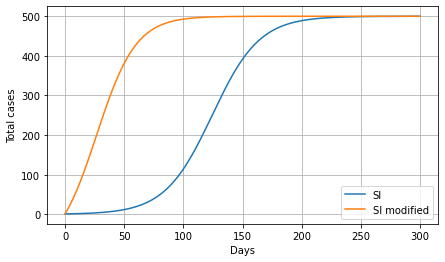

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(301,)
1.0
499.9286874828066


In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
plt.ion()
plt.rcParams['figure.figsize'] = 10, 8

def tsi(y,t,betta,thetta,N,pop,omega):
    Ti=y[0]
    Si=y[1]    
    Ii=y[2]
    SIi=y[3]
    Ni=y[4]
    f0=-omega*Ti
    f1=-betta*Ii*Si/Ni - thetta*Si+omega*Ti              #dS/dt=-betta*I*S/N 
    f2= betta*Ii*Si/Ni + thetta*Si              #dI/dt=betta*I*S/N
    f3= betta*Ii*Si/Ni + thetta*Si
    f4=+omega*Ti
    return [f0,f1,f2,f3,f4]
    
def getTotalInfCurveTSI(betta,thetta,Tmax,height,start,pop,omega):
    T0 = pop
    S0 = height-start
    I0 = start
    SI0 = start
    y0 = [T0, S0, I0, SI0, height]                     # initial condition vector
    t  = np.linspace(0, Tmax-1, Tmax)          # time grid
    soln = odeint(tsi, y0, t, args=(betta,thetta,height,pop,omega),rtol=1e-10)
    T = soln[:, 0]
    S = soln[:, 1]
    I = soln[:, 2]
    SI =soln[:, 3]
    N = soln[:, 4]
    return SI

fig = plt.figure(figsize=(7, 4))
#TSI = getTotalInfCurveTSI(0.1,0.0,301,100001,1,100000,0e-5)
TSI = getTotalInfCurveTSI(0.05,0.00,301,100001*0.005,1,10000000,0e-5)
TSI_M=getTotalInfCurveTSI(0.05,0.01,301,100001*0.005,1,10000000,0e-5)

plt.plot(TSI)
plt.plot(TSI_M)
plt.grid(True)
plt.xlabel("Days")
plt.ylabel("Total cases")
#plt.ylim(0,100000)
plt.legend(("SI","SI modified"))
plt.show()
folder = "owid_graphs/"
fig.savefig(folder+"TSI_M_.eps")
fig.savefig(folder+"TSI_M_.png") 
print(TSI.shape)
np.savetxt("TSI.txt",TSI)
np.savetxt("TSI_Mod.txt",TSI)
print(TSI[0])
print(TSI[-1])

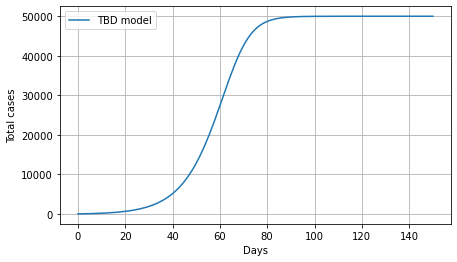

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(151,)
1.0


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
plt.ion()
plt.rcParams['figure.figsize'] = 10, 8

def tbd(y,t,p,q,M,pop,omega):
    Ti=y[0]
    Mi=y[1]
    Ni=y[2]
    f0=-omega*Ti
    f1=-p*(Mi-Ni)-q*(1.0/Mi)*Ni*(Mi-Ni)+omega*Ti
    f2= p*(Mi-Ni)+q*(1.0/Mi)*Ni*(Mi-Ni)            #dNt/dt=p*(M-Nt)+q*(1.0/M)*Nt*(M-Nt)
    return [f0,f1,f2]
    
def getTotalInfCurveTBD(p,q,Tmax,height,start,pop,omega): 
    y0 = [pop,height,start]
    t  = np.linspace(0, Tmax-1, Tmax)  
    soln = odeint(tbd, y0, t, args=(p,q,height,pop,omega),rtol=1e-10)
    return soln[:,2]

fig = plt.figure(figsize=(7, 4))
BD =   getTotalInfCurveTBD(0.0001,0.1,151,100001,1,10000000,0e-5)
plt.plot(BD)
plt.grid(True)
plt.xlabel("Days")
plt.ylabel("Total cases")
#plt.ylim(0,100000)
plt.legend(("TBD model",""))
plt.show()
folder = "owid_graphs/"
fig.savefig(folder+"TBD_M_.eps")
fig.savefig(folder+"TBD_M_.png") 
print(BD.shape)
np.savetxt("TBD.txt",BD)
print(BD[0])

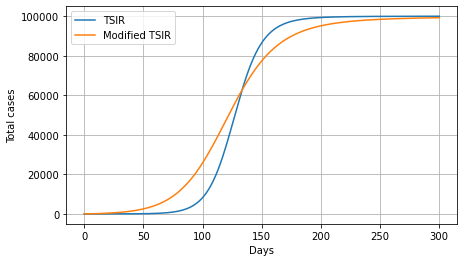

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(301,)
1.0
99972.32518833817


In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
plt.ion()
plt.rcParams['figure.figsize'] = 10, 8

def tsir(y,t,betta,gamma,thetta,N,pop,omega):
    Ti= y[0] 
    Si= y[1]    
    Ii= y[2]
    Ri= y[3]    
    SIi=y[4]
    Ni= y[5]
    f0=-Ti*omega
    f1=-betta*Ii*Si/Ni - thetta*Si + omega*Ti    #dS/dt=-betta*I*S/N 
    f2= betta*Ii*Si/Ni + thetta*Si - gamma*Ii    #dI/dt=betta*I*S/N-gamma*I
    f3= gamma*Ii                                #dR/dt=gamma*I    
    f4= betta*Ii*Si/Ni + thetta*Si 
    f5= Ti*omega 
    return [f0,f1,f2,f3,f4,f5]
    
def getTotalInfCurveTSIR(betta,gamma,thetta,Tmax,height,start,pop,omega):
    T0 = pop
    S0 = height-start
    I0 = start
    R0 = 0
    SI0 = start
    y0 = [T0, S0, I0, R0, SI0, height]                     # initial condition vector
    t  = np.linspace(0, Tmax-1, Tmax)              # time grid
    soln = odeint(tsir, y0, t, args=(betta,gamma,thetta,height,pop,omega),rtol=1e-10)
    T = soln[:, 0]
    S = soln[:, 1]
    I = soln[:, 2]
    R = soln[:, 3]
    SI =soln[:, 4]
    N =soln[:, 5]
    return SI

fig = plt.figure(figsize=(7, 4))
SI = getTotalInfCurveTSIR(0.1,0.01,0,301,100001,1,10000000,0e-5)
SI_M=getTotalInfCurveTSIR(0.06,0.01,0.0001,301,100001,1,10000000,0e-5)
plt.plot(SI)
plt.plot(SI_M)
plt.grid(True)
plt.xlabel("Days")
plt.ylabel("Total cases")
#plt.ylim(0,100000)
plt.legend(("TSIR","Modified TSIR"))
plt.show()
folder = "owid_graphs/"
fig.savefig(folder+"TSIR_M_.eps")
fig.savefig(folder+"TSIR_M_.png") 
print(SI.shape)
np.savetxt("TSIR.txt",SI)
np.savetxt("TSIR_Mod.txt",SI_M)
print(SI[0])
print(SI[-1])

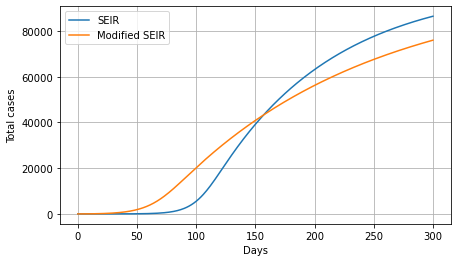

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(301,)


In [244]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
plt.ion()
plt.rcParams['figure.figsize'] = 10, 8

def tseir(y,t,alpha,betta,sigma,gamma,thetta,N,pop,omega):
    Ti= y[0]
    Si= y[1]
    Ei= y[2]
    Ii= y[3]
    Ri= y[4]
    SIi=y[5]
    Ni= y[6]
    
    f0=-Ti*omega
    f1=-betta*Ii*Si/Ni-alpha*Si*Ei/Ni - thetta*Si + Ti*omega        #dS/dt=-betta*I*S 
    f2= betta*Ii*Si/Ni+alpha*Si*Ei/Ni + thetta*Si - sigma*Ei        #dE/dt=betta*I*S-sigma*E
    f3=-gamma*Ii+sigma*Ei                                           #dI/dt=sigma*E-gamma*I
    f4= gamma*Ii                                                    #dR/dt=gamma*I
    f5=+sigma*Ei
    f6= Ti*omega 
    
    return [f0,f1,f2,f3,f4,f5,f6]  
    
def getTotalInfCurveTSEIR(alpha,betta,sigma,gamma,thetta,Tmax,height,start,pop,omega):
    T0 = pop
    S0 = height-start
    E0 = 0
    I0 = start
    R0 = 0
    SI0 = start
    y0 = [T0, S0, E0, I0, R0, SI0, height]      # initial condition vector
    t  = np.linspace(0, Tmax-1, Tmax)           # time grid

    soln = odeint(tseir, y0, t, args=(alpha,betta,sigma,gamma,thetta,height,pop,omega),rtol=1e-10)
    T = soln[:, 0]
    S = soln[:, 1]
    E = soln[:, 2]
    I = soln[:, 3]
    R = soln[:, 4]
    SI= soln[:, 5]
    N = soln[:, 6]
    
    return SI

fig = plt.figure(figsize=(7, 4))
SI =   getTotalInfCurveTSEIR(0.0,1.0,0.01, 0.0005,0.00, 301,100001,1,100000,0.00000)
SI_M = getTotalInfCurveTSEIR(0.0,1.0,0.006,0.0005,0.001,301,100001,1,100000,0.00000)
plt.plot(SI)
plt.plot(SI_M)
plt.grid(True)
plt.xlabel("Days")
plt.ylabel("Total cases")
#plt.ylim(0,100000)
plt.legend(("SEIR","Modified SEIR"))
plt.show()
folder = "owid_graphs/"
fig.savefig(folder+"TSEIR_M_.eps")
fig.savefig(folder+"TSEIR_M_.png") 
fig.savefig(folder+"TSEIR_M_.svg") 
print(SI.shape)
np.savetxt("TSEIR.txt",SI)
np.savetxt("TSEIR_Mod.txt",SI_M)

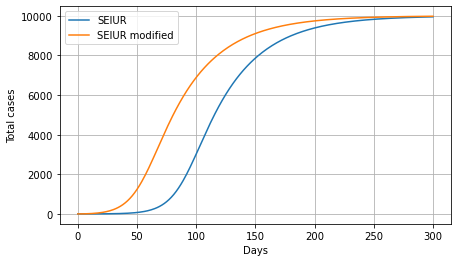

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(301,)


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
plt.ion()
plt.rcParams['figure.figsize'] = 10, 8

def tseiar(y,t,alpha,betta,sigma,gamma,thetta,N,pop,omega,kappa,mu):
    Ti= y[0]
    Si= y[1]
    Ei= y[2]
    Ii= y[3]
    Ai= y[4]
    Ri= y[5]
    SIi=y[6]
    SAi=y[7]
    Ni= y[8]
    
    f0=-Ti*omega
    f1=-betta*Ii*Si/Ni - mu*betta*Ai*Si/Ni - alpha*Si*Ei/Ni - thetta*Si + Ti*omega        #dS/dt=-betta*I*S-mu*betta*U*S
    f2= betta*Ii*Si/Ni + mu*betta*Ai*Si/Ni + alpha*Si*Ei/Ni + thetta*Si - sigma*Ei        #dE/dt= betta*I*S+mu*betta*U*S-sigma*E
    f3=-gamma*Ii+kappa*sigma*Ei                                                           #dI/dt=-gamma*I+alpha*sigma*E
    f4=-gamma*Ai+(1.0-kappa)*sigma*Ei                                                     #dA/dt=-gamma*U+(1-alpha)*sigma*E
    f5= gamma*(Ii+Ai)                                                                     #dR/dt= gamma*(I+U)
    f6=+kappa*sigma*Ei                                                                    
    f7=+(1.0-kappa)*sigma*Ei
    f8= Ti*omega 
    
    return [f0,f1,f2,f3,f4,f5,f6,f7,f8]  
    
def getTotalInfCurveTSEIAR(alpha,betta,sigma,gamma,thetta,Tmax,height,start,pop,omega,kappa,mu):
    T0 = pop
    S0 = height-start
    E0 = 0
    I0 = start
    A0 = start/kappa
    R0 = 0
    SI0 = start
    SA0 = 0
    y0 = [T0, S0, E0, I0, A0, R0, SI0, SA0, height]      # initial condition vector
    t  = np.linspace(0, Tmax-1, Tmax)           # time grid

    soln = odeint(tseiar, y0, t, args=(alpha,betta,sigma,gamma,thetta,height,pop,omega,kappa,mu),rtol=1e-10)
    T = soln[:, 0]
    S = soln[:, 1]
    E = soln[:, 2]
    I = soln[:, 3]
    A = soln[:, 4]
    R = soln[:, 5]
    SI= soln[:, 6]
    SA= soln[:, 7]
    N = soln[:, 8]
    
    return SI

def getTotalInfCurveTSEIAR_g(alpha,betta,sigma,gamma,thetta,Tmax,height,start,pop,omega,kappa,mu):
    T0 = pop
    S0 = height-start
    E0 = 0
    I0 = start
    A0 = start/kappa
    R0 = 0
    SI0 = start
    SA0 = 0
    y0 = [T0, S0, E0, I0, A0, R0, SI0, SA0, height]      # initial condition vector
    t  = np.linspace(0, Tmax-1, Tmax)           # time grid

    soln = odeint(tseiar, y0, t, args=(alpha,betta,sigma,gamma,thetta,height,pop,omega,kappa,mu),rtol=1e-10)
    T = soln[:, 0]
    S = soln[:, 1]
    E = soln[:, 2]
    I = soln[:, 3]
    A = soln[:, 4]
    R = soln[:, 5]
    SI= soln[:, 6]
    SA= soln[:, 7]
    N = soln[:, 8]
    
    return SI,SA

fig = plt.figure(figsize=(7, 4))
TSEAIR_,TSEAIR_2 =   getTotalInfCurveTSEIAR_g(0.0,2.0,0.025,0.07,0.000,301,100000,1,100000,0.0,0.1,0.3)
TSEAIR_M,TSEAIR_M2 = getTotalInfCurveTSEIAR_g(0.0,2.0,0.025,0.07,0.001,301,100000,1,100000,0.0,0.1,0.3)
#TSEAIR_M =  getTotalInfCurveTSEIAR_g(0.01,1.0,0.01,0.0005,0.000,301,100000-1,1,100000,0.0,0.1,0.91)
plt.plot(TSEAIR_)
#plt.plot(TSEAIR_2)
plt.plot(TSEAIR_M)
plt.grid(True)
plt.xlabel("Days")
plt.ylabel("Total cases")
#plt.ylim(0,100000)
#plt.legend(("Infected","Unreported infected"))
plt.legend(("SEIUR","SEIUR modified"))
plt.show()
folder = "owid_graphs/"
fig.savefig(folder+"TSEIAR_M_.eps")
fig.savefig(folder+"TSEIAR_M_.png") 
print(SI.shape)
np.savetxt("TSEIAR.txt",SI)
np.savetxt("TSEIAR_Mod.txt",SI_M)

In [24]:
def GetDEFitPRS_TSI(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr):
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 4
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and       
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    #Cases2 = np.zeros(TrainSize*2)
    #arr = Cases1[minStart:minStart+TrainSize]
    #reversed_arr = arr[::-1]
    #Cases2[:TrainSize] = Cases1[minStart:minStart+TrainSize]
    #Cases2[TrainSize:] = 2*Cases1[minStart+TrainSize]-reversed_arr
    #plt.plot(Cases2)
    #plt.show()
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        tempy = getTotalInfCurveTSI(Pop[i,0],
                                    Pop[i,1],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    #Cases2.shape[0],
                                    Pop[i,3]*CPopSize,
                                    Cases1[minStart],
                                    #Cases2[0],
                                    CPopSize,
                                    Pop[i,2])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #Fit[i] = RMSE(Cases2,tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSI(xnew[0],
                                        xnew[1],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        #Cases2.shape[0],
                                        xnew[3]*CPopSize,
                                        Cases1[minStart],
                                        #Cases2[0],
                                        CPopSize,
                                        xnew[2])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            #tempfit = RMSE(Cases2,tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize#,Cases2

In [25]:
def GetDEFitPRS_TSI_FineTune(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr,PRS_noGamma):
    print("FINETUNE")
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 4
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and       
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    #Cases2 = np.zeros(TrainSize*2)
    #arr = Cases1[minStart:minStart+TrainSize]
    #reversed_arr = arr[::-1]
    #Cases2[:TrainSize] = Cases1[minStart:minStart+TrainSize]
    #Cases2[TrainSize:] = 2*Cases1[minStart+TrainSize]-reversed_arr
    #plt.plot(Cases2)
    #plt.show()
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        if(i == 0):
            for j in range(D):
                Pop[i][j] = PRS_noGamma[j]
            print(Pop[i])
        tempy = getTotalInfCurveTSI(Pop[i,0],
                                    Pop[i,1],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    #Cases2.shape[0],
                                    Pop[i,3]*CPopSize,
                                    Cases1[minStart],
                                    #Cases2[0],
                                    CPopSize,
                                    Pop[i,2])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #Fit[i] = RMSE(Cases2,tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSI(xnew[0],
                                        xnew[1],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        #Cases2.shape[0],
                                        xnew[3]*CPopSize,
                                        Cases1[minStart],
                                        #Cases2[0],
                                        CPopSize,
                                        xnew[2])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            #tempfit = RMSE(Cases2,tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize#,Cases2

(189,) 150
minStart 18
TrainSize 170
13.0 minstart init inf
[0.09478324 0.         0.         0.00093457] 0.0017524026558725211 Afghanistan AFG
0.9435744978923851


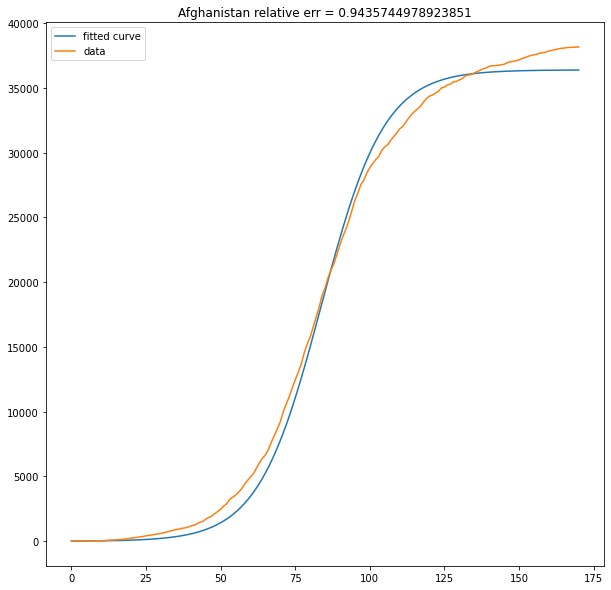

(207,) 150
minStart 14
TrainSize 192
26.0 minstart init inf
[0.07348829 0.         0.         0.01455716] 0.004696927914645157 Armenia ARM
1.0627232438804546


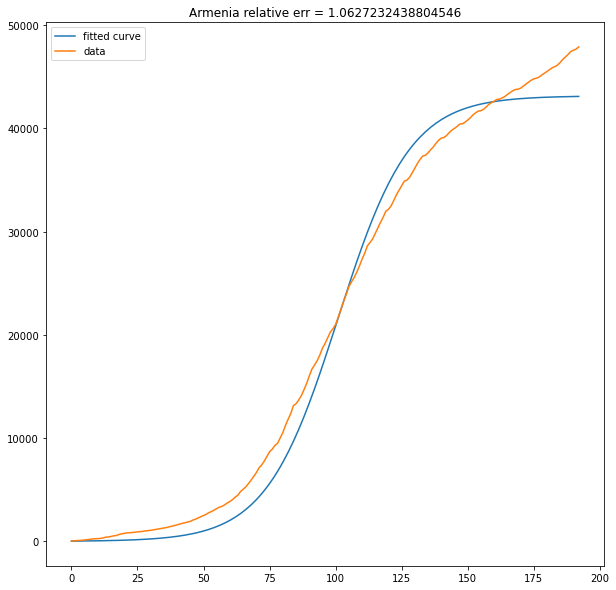

(116,) 150
minStart 6
TrainSize 109
12.0 minstart init inf
[0.1124157  0.         0.         0.00028117] 0.009425416446975615 Australia AUS
1.2158795701666745


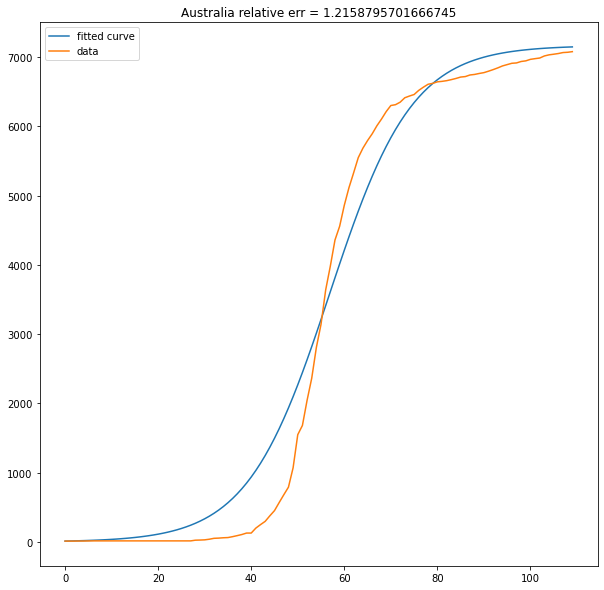

(129,) 150
minStart 6
TrainSize 122
18.0 minstart init inf
[0.25160277 0.         0.         0.00179064] 0.005116123312220097 Austria AUT
0.248230892263274


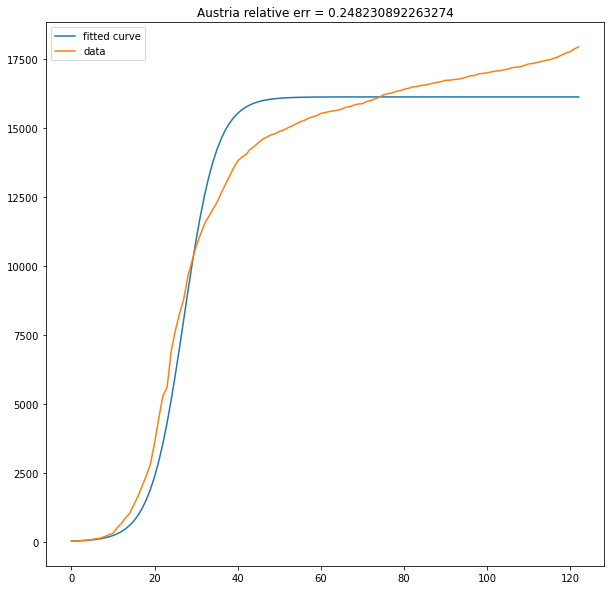

(223,) 150
minStart 14
TrainSize 208
23.0 minstart init inf
[0.06738982 0.         0.         0.0037423 ] 0.003153007880371395 Azerbaijan AZE
1.0840449701271027


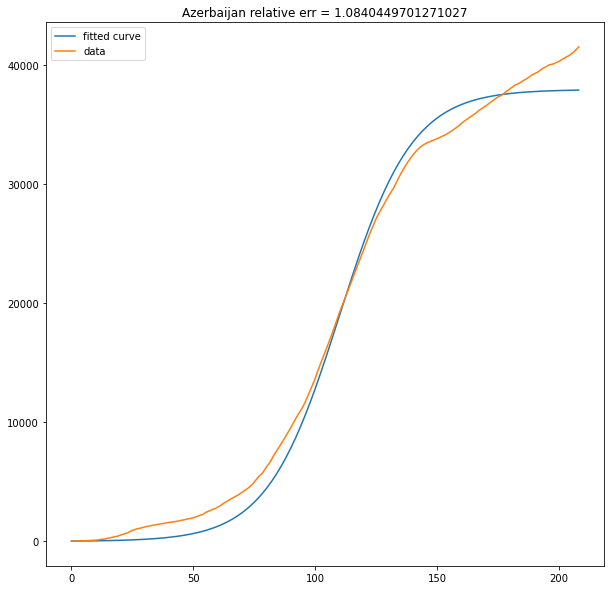

(210,) 150
minStart 15
TrainSize 194
27.0 minstart init inf
[0.11151103 0.         0.         0.00714236] 0.009928977859547043 Belarus BLR
0.4850526146776879


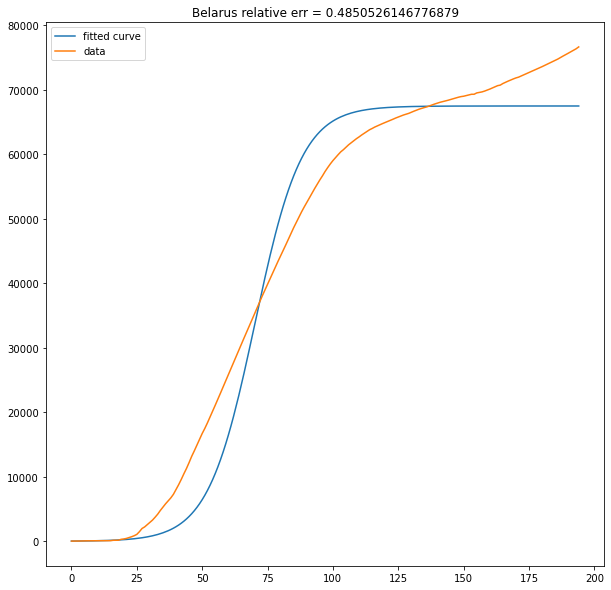

(171,) 150
minStart 29
TrainSize 141
23.0 minstart init inf
[0.19535186 0.         0.         0.00500344] 0.009275166831530155 Belgium BEL
0.332782696382381


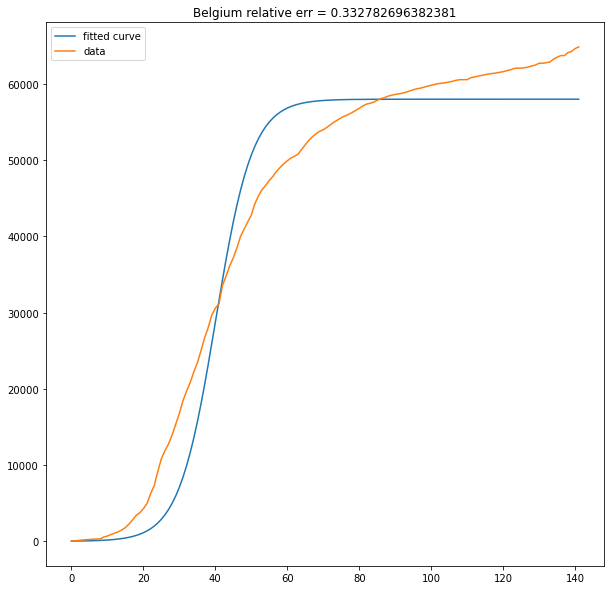

(280,) 150
minStart 5
TrainSize 274
11.0 minstart init inf
[0.07127104 0.         0.         0.01178966] 0.006226275353566274 Bolivia BOL
0.866091171724458


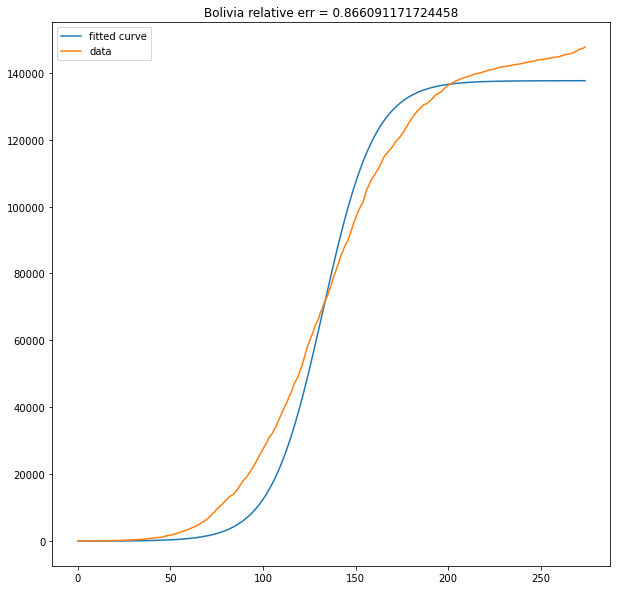

(94,) 150
minStart 8
TrainSize 85
20.0 minstart init inf
[1.61875066e-01 0.00000000e+00 0.00000000e+00 3.74841733e-05] 0.013528485713026284 Burkina Faso BFA
0.2551772780953804


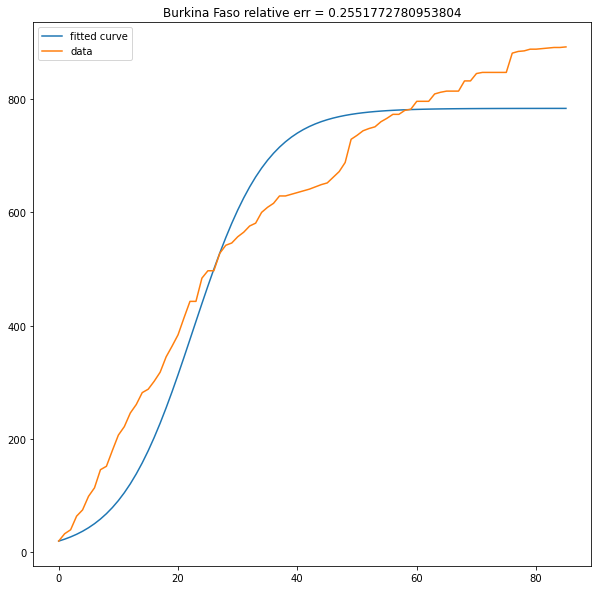

(196,) 150
minStart 52
TrainSize 143
37.0 minstart init inf
[2.00262576e-02 0.00000000e+00 0.00000000e+00 1.84986759e-05] 0.06624076909162824 Cambodia KHM
0.38110774592789337


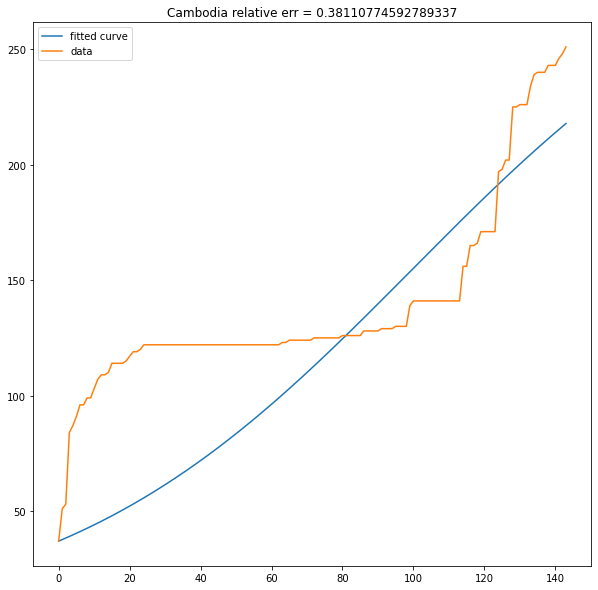

(213,) 150
minStart 13
TrainSize 199
13.0 minstart init inf
[0.0820931 0.        0.        0.0007084] 0.010156510350535237 Cameroon CMR
0.6970781835096057


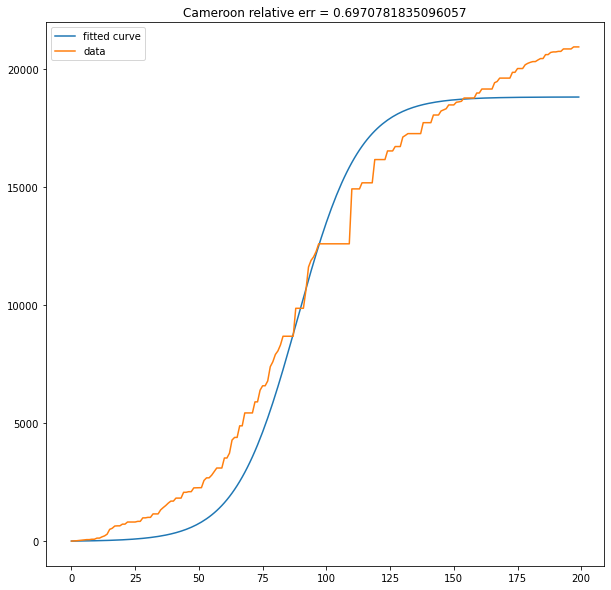

(218,) 150
minStart 36
TrainSize 181
27.0 minstart init inf
[0.13570647 0.         0.         0.00288508] 0.01754099010525759 Canada CAN
0.4267531717472512


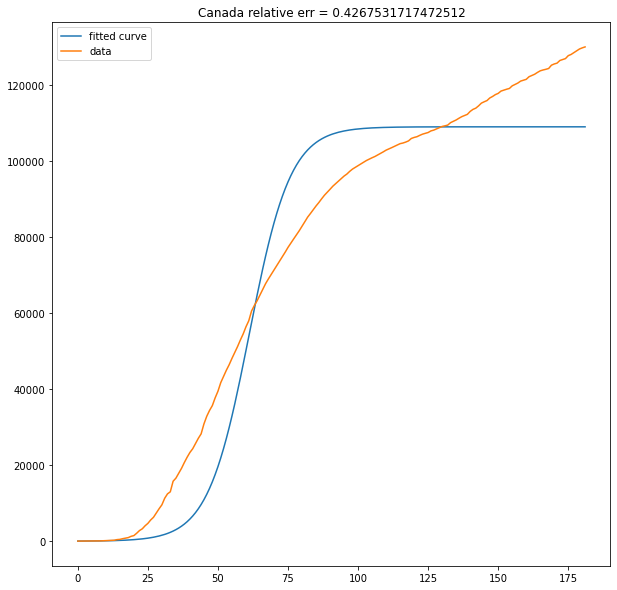

(293,) 150
minStart 9
TrainSize 283
10.0 minstart init inf
[0.09588783 0.         0.         0.0238118 ] 0.024944566827354322 Chile CHL
0.5813003944642836


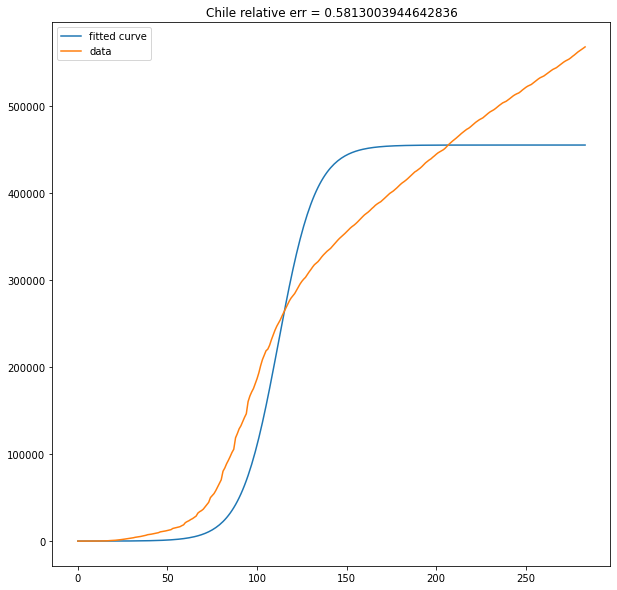

(275,) 150
minStart 5
TrainSize 269
13.0 minstart init inf
[0.04754386 0.         0.         0.02591765] 0.006093508038238673 Costa Rica CRI
2.8671434355286896


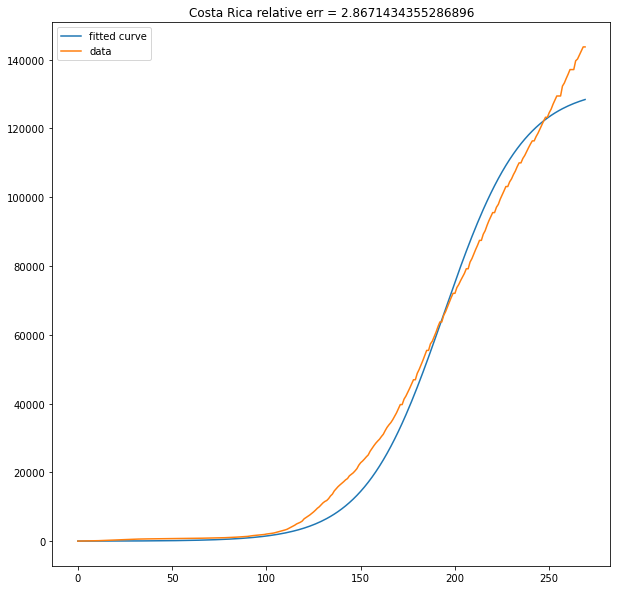

(287,) 150
minStart 10
TrainSize 276
14.0 minstart init inf
[0.06936492 0.         0.         0.00075564] 0.0054315036730251814 Cote d'Ivoire CIV
0.531779740669168


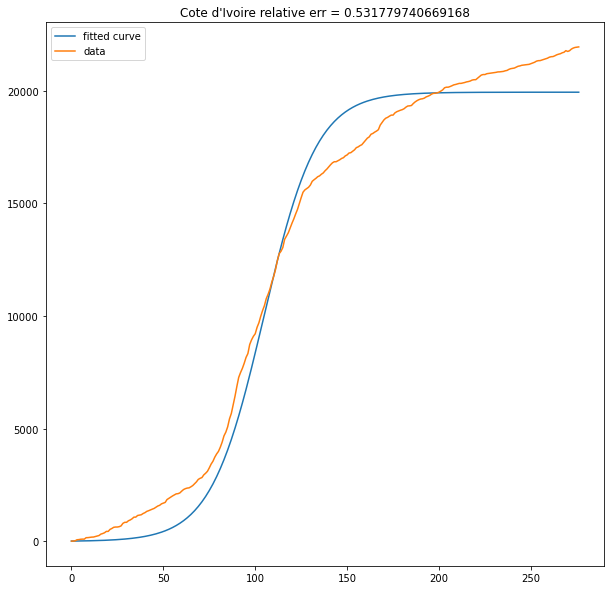

(91,) 150
minStart 17
TrainSize 73
32.0 minstart init inf
[0.18888288 0.         0.         0.00051595] 0.004208993038924025 Croatia HRV
0.3557274164523719


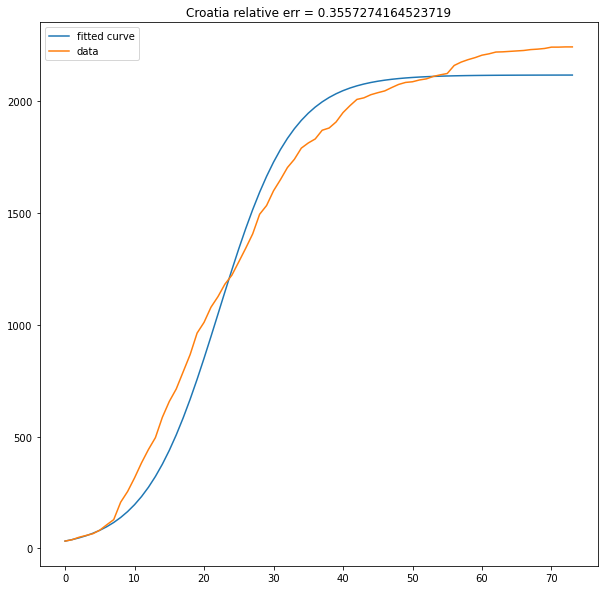

(85,) 150
minStart 9
TrainSize 75
21.0 minstart init inf
[0.15865042 0.         0.         0.00016768] 0.004751935906433324 Cuba CUB
0.5175055743367092


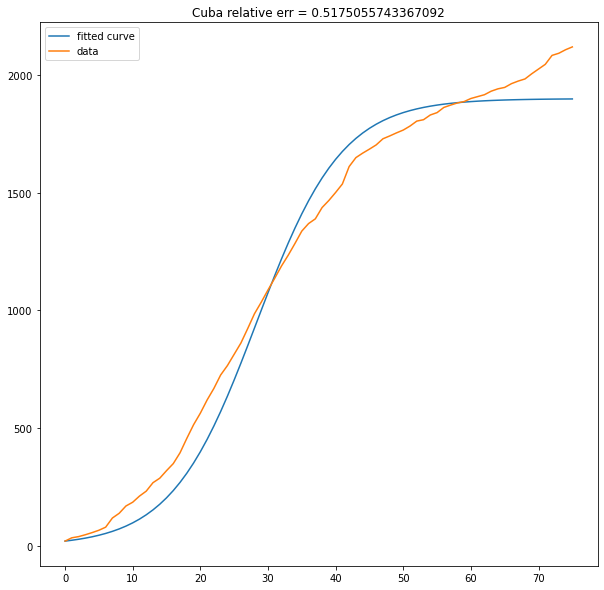

(117,) 150
minStart 9
TrainSize 107
18.0 minstart init inf
[0.19990418 0.         0.         0.00080936] 0.015026550503260828 Czechia CZE
0.3387960299083624


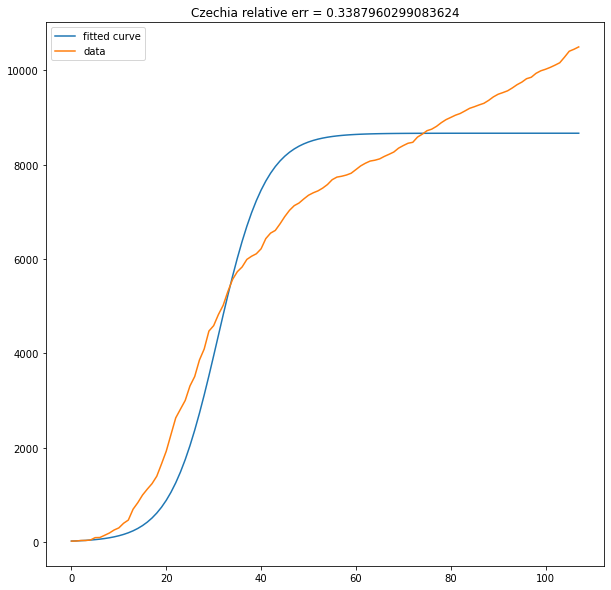

(234,) 150
minStart 10
TrainSize 223
23.0 minstart init inf
[0.06859142 0.         0.         0.00011451] 0.003973070990932743 Democratic Republic of Congo COD
0.5956744949616309


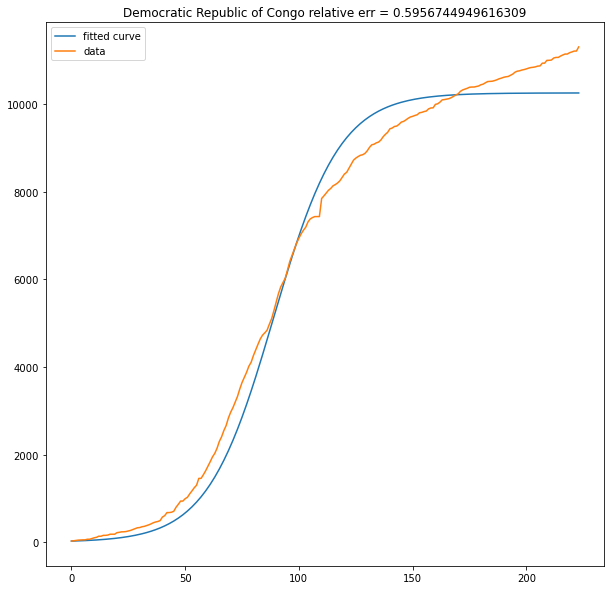

(277,) 150
minStart 23
TrainSize 253
49.0 minstart init inf
[0.07415282 0.         0.         0.0009964 ] 0.0021588562745820917 Egypt EGY
0.6334601376071101


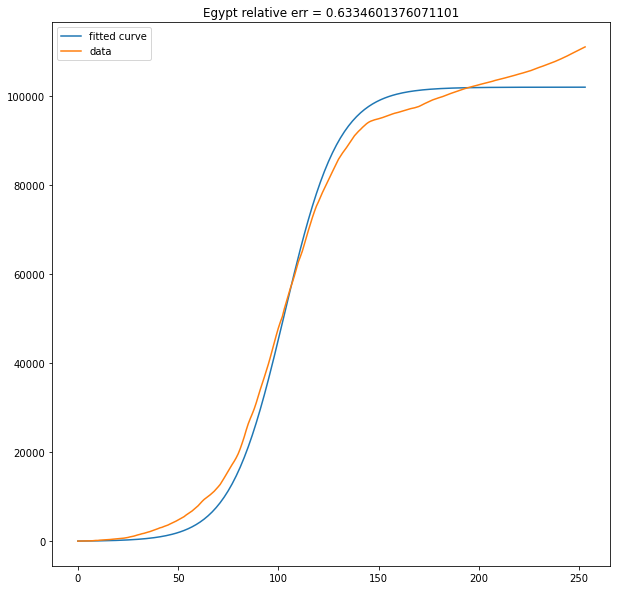

(209,) 150
minStart 8
TrainSize 200
13.0 minstart init inf
[0.06470802 0.         0.         0.00439339] 0.0033527071331619163 El Salvador SLV
1.4792249288618244


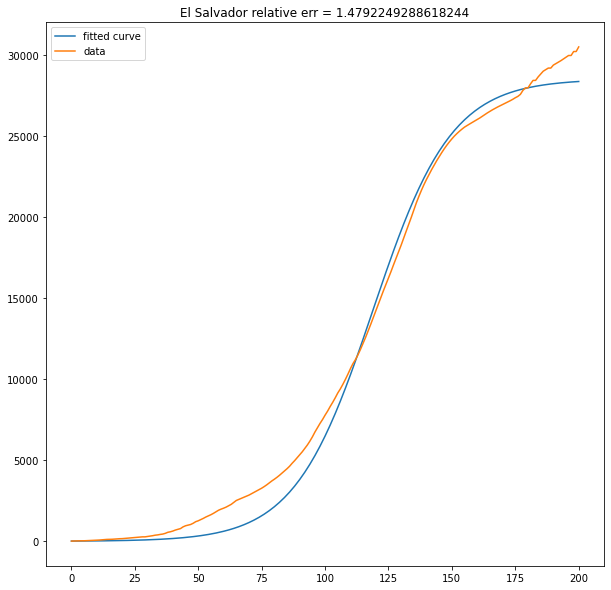

(114,) 150
minStart 12
TrainSize 101
10.0 minstart init inf
[0.1962494  0.         0.         0.00133595] 0.00794165938474791 Estonia EST
0.2749246576334759


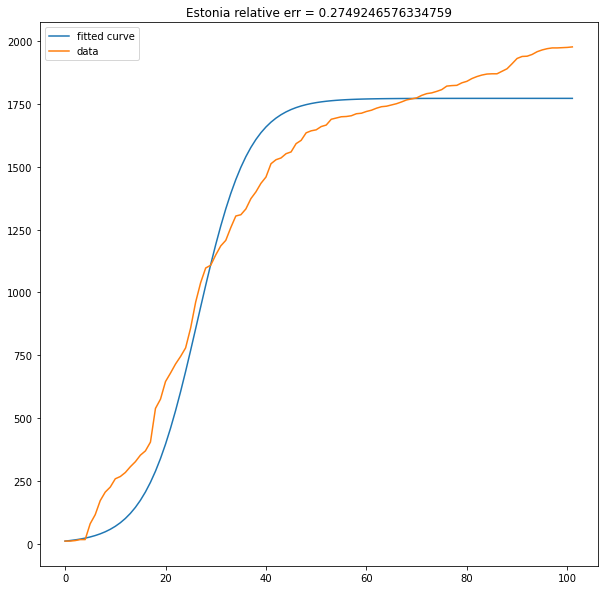

(161,) 150
minStart 38
TrainSize 122
15.0 minstart init inf
[0.14763044 0.         0.         0.00121463] 0.011075725212398994 Finland FIN
0.4067720400764932


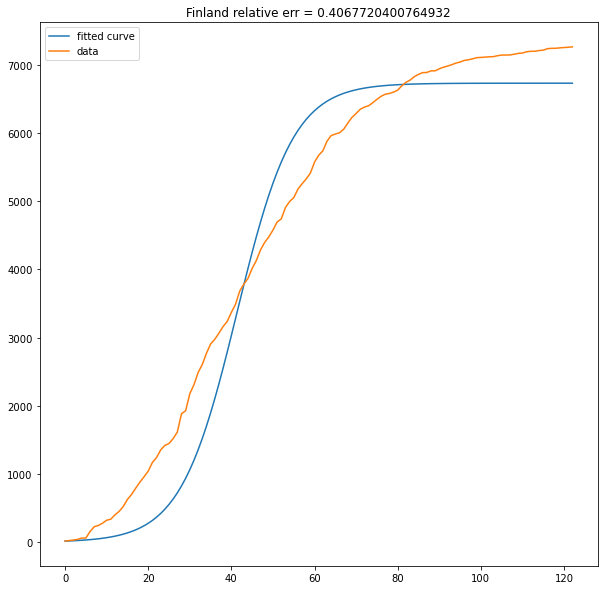

(118,) 150
minStart 35
TrainSize 82
57.0 minstart init inf
[0.19035958 0.         0.         0.00259648] 0.011100705944569685 France FRA
1.0057220711677526


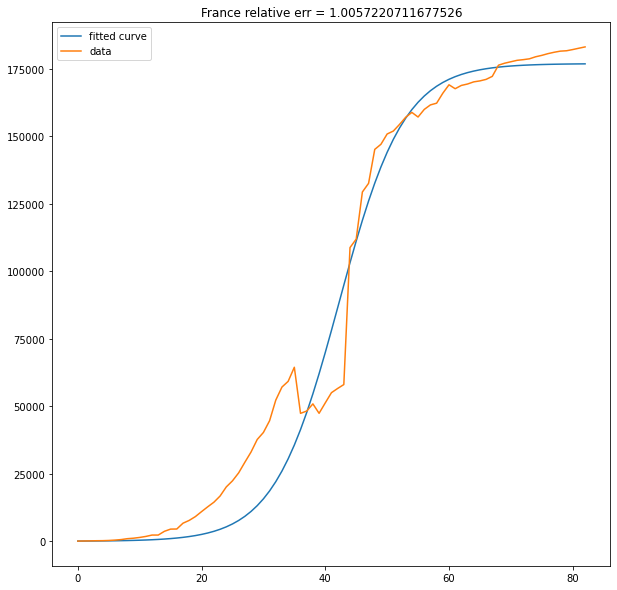

(189,) 150
minStart 7
TrainSize 181
12.0 minstart init inf
[0.1542214  0.         0.         0.00222421] 0.006120436985809173 Germany DEU
0.49885081054482094


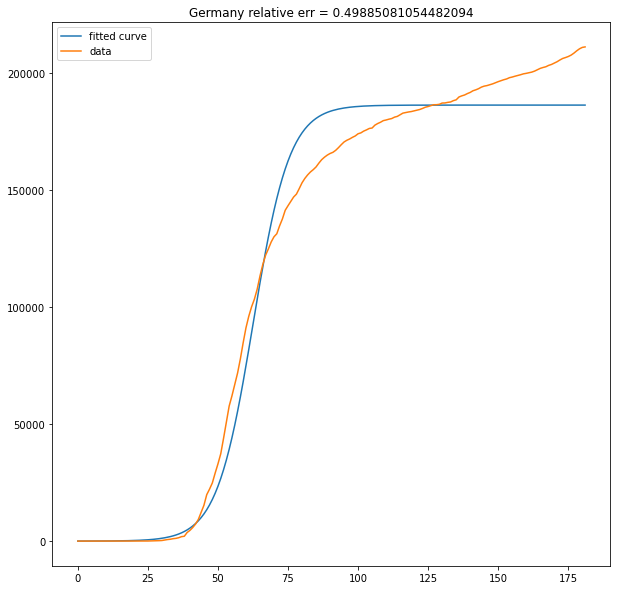

(110,) 150
minStart 14
TrainSize 95
46.0 minstart init inf
[0.15546632 0.         0.         0.00026405] 0.005276497018821784 Greece GRC
0.3009192833730514


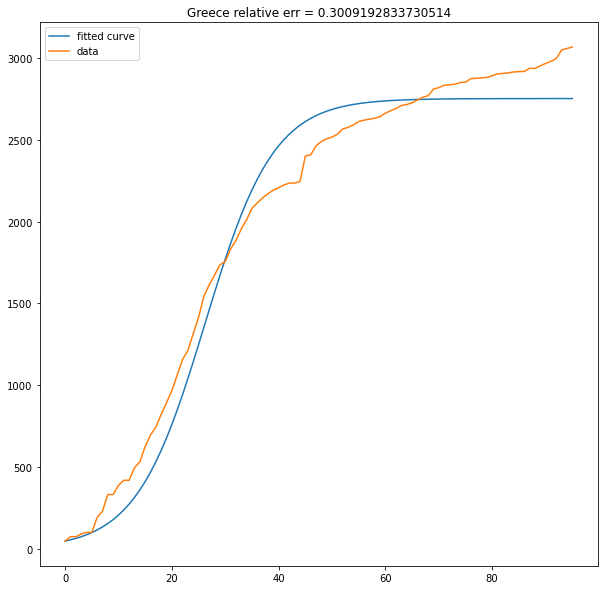

(226,) 150
minStart 12
TrainSize 213
15.0 minstart init inf
[0.08052653 0.         0.         0.00072813] 0.004391919455793681 Haiti HTI
0.5473707161259179


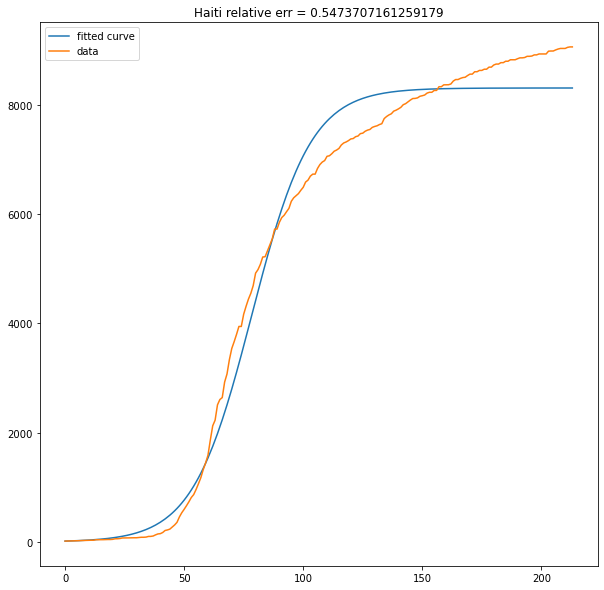

(156,) 150
minStart 6
TrainSize 149
9.0 minstart init inf
[0.14204553 0.         0.         0.00041991] 0.007942131569500351 Hungary HUN
0.3329446322448554


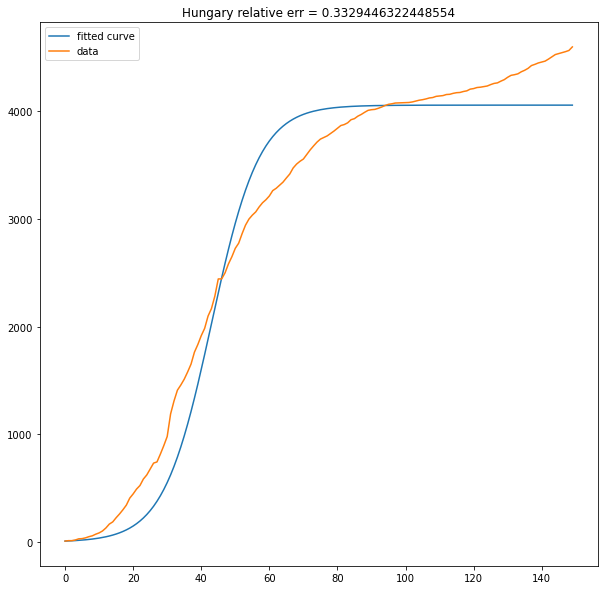

(407,) 150
minStart 36
TrainSize 370
31.0 minstart init inf
[0.06519195 0.         0.         0.00724694] 0.013845872114322259 India IND
1.0258365802135165


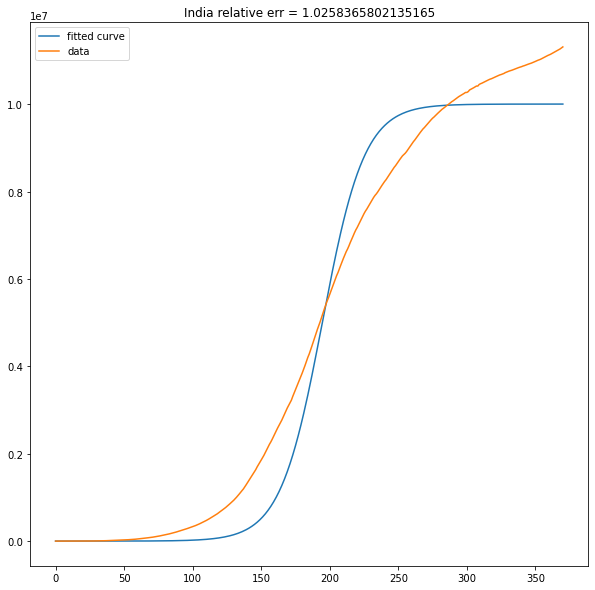

(351,) 150
minStart 7
TrainSize 343
26.0 minstart init inf
[0.05129433 0.         0.         0.01415728] 0.010989377308674478 Iraq IRQ
1.2640728410058806


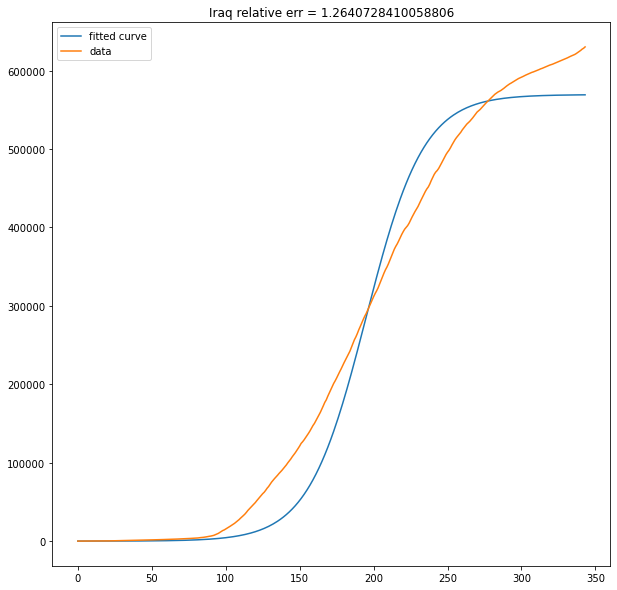

(104,) 150
minStart 12
TrainSize 91
19.0 minstart init inf
[0.18624132 0.         0.         0.00480305] 0.004823993095368516 Ireland IRL
0.6579308861534165


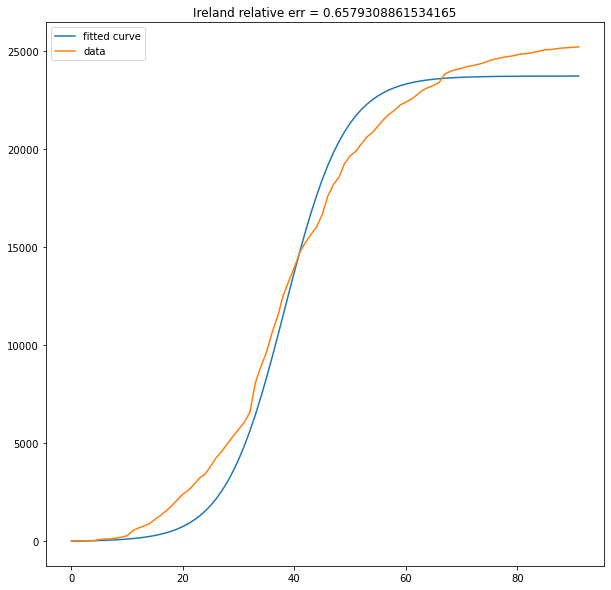

(93,) 150
minStart 13
TrainSize 79
15.0 minstart init inf
[0.21914048 0.         0.         0.00181468] 0.005669487519715694 Israel ISR
0.6225884859376395


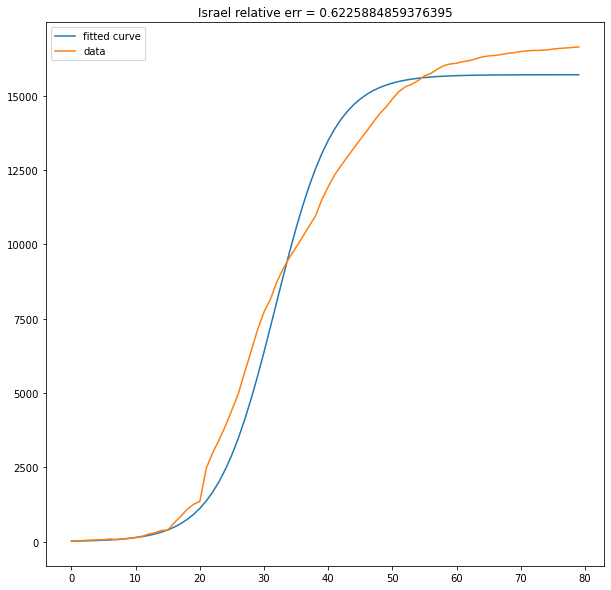

(202,) 150
minStart 23
TrainSize 178
155.0 minstart init inf
[0.17634377 0.         0.         0.00384633] 0.008672580440688154 Italy ITA
0.24611849599819477


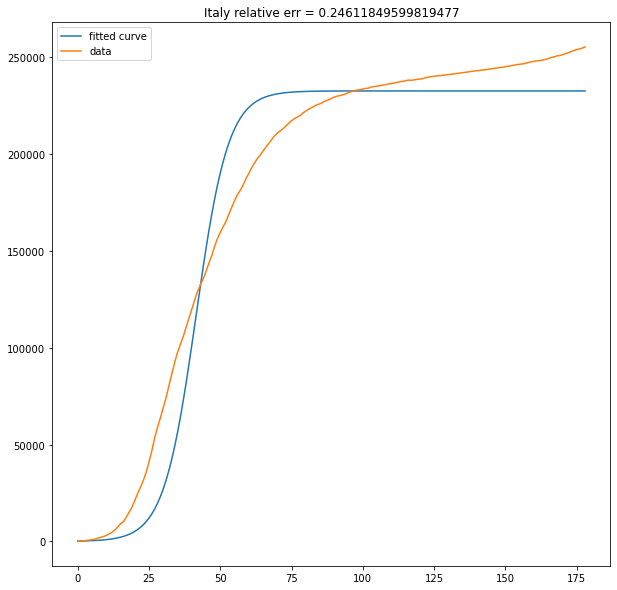

(160,) 150
minStart 10
TrainSize 149
20.0 minstart init inf
[0.09091999 0.         0.         0.00013834] 0.0018996620991931607 Japan JPN
1.0387319289626753


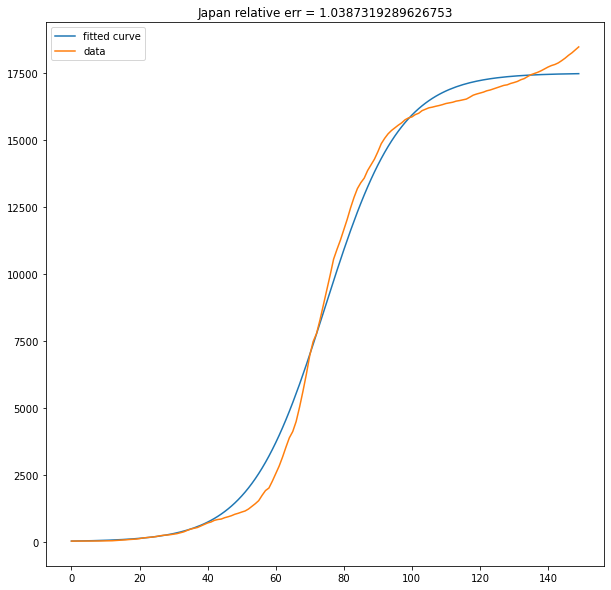

(121,) 150
minStart 15
TrainSize 105
10.0 minstart init inf
[0.16640572 0.         0.         0.00053003] 0.014478868273857429 Latvia LVA
0.26733628480073923


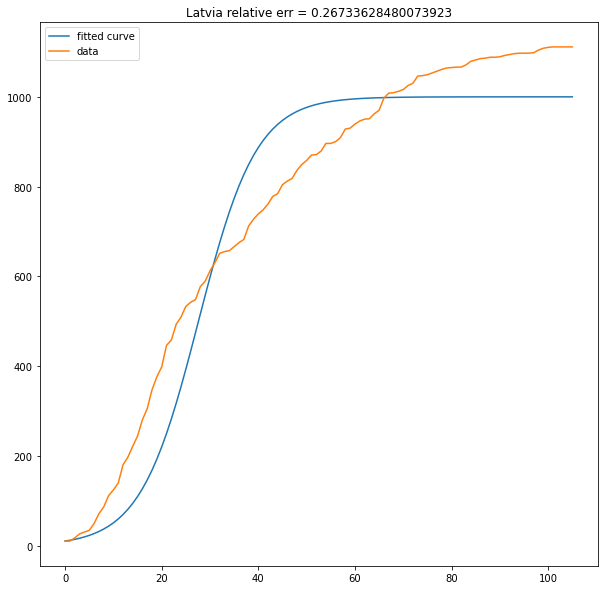

(398,) 150
minStart 11
TrainSize 386
13.0 minstart init inf
[0.03405319 0.         0.         0.06332188] 0.010625458132124479 Lebanon LBN
4.222692356743787


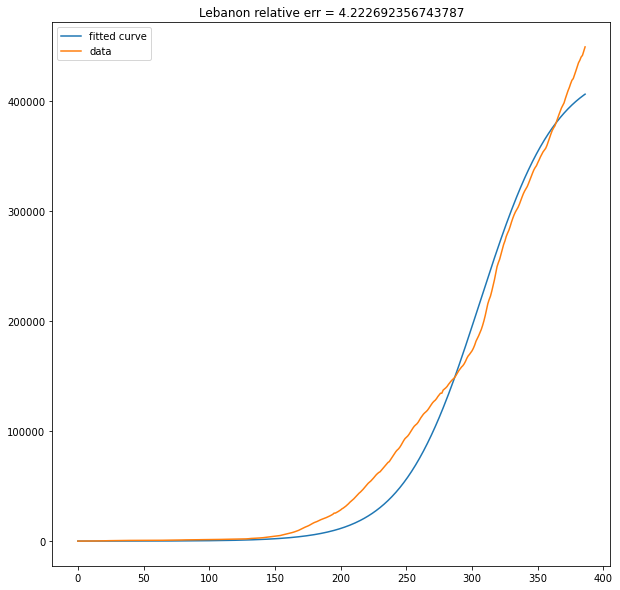

(173,) 150
minStart 21
TrainSize 151
14.0 minstart init inf
[0.05820147 0.         0.         0.00026136] 0.0032271523396969195 Liberia LBR
0.9726038375963946


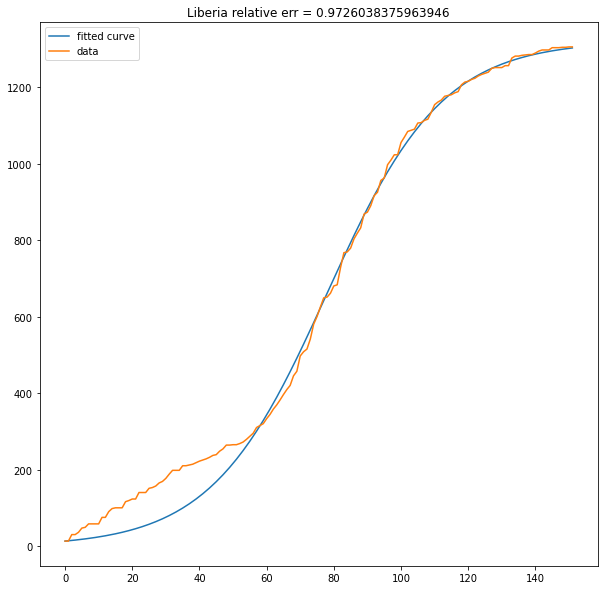

(141,) 150
minStart 18
TrainSize 122
19.0 minstart init inf
[0.17346054 0.         0.         0.00061193] 0.01292058732550469 Lithuania LTU
0.19184450218022445


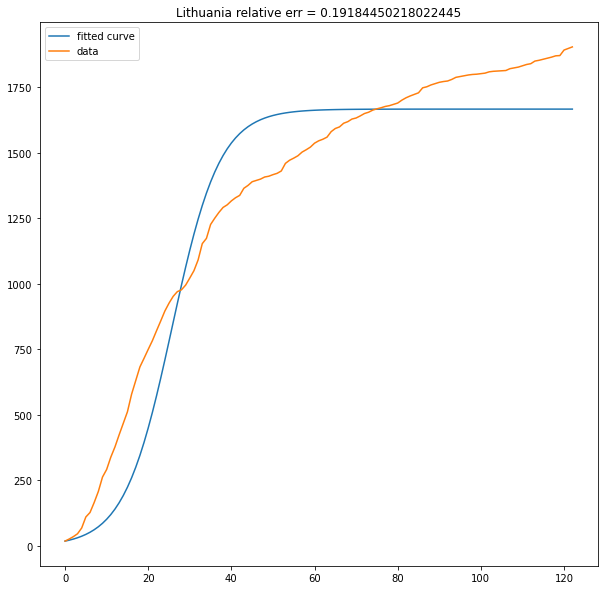

(165,) 150
minStart 4
TrainSize 160
18.0 minstart init inf
[0.07815815 0.         0.         0.00012666] 0.006291216148456134 Mali MLI
0.5428548235446894


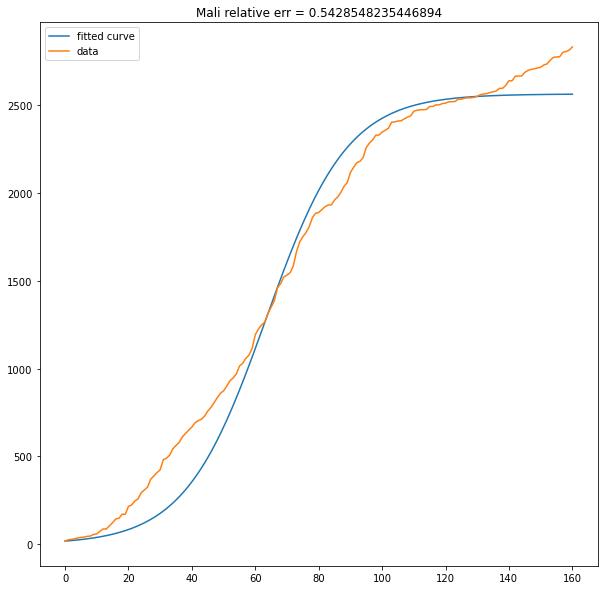

(207,) 150
minStart 62
TrainSize 144
29.0 minstart init inf
[0.13073986 0.         0.         0.00147258] 0.006525253045273679 Mauritania MRT
0.3364404224355637


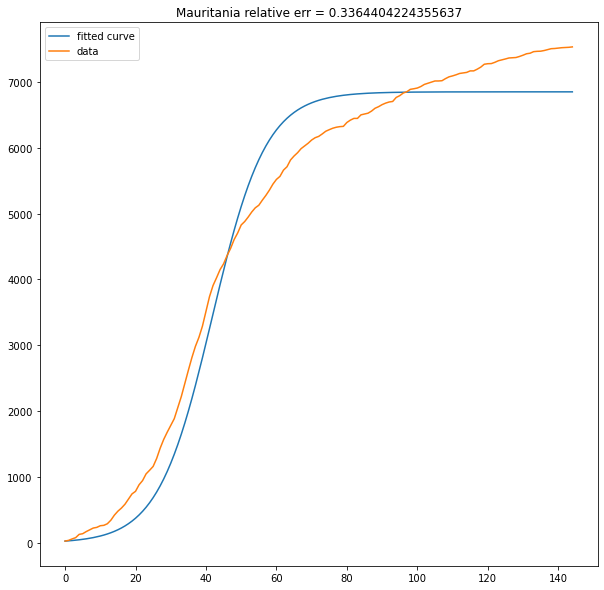

(227,) 150
minStart 4
TrainSize 222
28.0 minstart init inf
[0.21998244 0.         0.         0.00027816] 0.005590855364395364 Mauritius MUS
0.04164287187085138


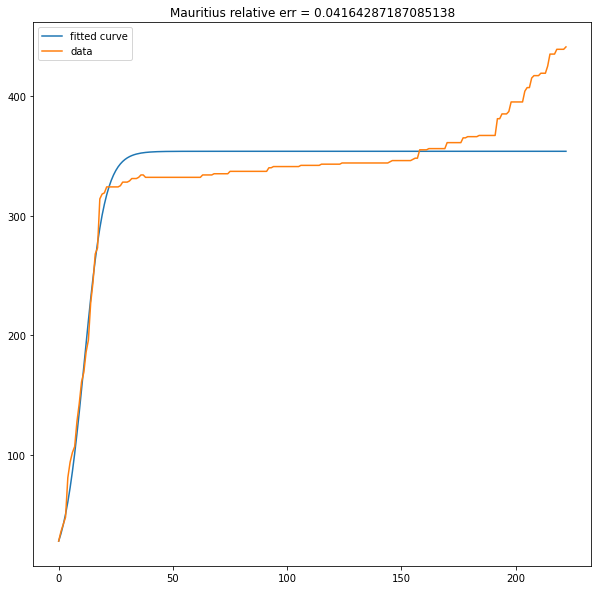

(155,) 150
minStart 7
TrainSize 147
18.0 minstart init inf
[0.19369402 0.         0.         0.00275428] 0.010964343074724879 Netherlands NLD
0.31627214495993766


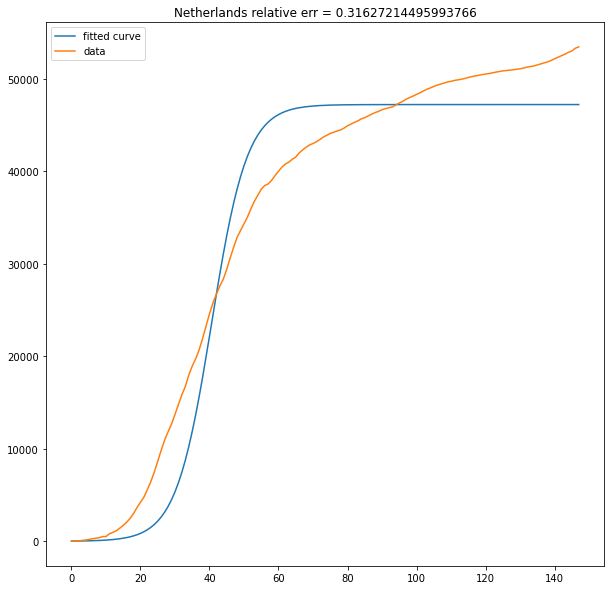

(75,) 150
minStart 20
TrainSize 54
28.0 minstart init inf
[0.29351608 0.         0.         0.00030108] 0.001769344014522306 New Zealand NZL
0.2682073183476168


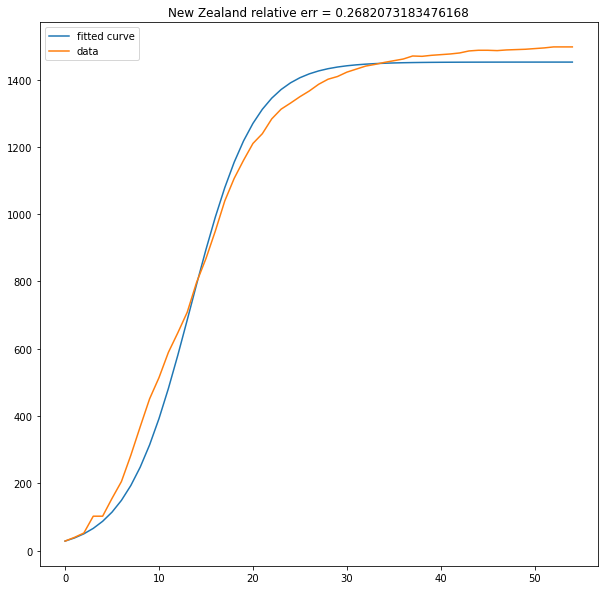

(136,) 150
minStart 7
TrainSize 128
19.0 minstart init inf
[0.20831715 0.         0.         0.00150848] 0.007739200468003189 Norway NOR
0.23476144772677335


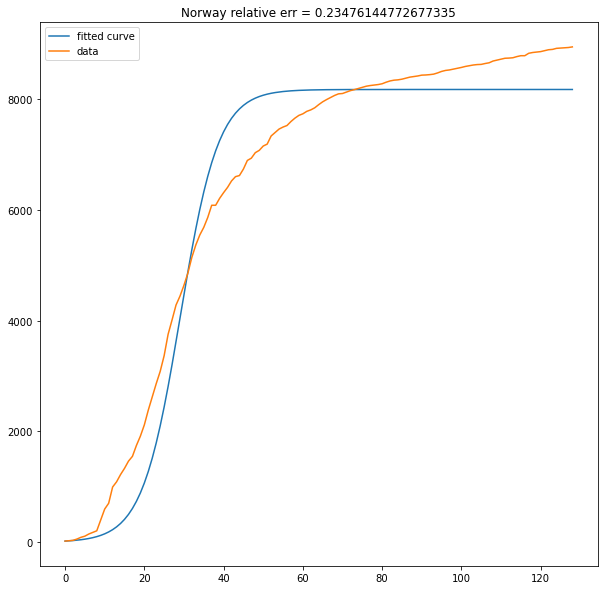

(208,) 150
minStart 10
TrainSize 197
16.0 minstart init inf
[0.07272513 0.         0.         0.01703991] 0.0014612909310996926 Oman OMN
1.5677332216729083


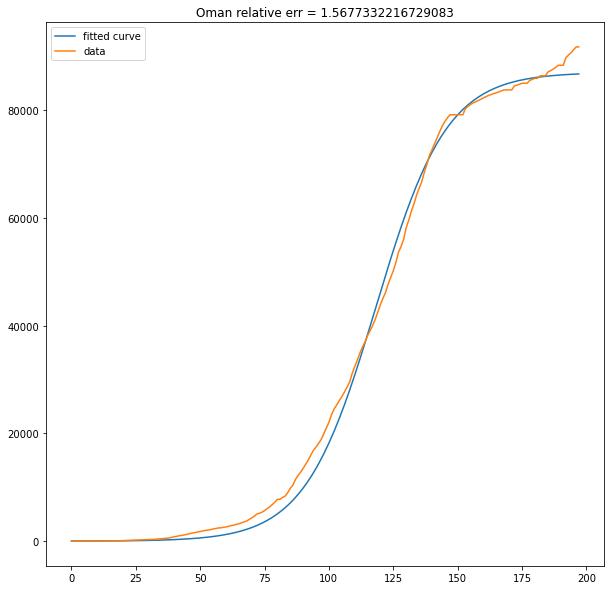

(249,) 150
minStart 15
TrainSize 233
20.0 minstart init inf
[0.09862615 0.         0.         0.00134833] 0.006020824065812078 Pakistan PAK
0.6460967704479417


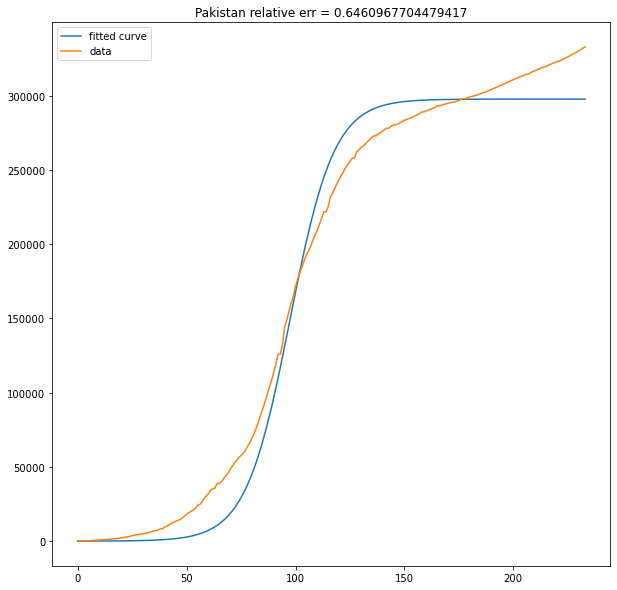

(306,) 150
minStart 8
TrainSize 297
20.0 minstart init inf
[0.09047057 0.         0.         0.00952137] 0.011391602665526121 Saudi Arabia SAU
0.4782544860887369


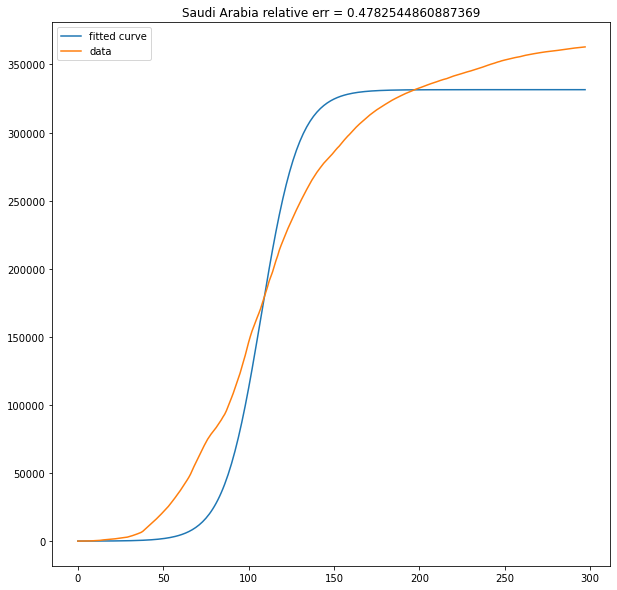

(117,) 150
minStart 16
TrainSize 100
35.0 minstart init inf
[0.15819569 0.         0.         0.00165887] 0.005486616336786181 Serbia SRB
0.5109217991706647


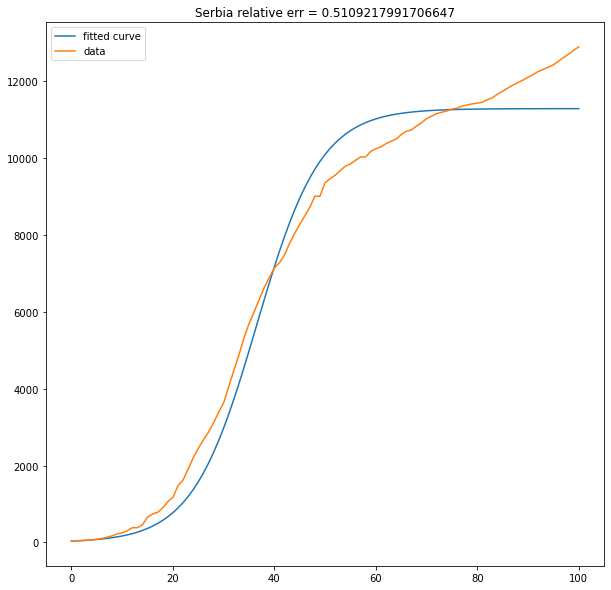

(183,) 150
minStart 9
TrainSize 173
16.0 minstart init inf
[0.07971488 0.         0.         0.00761964] 0.0031769957288191254 Singapore SGP
1.4357474141891318


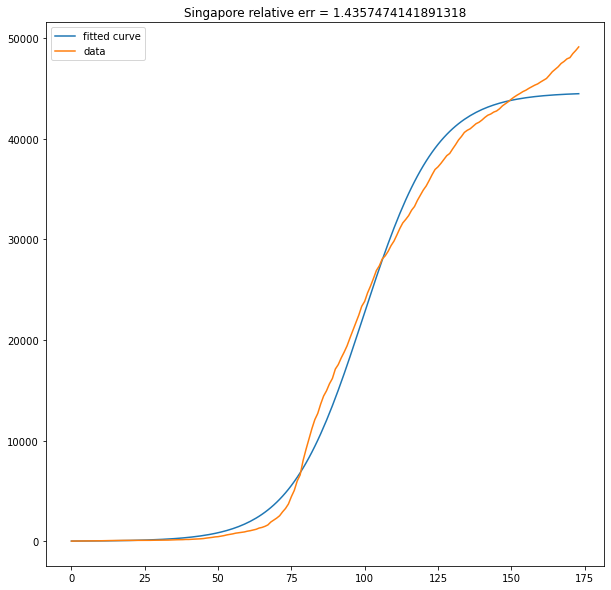

(86,) 150
minStart 6
TrainSize 79
16.0 minstart init inf
[0.15304324 0.         0.         0.0002717 ] 0.0031172973025084417 Slovakia SVK
0.5007666549314921


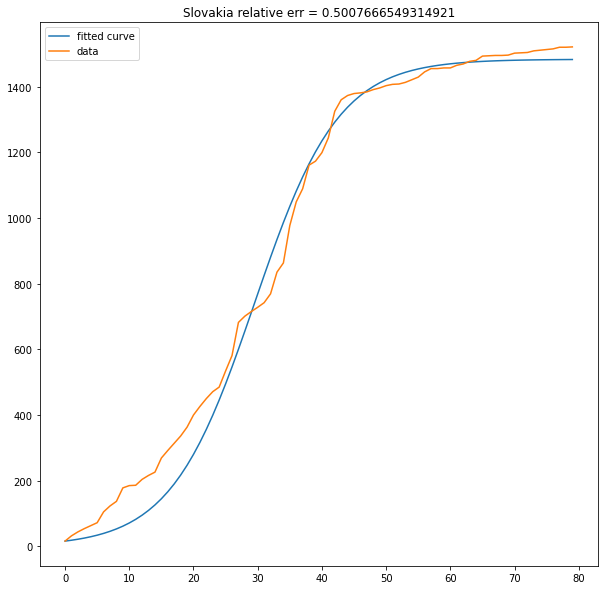

(108,) 150
minStart 35
TrainSize 72
16.0 minstart init inf
[0.20690188 0.         0.         0.00066772] 0.0068986927670927215 Slovenia SVN
0.3255246938475144


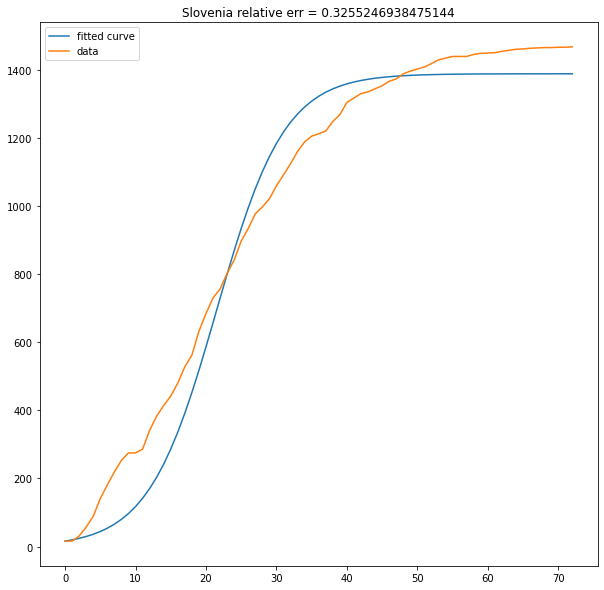

(141,) 150
minStart 27
TrainSize 113
25.0 minstart init inf
[0.12080563 0.         0.         0.00018663] 0.01161494478885515 Somalia SOM
0.4048712558588195


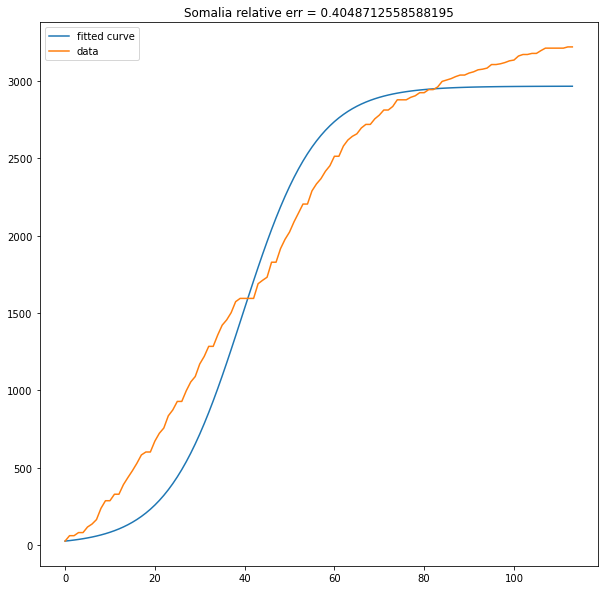

(289,) 150
minStart 34
TrainSize 254
17.0 minstart init inf
[0.0826332  0.         0.         0.01155123] 0.0034846185150452466 South Africa ZAF
0.9954842130142577


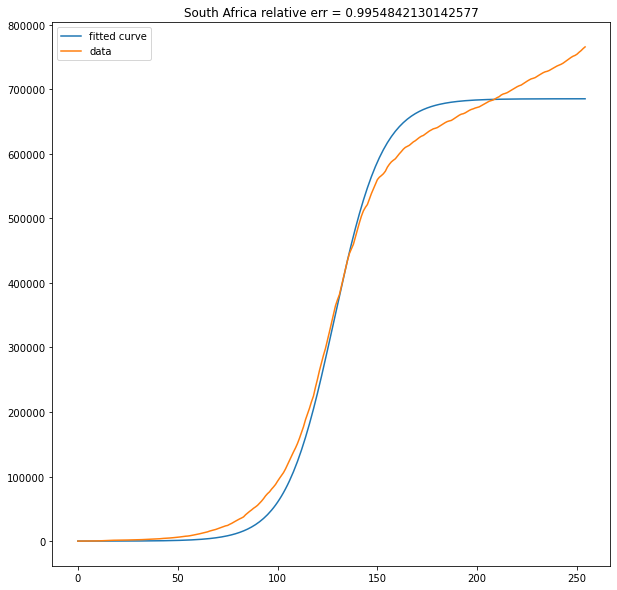

(91,) 150
minStart 12
TrainSize 78
15.0 minstart init inf
[2.08775382e-01 0.00000000e+00 0.00000000e+00 1.92620976e-04] 0.005107601864968568 South Korea KOR
0.6645145127757854


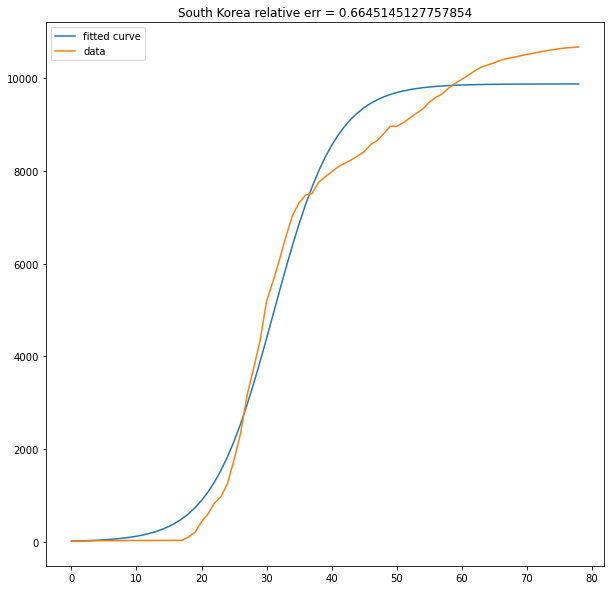

(93,) 150
minStart 25
TrainSize 67
35.0 minstart init inf
[0.12791222 0.         0.         0.00018079] 0.005635142668556974 South Sudan SSD
0.8482499382214459


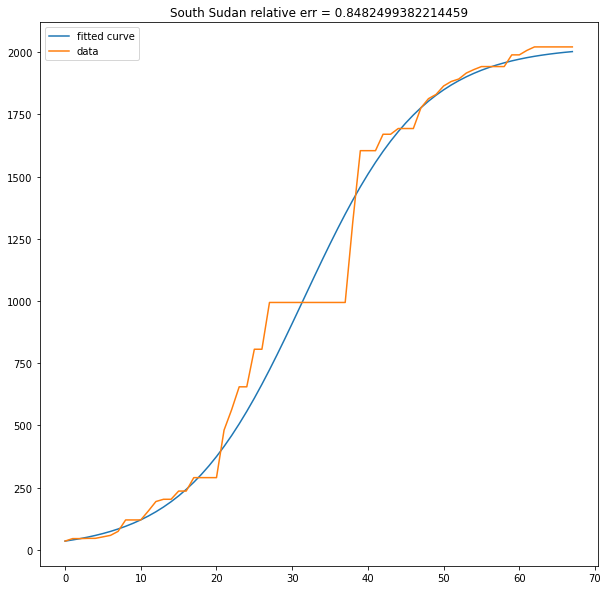

(169,) 150
minStart 27
TrainSize 141
32.0 minstart init inf
[0.24544851 0.         0.         0.00498899] 0.008617579336928503 Spain ESP
0.2985710289752032


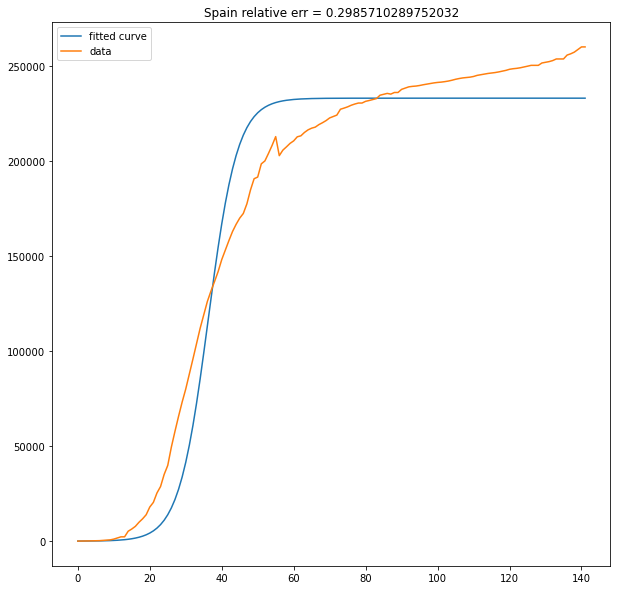

(105,) 150
minStart 23
TrainSize 81
18.0 minstart init inf
[0.25170153 0.         0.         0.00330929] 0.006919696042964569 Switzerland CHE
0.5052826513696469


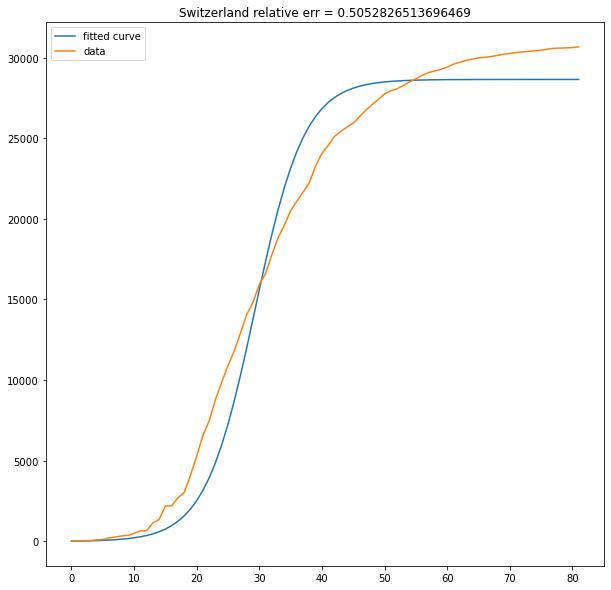

(133,) 150
minStart 26
TrainSize 106
14.0 minstart init inf
[8.39036029e-02 0.00000000e+00 0.00000000e+00 5.39084646e-05] 0.02353465737700988 Thailand THA
2.253480243343972


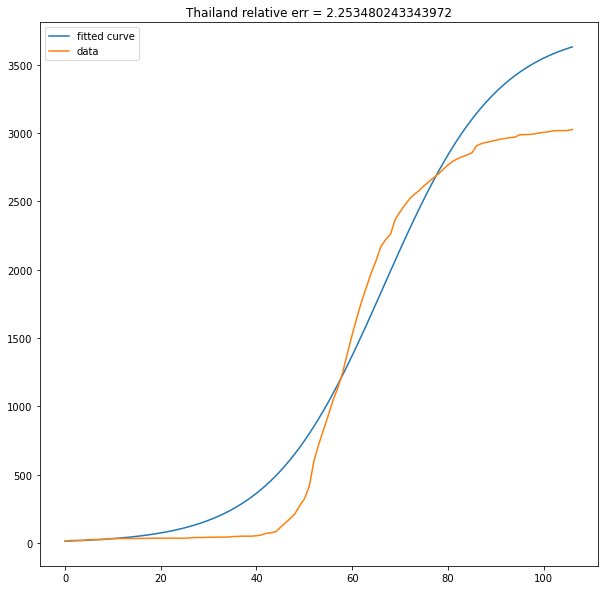

(82,) 150
minStart 11
TrainSize 70
18.0 minstart init inf
[1.91950926e-01 0.00000000e+00 0.00000000e+00 8.43750417e-05] 0.004683053631138289 Tunisia TUN
0.34666298036675613


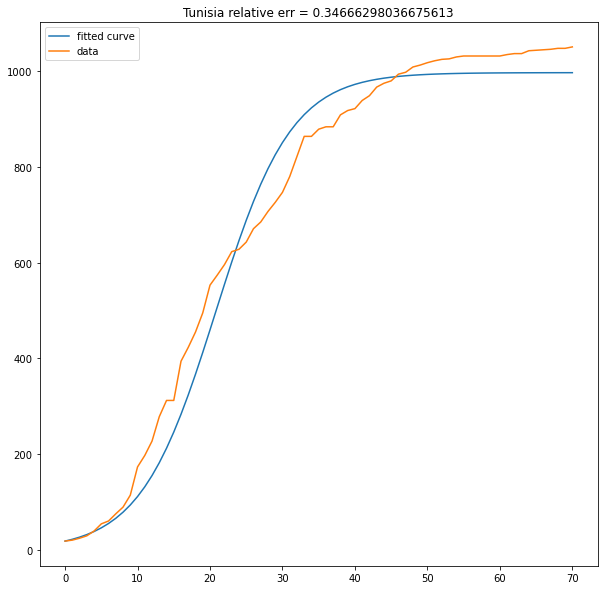

(208,) 150
minStart 5
TrainSize 202
9.0 minstart init inf
[0.13157438 0.         0.         0.00417284] 0.011502915752173102 United Kingdom GBR
0.5798045234833833


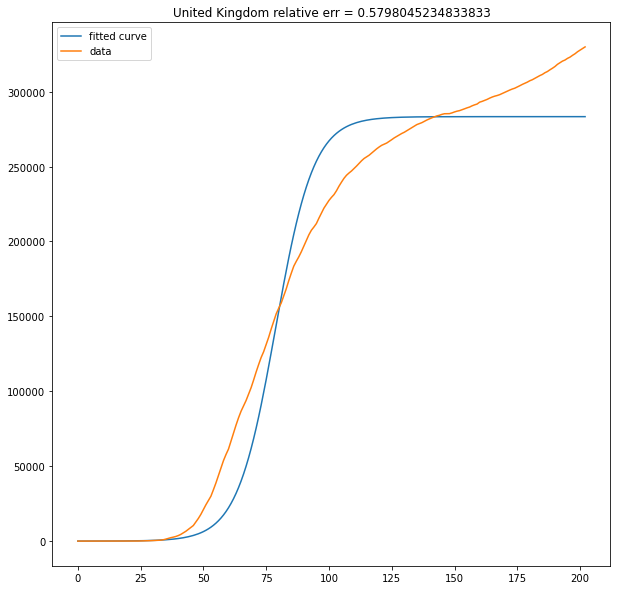

(236,) 150
minStart 28
TrainSize 207
24.0 minstart init inf
[0.05165402 0.         0.         0.00057165] 0.002328034909938642 Zimbabwe ZWE
1.3019662413776294


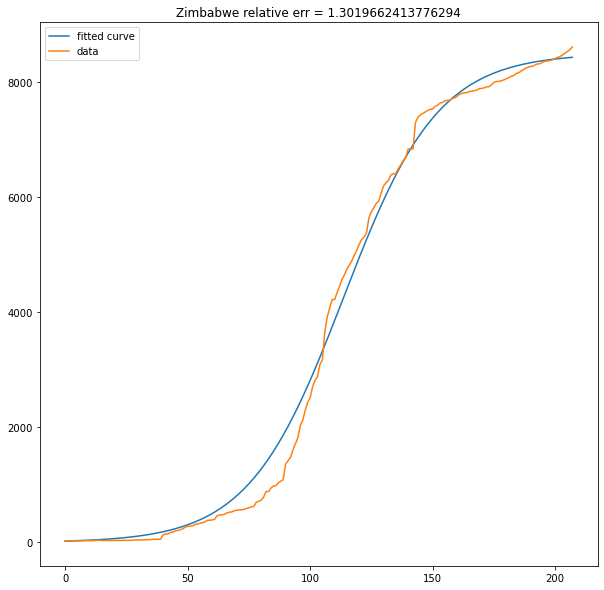

In [25]:
left = [0,0,0,0.0]
right = [4,0,0,0.1]
all_fit_err = []
all_fit_prs = []
for i in range(len(NamesList)):
#for i in range(1):
    #print(i,PopulationSizes[i])
    if(PopulationSizes[i] < 1000000):
        #print(NamesList2[i] + " less then 1m")
        all_fit_prs.append((0,0,0,0))
        all_fit_err.append((0))
        continue
    if(CType[i] != 0):
        #print(NamesList2[i] + " not S-curve")
        all_fit_prs.append((0,0,0,0))
        all_fit_err.append((0))
        continue    
        
    use = 1
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                use = 1
                break
    if(use == 0):
        continue    
        
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)    
    Cases1 = Cases1[:int(newNCases[i])]
    #curvePRS,Error,minStart,TrainSize,Cases2 = GetDEFitPRS_TSI(Cases1,100,200,PopulationSizes[i],MidPoints[i],left,right) 
    curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSI(Cases1,100,200,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
    all_fit_prs.append(curvePRS)
    print(Cases1[minStart],"minstart init inf")
    print(curvePRS,Error,NamesList2[i],NamesList[i])
    #print(Cases1[minStart:].shape[0])
    tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
    tempy = getTotalInfCurveTSI(curvePRS[0],
                                curvePRS[1],
                                Cases1[minStart:].shape[0],
                                curvePRS[3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                curvePRS[2])
    tempy = tempy[TrainSize:]
    er2 = RE(Cases1[minStart:minStart+TrainSize],tempy)      
    #er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
    print(er2)
    all_fit_err.append((er2))
    #fig = plt.figure(figsize=(10, 10))
    #plt.title(NamesList2[i]+" relative err = "+str(er2))
    #plt.plot(tempx,tempy)
    #plt.plot(tempx,Cases1[minStart+TrainSize:])   
    #plt.legend(("fitted curve","data"))
    #plt.show()             
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
    tempy = getTotalInfCurveTSI(curvePRS[0],
                                curvePRS[1],
                                Cases1[minStart:].shape[0],
                                curvePRS[3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                curvePRS[2])  
    fig = plt.figure(figsize=(10, 10))
    plt.title(NamesList2[i]+" relative err = "+str(er2))
    plt.plot(tempx,tempy)
    plt.plot(tempx,Cases1[minStart:])   
    #if(Cases2.shape[0] < tempx.shape[0]):        
    #    plt.plot(tempx[:Cases2.shape[0]],Cases2)
    #else:
    #    plt.plot(tempx,Cases2[:tempx.shape[0]])
    plt.legend(("fitted curve","data","reflected"))
    plt.show()     
FITPRS_ = np.array(all_fit_prs)
FITERR_ = np.array(all_fit_err)
np.savetxt("owidFITPRS_SI_RMSE_CUT19_TRAINTEST8.txt",FITPRS_)
np.savetxt("owidFITERR_SI_RMSE_CUT19_TRAINTEST8.txt",FITERR_)

In [ ]:
for run in range(10):
    left = [0,0,0,0]
    right = [4,0.1,0,0.1]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            all_fit_prs.append((0,0,0,0))
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            all_fit_prs.append((0,0,0,0))
            all_fit_err.append((0))
            continue    

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]

        PRS_noGamma = np.loadtxt("owidFITPRS_SI_RMSE_CUT19_TRAINTEST8_"+str(run+1)+".txt")    
        print(PRS_noGamma[i])

        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSI(Cases1,100,200,PopulationSizes[i],MidPoints[i],left,right) 
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSI(Cases1,100,200,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSI_FineTune(Cases1,100,200,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i],PRS_noGamma[i]) 
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSI(curvePRS[0],
                                    curvePRS[1],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[3]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[2])
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        #er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        #tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        #tempy = getTotalInfCurveTSI(curvePRS[0],
        #                            curvePRS[1],
        #                            Cases1[minStart:].shape[0],
        #                            curvePRS[3]*PopulationSizes[i],
        #                            Cases1[minStart],
        #                            PopulationSizes[i],
        #                            curvePRS[2])  
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()     
        #break
    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_SIG_RMSE_CUT19_TRAINTEST9_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_SIG_RMSE_CUT19_TRAINTEST9_"+str(run+1)+".txt",FITERR_)

[0.09478457 0.         0.         0.00093457]
FINETUNE
(189,) 150
minStart 18
TrainSize 170
[0.09478457 0.         0.         0.00093457]
[0.07061126 0.00013523 0.         0.00097799] 0.0005889706903826371
171
2.3348208778298568e-05
[0.07348817 0.         0.         0.0145572 ]
FINETUNE
(183,) 150
minStart 14
TrainSize 168
[0.07348817 0.         0.         0.0145572 ]
[0.05334066 0.00021259 0.         0.01474751] 0.00015158736955488624
169
0.0007567342640742642
[0.1124918  0.         0.         0.00028096]
FINETUNE
(96,) 150
minStart 6
TrainSize 89
[0.1124918  0.         0.         0.00028096]
[0.1124918  0.         0.         0.00028096] 0.016305239861206067
90
0.0009806146232683827
[0.25160061 0.         0.         0.00179065]
FINETUNE
(68,) 150
minStart 6
TrainSize 61
[0.25160061 0.         0.         0.00179065]
[0.18267659 0.00138496 0.         0.00167193] 0.0009613997963704967
62
0.0011294209788539004
[0.06739062 0.         0.         0.00374231]
FINETUNE
(163,) 150
minStart 14
T

[2.11767735e-02 1.68054585e-05 0.00000000e+00 8.72006830e-02] 0.0013660964536292874
387
0.00016651682301725766
[0.05839363 0.         0.         0.00026127]
FINETUNE
(173,) 150
minStart 21
TrainSize 151
[0.05839363 0.         0.         0.00026127]
[0.04485041 0.00072145 0.         0.00027771] 0.002407139103394196
152
0.0011848652806642145
[0.17345855 0.         0.         0.00061193]
FINETUNE
(124,) 150
minStart 18
TrainSize 105
[0.17345855 0.         0.         0.00061193]
[0.03014943 0.01872814 0.         0.00066152] 0.0009003147700935548
106
0.0004377331239585821
[0.07816155 0.         0.         0.00012666]
FINETUNE
(132,) 150
minStart 4
TrainSize 127
[0.07816155 0.         0.         0.00012666]
[0.03441528 0.00291367 0.         0.00014543] 0.0011969669803232942
128
0.002349543333689283
[0.13073965 0.         0.         0.00147258]
FINETUNE
(211,) 150
minStart 62
TrainSize 148
[0.13073965 0.         0.         0.00147258]
[0.06241802 0.00382484 0.         0.0015528 ] 0.0015351508

In [27]:
def GetDEFitPRS_TSIR(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr):
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 5
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and   
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSIR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,4]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,3])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSIR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[4]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[3])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

In [24]:
def GetDEFitPRS_TSIR_FineTune(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr,PRS_noGamma):
    print("FINETUNE")
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 5
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and   
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        if(i == 0):
            for j in range(D):
                Pop[i][j] = PRS_noGamma[j]
            print(Pop[i])
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSIR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,4]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,3])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSIR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[4]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[3])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

(189,) 150
minStart 18
TrainSize 170
[0.20140574 0.11442047 0.         0.         0.00135101] 0.00017946677555346965
171
0.00025844095386088624


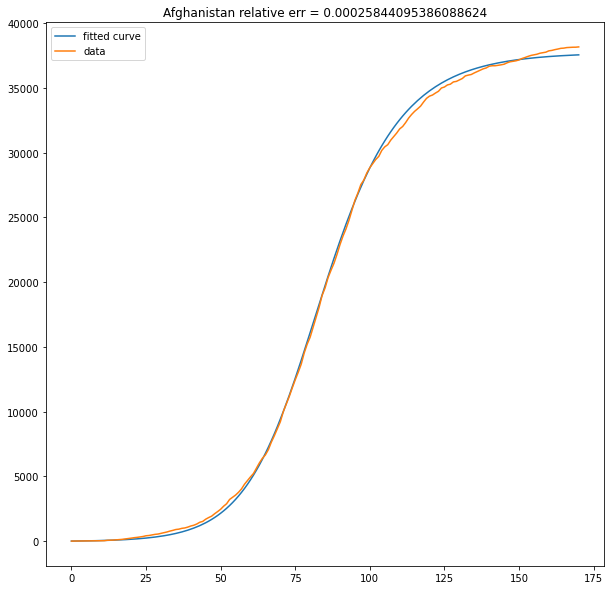

(207,) 150
minStart 14
TrainSize 192
[0.47117772 0.42019434 0.         0.         0.07432531] 0.00040840321226648314
193
0.0026109464906417953


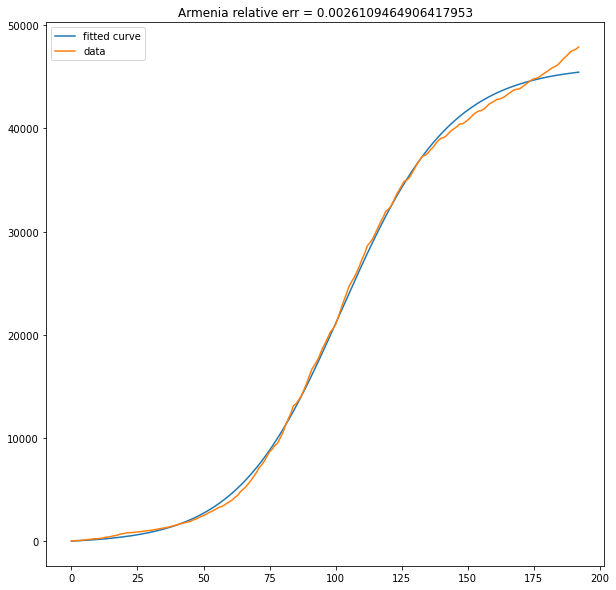

(116,) 150
minStart 6
TrainSize 109
[0.11553174 0.00295933 0.         0.         0.00028516] 0.009864369860448237
110
0.0005233183798642514


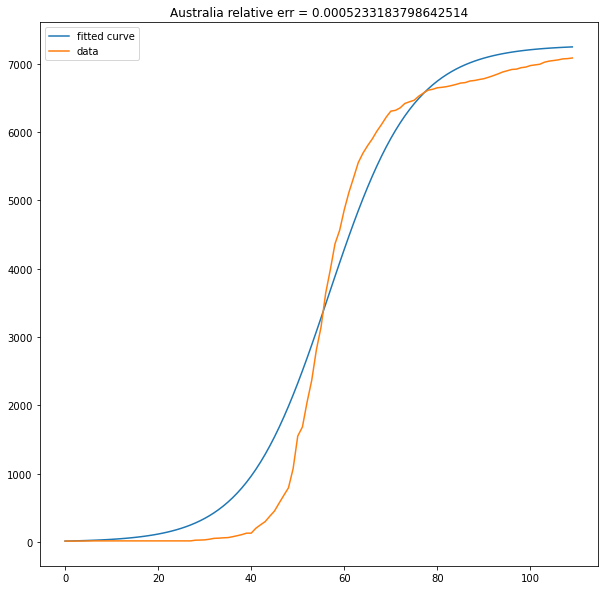

(129,) 150
minStart 6
TrainSize 122
[1.1807902  0.99962501 0.         0.         0.00623869] 0.002675077982098792
123
0.0074761592068625414


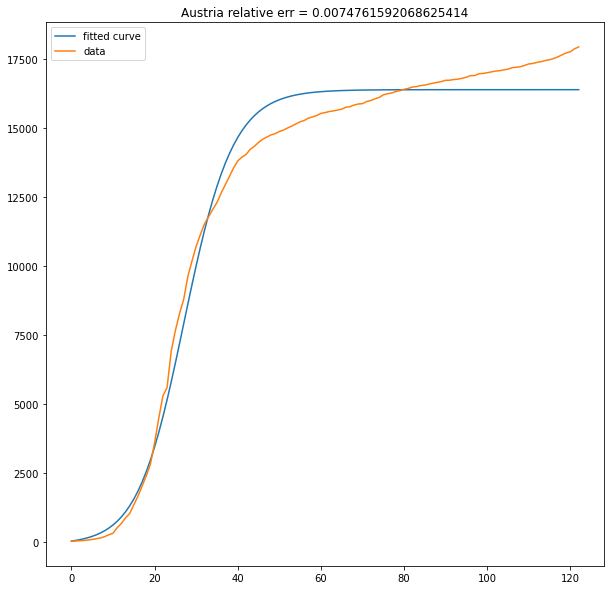

(223,) 150
minStart 14
TrainSize 208
[0.27808396 0.22569534 0.         0.         0.01118553] 0.0006986950472637742
209
0.0023623140601579918


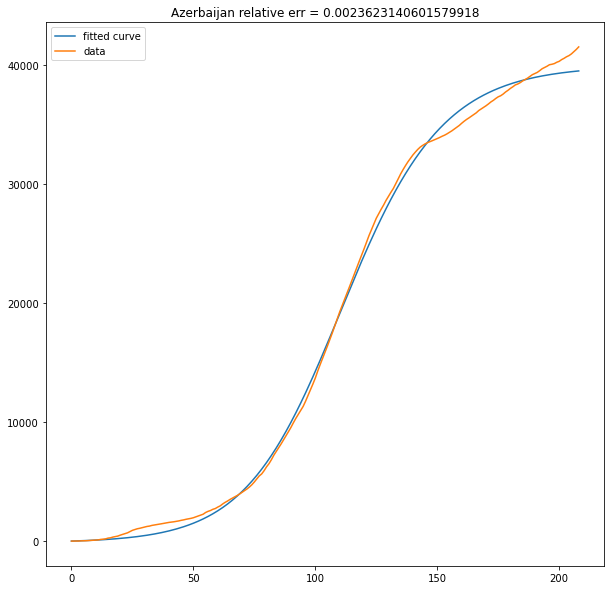

(210,) 150
minStart 15
TrainSize 194
[1.07238818 0.99999771 0.         0.         0.05565135] 0.0025152086639658308
195
0.008255466653604378


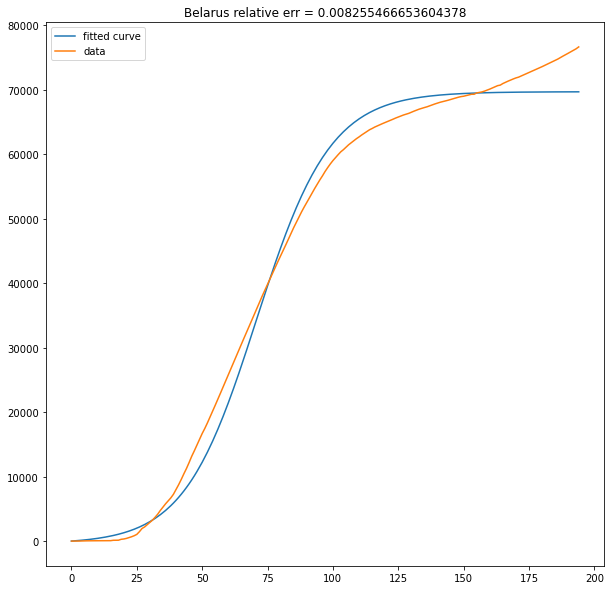

(171,) 150
minStart 29
TrainSize 141
[1.142998   0.99998589 0.         0.         0.02122775] 0.0041996931883392305
142
0.008083782125702337


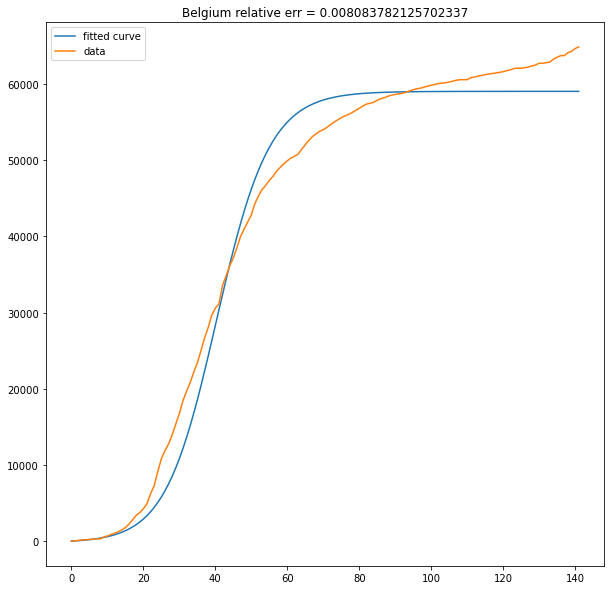

(280,) 150
minStart 5
TrainSize 274
[0.80839859 0.75812389 0.         0.         0.0999998 ] 0.0006278093972269769
275
0.001439134012819089


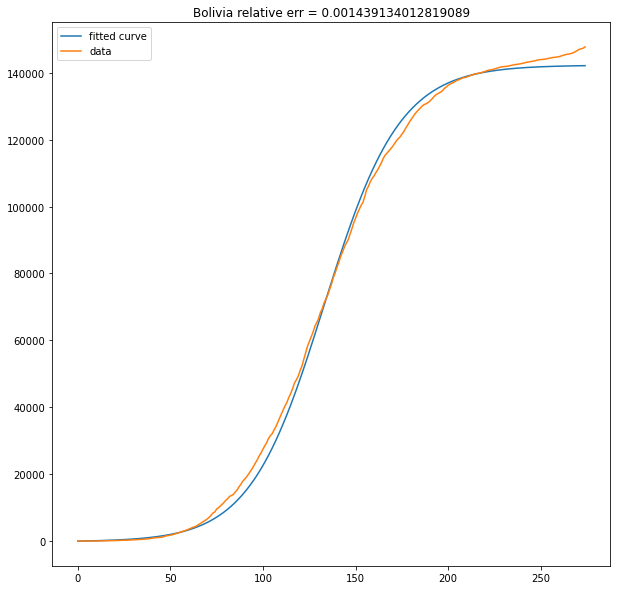

(94,) 150
minStart 8
TrainSize 85
[0.99275815 0.99299025 0.         0.         0.00108416] 0.0007612035845117266
86
9.908399048242295e-05


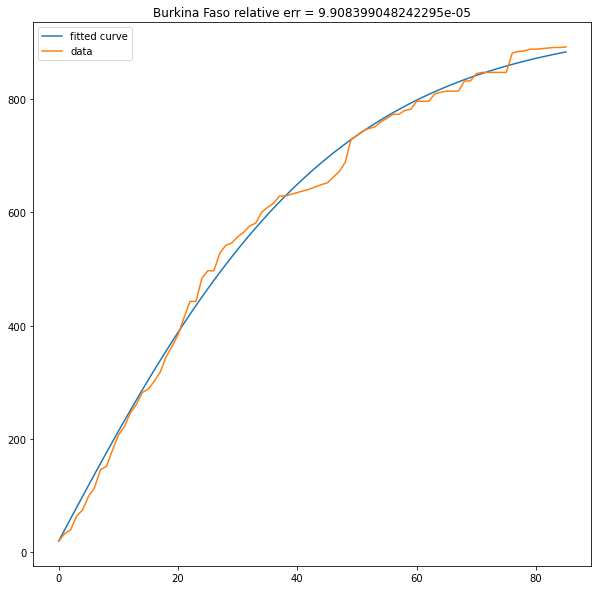

(196,) 150
minStart 52
TrainSize 143
[0.05623962 0.06669486 0.         0.         0.09999989] 0.04445455182378459
144
0.05645748794904402


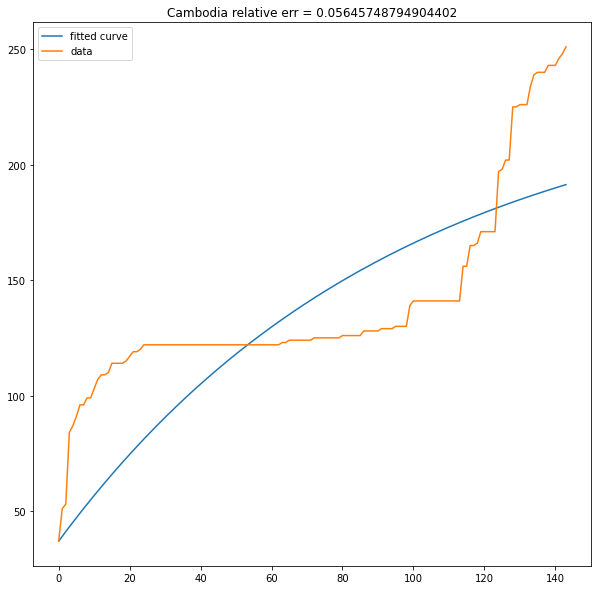

(213,) 150
minStart 13
TrainSize 199
[1.04411756 0.99852634 0.         0.         0.00873347] 0.001049138275284153
200
0.0016796087906738861


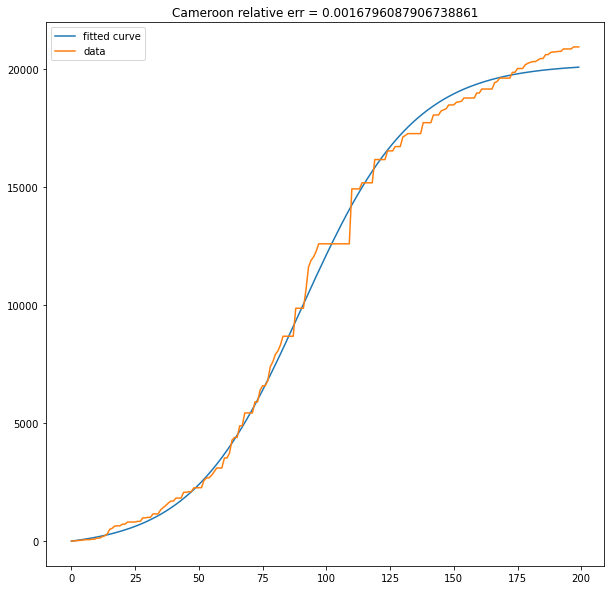

(218,) 150
minStart 36
TrainSize 181
[1.09387036 0.9998331  0.         0.         0.01773954] 0.009250973522915262
182
0.019032776812163303


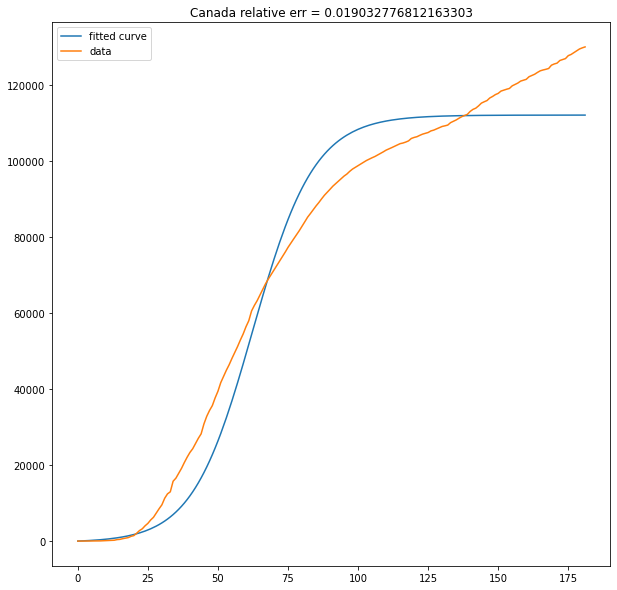

(293,) 150
minStart 9
TrainSize 283
[0.57943782 0.50174243 0.         0.         0.09455181] 0.018686539589089654
284
0.03476647856227257


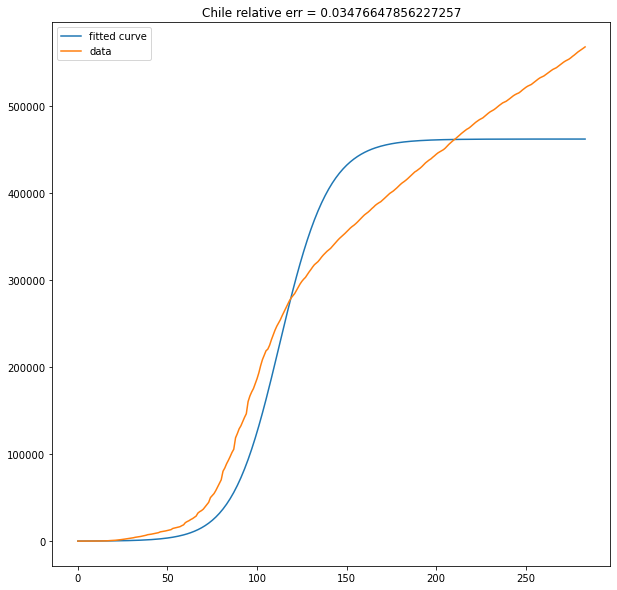

(275,) 150
minStart 5
TrainSize 269
[0.24313641 0.20570858 0.         0.         0.09999721] 0.0011417928634485245
270
0.0033534856535450733


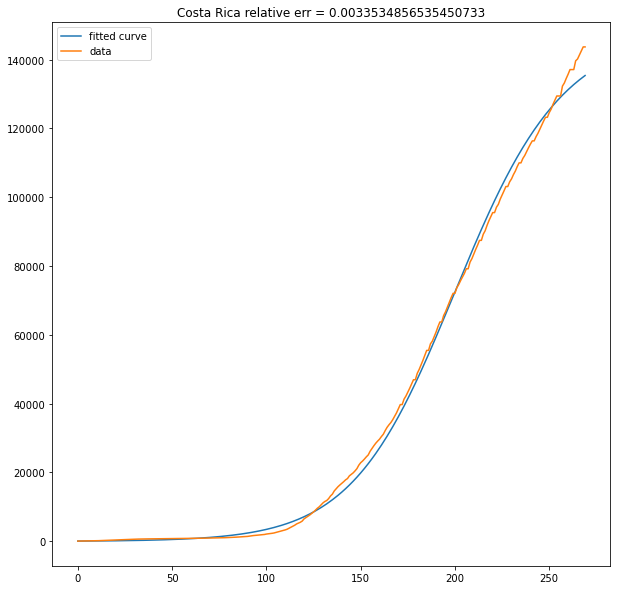

(287,) 150
minStart 10
TrainSize 276
[0.68133372 0.63921592 0.         0.         0.00645181] 0.0014274495547065382
277
0.0028415143135305104


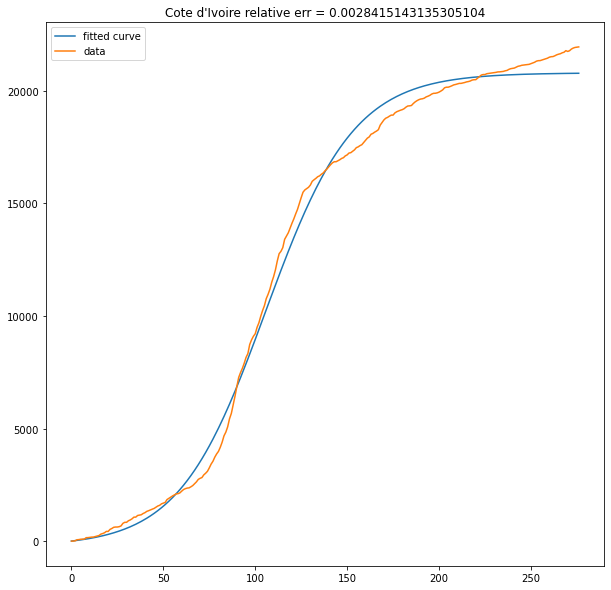

(91,) 150
minStart 17
TrainSize 73
[0.60457693 0.49294051 0.         0.         0.00149338] 0.00041746972757145383
74
0.00026321424306476146


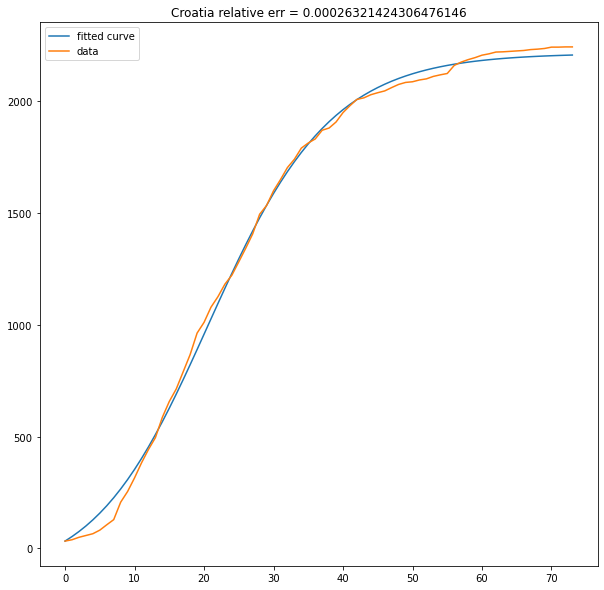

(85,) 150
minStart 9
TrainSize 75
[5.44778840e-01 4.49451120e-01 0.00000000e+00 0.00000000e+00
 5.26493508e-04] 0.0004354414386245019
76
0.0030070409173747763


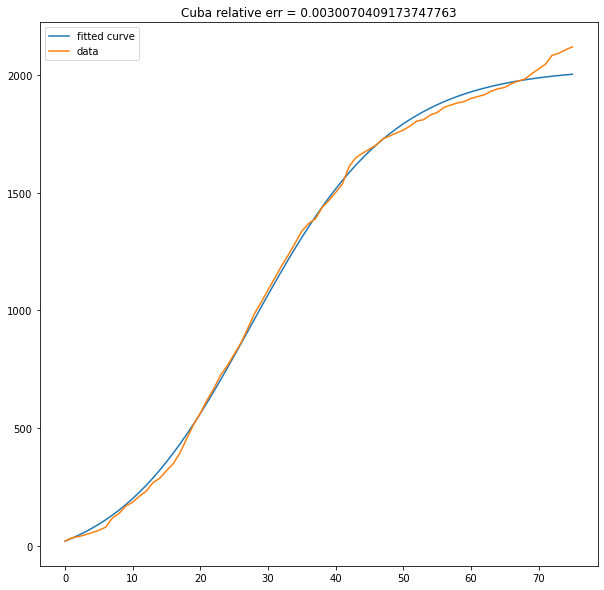

(117,) 150
minStart 9
TrainSize 107
[1.12277697 0.99985092 0.         0.         0.00394039] 0.007181286066562752
108
0.020051405438736982


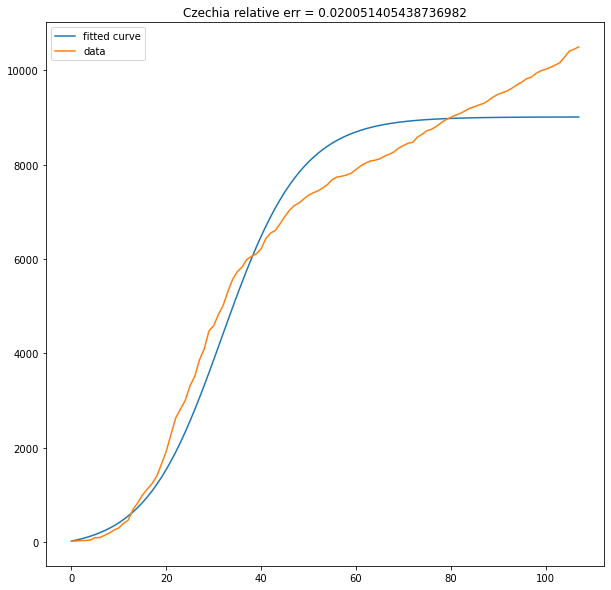

(234,) 150
minStart 10
TrainSize 223
[0.23946531 0.18752695 0.         0.         0.00029262] 0.0009758439961649681
224
0.004898240420243314


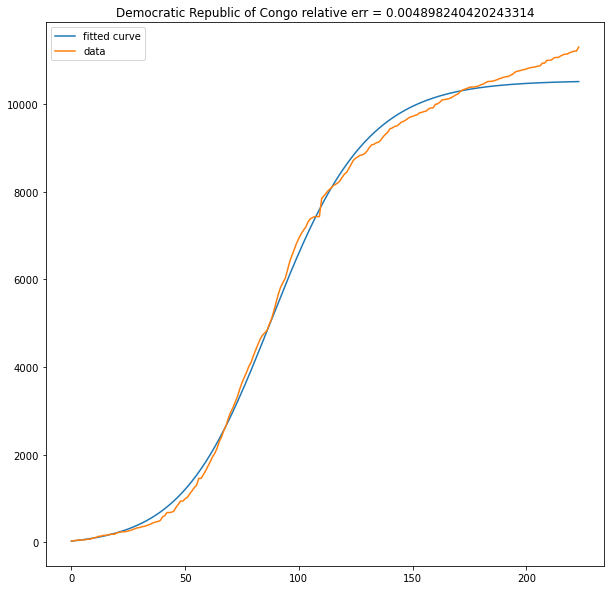

(277,) 150
minStart 23
TrainSize 253
[0.1551307  0.08718674 0.         0.         0.00139861] 0.000663118493944488
254
0.0044128781318268995


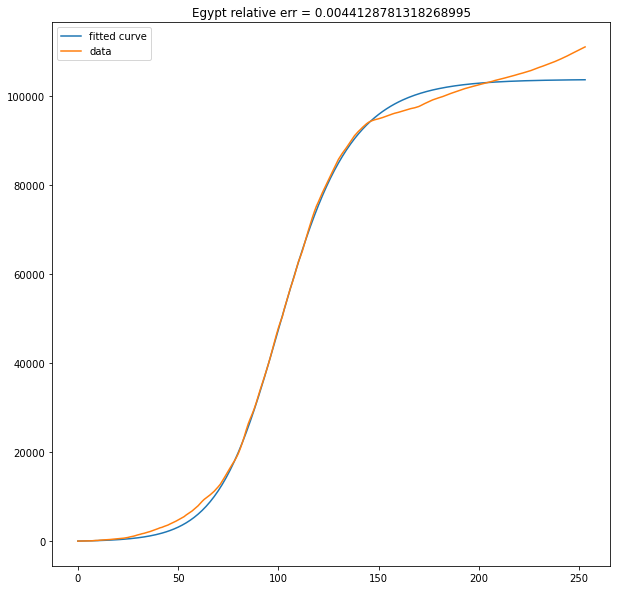

(209,) 150
minStart 8
TrainSize 200
[0.30291725 0.25359181 0.         0.         0.01532718] 0.000709623998142792
201
0.0006594706182153921


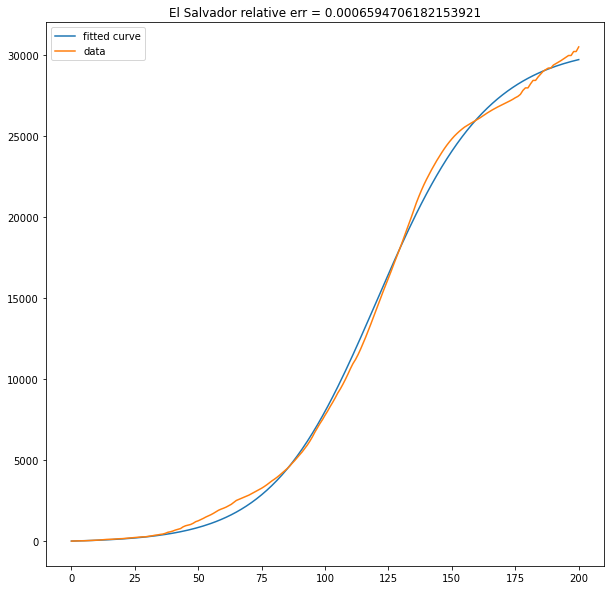

(114,) 150
minStart 12
TrainSize 101
[1.10195964 0.99943418 0.         0.         0.00736639] 0.0016710956322419318
102
0.0047633611594468704


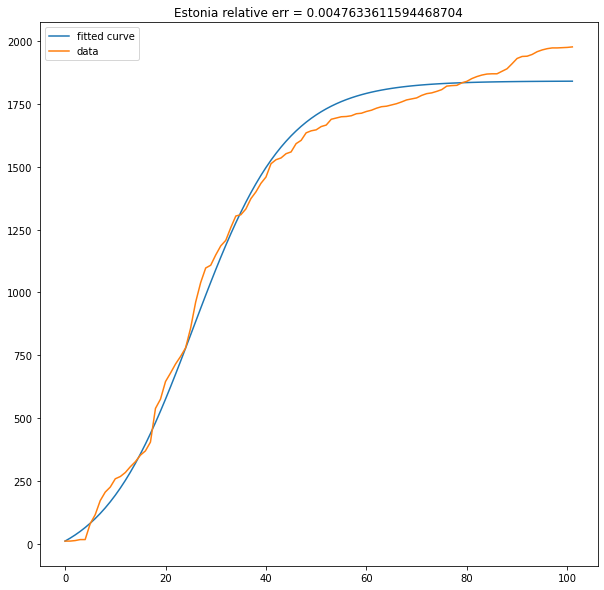

(161,) 150
minStart 38
TrainSize 122
[1.08329253 0.9997969  0.         0.         0.00829933] 0.0012770243835567988
123
0.0008533910176337127


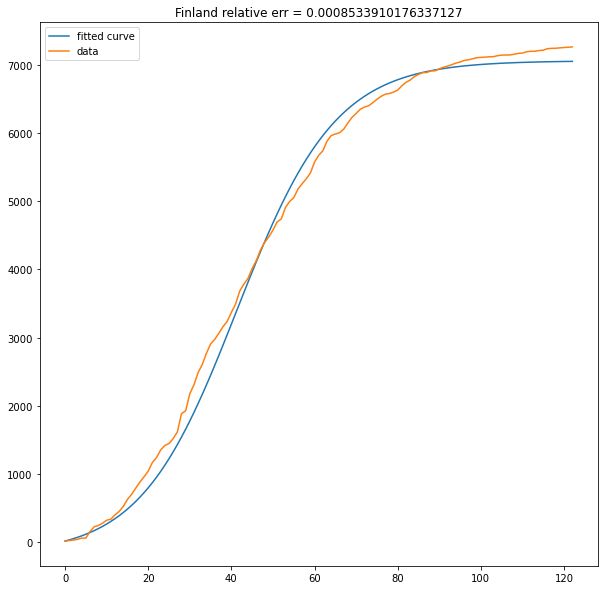

(118,) 150
minStart 35
TrainSize 82
[1.14251843 0.99986303 0.         0.         0.01124444] 0.008247296563373365
83
1.4612344450431357e-05


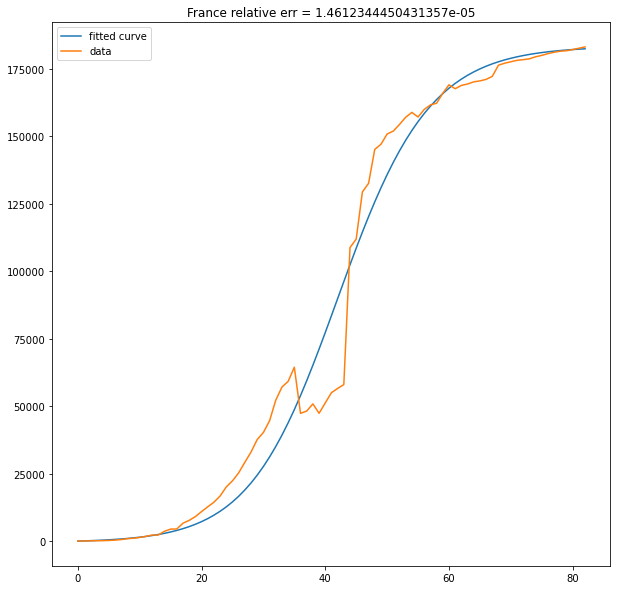

(189,) 150
minStart 7
TrainSize 181
[0.23741867 0.08712487 0.         0.         0.00245652] 0.003493486303906785
182
0.01113123369289194


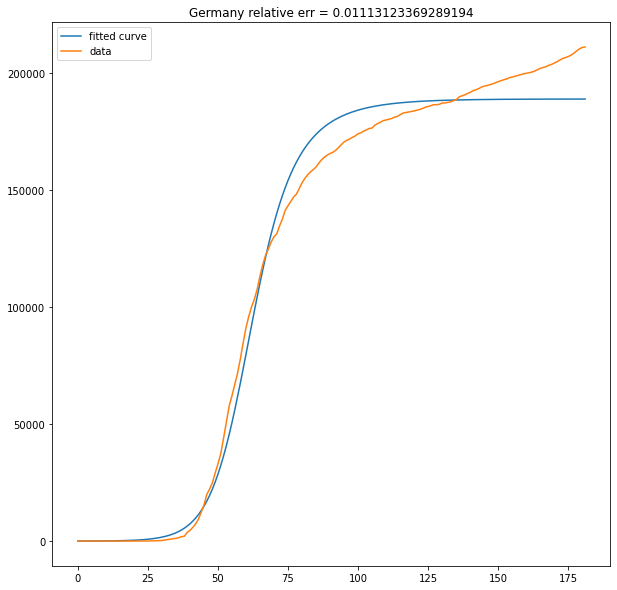

(110,) 150
minStart 14
TrainSize 95
[0.55353789 0.47335456 0.         0.         0.00093477] 0.0009376876111302743
96
0.004077647702741802


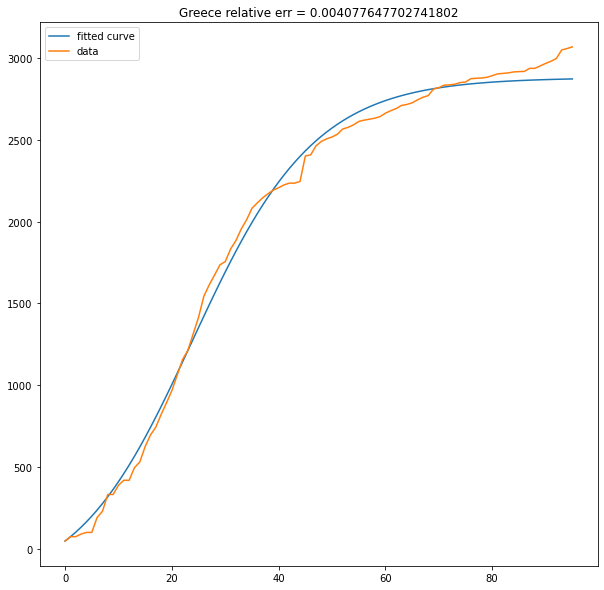

(226,) 150
minStart 12
TrainSize 213
[0.14148062 0.06847903 0.         0.         0.00092494] 0.0023152365241907997
214
0.0028227564576652473


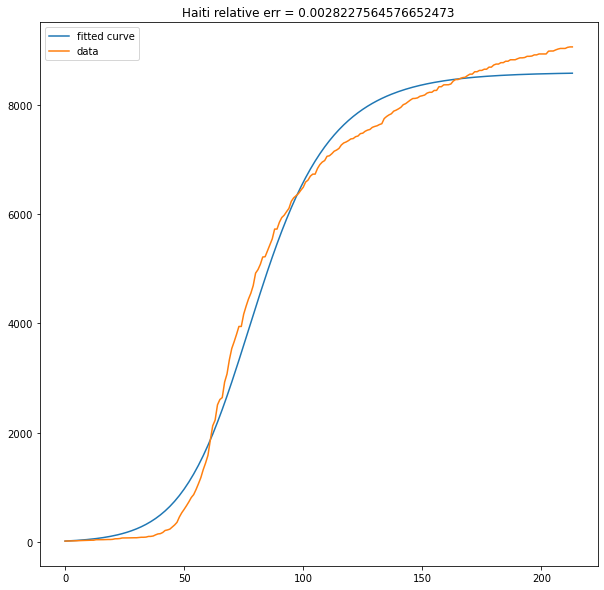

(156,) 150
minStart 6
TrainSize 149
[1.07792327 0.99955777 0.         0.         0.00300371] 0.0015920599615782502
150
0.006936750634324567


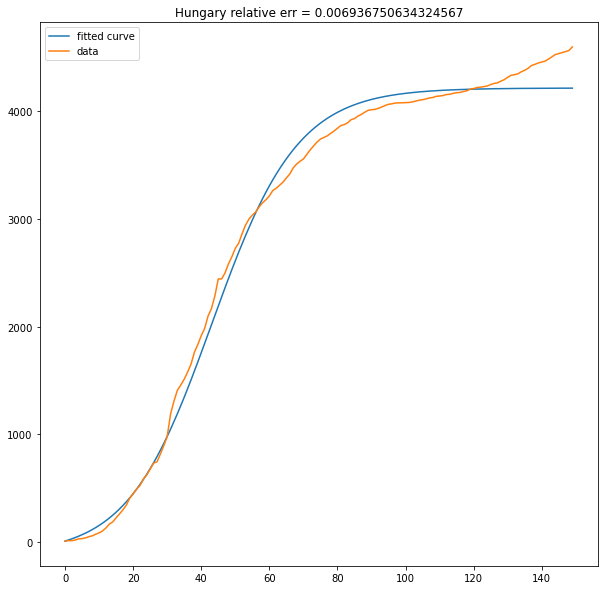

(407,) 150
minStart 36
TrainSize 370
[1.04925055 0.99999871 0.         0.         0.08057761] 0.006395524522406103
371
0.008417165812650805


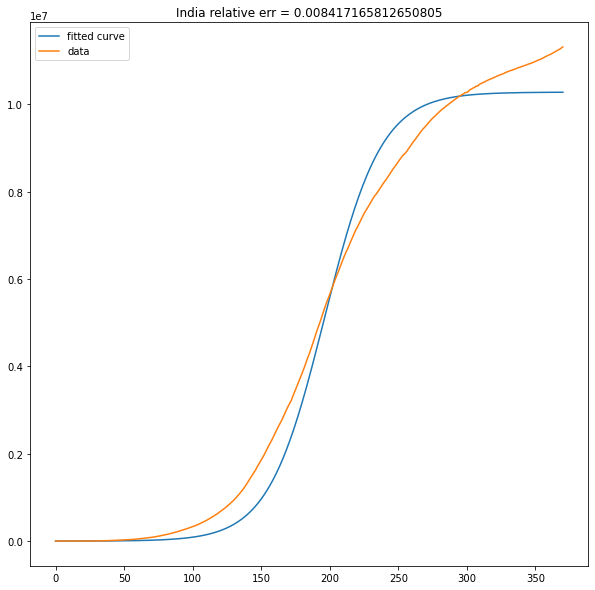

(351,) 150
minStart 7
TrainSize 343
[0.49968189 0.4617199  0.         0.         0.09999919] 0.002758706892432461
344
0.0035779793563802654


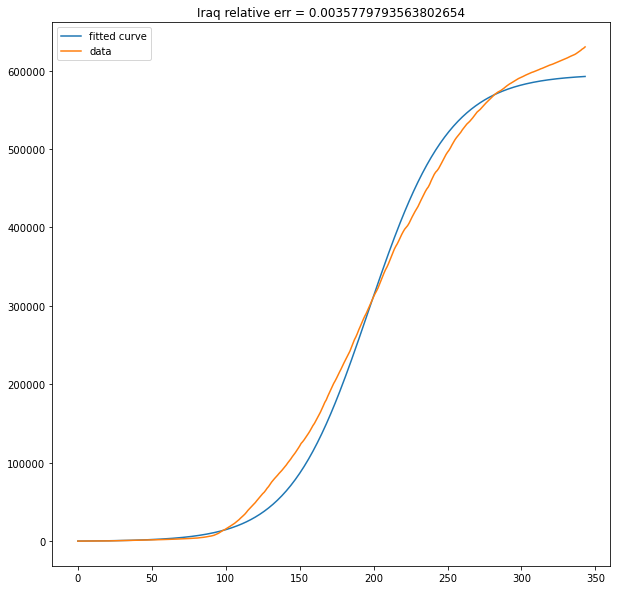

(104,) 150
minStart 12
TrainSize 91
[1.12936409 0.99997533 0.         0.         0.02257162] 0.00047547213347712253
92
0.0005600245662610024


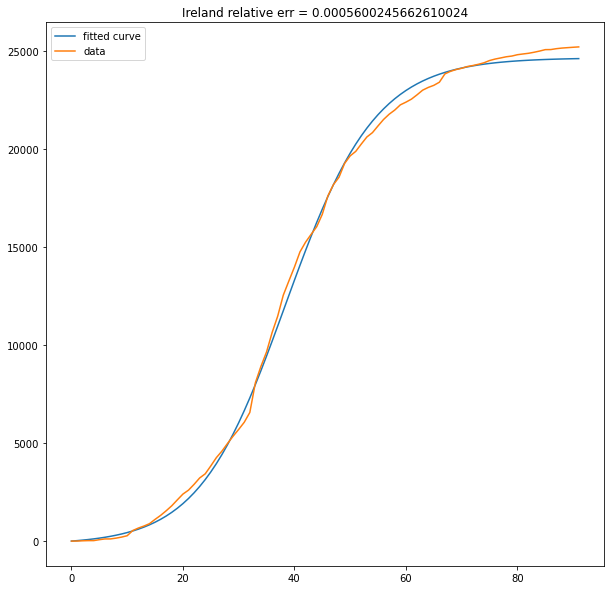

(93,) 150
minStart 13
TrainSize 79
[1.15529898 0.99994447 0.         0.         0.00731286] 0.0011978741823202277
80
0.0004676016501686082


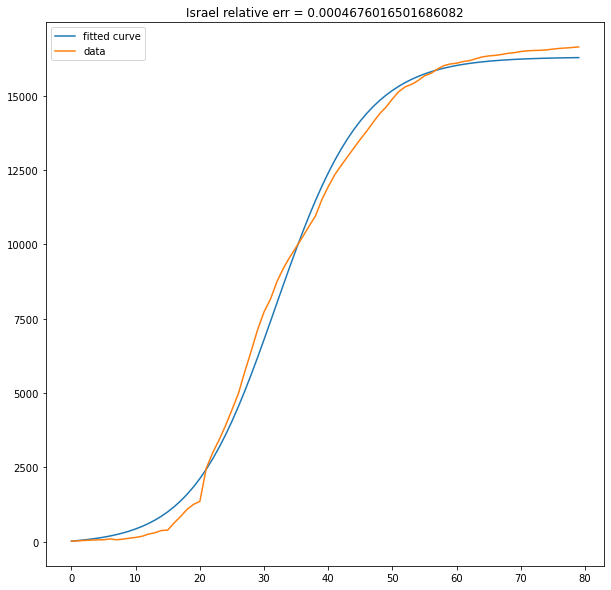

(202,) 150
minStart 23
TrainSize 178
[1.1213241  0.9999924  0.         0.         0.01869729] 0.0035390421576788882
179
0.005369870752217567


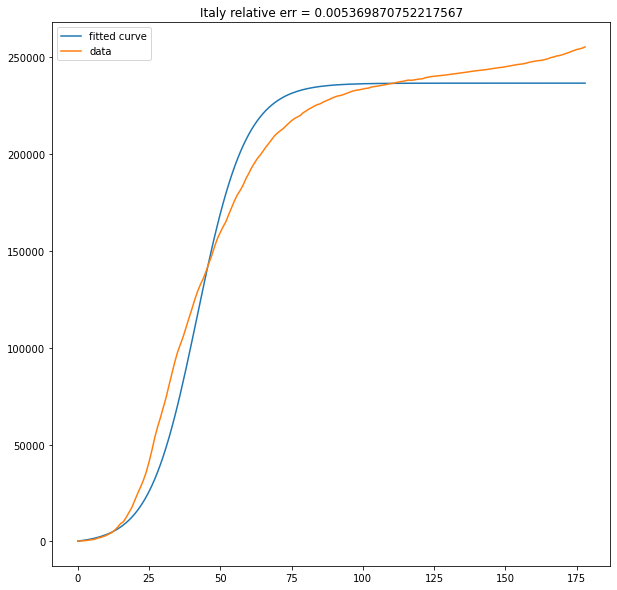

(160,) 150
minStart 10
TrainSize 149
[0.10838661 0.01931941 0.         0.         0.00014169] 0.002748432398213885
150
0.0022101205129452005


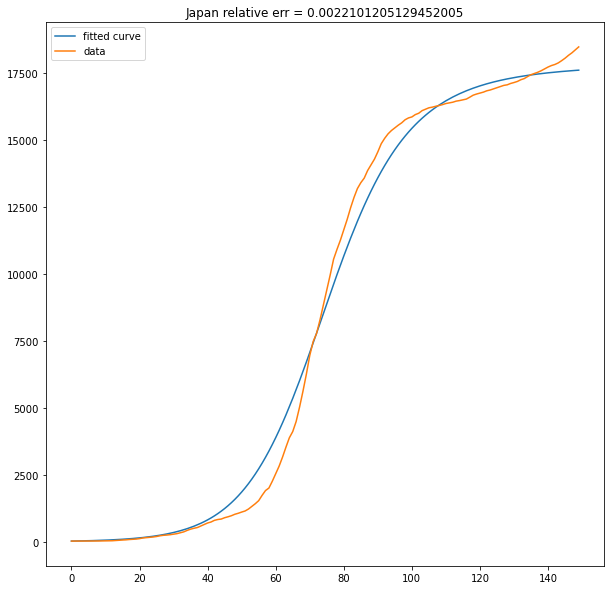

(121,) 150
minStart 15
TrainSize 105
[1.04761758 0.99356034 0.         0.         0.00490574] 0.0019167685906992219
106
0.0008098547854764079


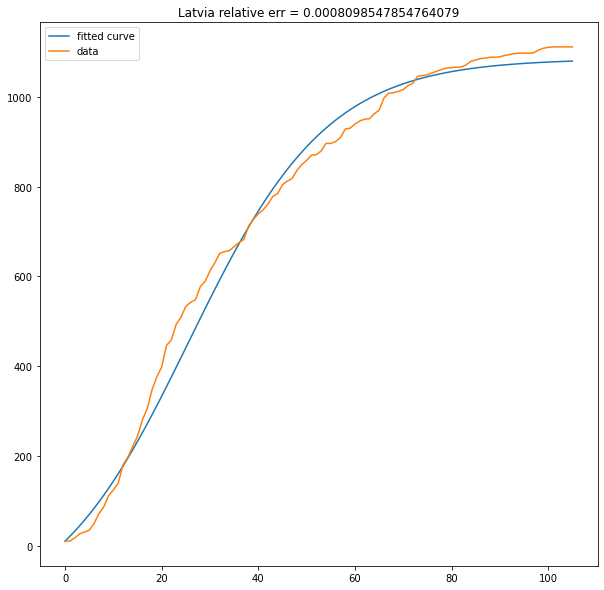

(398,) 150
minStart 11
TrainSize 386
[0.07445323 0.04311635 0.         0.         0.09999991] 0.006475474735558299
387
0.005737157301920772


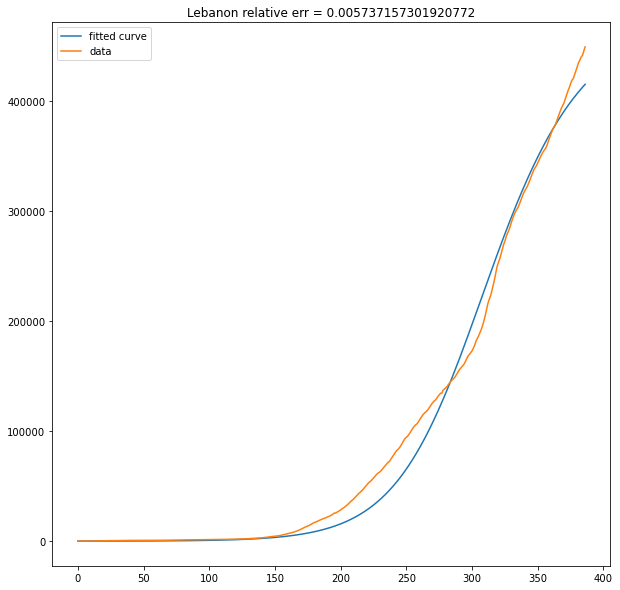

(173,) 150
minStart 21
TrainSize 151
[0.20833742 0.17365182 0.         0.         0.00087623] 0.00508462805461444
152
0.0003219559509712842


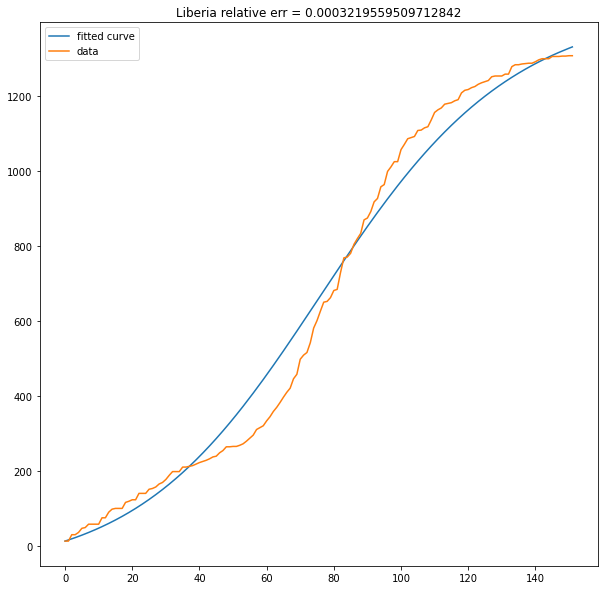

(141,) 150
minStart 18
TrainSize 122
[1.05414239 0.99961795 0.         0.         0.00541902] 0.002427543325156941
123
0.004972837670737683


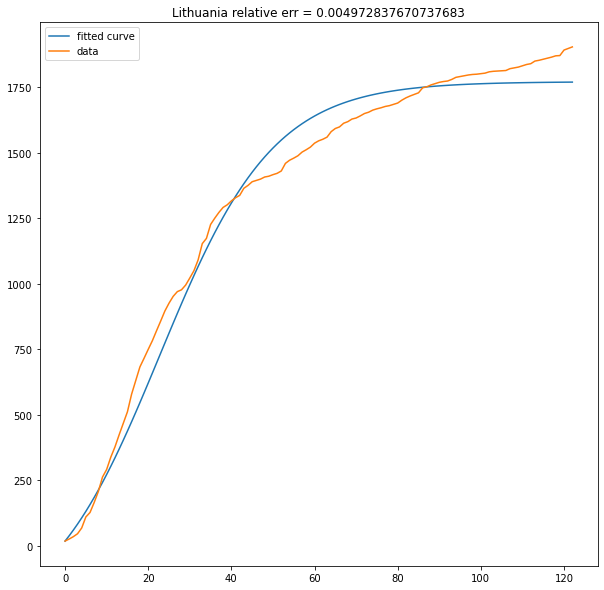

(165,) 150
minStart 4
TrainSize 160
[0.3482098  0.30424847 0.         0.         0.00055645] 0.0007898337527359259
161
0.00039943384870817013


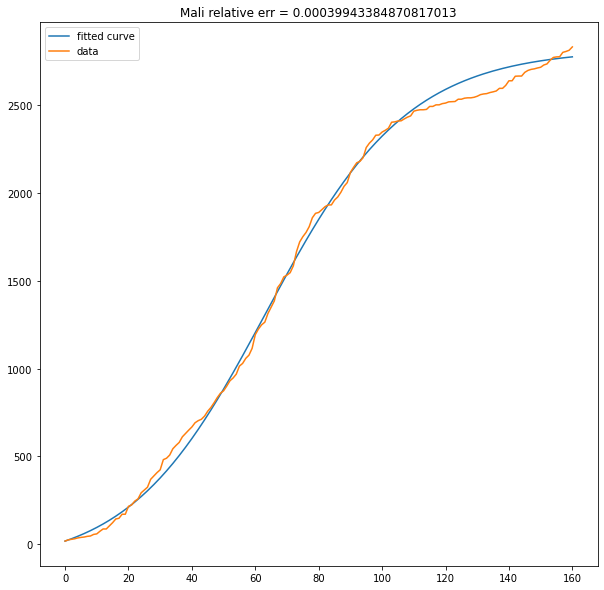

(207,) 150
minStart 62
TrainSize 144
[0.92477042 0.86110928 0.         0.         0.0109606 ] 0.0014521865762909317
145
0.002123490360458337


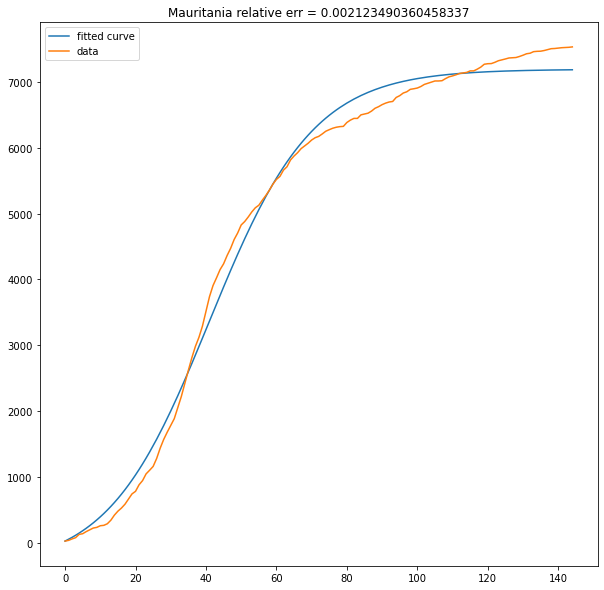

(227,) 150
minStart 4
TrainSize 222
[3.83794377e-01 1.98847456e-01 0.00000000e+00 0.00000000e+00
 3.48210642e-04] 0.005585204754745728
223
0.03868005873435056


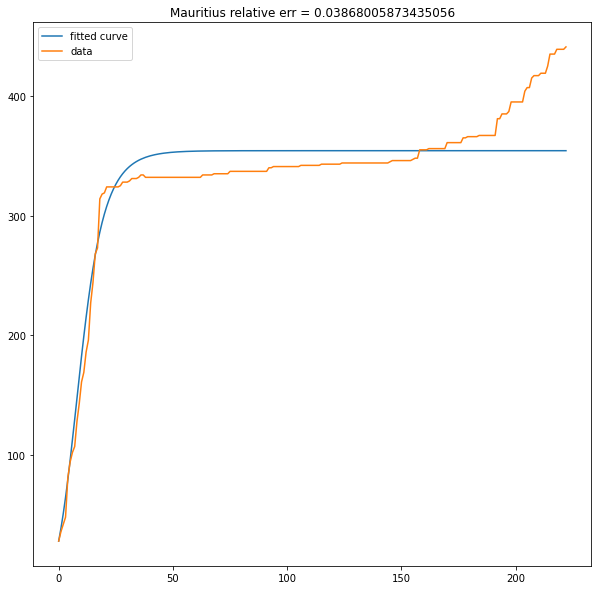

(155,) 150
minStart 7
TrainSize 147
[1.14149705 0.99997228 0.         0.         0.01177942] 0.005690668183487412
148
0.01032542204253254


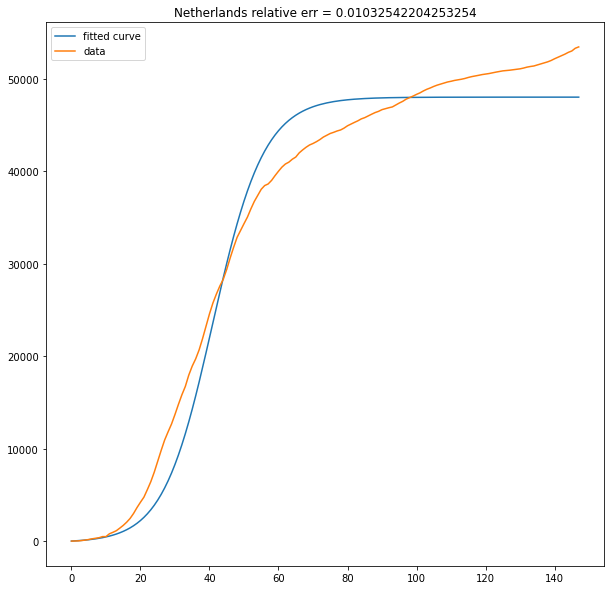

(75,) 150
minStart 20
TrainSize 54
[6.38616179e-01 4.13272691e-01 0.00000000e+00 0.00000000e+00
 4.95729185e-04] 0.00011878266070454045
55
5.252963543865462e-05


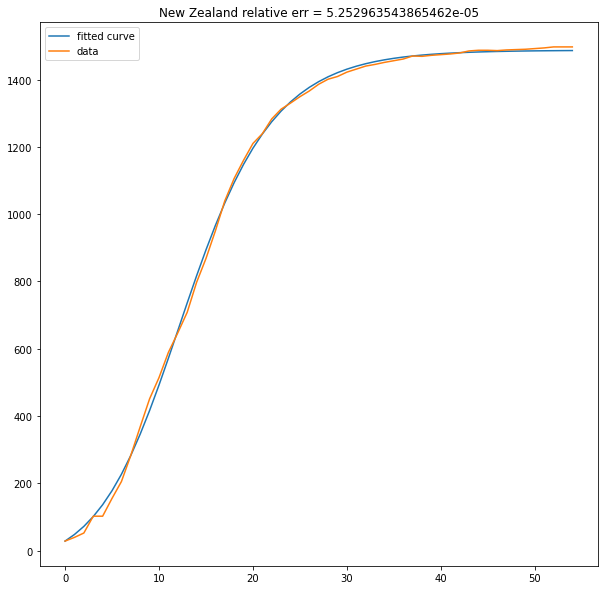

(136,) 150
minStart 7
TrainSize 128
[1.13150086 0.99993343 0.         0.         0.00681268] 0.0026072533291294528
129
0.004270096706291339


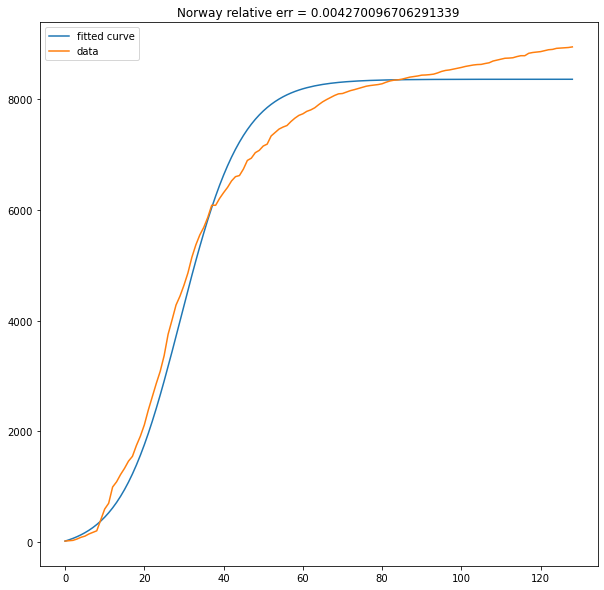

(208,) 150
minStart 10
TrainSize 197
[0.19503978 0.13090863 0.         0.         0.03104671] 0.0007619348450702572
198
0.00048311744323901583


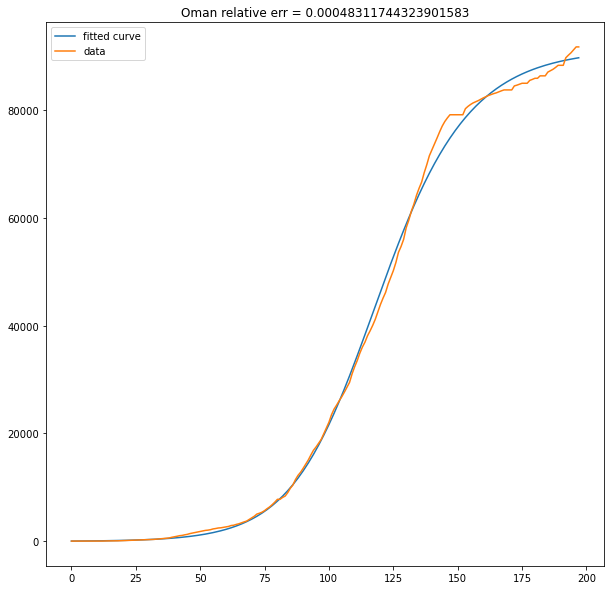

(249,) 150
minStart 15
TrainSize 233
[1.070612  0.9999407 0.        0.        0.0106871] 0.0018433537292560065
234
0.007131428984167106


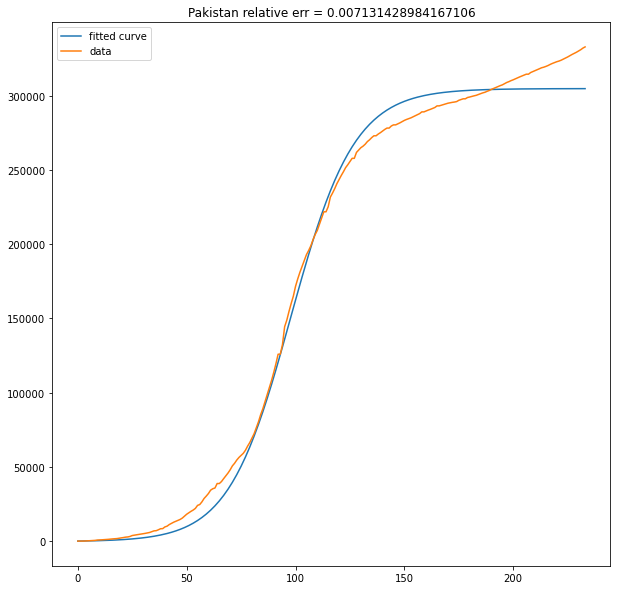

(306,) 150
minStart 8
TrainSize 297
[1.06396866 0.99999364 0.         0.         0.08244739] 0.004809073899416881
298
0.0045504354137374855


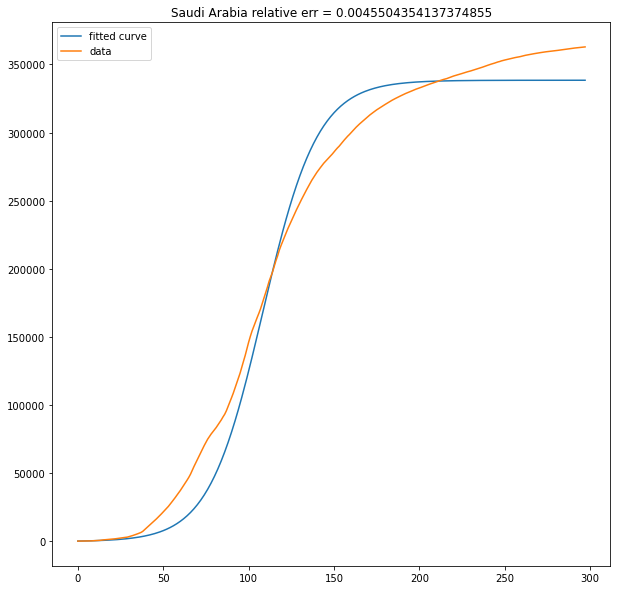

(117,) 150
minStart 16
TrainSize 100
[0.74573639 0.64337614 0.         0.         0.00654194] 0.0016650553880371282
101
0.007413086852345585


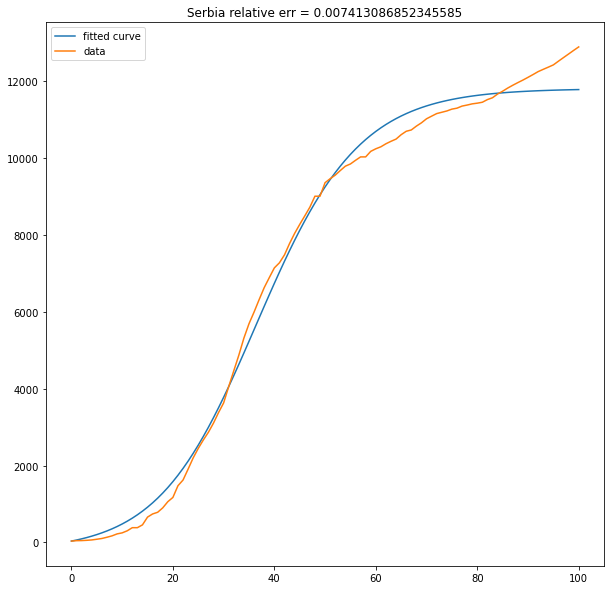

(183,) 150
minStart 9
TrainSize 173
[0.12841513 0.05288892 0.         0.         0.00916347] 0.0016662468156861134
174
0.003743079751512067


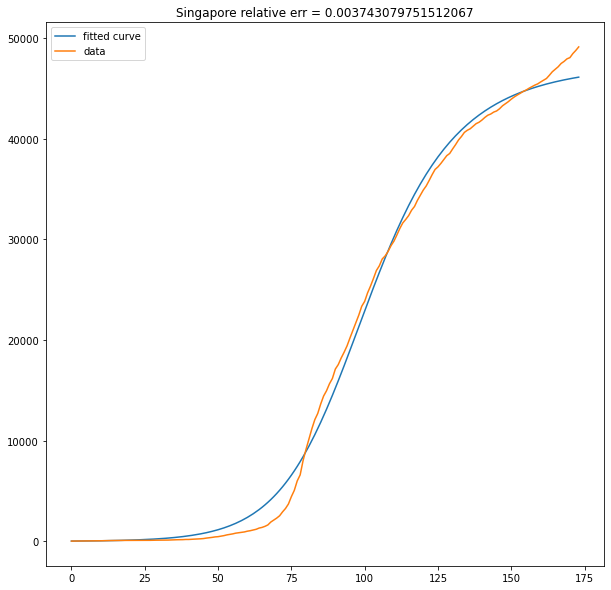

(86,) 150
minStart 6
TrainSize 79
[0.42989005 0.32064183 0.         0.         0.00060311] 0.0015877967873664434
80
9.929274917543138e-05


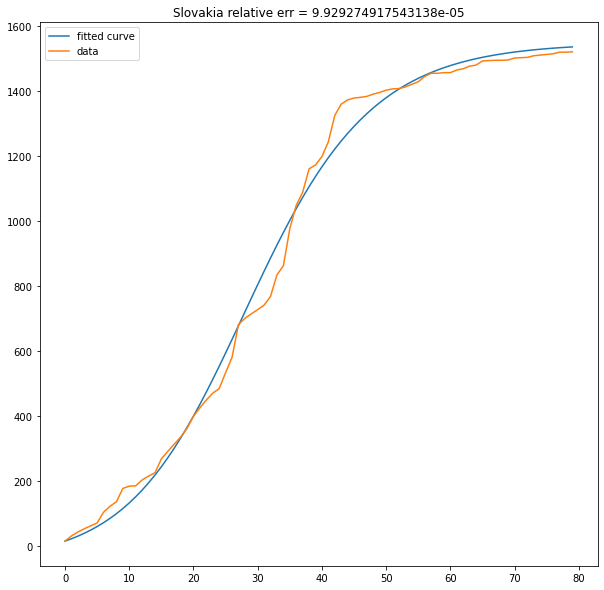

(108,) 150
minStart 35
TrainSize 72
[1.07876372 0.99093175 0.         0.         0.00405245] 0.00015605315214971548
73
2.6307433647988023e-06


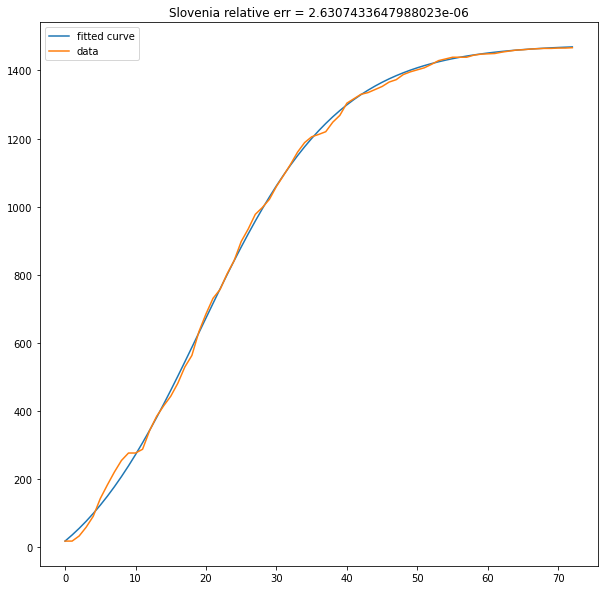

(141,) 150
minStart 27
TrainSize 113
[0.81315388 0.76603391 0.         0.         0.00161831] 0.000390968426889367
114
1.5384457652999157e-05


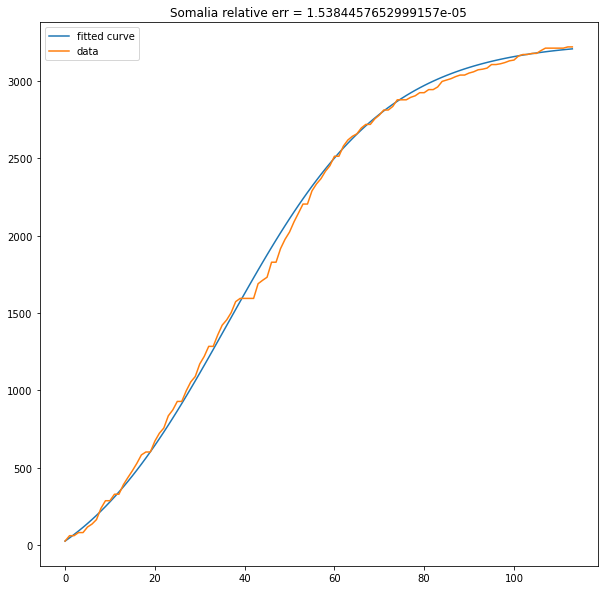

(289,) 150
minStart 34
TrainSize 254
[0.14892362 0.06971257 0.         0.         0.0142731 ] 0.0014377035801683322
255
0.0069468959426086975


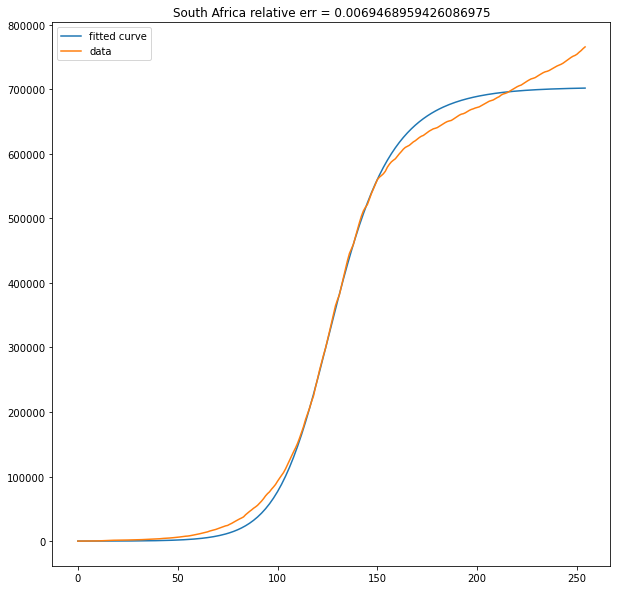

(91,) 150
minStart 12
TrainSize 78
[2.88337805e-01 8.73424142e-02 0.00000000e+00 0.00000000e+00
 2.08202159e-04] 0.0037209121505303797
79
0.002278626592345366


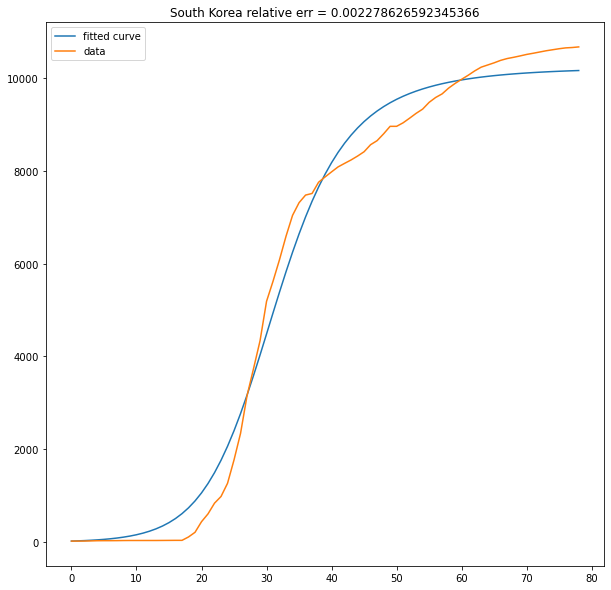

(93,) 150
minStart 25
TrainSize 67
[0.38168568 0.30796903 0.         0.         0.00053511] 0.007347188329223165
68
0.0011572340653698316


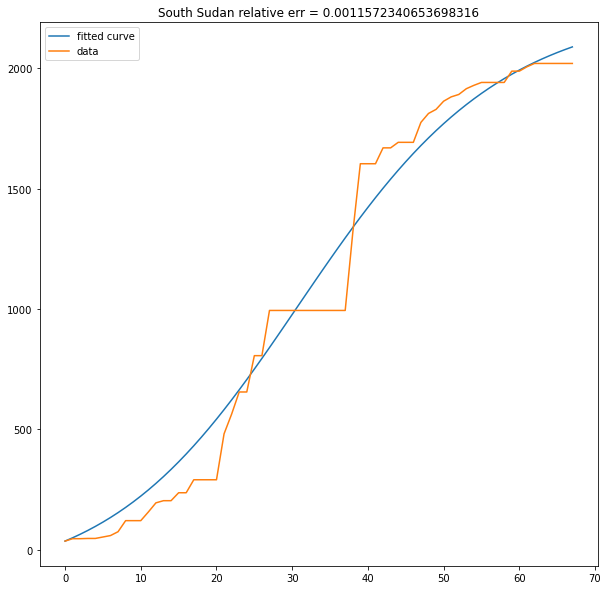

(169,) 150
minStart 27
TrainSize 141
[1.19565759 0.99994959 0.         0.         0.0163443 ] 0.005129773531261668
142
0.00880403875309231


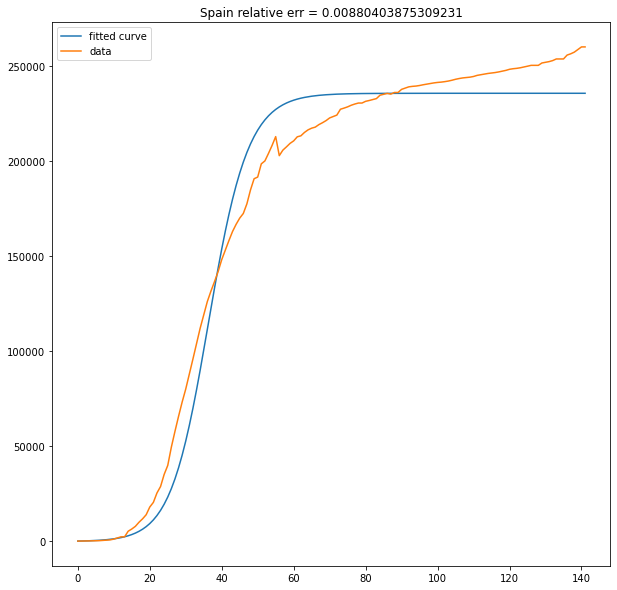

(105,) 150
minStart 23
TrainSize 81
[1.18946754 0.99999793 0.         0.         0.0112565 ] 0.0019798942392219646
82
0.0017819428025559636


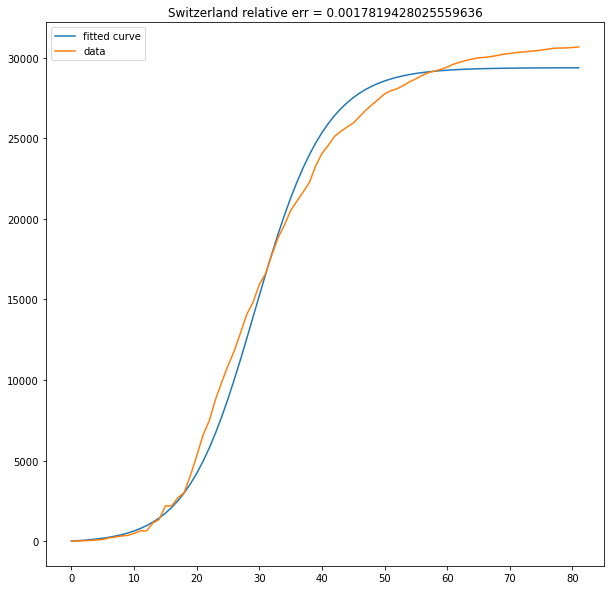

(133,) 150
minStart 26
TrainSize 106
[1.03287963e-01 2.50772013e-02 0.00000000e+00 0.00000000e+00
 5.68262819e-05] 0.02126648710443173
107
0.024278986525798307


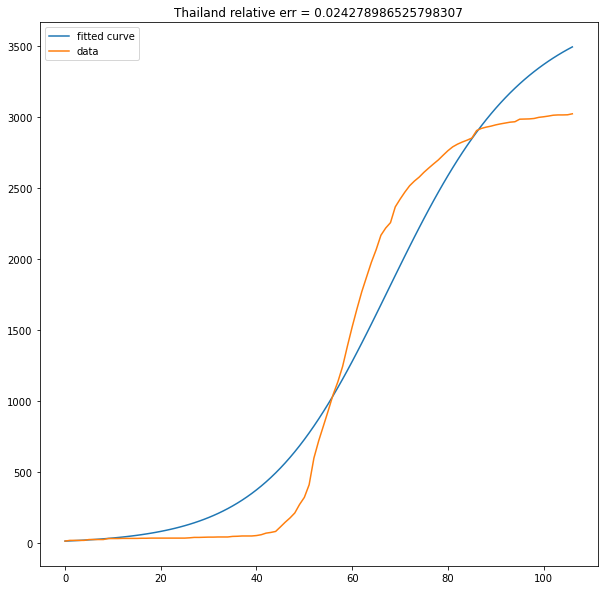

(82,) 150
minStart 11
TrainSize 70
[4.18877870e-01 2.79986087e-01 0.00000000e+00 0.00000000e+00
 1.51000608e-04] 0.0011645107937611036
71
9.88489447613887e-08


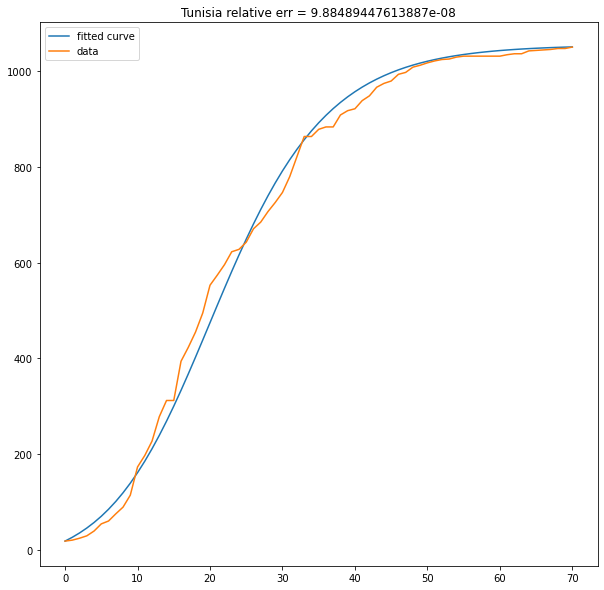

(208,) 150
minStart 5
TrainSize 202
[1.1008049  0.99999501 0.         0.         0.02396725] 0.006279179146614814
203
0.015550272460487024


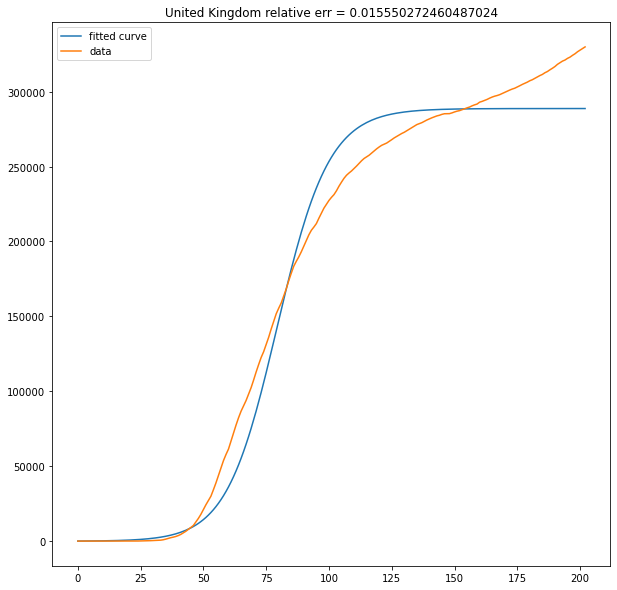

(236,) 150
minStart 28
TrainSize 207
[0.05704295 0.0081854  0.         0.         0.00059627] 0.0048942684912678175
208
4.456439916828811e-05


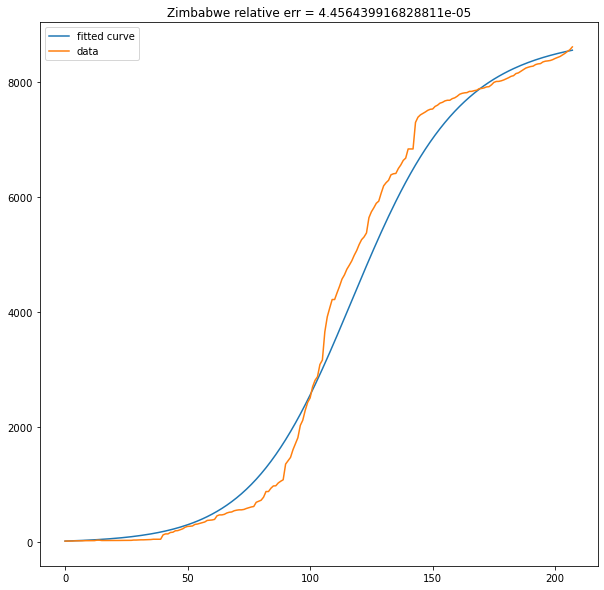

In [30]:
left = [0,1.0/14.0,0,0,0]
right = [4,1.0/3.0,0,0,0.1]
all_fit_err = []
all_fit_prs = []
for i in range(len(NamesList)):
#for i in range(1):
    if(PopulationSizes[i] < 1000000):
        #print(NamesList2[i] + " less then 1m")
        all_fit_prs.append((0,0,0,0,0))
        all_fit_err.append((0))
        continue
    if(CType[i] != 0):
        #print(NamesList2[i] + " not S-curve")
        all_fit_prs.append((0,0,0,0,0))
        all_fit_err.append((0))
        continue    
        
    use = 1
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                use = 1
                break
    if(use == 0):
        continue    
        
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)    
    Cases1 = Cases1[:int(newNCases[i])]
    #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSIR(Cases1,100,300,PopulationSizes[i],MidPoints[i],left,right) 
    curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSIR(Cases1,100,300,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
    all_fit_prs.append(curvePRS)
    print(curvePRS,Error)
    print(Cases1[minStart:].shape[0])
    tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
    tempy = getTotalInfCurveTSIR(curvePRS[0],
                                curvePRS[1],
                                curvePRS[2],
                                Cases1[minStart:].shape[0],
                                curvePRS[4]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                curvePRS[3]) 
    tempy = tempy[TrainSize:]
    er2 = RE(Cases1[minStart+TrainSize:],tempy)      
    #er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
    print(er2)
    all_fit_err.append((er2))
    #fig = plt.figure(figsize=(10, 10))
    #plt.title(NamesList2[i]+" relative err = "+str(er2))
    #plt.plot(tempx,tempy)
    #plt.plot(tempx,Cases1[minStart+TrainSize:])   
    #plt.legend(("fitted curve","data"))
    #plt.show()             
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
    tempy = getTotalInfCurveTSIR(curvePRS[0],
                                curvePRS[1],
                                curvePRS[2],
                                Cases1[minStart:].shape[0],
                                curvePRS[4]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                curvePRS[3])   
    fig = plt.figure(figsize=(10, 10))
    plt.title(NamesList2[i]+" relative err = "+str(er2))
    plt.plot(tempx,tempy)
    plt.plot(tempx,Cases1[minStart:])   
    plt.legend(("fitted curve","data"))
    plt.show()     
FITPRS_ = np.array(all_fit_prs)
FITERR_ = np.array(all_fit_err)
np.savetxt("owidFITPRS_SIR_RMSE_CUT19_TRAINTEST8.txt",FITPRS_)
np.savetxt("owidFITERR_SIR_RMSE_CUT19_TRAINTEST8.txt",FITERR_)

In [ ]:
for run in range(10):
    left = [0,1.0/14.0,0,0,0]
    right = [4,1.0/3.0,0.1,0,0.1]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            all_fit_prs.append((0,0,0,0,0))
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            all_fit_prs.append((0,0,0,0,0))
            all_fit_err.append((0))
            continue    

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]
        
        PRS_noGamma = np.loadtxt("owidFITPRS_SIR_RMSE_CUT19_TRAINTEST8_"+str(run+1)+".txt")    
        print(PRS_noGamma[i])
        
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSIR(Cases1,100,300,PopulationSizes[i],MidPoints[i],left,right) 
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSIR(Cases1,100,300,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSIR_FineTune(Cases1,100,300,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i],PRS_noGamma[i])
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[4]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[3]) 
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        #er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempy = getTotalInfCurveTSIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[4]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[3]) 
        fig = plt.figure(figsize=(10, 10))
        plt.title(NamesList2[i]+" relative err = "+str(er2))
        plt.plot(tempx,tempy)
        plt.plot(tempx,Cases1[minStart:])   
        plt.legend(("fitted curve","data"))
        plt.show()     
    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_SIRG_RMSE_CUT19_TRAINTEST9_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_SIRG_RMSE_CUT19_TRAINTEST9_"+str(run+1)+".txt",FITERR_)

[0.26103525 0.17871311 0.         0.         0.00173415]
FINETUNE
(189,) 150
minStart 18
TrainSize 170
[0.26103525 0.17871311 0.         0.         0.00173415]


In [50]:
def GetDEFitPRS_TSEIR(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr):
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 7
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and   
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        #getTotalInfCurve(0.1,0.1,0.5,0.0005,0.0000,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSEIR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Pop[i,3],
                                    Pop[i,4],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,6]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,5])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSEIR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        xnew[3],
                                        xnew[4],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[6]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[5])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

In [24]:
def GetDEFitPRS_TSEIR_FineTune(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr,PRS_noGamma):
    print("FINETUNE")
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 7
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    #while(Cases1.shape[0] < Gap):
    #    Gap = np.floor(Cases1.shape[0]*0.9)      
    #totalI > np.sum(Cases1)*0.0001 and   
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
        if(i == 0):
            for j in range(D):
                Pop[i][j] = PRS_noGamma[j]
            print(Pop[i])
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        #getTotalInfCurve(0.1,0.1,0.5,0.0005,0.0000,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSEIR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Pop[i,3],
                                    Pop[i,4],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,6]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,5])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSEIR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        xnew[3],
                                        xnew[4],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[6]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[5])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

(189,) 150
minStart 18
TrainSize 170
[0.         1.00232526 0.07199987 0.33105866 0.         0.
 0.00102631] 0.00017831847774114375
171
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


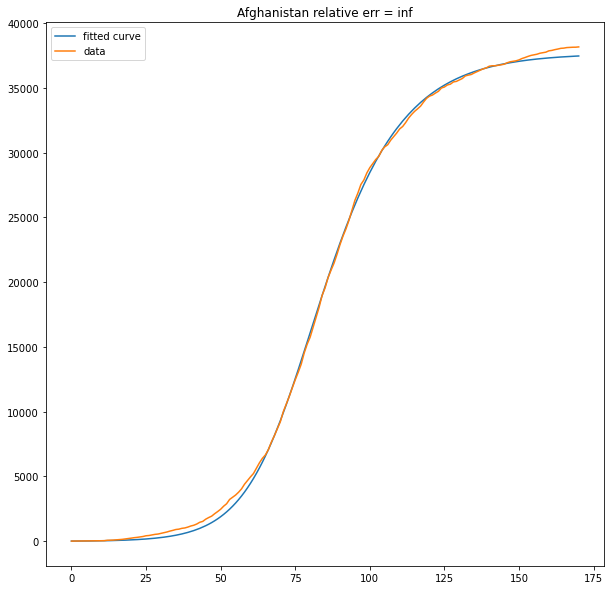

(207,) 150
minStart 14
TrainSize 192
[0.         0.80664719 0.07178132 0.32957729 0.         0.
 0.01710623] 0.0015690587064947806
193
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


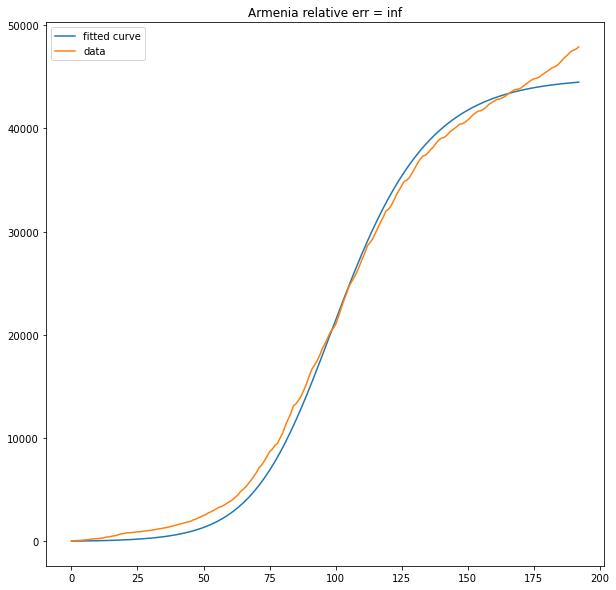

(116,) 150
minStart 6
TrainSize 109
[0.00000000e+00 3.01793858e-01 1.78421431e-01 7.18680214e-02
 0.00000000e+00 0.00000000e+00 2.88633042e-04] 0.009836294616097425
110
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


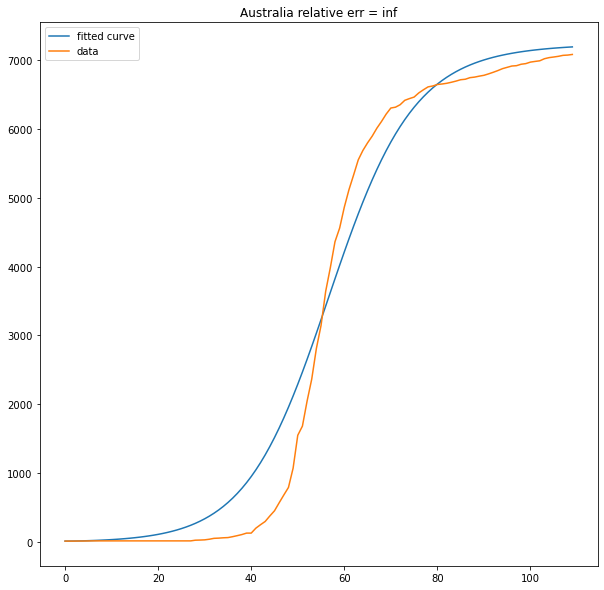

(129,) 150
minStart 6
TrainSize 122
[0.00000000e+00 2.21138936e+00 7.14287759e-02 7.14423865e-02
 0.00000000e+00 0.00000000e+00 1.86629940e-03] 0.0007504554835895165
123
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


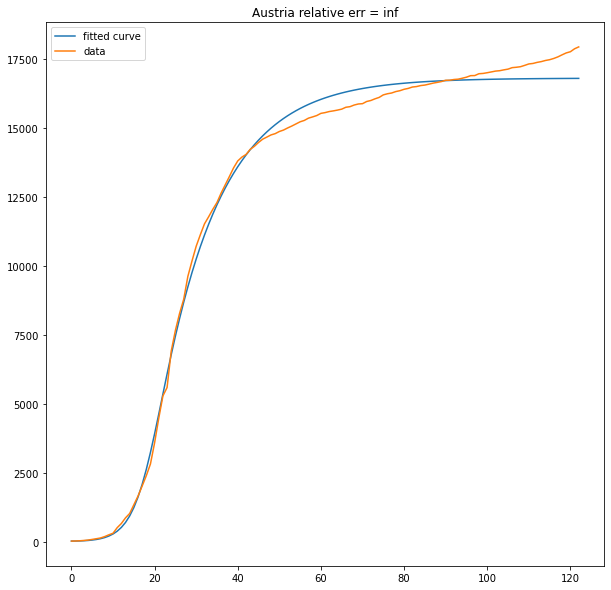

(223,) 150
minStart 14
TrainSize 208
[0.         0.4184262  0.33069884 0.30145616 0.         0.
 0.00775611] 0.0011162552026941133
209
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


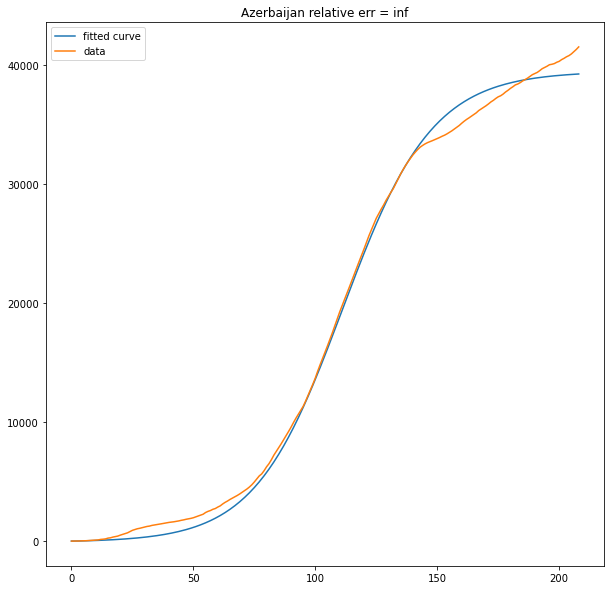

(210,) 150
minStart 15
TrainSize 194
[0.         1.19624346 0.07142875 0.33332852 0.         0.
 0.00753442] 0.00479785731887508
195
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


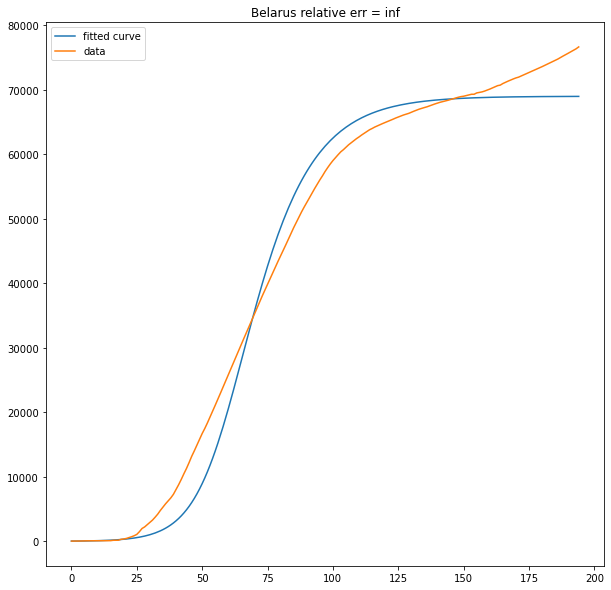

(171,) 150
minStart 29
TrainSize 141
[0.         2.37317261 0.07142857 0.3333333  0.         0.
 0.00517027] 0.002430758278767051
142
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


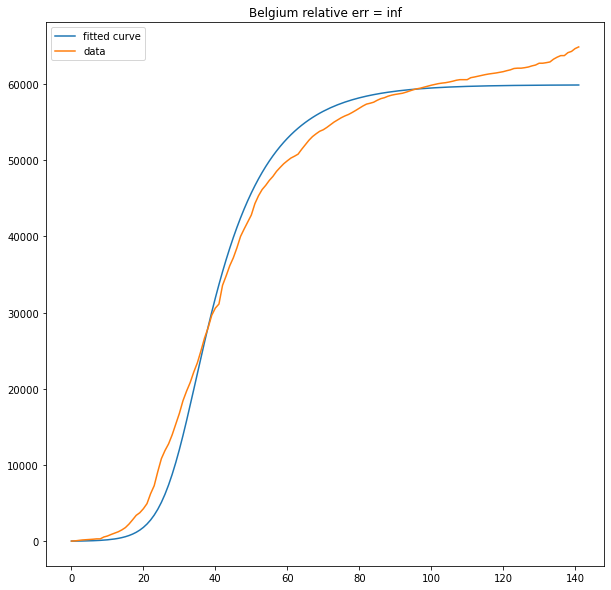

(280,) 150
minStart 5
TrainSize 274
[0.         0.80323278 0.07146716 0.33330878 0.         0.
 0.0137092 ] 0.0027445336425149717
275
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


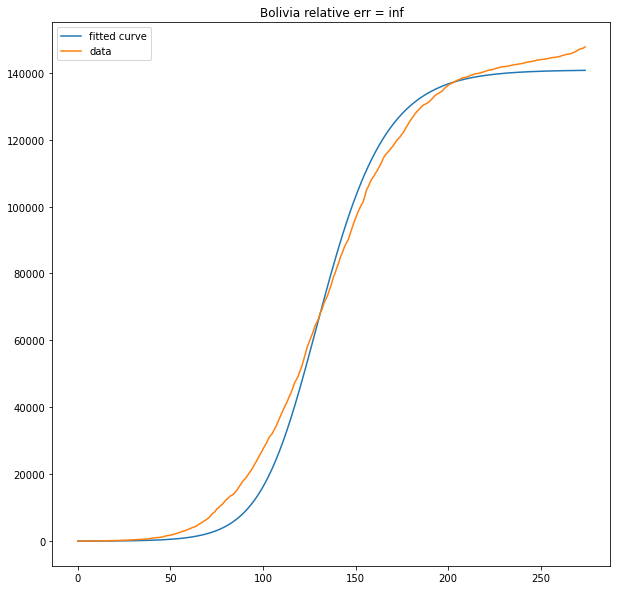

(94,) 150
minStart 8
TrainSize 85
[0.00000000e+00 2.22454700e+00 7.17468558e-02 3.18521583e-01
 0.00000000e+00 0.00000000e+00 3.90474313e-05] 0.0061695263327561575
86
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


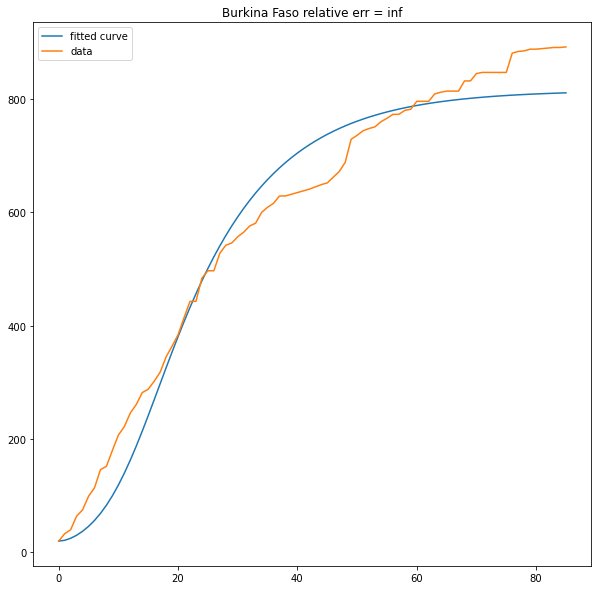

(196,) 150
minStart 52
TrainSize 143
[0.         0.27880868 0.08862322 0.33333309 0.         0.
 0.09977166] 0.04766342371410673
144
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


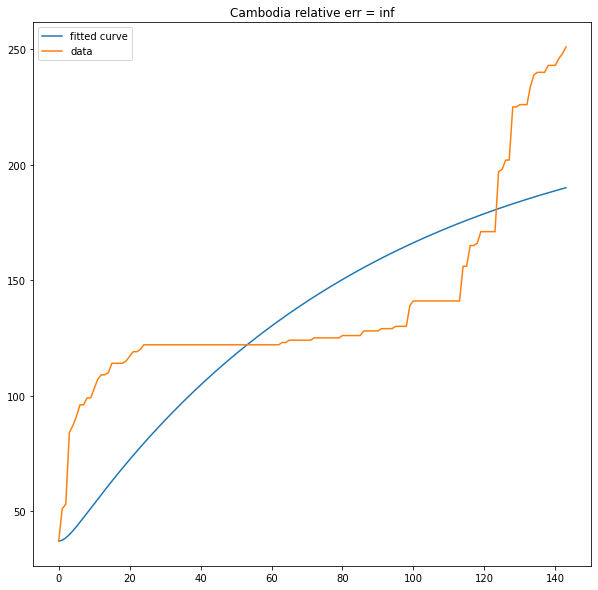

(213,) 150
minStart 13
TrainSize 199
[0.00000000e+00 8.92197321e-01 7.14491656e-02 3.31158373e-01
 0.00000000e+00 0.00000000e+00 7.96534121e-04] 0.005351889205257174
200
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


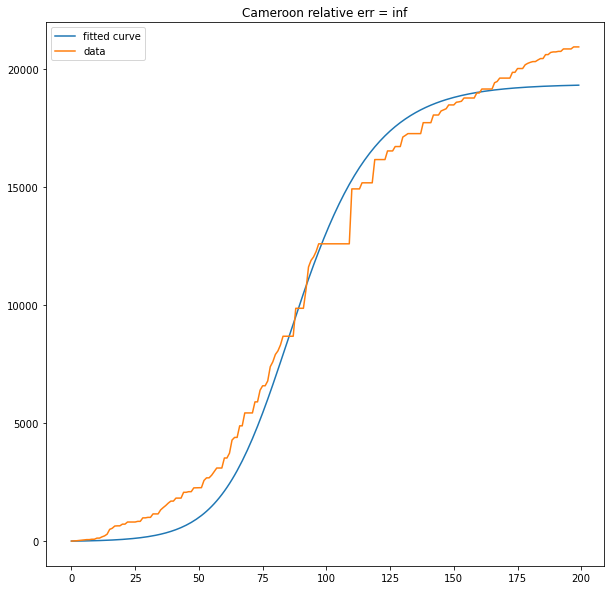

(218,) 150
minStart 36
TrainSize 181
[0.         1.46835569 0.07142857 0.33333241 0.         0.
 0.00299723] 0.010000247084455984
182
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


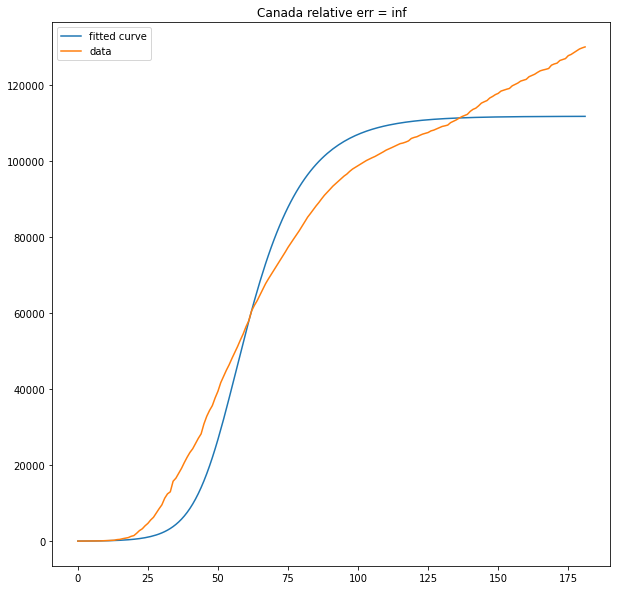

(293,) 150
minStart 9
TrainSize 283
[0.         1.01579595 0.07142857 0.3333333  0.         0.
 0.02578524] 0.018056660787457646
284
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


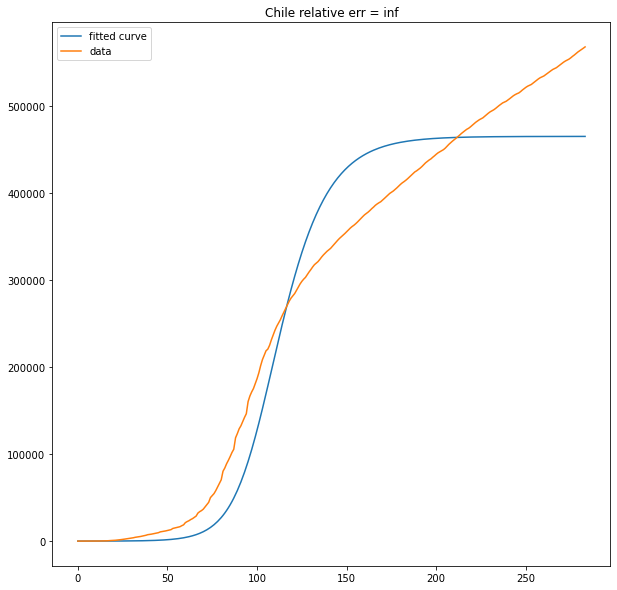

(275,) 150
minStart 5
TrainSize 269
[0.         0.40199584 0.24958517 0.30631349 0.         0.
 0.06440507] 0.002150502306025878
270
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


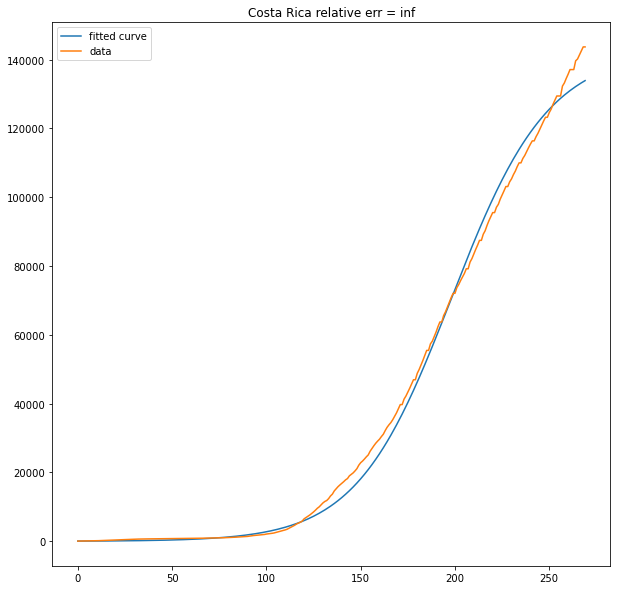

(287,) 150
minStart 10
TrainSize 276
[0.         0.76879782 0.07256206 0.32900853 0.         0.
 0.00089254] 0.0027966268839657933
277
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


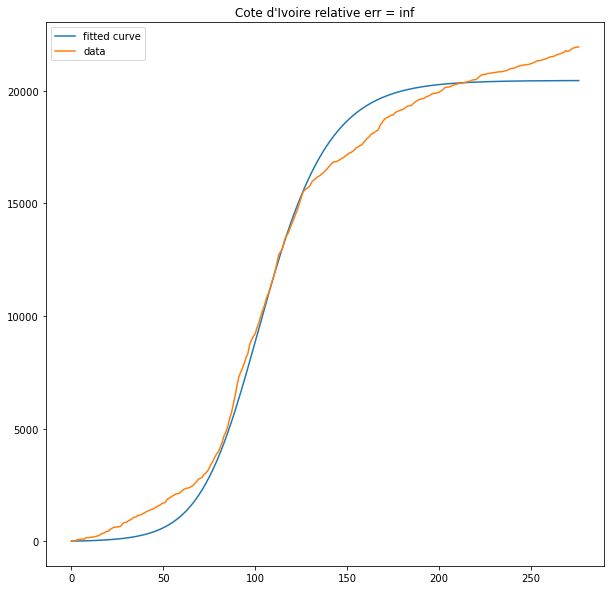

(91,) 150
minStart 17
TrainSize 73
[0.00000000e+00 2.64960414e+00 7.14289323e-02 3.33319273e-01
 0.00000000e+00 0.00000000e+00 5.50490170e-04] 0.00035147671098607615
74
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


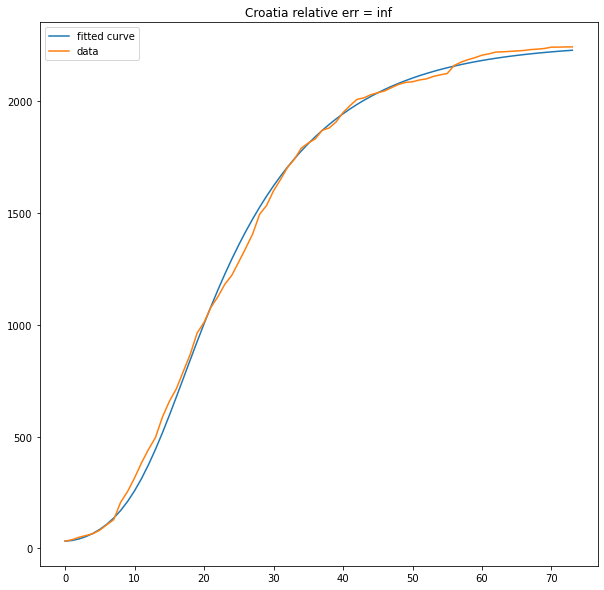

(85,) 150
minStart 9
TrainSize 75
[0.00000000e+00 1.90575323e+00 7.14285970e-02 3.33257497e-01
 0.00000000e+00 0.00000000e+00 1.80408663e-04] 0.0009732173489382656
76
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


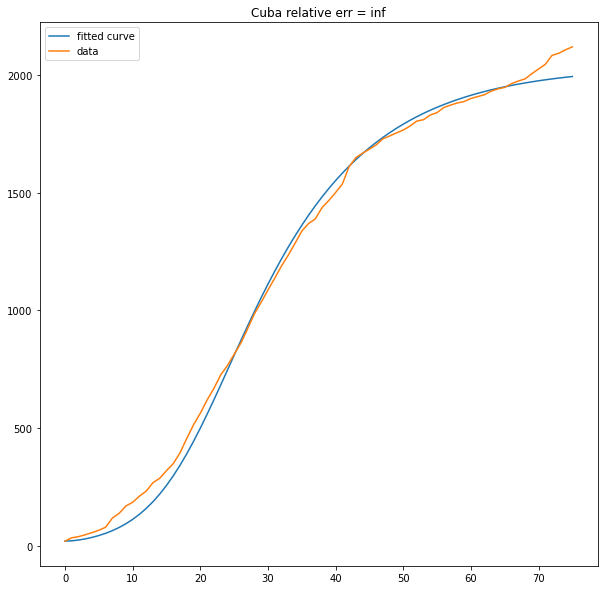

(117,) 150
minStart 9
TrainSize 107
[0.00000000e+00 2.54445487e+00 7.14285951e-02 3.33333282e-01
 0.00000000e+00 0.00000000e+00 8.49999846e-04] 0.00550656442363041
108
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


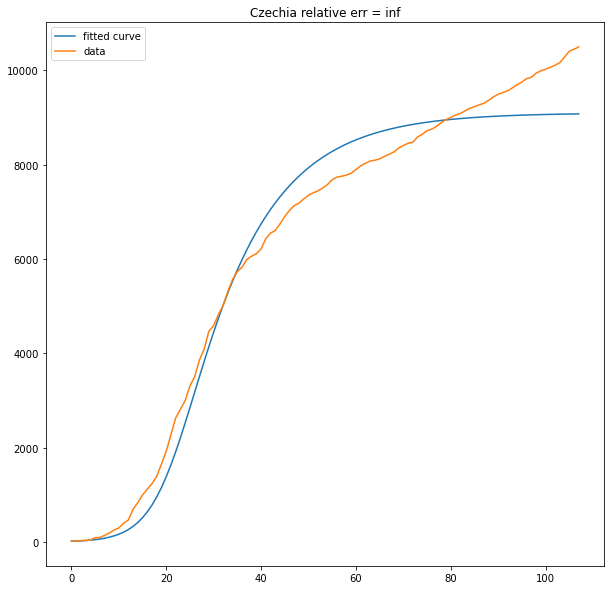

(234,) 150
minStart 10
TrainSize 223
[0.00000000e+00 7.27946096e-01 7.50790075e-02 3.18138388e-01
 0.00000000e+00 0.00000000e+00 1.35887620e-04] 0.0014556773126417274
224
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


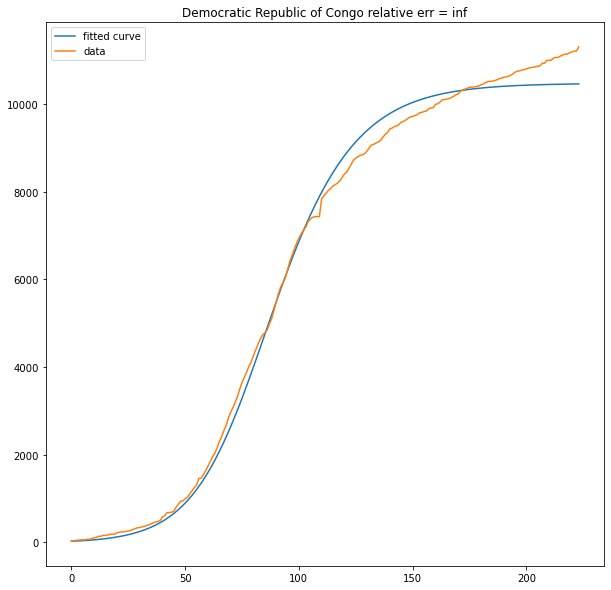

(277,) 150
minStart 23
TrainSize 253
[0.         0.81625415 0.07176565 0.33016072 0.         0.
 0.00114594] 0.0007529542886364098
254
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


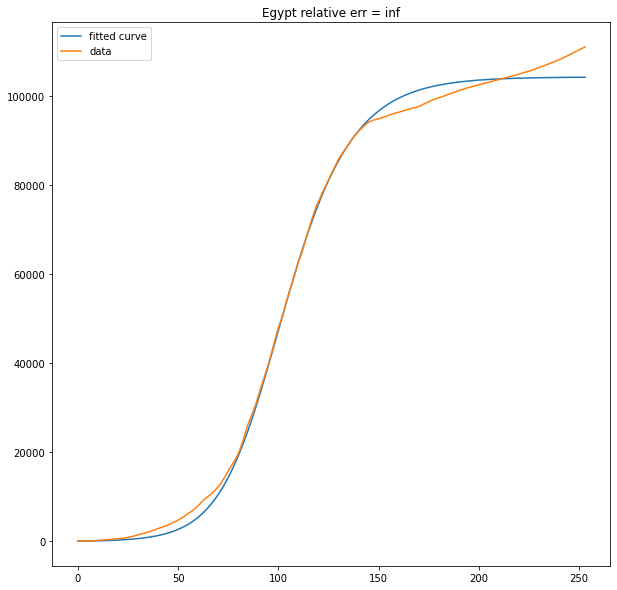

(209,) 150
minStart 8
TrainSize 200
[0.         0.44347071 0.28976268 0.317975   0.         0.
 0.00900492] 0.001101848071207643
201
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


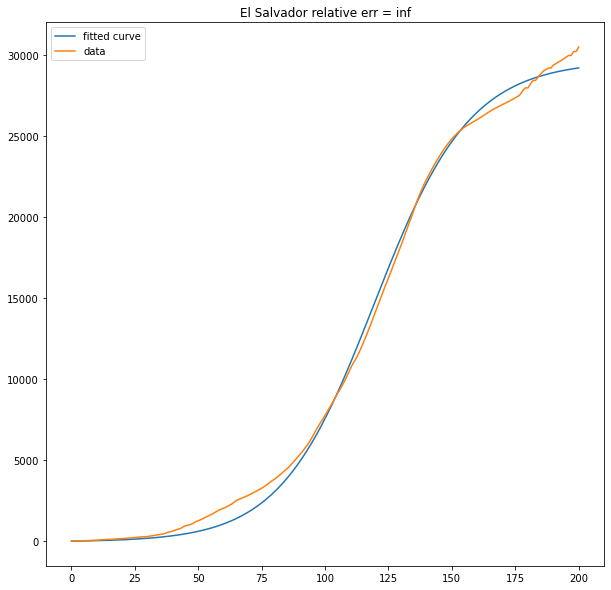

(114,) 150
minStart 12
TrainSize 101


C:\ProgramData\Anaconda3\lib\site-packages\scipy\integrate\odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


[0.00000000e+00 2.66782821e+00 7.14285718e-02 3.33333131e-01
 0.00000000e+00 0.00000000e+00 1.39595959e-03] 0.002069853939256324
102
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


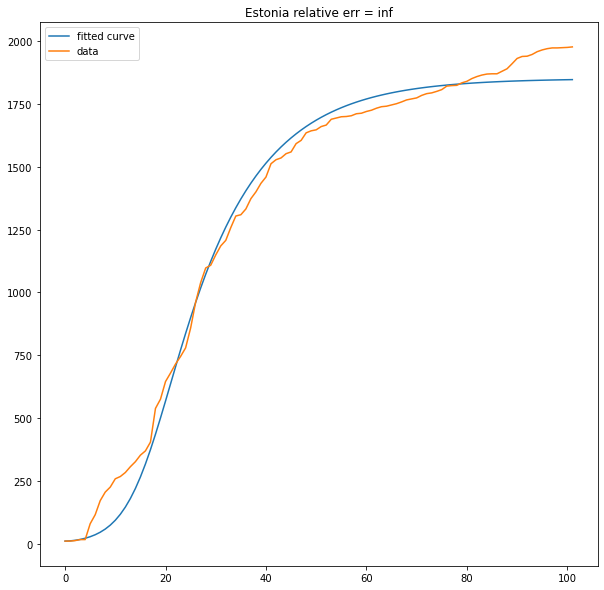

(161,) 150
minStart 38
TrainSize 122
[0.00000000e+00 1.69814216e+00 7.14289545e-02 3.33322202e-01
 0.00000000e+00 0.00000000e+00 1.26469015e-03] 0.004352346317165752
123
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


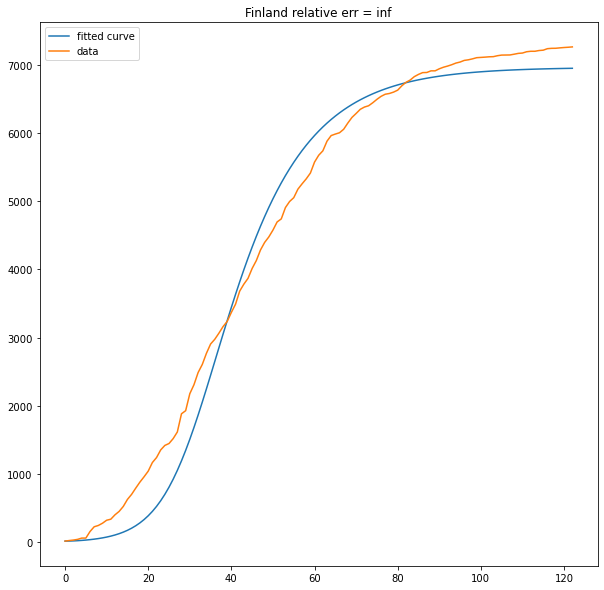

(118,) 150
minStart 35
TrainSize 82
[0.         0.83830689 0.29779293 0.3298727  0.         0.
 0.00293593] 0.01033789675832006
83
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


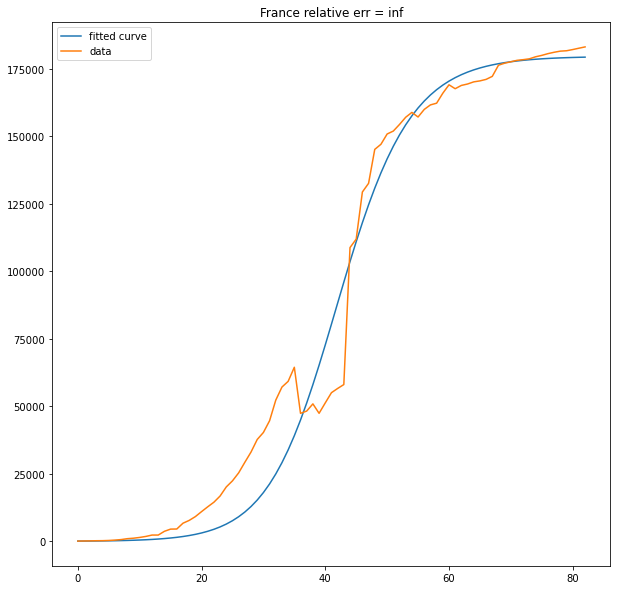

(189,) 150
minStart 7
TrainSize 181
[0.         1.65591223 0.07142858 0.33333093 0.         0.
 0.00230494] 0.0021112650857447006
182
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


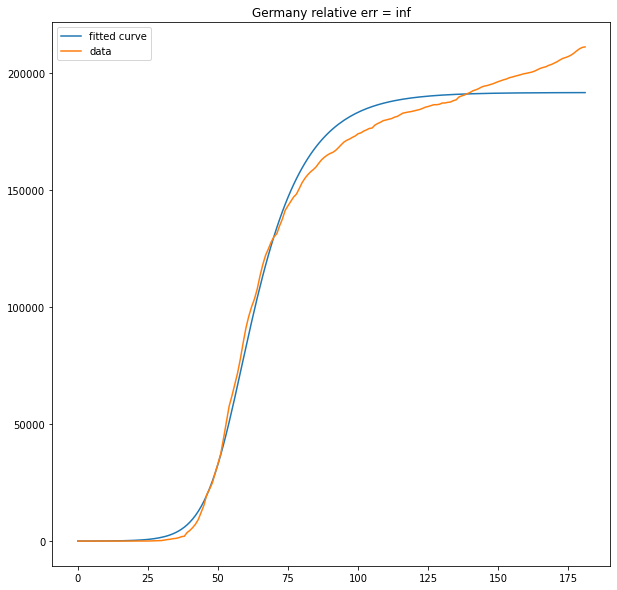

(110,) 150
minStart 14
TrainSize 95
[0.00000000e+00 1.94238496e+00 7.14336090e-02 3.33122716e-01
 0.00000000e+00 0.00000000e+00 2.76334161e-04] 0.0012164689436427187
96
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


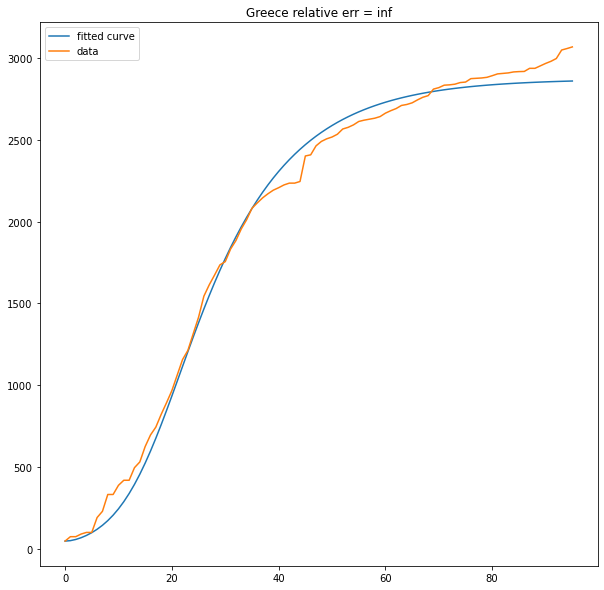

(226,) 150
minStart 12
TrainSize 213
[0.00000000e+00 8.60680892e-01 7.19040232e-02 3.25741619e-01
 0.00000000e+00 0.00000000e+00 8.19306368e-04] 0.002299419920947985
214
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


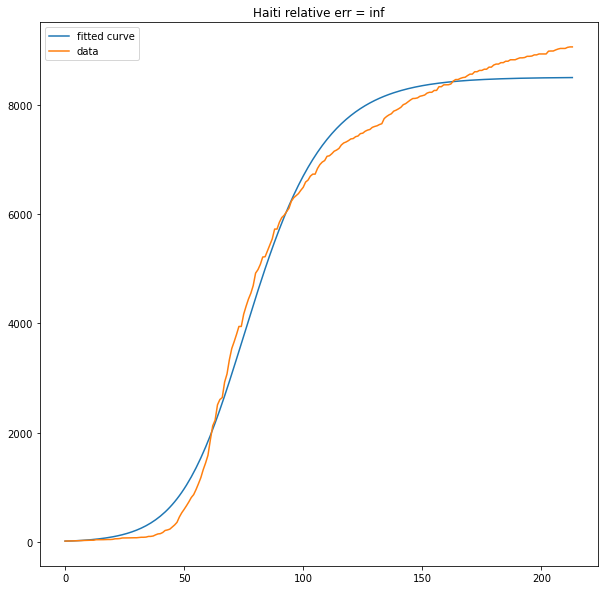

(156,) 150
minStart 6
TrainSize 149
[0.00000000e+00 1.59806535e+00 7.14342122e-02 3.33150222e-01
 0.00000000e+00 0.00000000e+00 4.35272487e-04] 0.002896979905687606
150
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


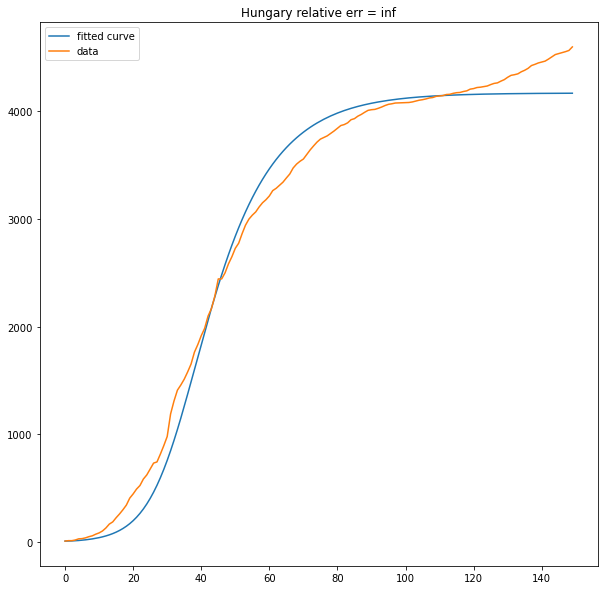

(407,) 150
minStart 36
TrainSize 370
[0.         0.74775351 0.07211637 0.33093504 0.         0.
 0.00862549] 0.008916789344661004
371
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


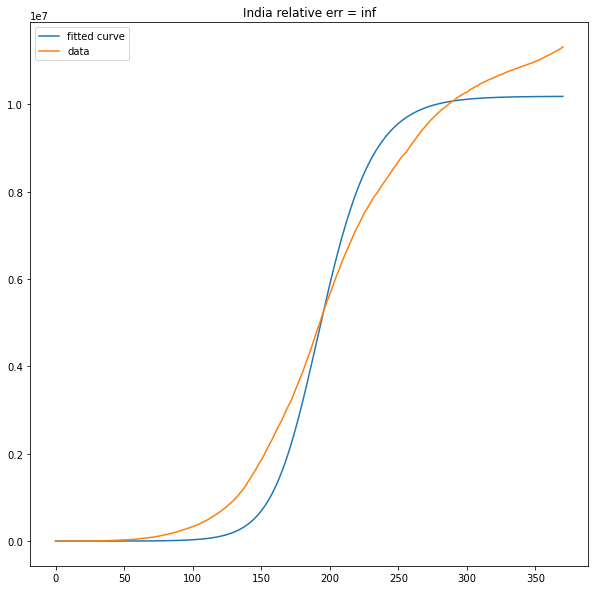

(351,) 150
minStart 7
TrainSize 343
[0.         0.63843412 0.07173992 0.3281184  0.         0.
 0.01858249] 0.00626295023027432
344
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


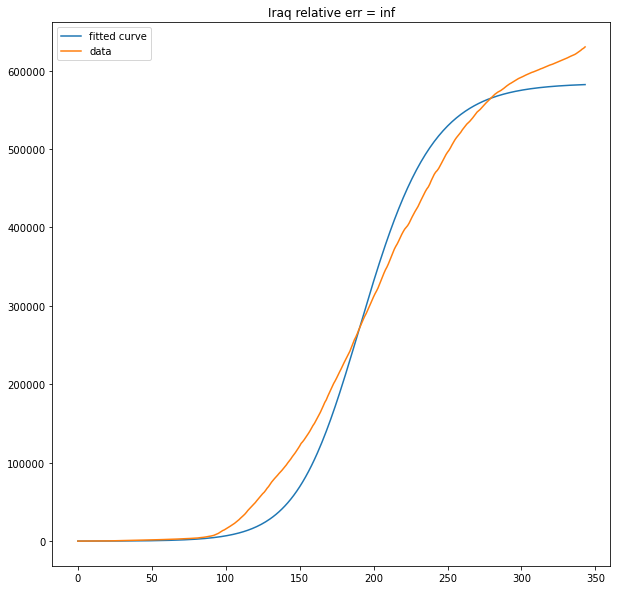

(104,) 150
minStart 12
TrainSize 91
[0.         2.17787181 0.07143043 0.33332827 0.         0.
 0.00515728] 0.0007555108421052958
92
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


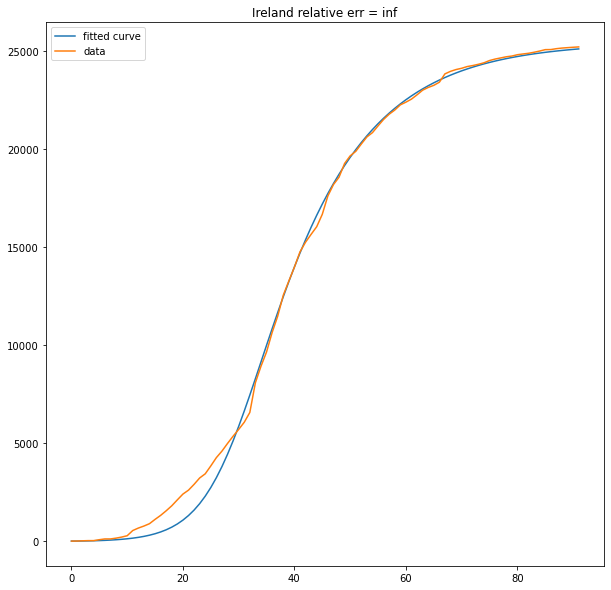

(93,) 150
minStart 13
TrainSize 79
[0.00000000e+00 2.76873925e+00 7.14287590e-02 3.33327044e-01
 0.00000000e+00 0.00000000e+00 1.97723359e-03] 0.00027355486828914373
80
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


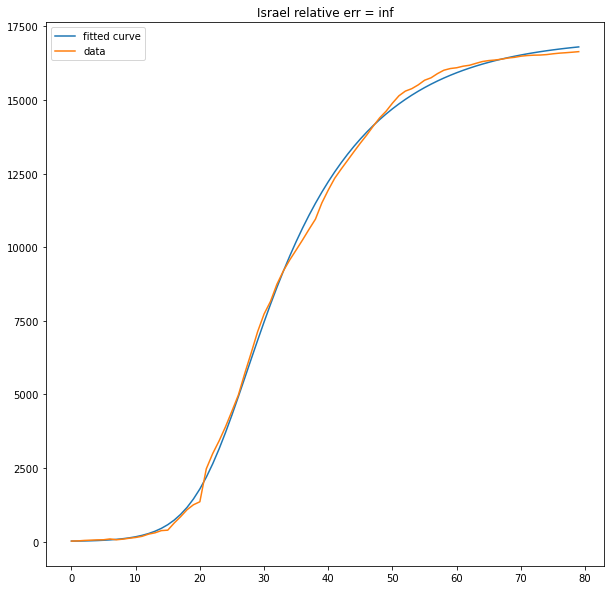

(202,) 150
minStart 23
TrainSize 178
[0.         2.1059006  0.07142857 0.33333331 0.         0.
 0.00393433] 0.0028455982666689837
179
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


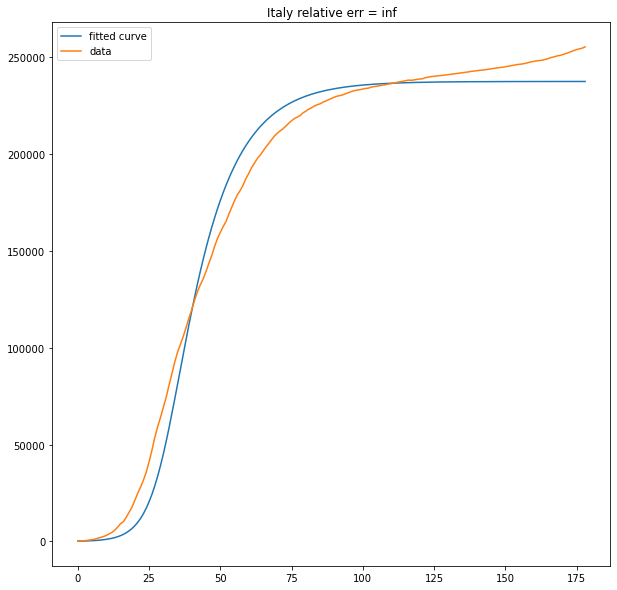

(160,) 150
minStart 10
TrainSize 149
[0.00000000e+00 2.57037423e-01 1.55268278e-01 7.18186497e-02
 0.00000000e+00 0.00000000e+00 1.43459966e-04] 0.0021775538877636096
150
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


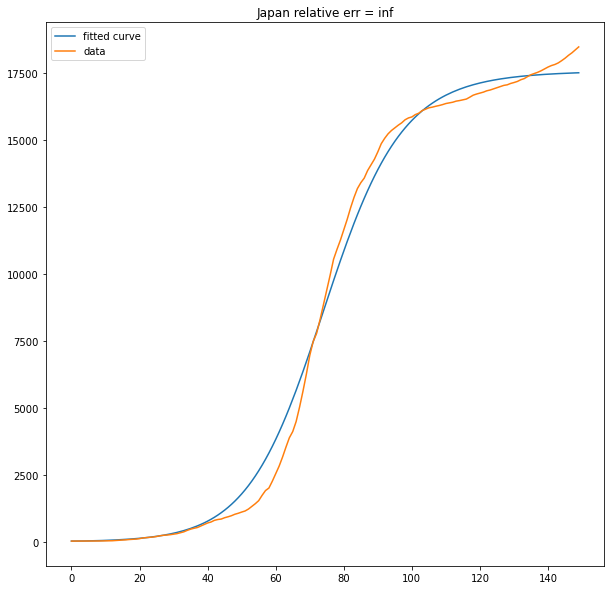

(121,) 150
minStart 15
TrainSize 105
[0.00000000e+00 2.17989795e+00 7.14285958e-02 3.33331812e-01
 0.00000000e+00 0.00000000e+00 5.50192219e-04] 0.005761493644132231
106
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


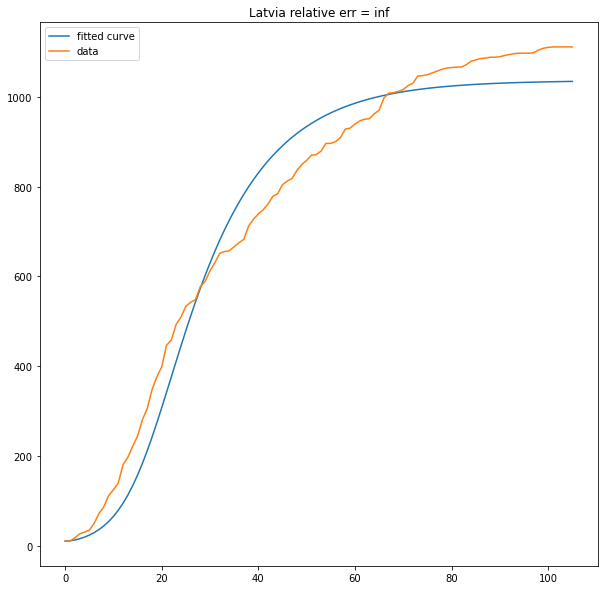

(398,) 150
minStart 11
TrainSize 386
[0.         0.33719542 0.07143467 0.20255403 0.         0.
 0.09999208] 0.006793343898570177
387
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


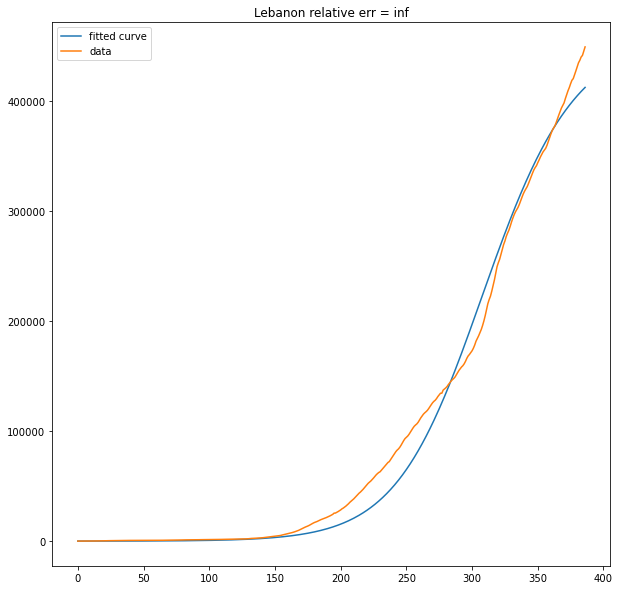

(173,) 150
minStart 21
TrainSize 151
[0.         0.26730509 0.15649549 0.15598623 0.         0.
 0.00039264] 0.0025787721730676444
152
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


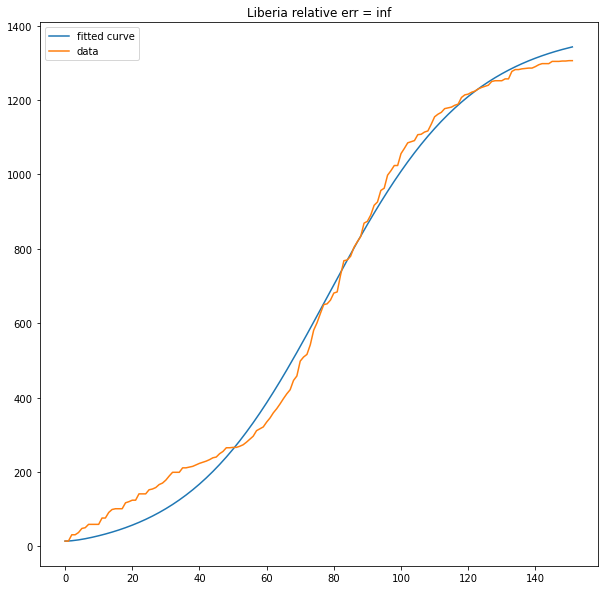

(141,) 150
minStart 18
TrainSize 122


C:\ProgramData\Anaconda3\lib\site-packages\scipy\integrate\odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


[0.00000000e+00 2.40618562e+00 7.14285744e-02 3.33332199e-01
 0.00000000e+00 0.00000000e+00 6.29386901e-04] 0.0055094066016495614
123
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


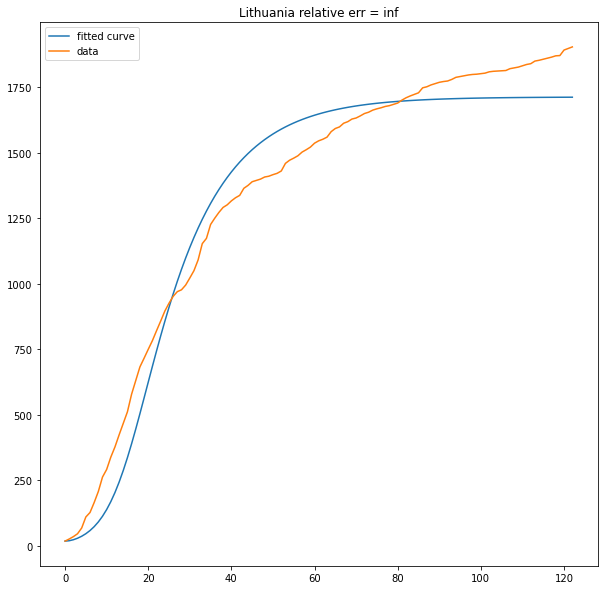

(165,) 150
minStart 4
TrainSize 160
[0.00000000e+00 4.67951504e-01 3.08721543e-01 3.32623516e-01
 0.00000000e+00 0.00000000e+00 2.54098103e-04] 0.002077309182964153
161
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


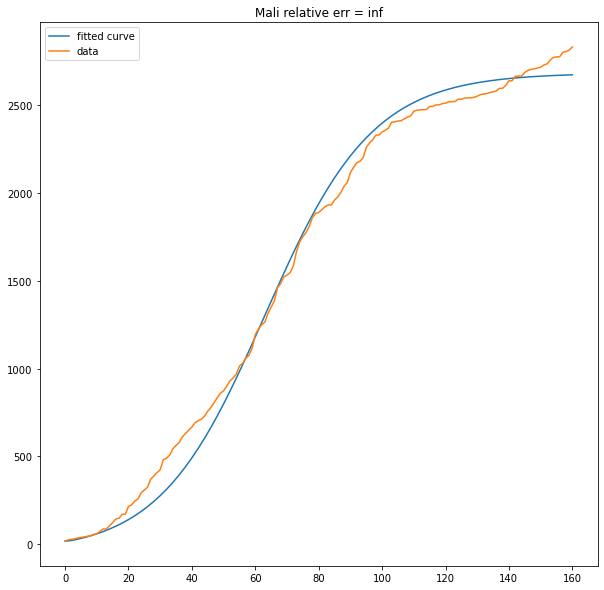

(207,) 150
minStart 62
TrainSize 144
[0.         1.45519621 0.07142918 0.33333007 0.         0.
 0.00153565] 0.0023116610887129736
145
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


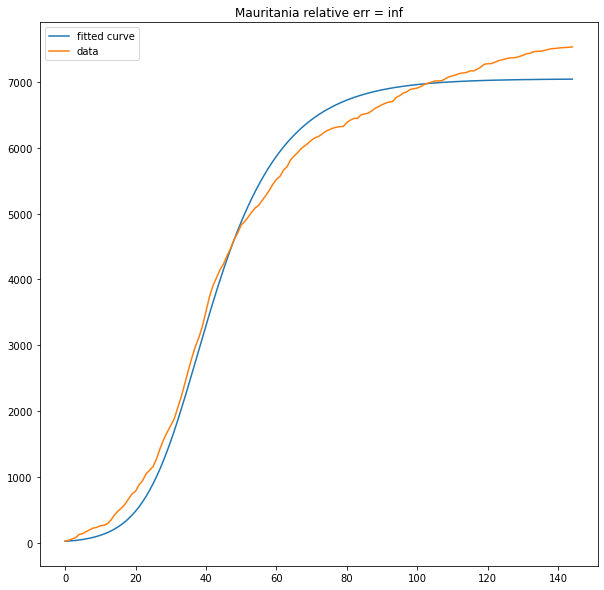

(227,) 150
minStart 4
TrainSize 222


C:\ProgramData\Anaconda3\lib\site-packages\scipy\integrate\odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


[0.00000000e+00 2.25459766e+00 1.07671164e-01 2.08477615e-01
 0.00000000e+00 0.00000000e+00 2.79651008e-04] 0.0054700453528672595
223
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


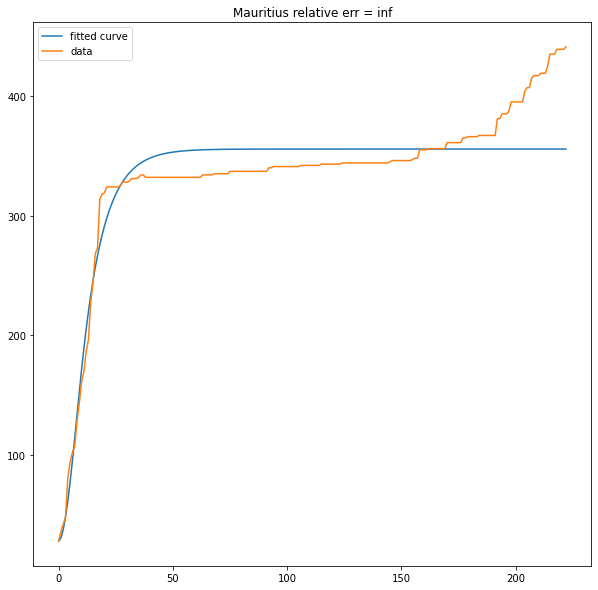

(155,) 150
minStart 7
TrainSize 147
[0.         2.34367096 0.07142857 0.33333333 0.         0.
 0.00284162] 0.003718765707516428
148
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


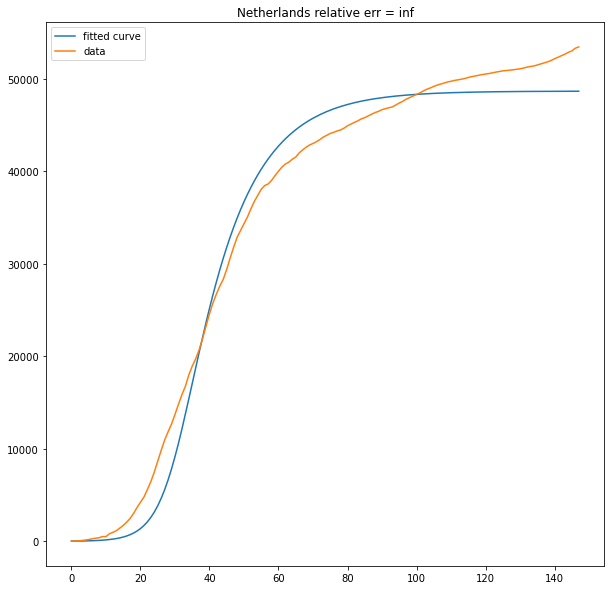

(75,) 150
minStart 20
TrainSize 54
[0.00000000e+00 2.91390730e+00 1.27208481e-01 3.33331485e-01
 0.00000000e+00 0.00000000e+00 3.11955733e-04] 0.0003161824257040219
55
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


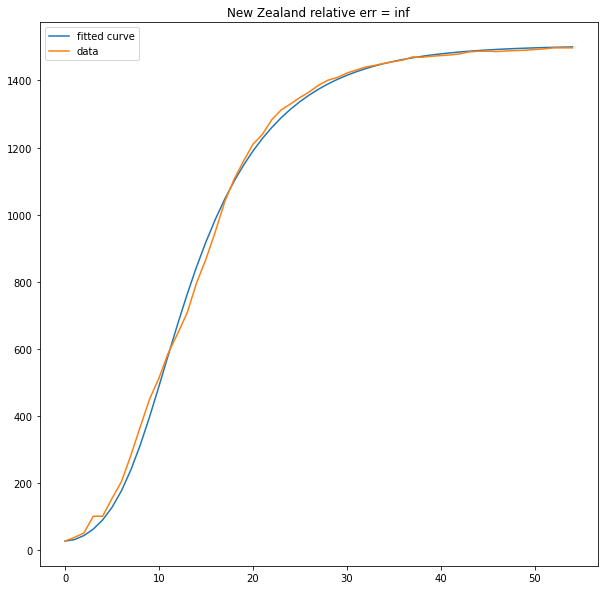

(136,) 150
minStart 7
TrainSize 128
[0.00000000e+00 2.80238724e+00 7.14285760e-02 3.33330696e-01
 0.00000000e+00 0.00000000e+00 1.56069001e-03] 0.0016233058062197405
129
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


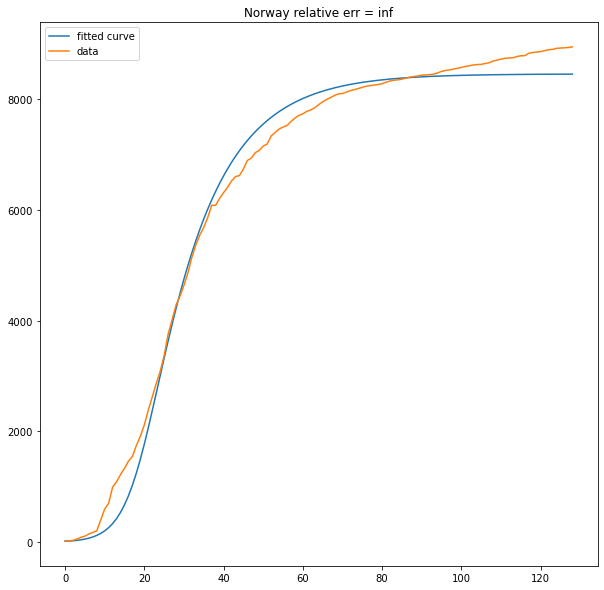

(208,) 150
minStart 10
TrainSize 197
[0.         0.49895739 0.24507079 0.32998785 0.         0.
 0.0295459 ] 0.0006325110410994525
198
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


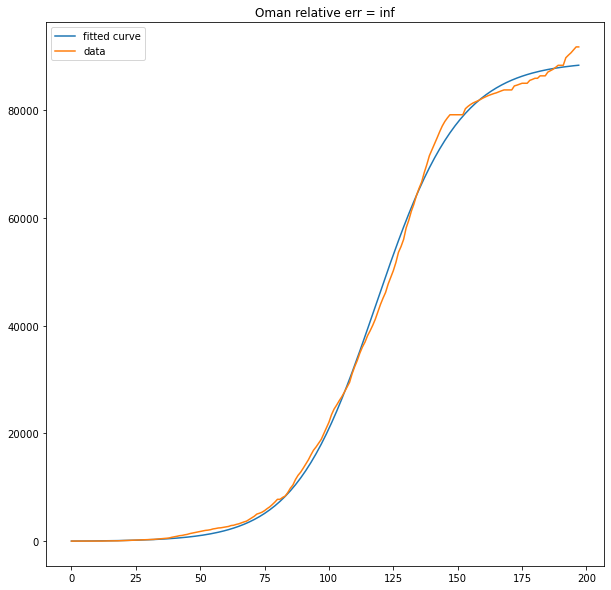

(249,) 150
minStart 15
TrainSize 233
[0.         1.04806547 0.07143512 0.33265877 0.         0.
 0.00145089] 0.0028178686317611714
234
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


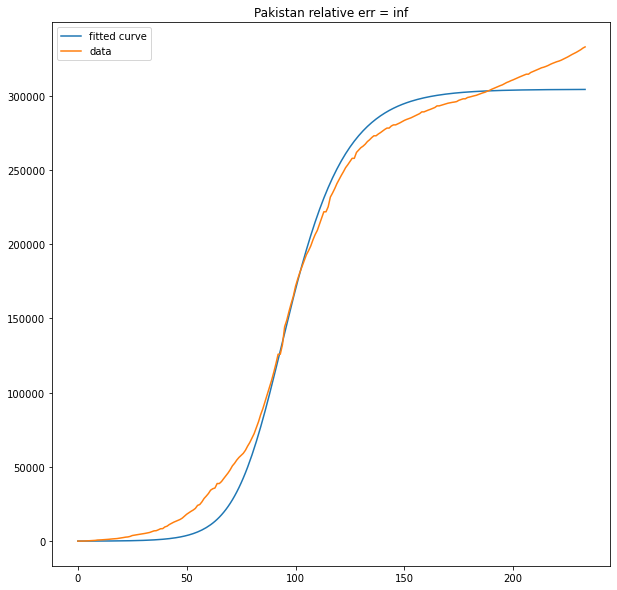

(306,) 150
minStart 8
TrainSize 297
[0.         0.97488701 0.07143008 0.33324656 0.         0.
 0.01033209] 0.0069836515761121576
298
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


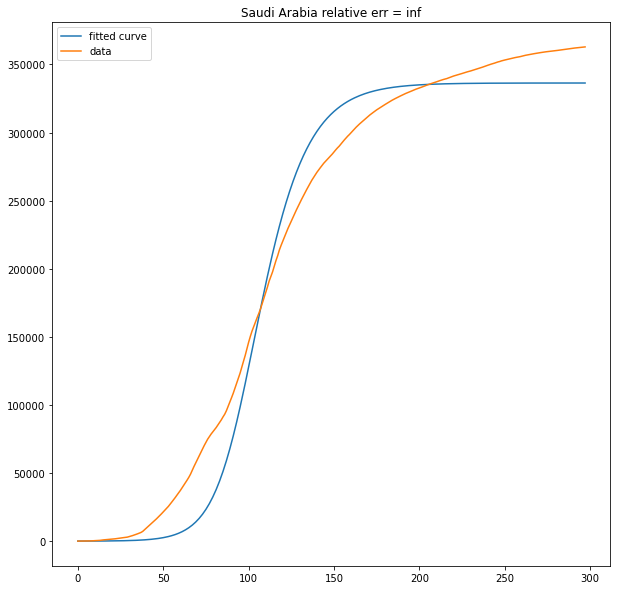

(117,) 150
minStart 16
TrainSize 100
[0.00000000e+00 1.81382138e+00 7.14285973e-02 3.33321098e-01
 0.00000000e+00 0.00000000e+00 1.75728371e-03] 0.0011506835358447277
101
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


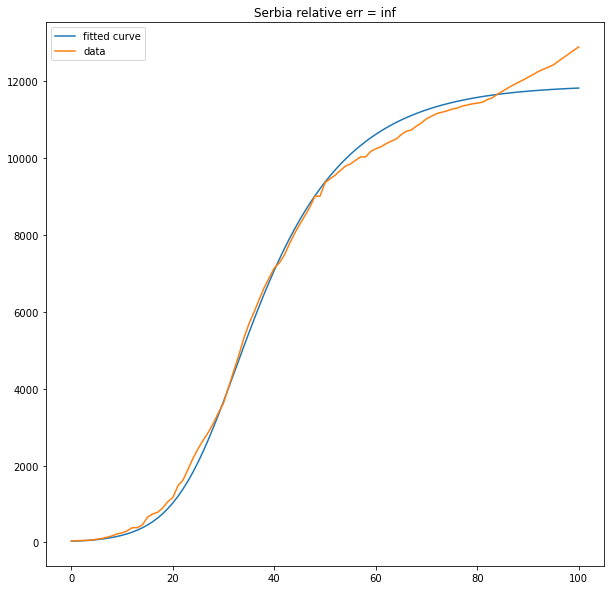

(183,) 150
minStart 9
TrainSize 173
[0.         0.82126537 0.07176174 0.31153667 0.         0.
 0.008833  ] 0.0015512515148679823
174
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


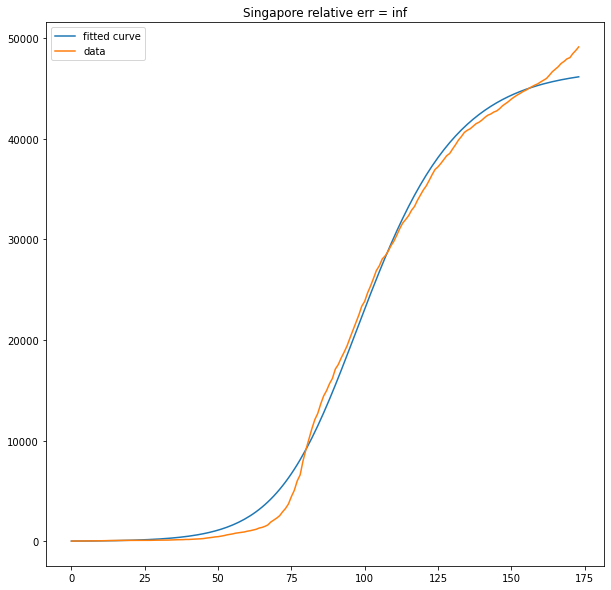

(86,) 150
minStart 6
TrainSize 79
[0.00000000e+00 8.43802055e-01 1.96187690e-01 3.30820665e-01
 0.00000000e+00 0.00000000e+00 3.06513840e-04] 0.002248508793630642
80
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


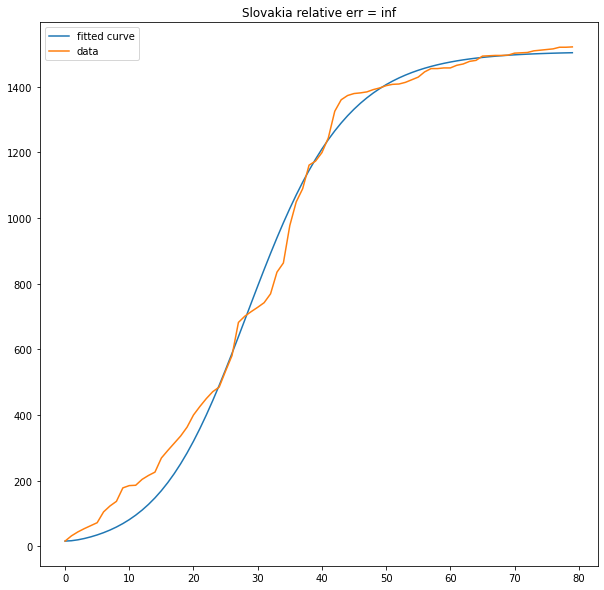

(108,) 150
minStart 35
TrainSize 72
[0.00000000e+00 3.11697352e+00 7.14286162e-02 3.33330143e-01
 0.00000000e+00 0.00000000e+00 7.13812877e-04] 0.0016045036588163606
73
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


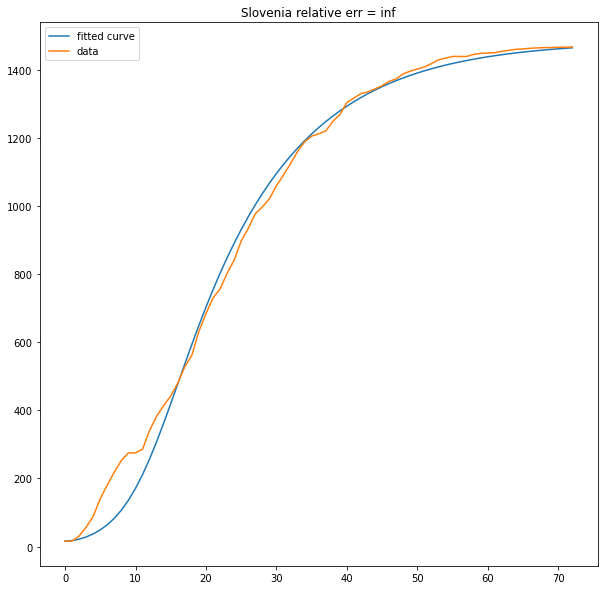

(141,) 150
minStart 27
TrainSize 113
[0.00000000e+00 1.37053627e+00 7.14298358e-02 3.33244887e-01
 0.00000000e+00 0.00000000e+00 1.96450513e-04] 0.005904274250479415
114
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


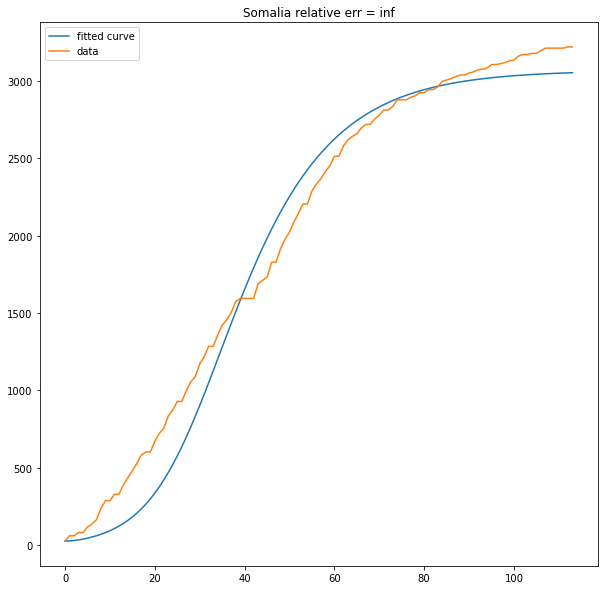

(289,) 150
minStart 34
TrainSize 254
[0.         0.88305928 0.07147918 0.32664112 0.         0.
 0.01294432] 0.0014581912435870485
255
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


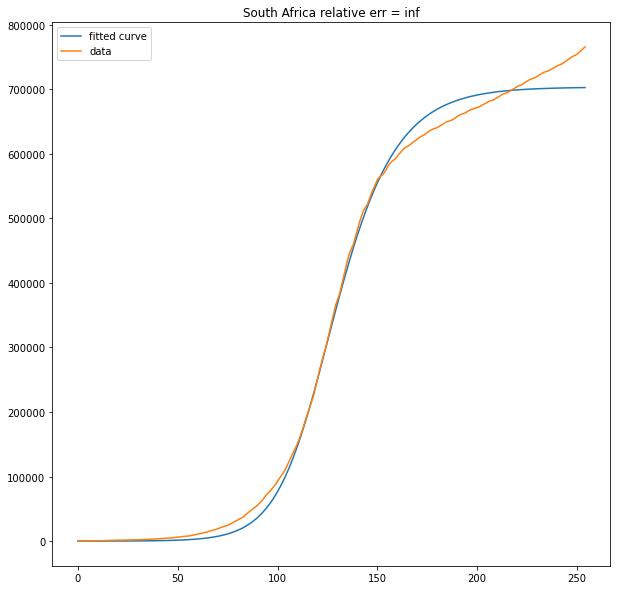

(91,) 150
minStart 12
TrainSize 78
[0.00000000e+00 1.17664741e+00 8.59508493e-02 7.14319856e-02
 0.00000000e+00 0.00000000e+00 2.04953163e-04] 0.002765634331283096
79
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


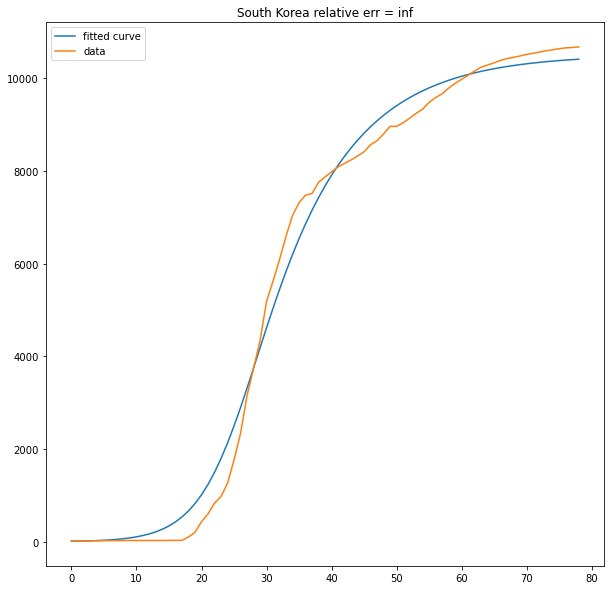

(93,) 150
minStart 25
TrainSize 67
[0.00000000e+00 8.31371867e-01 1.36947618e-01 3.10500729e-01
 0.00000000e+00 0.00000000e+00 2.06635564e-04] 0.004965979011130577
68
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


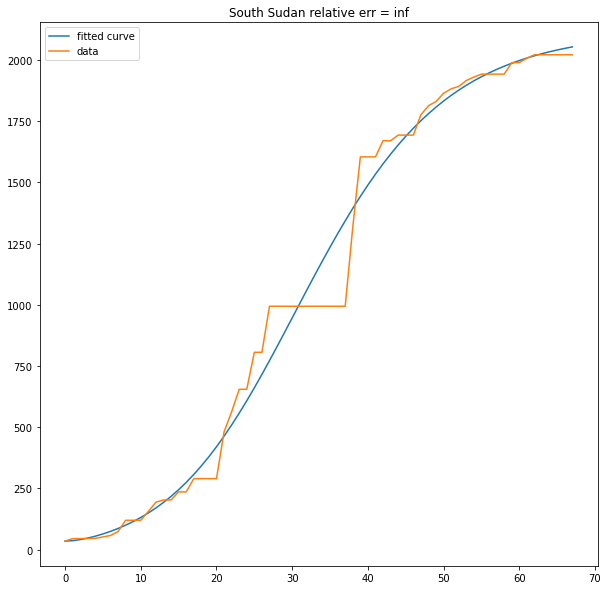

(169,) 150
minStart 27
TrainSize 141
[0.         3.23802705 0.07142858 0.33333327 0.         0.
 0.00517379] 0.0013711106294678145
142
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


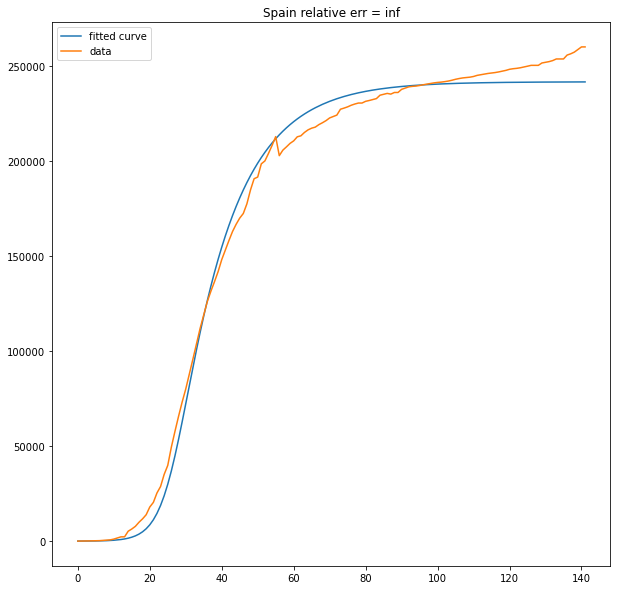

(105,) 150
minStart 23
TrainSize 81
[0.         3.46102697 0.07142861 0.33330707 0.         0.
 0.00358976] 0.00017924409852128933
82
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


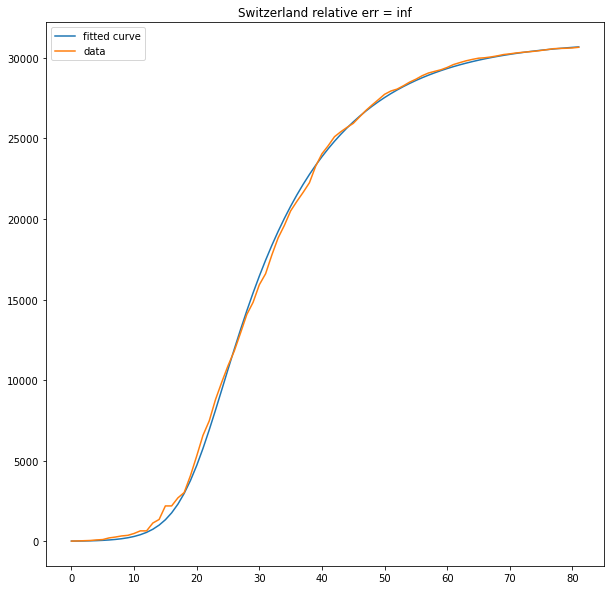

(133,) 150
minStart 26
TrainSize 106
[0.00000000e+00 3.28366710e-01 9.88320845e-02 8.47957196e-02
 0.00000000e+00 0.00000000e+00 4.95350564e-05] 0.014909979571180757
107
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


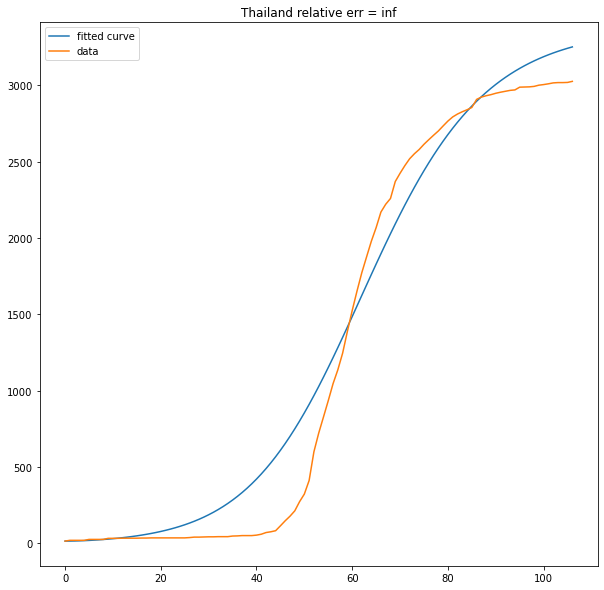

(82,) 150
minStart 11
TrainSize 70
[0.00000000e+00 2.78016486e+00 7.14364284e-02 3.33076589e-01
 0.00000000e+00 0.00000000e+00 9.02348763e-05] 0.0004912012448811964
71
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


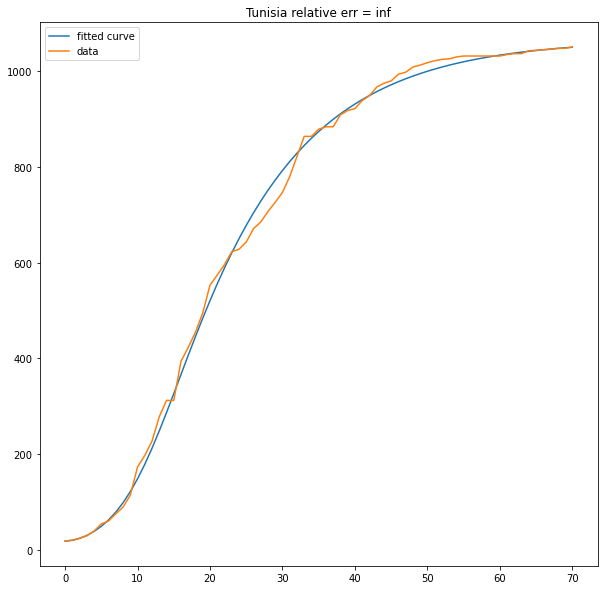

(208,) 150
minStart 5
TrainSize 202
[0.         1.39244678 0.07142858 0.33333332 0.         0.
 0.00434988] 0.0053984673624383386
203
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


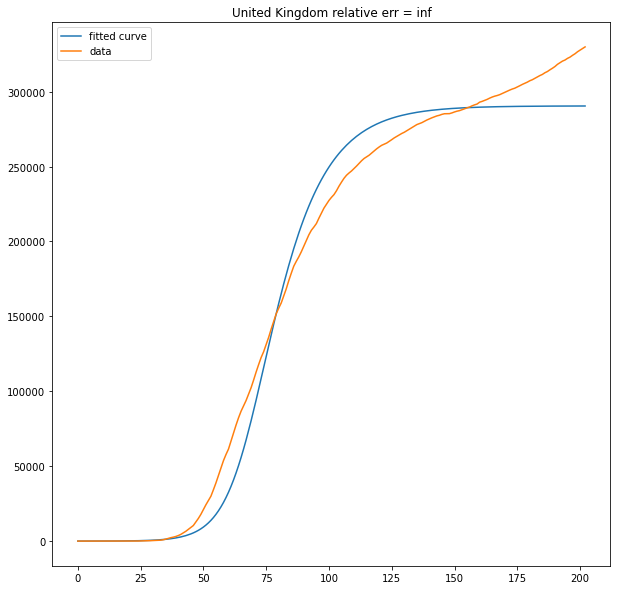

(236,) 150
minStart 28
TrainSize 207
[0.         0.21399345 0.07166396 0.07427685 0.         0.
 0.0006228 ] 0.003411551765587354
208
inf


<ipython-input-33-bdcca39046a6>:49: RuntimeWarning: divide by zero encountered in double_scalars
  er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])


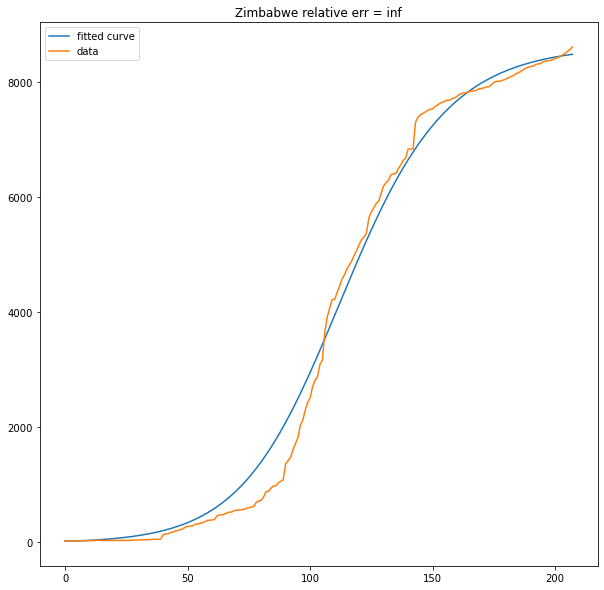

In [33]:
for run in range(10):
    left = [0,0,1/14.0,1/14.0,0,0,0]
    right = [0.1,4,1/3.0,1/3.0,0,0,0.1]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            all_fit_prs.append((0,0,0,0,0,0,0))
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            all_fit_prs.append((0,0,0,0,0,0,0))
            all_fit_err.append((0))
            continue    

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],MidPoints[i],left,right) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSEIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5]) 
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempy = getTotalInfCurveTSEIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5])  
        fig = plt.figure(figsize=(10, 10))
        plt.title(NamesList2[i]+" relative err = "+str(er2))
        plt.plot(tempx,tempy)
        plt.plot(tempx,Cases1[minStart:])   
        plt.legend(("fitted curve","data"))
        plt.show()     
    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_SEIR_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_SEIR_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITERR_)

In [ ]:
for run in range(10):
    left = [0,0,1/14.0,1/14.0,0,0,0]
    right = [0.1,4,1/3.0,1/3.0,0.1,0,0.1]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            all_fit_prs.append((0,0,0,0,0,0,0))
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            all_fit_prs.append((0,0,0,0,0,0,0))
            all_fit_err.append((0))
            continue    

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]
        
        #PRS_noGamma = np.loadtxt("owidFITPRS_SEIR_RMSE_CUT19_TRAINTEST8_"+str(run+1)+".txt")    
        #print(PRS_noGamma[i])
        
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],MidPoints[i],left,right) 
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSEIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5]) 
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempy = getTotalInfCurveTSEIR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5]) 
        fig = plt.figure(figsize=(10, 10))
        plt.title(NamesList2[i]+" relative err = "+str(er2))
        plt.plot(tempx,tempy)
        plt.plot(tempx,Cases1[minStart:])   
        plt.legend(("fitted curve","data"))
        plt.show()     
    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_SEIRG_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_SEIRG_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITERR_)

[0.         0.96389841 0.07219234 0.31550852 0.         0.
 0.00102305]
FINETUNE
(189,) 150
minStart 18
TrainSize 170
[0.         0.96389841 0.07219234 0.31550852 0.         0.
 0.00102305]


In [21]:
def GetDEFitPRS_TSEIAR(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr):
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 9
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
                #Pop[i,j] = np.random.uniform(left[j],right[j])
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        #getTotalInfCurve(0.1,0.1,0.5,0.0005,0.0000,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSEIAR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Pop[i,3],
                                    Pop[i,4],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,6]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,5],
                                    Pop[i,7],
                                    Pop[i,8])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSEIAR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        xnew[3],
                                        xnew[4],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[6]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[5],
                                        xnew[7],
                                        xnew[8])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

In [24]:
def GetDEFitPRS_TSEIAR_FineTune(Cases1,nNP,nNG,CPopSize,MidPoint,left,right,Name,StartArr,PRS_noGamma):
    print("FINETUNE")
    #left = [0,0,0,0]
    #right = [1,0.1,0.01,1]
    #print(left,right)
    D = 9
    NP = nNP
    Gap = 150
    minStart = 0
    totalI = 0
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for i in range(1,Cases1.shape[0]):
        smcs1[i] = smcs1[i-1]*0.6+Cases1[i]*0.4
    for i in range(Cases1.shape[0]):
        #print(i)
        if(i>0):
            if(smcs1[i] - smcs1[i-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = i
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    Pop = np.zeros((NP,D))
    Fit = np.zeros(NP)
    minStart = int(minStart)
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == Name):
                minStart = SI_start[j]
    print(Cases1.shape,Gap)
    minStart = int(StartArr)
    print("minStart",minStart)
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])    
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)
    TrainSize = int(MidPoint)-minStart
    print("TrainSize",TrainSize)
    for i in range(NP):
        for j in range(D):
            if(left[j] == right[j]):
                Pop[i,j] = left[j]
            else:
                Pop[i,j] = -1
                while Pop[i,j] < left[j] or Pop[i][j] > right[j]:
                    Pop[i,j] = np.random.normal(left[j],0.1*(right[j]-left[j]))
                #Pop[i,j] = np.random.uniform(left[j],right[j])
        if(i == 0):
            for j in range(D):
                Pop[i][j] = PRS_noGamma[j]
            print(Pop[i])
        #getTotalInfCurveTSI(0.1,0,301,100001,1,10000000,1e-5)
        #print(Pop[i])
        #getTotalInfCurveTSIR(0.1,0.001,0,301,100001,1,10000000,1e-5)
        #getTotalInfCurve(0.1,0.1,0.5,0.0005,0.0000,301,100001,1,10000000,1e-5)
        tempy = getTotalInfCurveTSEIAR(Pop[i,0],
                                    Pop[i,1],
                                    Pop[i,2],
                                    Pop[i,3],
                                    Pop[i,4],
                                    Cases1[minStart:minStart+TrainSize].shape[0],
                                    Pop[i,6]*CPopSize,
                                    Cases1[minStart],
                                    CPopSize,
                                    Pop[i,5],
                                    Pop[i,7],
                                    Pop[i,8])
        Fit[i] = RE(Cases1[minStart:minStart+TrainSize],tempy)
        #print(tempy)
    muttype = 3
    CR = 1
    for gen in range(nNG):
        for i in range(NP):        
            r1 = int(np.random.uniform(0,NP,1))
            r2 = int(np.random.uniform(0,NP,1))
            r3 = int(np.random.uniform(0,NP,1))
            r4 = int(np.random.uniform(0,NP,1))
            r5 = int(np.random.uniform(0,NP,1))        
            while(r1 == r2 or r1 == r3 or r1 == r4 or r1 == r5 or r2 == r3 or r2 == r4 or r2 == r5 or r3 == r4 or r3 == r5 or r4 == r5):
                r2 = int(np.random.uniform(0,NP,1))
                r3 = int(np.random.uniform(0,NP,1))
                r4 = int(np.random.uniform(0,NP,1))
                r5 = int(np.random.uniform(0,NP,1))
            xnew = np.zeros(D)
            F = 2
            F2 = 2
            while(F > 1 or F < 0):
                F = np.random.normal(0.5,0.1)
            while(F2 > 1 or F2 < 0):
                F2 = np.random.normal(0.4,0.1)
            K = np.random.uniform(0,1,1)    
            for j in range(D):        
                if(np.random.uniform(0,1,1) < CR):
                    if(muttype == 0):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j])
                    elif(muttype == 1):
                        xnew[j] = Pop[r1][j] + F*(Pop[r2][j] - Pop[r3][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 2):
                        xnew[j] = Pop[r1][j] + K*(Pop[r2][j] - Pop[r1][j]) + F*(Pop[r4][j] - Pop[r5][j])
                    elif(muttype == 3):
                        F2 = F
                        xnew[j] = Pop[i][j] + F*(Pop[r2][j] - Pop[r3][j]) + F2*(Pop[r4][j] - Pop[r5][j])
                else:
                    xnew[j] = Pop[r1][j] 
            for j in range(D):
                if(xnew[j] < left[j]):
                    xnew[j] = (left[j] + Pop[r1][j])*0.5
                if(xnew[j] > right[j]):
                    xnew[j] = (right[j] + Pop[r1][j])*0.5
            tempy = getTotalInfCurveTSEIAR(xnew[0],
                                        xnew[1],
                                        xnew[2],
                                        xnew[3],
                                        xnew[4],
                                        Cases1[minStart:minStart+TrainSize].shape[0],
                                        xnew[6]*CPopSize,
                                        Cases1[minStart],
                                        CPopSize,
                                        xnew[5],
                                        xnew[7],
                                        xnew[8])
            tempfit = RE(Cases1[minStart:minStart+TrainSize],tempy)
            if(tempfit <= Fit[i]):            
                Fit[i] = tempfit
                Pop[i] = np.copy(xnew)
        minfit = Fit[0]
        minindex = 0
        for i in range(NP):
            if(Fit[i] < minfit):
                minfit = Fit[i]
                minindex = i
    return Pop[minindex],Fit[minindex],minStart,TrainSize

In [22]:
for run in range(10):    
    left =  [0,0,1.0/14.,1.0/14.,0,0,1,0.0,0.0]
    #left =  [0,0,0,0,0,0,1,0.0,0.0]
    right = [0.1,4,1.0/3.0,1.0/3.0,0,0,1,0.5,1.0]
    #right = [1,4,1,1,0,0,1,1.0,1.0]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            print(NamesList2[i] + " less then 1m")
            tmp = []
            for j in range(len(left)):
                tmp.append(0);
            all_fit_prs.append(tmp)
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            print(NamesList2[i] + " not S-curve")
            tmp = []
            for j in range(len(left)):
                tmp.append(0);
            all_fit_prs.append(tmp)
            all_fit_err.append((0))
            continue

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],MidPoints[i],left,right) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIAR(Cases1,100,600,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSEIAR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5],
                                    curvePRS[7],
                                    curvePRS[8]) 
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)  
        Rt = curvePRS[7]*curvePRS[1]/curvePRS[3]+(1.0-curvePRS[7])*curvePRS[8]*curvePRS[1]/curvePRS[3]
        print("RT",Rt)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempy = getTotalInfCurveTSEIAR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5],
                                    curvePRS[7],
                                    curvePRS[8]) 
        fig = plt.figure(figsize=(10, 10))
        plt.title(NamesList2[i]+" relative err = "+str(er2))
        plt.plot(tempx,tempy)
        plt.plot(tempx,Cases1[minStart:])   
        plt.legend(("fitted curve","data"))
        plt.show() 

    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_TSEIAR_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_TSEIAR_RMSE_CUT19_TRAINTEST10_"+str(run+1)+".txt",FITERR_) 

(189,) 150
minStart 18
TrainSize 170


KeyboardInterrupt: 

In [5]:
for run in range(10):
    left =  [0,0,1.0/14.,1.0/14.,0.0,0,1,0.0,0.0]
    right = [0.5,10,1.0/3.0,1.0/3.0,0.5,0,1,0.5,1.0]
    all_fit_err = []
    all_fit_prs = []
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            print(NamesList2[i] + " less then 1m")
            tmp = []
            for j in range(len(left)):
                tmp.append(0);
            all_fit_prs.append(tmp)
            all_fit_err.append((0))
            continue
        if(CType[i] != 0):
            print(NamesList2[i] + " not S-curve")
            tmp = []
            for j in range(len(left)):
                tmp.append(0);
            all_fit_prs.append(tmp)
            all_fit_err.append((0))
            continue

        use = 1
        if(use_SI_ISO):
            for j in range(SI_iso.shape[0]):
                if(SI_iso[j] == NamesList[i]):
                    use = 1
                    break
        if(use == 0):
            continue    

        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]
        
        #PRS_noGamma = np.loadtxt("owidFITPRS_TSEIAR_RMSE_CUT19_TRAINTEST8_"+str(run+1)+".txt")    
        #print(PRS_noGamma[i])
        
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIR(Cases1,100,400,PopulationSizes[i],MidPoints[i],left,right) 
        #curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIAR(Cases1,100,400,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i]) 
        curvePRS,Error,minStart,TrainSize = GetDEFitPRS_TSEIAR(Cases1,100,600,PopulationSizes[i],Cases1.shape[0]-1,left,right,NamesList[i],StartArr[i])
        all_fit_prs.append(curvePRS)
        print(curvePRS,Error)
        print(Cases1[minStart:].shape[0])
        tempx = np.linspace(0,Cases1[minStart+TrainSize:].shape[0]-1,Cases1[minStart+TrainSize:].shape[0])
        tempy = getTotalInfCurveTSEIAR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5],
                                    curvePRS[7],
                                    curvePRS[8]) 
        tempy = tempy[TrainSize:]
        er2 = RE(Cases1[minStart+TrainSize:],tempy)      
        er2 = er2 / (Cases1[-1]-Cases1[minStart+TrainSize])
        print(er2)  
        Rt = curvePRS[7]*curvePRS[1]/curvePRS[3]+(1.0-curvePRS[7])*curvePRS[8]*curvePRS[1]/curvePRS[3]
        print("RT",Rt)
        all_fit_err.append((er2))
        #fig = plt.figure(figsize=(10, 10))
        #plt.title(NamesList2[i]+" relative err = "+str(er2))
        #plt.plot(tempx,tempy)
        #plt.plot(tempx,Cases1[minStart+TrainSize:])   
        #plt.legend(("fitted curve","data"))
        #plt.show()             
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempy = getTotalInfCurveTSEIAR(curvePRS[0],
                                    curvePRS[1],
                                    curvePRS[2],
                                    curvePRS[3],
                                    curvePRS[4],
                                    Cases1[minStart:].shape[0],
                                    curvePRS[6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    curvePRS[5],
                                    curvePRS[7],
                                    curvePRS[8]) 
        fig = plt.figure(figsize=(10, 10))
        plt.title(NamesList2[i]+" relative err = "+str(er2))
        plt.plot(tempx,tempy)
        plt.plot(tempx,Cases1[minStart:])   
        plt.legend(("fitted curve","data"))
        plt.show() 

    FITPRS_ = np.array(all_fit_prs)
    FITERR_ = np.array(all_fit_err)
    np.savetxt("owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST10range_"+str(run+1)+".txt",FITPRS_)
    np.savetxt("owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST10range_"+str(run+1)+".txt",FITERR_)

NameError: name 'NamesList' is not defined

In [22]:
len(NamesList)

215

In [249]:
names1 = [
    "owidFITERR_SI_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITERR_SIG_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITERR_SIR_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITERR_SIRG_RMSE_CUT19_TRAINTEST11.txt",   
    "owidFITERR_SEIR_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITERR_SEIRG_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITERR_TSEIAR_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST10range.txt",]

names2 = [
    "owidFITPRS_SI_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITPRS_SIG_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITPRS_SIR_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITPRS_SIRG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITPRS_SEIR_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITPRS_SEIRG_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITPRS_TSEIAR_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST10.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST10range.txt",]

nmod = 9
NWins = np.zeros(nmod)
FITERR = []
FITPRS = []
for i in range(len(names1)):        
    FITERR.append([])
    FITPRS.append([])
    for j in range(10):
        #print(names1[i][:-4]+"_"+str(j+1)+".txt")
        FITERR[i].append(np.loadtxt(names1[i][:-4]+"_"+str(j+1)+".txt"))
        FITPRS[i].append(np.loadtxt(names2[i][:-4]+"_"+str(j+1)+".txt"))    
        #print(np.loadtxt(names1[i][:-4]+"_"+str(j+1)+".txt"))
        #print(np.loadtxt(names2[i][:-4]+"_"+str(j+1)+".txt"))

AllErrors = np.zeros((10,len(NamesList),nmod))
        
for rep in range(10):
    for ijk in range(nmod):
        for i in range(FITERR[ijk][rep].shape[0]):
            if(math.isnan(FITERR[ijk][rep][i]) or math.isinf(FITERR[ijk][rep][i])):
                FITERR[ijk][rep][i] = 0 
        print("Error "+str(ijk)+" "+str(rep)+" mean",np.mean(FITERR[ijk][rep]),"median",np.median(FITERR[ijk][rep]),"std",np.std(FITERR[ijk][rep]))
        #print(FITERR[ijk])

    modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"]
    templine = "Country\t"
    for i in range(nmod):
        templine += modelsnames[i] + "\t"
    templine += "\n"

    allerr = []

    winnum = np.zeros((len(NamesList),nmod))
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            print(NamesList2[i] + " less then 1m")
            continue
        if(CType[i] != 0):
            print(NamesList2[i] + " not S-curve")
            continue
        #if(NamesList2[i] != "Chile"):
        #    continue
        print(NamesList2[i])
        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]       
        Gap = 150
        minStart = 0
        totalI = 0

        ndays = 3
        memdays = np.zeros(ndays)
        counter = 0
        smcs1 = np.zeros(Cases1.shape[0])
        for j in range(1,Cases1.shape[0]):
            smcs1[j] = smcs1[j-1]*0.6+Cases1[j]*0.4
        for j in range(Cases1.shape[0]):
            #print(j)
            if(j>0):
                if(smcs1[j] - smcs1[j-1] > 0.5):
                    memdays[counter] = 1
                else:
                    memdays[counter] = 0
                counter+= 1
                counter = counter%ndays

            if(sum(memdays) == ndays):
                minStart = j
                break

                #totalI = Cases1[i]
                #if(totalI > 5):            
                #if(Cases1.shape[0]-minStart-10 < Gap):
                #    minStart = Cases1.shape[0]-Gap
                #break

        minStart = int(minStart)
        minStart = int(StartArr[i])
        print("minStart",minStart)        
        totalLen = Cases1.shape[0] - minStart
        #TrainSize = int(totalLen*0.75)     
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempys = []

        tempys.append(getTotalInfCurveTSI(FITPRS[0][rep][i][0],
                                    FITPRS[0][rep][i][1],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[0][rep][i][3]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[0][rep][i][2]))    
        tempys.append(getTotalInfCurveTSI(FITPRS[1][rep][i][0],
                                    FITPRS[1][rep][i][1],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[1][rep][i][3]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[1][rep][i][2]))    
        tempys.append(getTotalInfCurveTSIR(FITPRS[2][rep][i][0],
                                    FITPRS[2][rep][i][1],
                                    FITPRS[2][rep][i][2],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[2][rep][i][4]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[2][rep][i][3]))
        tempys.append(getTotalInfCurveTSIR(FITPRS[3][rep][i][0],
                                    FITPRS[3][rep][i][1],
                                    FITPRS[3][rep][i][2],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[3][rep][i][4]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[3][rep][i][3]))    
        tempys.append(getTotalInfCurveTSEIR(FITPRS[4][rep][i][0],
                                    FITPRS[4][rep][i][1],
                                    FITPRS[4][rep][i][2],
                                    FITPRS[4][rep][i][3],
                                    FITPRS[4][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[4][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[4][rep][i][5]))
        tempys.append(getTotalInfCurveTSEIR(FITPRS[5][rep][i][0],
                                    FITPRS[5][rep][i][1],
                                    FITPRS[5][rep][i][2],
                                    FITPRS[5][rep][i][3],
                                    FITPRS[5][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[5][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[5][rep][i][5]))
        tempys.append(getTotalInfCurveTSEIAR(FITPRS[6][rep][i][0],
                                    FITPRS[6][rep][i][1],
                                    FITPRS[6][rep][i][2],
                                    FITPRS[6][rep][i][3],
                                    FITPRS[6][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[6][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[6][rep][i][5],
                                    FITPRS[6][rep][i][7],
                                    FITPRS[6][rep][i][8])) 
        tempys.append(getTotalInfCurveTSEIAR(FITPRS[7][rep][i][0],
                                    FITPRS[7][rep][i][1],
                                    FITPRS[7][rep][i][2],
                                    FITPRS[7][rep][i][3],
                                    FITPRS[7][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[7][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[7][rep][i][5],
                                    FITPRS[7][rep][i][7],
                                    FITPRS[7][rep][i][8])) 
        tempys.append(getTotalInfCurveTSEIAR(FITPRS[8][rep][i][0],
                                    FITPRS[8][rep][i][1],
                                    FITPRS[8][rep][i][2],
                                    FITPRS[8][rep][i][3],
                                    FITPRS[8][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[8][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[8][rep][i][5],
                                    FITPRS[8][rep][i][7],
                                    FITPRS[8][rep][i][8])) 

    #    print(PopulationSizes[i]*0.01)
    #    print(tempys[6])

        #print("Parameters",FITPRS[0][rep][i])
        #print("Parameters",FITPRS[1][i])

        for ijk in range(nmod):
            for k in range(tempys[ijk].shape[0]):
                #print(np.abs(tempys[ijk][k]))
                if(math.isnan(tempys[ijk][k]) or math.isinf(tempys[ijk][k]) or np.abs(tempys[ijk][k]) > np.max(Cases1[minStart:]*3)):
                    print(ijk,k)
                    tempys[ijk][k] = 0    
        print("ERRORS")
        errs = np.zeros(nmod)   
        allerr.append(errs)
        for ijk in range(nmod):
            #errs[ijk] =  (Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            errs[ijk] = RE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            #errs[ijk] = MAPE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            #if(ijk == 1):
                #plt.plot(tempx,tempys[1]) 
                #plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')  
                #plt.show()
                #print(errs[ijk])
                #print(Cases1[minStart+100:minStart+110]-tempys[1][100:110])
                #print(Cases1[minStart+100:minStart+110])
                #print(np.sum(np.abs(Cases1[minStart+100:minStart+110]-tempys[1][100:110])/Cases1[minStart+100:minStart+110])/10.0)
                #print("START MAPE 10")
                #print(Cases1[minStart+100:minStart+110])
                #print(MAPE(Cases1[minStart+100:minStart+110],tempys[1][100:110]))
            #errs[ijk] = Rsquared(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            AllErrors[rep,i,ijk] = errs[ijk]
        print(errs)    
        
        #print(Cases1[minStart:])
        #print(tempys[1][:])
        
        print(np.argmin(errs))
        winnum[i,np.argmin(errs)] = 1
        makegraphs = 0
        if(makegraphs == 1):
            fig = plt.figure(figsize=(10, 10))
            plt.title(NamesList2[i]+" relative err = ")#+str(er2))
            #for ijk in range(nmod):
            #    plt.plot(tempx,tempys[ijk])    
            plt.plot(tempx,tempys[0])    
            plt.plot(tempx,tempys[1])   
            plt.plot(tempx,tempys[2])   
            plt.plot(tempx,tempys[3])   
            plt.plot(tempx,tempys[4])   
            plt.plot(tempx,tempys[5])   
            plt.plot(tempx,tempys[6])   
            plt.plot(tempx,tempys[7])   
            #plt.plot(tempx,tempys[8])   
            plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')   
            #plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"))
            plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"))
            plt.grid(True)
            plt.show()             
                            

        NWins[np.argmax(winnum[i])] += 1

        templine += NamesList2[i]+"\t"
        for i in range(nmod):
            templine += "{:.3f}".format(errs[i]*100) + "%\t"
        templine += "\n"

    print(templine)

    for ijk in range(nmod):
        print(modelsnames[ijk],NWins[ijk])    
    winindex = np.zeros(winnum.shape[0])
    for i in range(winnum.shape[0]):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            continue
        winindex[i] = np.argmax(winnum[i])
        print(NamesList2[i],"\t", modelsnames[np.argmax(winnum[i])], winindex[i])

Error 0 0 mean 0.20709423352693482 median 0.0 std 0.4818188969803678
Error 1 0 mean 0.0011430871980770408 median 0.0 std 0.004808530389970466
Error 2 0 mean 0.0020508025728096023 median 0.0 std 0.009403998756748024
Error 3 0 mean 0.0026280240600517948 median 0.0 std 0.018305773063668453
Error 4 0 mean 0.0 median 0.0 std 0.0
Error 5 0 mean 0.0 median 0.0 std 0.0
Error 6 0 mean 0.0 median 0.0 std 0.0
Error 7 0 mean 0.0 median 0.0 std 0.0
Error 8 0 mean 0.0 median 0.0 std 0.0
Afghanistan
minStart 18
ERRORS
[0.00175863 0.00031125 0.00013821 0.00941845 0.00020416 0.00022172
 0.0003274  0.00407077 0.00054825]
2
Africa not S-curve
Albania not S-curve
Algeria not S-curve
Andorra less then 1m
Angola not S-curve
Anguilla less then 1m
Antigua and Barbuda less then 1m
Argentina not S-curve
Armenia
minStart 14
ERRORS
[5.09338267e-03 4.09164862e-04 9.66801079e-05 8.48159078e-04
 1.17651260e-03 1.51545860e-04 1.45640542e-03 4.53906919e-04
 2.27859640e-04]
2
Asia not S-curve
Australia
minStart 6
ERROR

ERRORS
[0.01512372 0.00192003 0.00351333 0.0004466  0.00141889 0.00029195
 0.00141925 0.00034205 0.00030327]
5
Oceania not S-curve
Oman
minStart 10
ERRORS
[0.00146213 0.00061737 0.00085032 0.00096073 0.00068529 0.00077292
 0.00073361 0.00112146 0.0009432 ]
1
Pakistan
minStart 15
ERRORS
[0.0082823  0.00151262 0.00173312 0.00892349 0.00238432 0.00110752
 0.00260682 0.00212125 0.00068112]
8
Palestine not S-curve
Panama not S-curve
Papua New Guinea not S-curve
Paraguay not S-curve
Peru not S-curve
Philippines not S-curve
Poland not S-curve
Portugal not S-curve
Qatar not S-curve
Romania not S-curve
Russia not S-curve
Rwanda not S-curve
Saint Helena less then 1m
Saint Kitts and Nevis less then 1m
Saint Lucia less then 1m
Saint Vincent and the Grenadines less then 1m
Samoa less then 1m
San Marino less then 1m
Sao Tome and Principe less then 1m
Saudi Arabia
minStart 8
ERRORS
[0.01318479 0.00061557 0.00702403 0.00236889 0.00741165 0.00022454
 0.00767848 0.0002623  0.00040906]
5
Senegal not S-cu

ERRORS
[0.01575401 0.01589318 0.02174529 0.03167828 0.01577251 0.01730938
 0.0166022  0.02130614 0.0173186 ]
0
Austria
minStart 6
ERRORS
[0.01130811 0.0044674  0.0007083  0.00045827 0.00010978 0.00012176
 0.00011099 0.0001472  0.00018751]
4
Azerbaijan
minStart 14
ERRORS
[0.00576493 0.00114203 0.00071779 0.00305661 0.00127162 0.00104145
 0.0014809  0.00162086 0.00154092]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276392 0.00108106 0.00384609 0.00051216 0.00435887 0.00017075
 0.00444959 0.0003104  0.00026075]
5
Belgium
minStart 29
ERRORS
[0.01405313 0.00162838 0.00534675 0.00031441 0.00214232 0.00020688
 0.00214535 0.00015139 0.00012133]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[6.72046255e-03 8.51272213e-05 1.66031757e-03 2.29020265e-03
 2.97133350e-03 1.90480780e-04 3.44132397e-03 1.68908483e-04
 2.56672479e-04]
1
Bosnia and Herzegovina not S-cu

ERRORS
[0.02961049 0.02535494 0.00495885 0.00486206 0.00561799 0.00303571
 0.00599133 0.003195   0.00279887]
8
Slovakia
minStart 6
ERRORS
[0.0030577  0.00125357 0.0015086  0.00185424 0.00215787 0.00177537
 0.00208089 0.00180623 0.00201884]
1
Slovenia
minStart 35
ERRORS
[0.00654624 0.00013527 0.00162833 0.00026462 0.00146173 0.00037129
 0.00146141 0.0003583  0.00040816]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01096997 0.00165724 0.00232702 0.00079034 0.00548838 0.00064136
 0.0056151  0.00055017 0.0005466 ]
8
South Africa
minStart 34
ERRORS
[0.00392651 0.00152361 0.00027234 0.00256779 0.00047709 0.00033408
 0.00050021 0.00294241 0.00196549]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.0055384  0.00526056 0.00311605 0.00318499 0.00203677 0.00222377
 0.00205259 0.00218848 0.00176501]
8
South Sudan
minStart 25
ERRORS
[0.00463825 0.00421565 0.00437929 0.01424822 0.00414173 0.00417719
 0.00596927 0.004182   0.00423838]
4
Spain
minStart 27
ERRORS
[0.017074

ERRORS
[5.09329505e-03 4.08618212e-04 9.66729975e-05 3.59720561e-04
 1.01257663e-03 1.45372041e-04 1.16354640e-03 4.26450520e-04
 4.76545266e-04]
2
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01576284 0.01618242 0.02213209 0.02880574 0.01584757 0.01775308
 0.01629122 0.01750616 0.01955341]
0
Austria
minStart 6
ERRORS
[0.01130799 0.00465958 0.00070832 0.00056561 0.00010982 0.00011351
 0.00011118 0.00019845 0.00023106]
4
Azerbaijan
minStart 14
ERRORS
[0.00576474 0.00117073 0.0007165  0.00285632 0.00111915 0.00101969
 0.00145695 0.00155342 0.00100172]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276398 0.00105238 0.0038461  0.00049771 0.00436476 0.00018739
 0.00447577 0.00025955 0.00033303]
5
Belgium
minStart 29
ERRORS
[0.01405322 0.00163318 0.00534675 0.00037008 0.00214219 0.00019469
 0.00213953 0.00023613 0.00013916]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minS

[0.00305775 0.00125323 0.00150866 0.00174498 0.00212136 0.00181706
 0.002134   0.00184593 0.00189708]
1
Slovenia
minStart 35
ERRORS
[0.00654615 0.00013809 0.00162849 0.00034533 0.00146172 0.00037332
 0.00146302 0.00038791 0.00036711]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01097009 0.00024203 0.00232797 0.00190054 0.00547644 0.00058343
 0.00558189 0.0005533  0.00057122]
1
South Africa
minStart 34
ERRORS
[0.00392663 0.00185792 0.00027232 0.00397446 0.00047193 0.00030281
 0.000537   0.00105997 0.00108035]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.00553986 0.00483473 0.00311602 0.00957623 0.00203832 0.00213533
 0.00206011 0.00235702 0.00155353]
8
South Sudan
minStart 25
ERRORS
[0.00553847 0.00533887 0.0045446  0.00601853 0.00415821 0.00411246
 0.0054082  0.0042111  0.00419647]
5
Spain
minStart 27
ERRORS
[0.01707463 0.00322774 0.00522855 0.0006052  0.00068902 0.00023176
 0.00068833 0.00024104 0.00024142]
5
Sri Lanka not S-curve
Sudan not S-curve
Sur

ERRORS
[5.09331654e-03 3.87060025e-04 9.66762724e-05 4.32482906e-04
 1.11986281e-03 1.40346954e-04 1.03279696e-03 7.37196100e-04
 3.77883283e-04]
2
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01572269 0.01629056 0.02195098 0.05393771 0.01593983 0.02027725
 0.01724747 0.03737834 0.01026242]
8
Austria
minStart 6
ERRORS
[0.01130768 0.00467078 0.0007083  0.00045935 0.0001094  0.00013835
 0.00011031 0.00013295 0.00028638]
4
Azerbaijan
minStart 14
ERRORS
[0.00576583 0.00072707 0.0007165  0.00235399 0.00112926 0.00085999
 0.00174809 0.00156148 0.0011496 ]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276396 0.00107606 0.00384608 0.00027695 0.00435859 0.00018932
 0.00448768 0.00039334 0.00033955]
5
Belgium
minStart 29
ERRORS
[0.01405321 0.00163333 0.00534672 0.00032778 0.00214205 0.00014516
 0.00214056 0.00020525 0.0001446 ]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minS

ERRORS
[0.01318491 0.00060993 0.00702403 0.00116425 0.00742348 0.00022652
 0.00755039 0.00030033 0.00037351]
5
Senegal not S-curve
Serbia
minStart 16
ERRORS
[0.00524286 0.00177876 0.00049014 0.00105143 0.00023471 0.00030705
 0.00025698 0.00026993 0.00030091]
4
Seychelles less then 1m
Sierra Leone not S-curve
Singapore
minStart 9
ERRORS
[0.02961026 0.02402584 0.00495846 0.00390249 0.00558408 0.0032702
 0.00607297 0.00309178 0.00304965]
8
Slovakia
minStart 6
ERRORS
[0.00305771 0.00473524 0.0015087  0.00262607 0.00213048 0.00176239
 0.00218588 0.00187993 0.00180652]
2
Slovenia
minStart 35
ERRORS
[0.00654617 0.00017824 0.00162859 0.00027293 0.00146201 0.00034934
 0.00146184 0.00035341 0.00039098]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01097087 0.00023719 0.00232573 0.00095968 0.00549073 0.00055938
 0.00556095 0.00057727 0.00060487]
1
South Africa
minStart 34
ERRORS
[0.00392676 0.00128042 0.00027232 0.01110141 0.00046625 0.00036199
 0.00052067 0.00191158 0.00127422]
2


ERRORS
[0.01276386 0.00108246 0.0038461  0.00024458 0.00435662 0.00019093
 0.00447711 0.00026581 0.00059747]
5
Belgium
minStart 29
ERRORS
[0.01405319 0.00162257 0.0053467  0.00031323 0.00214312 0.00016017
 0.00214322 0.00024697 0.00011293]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[6.72047358e-03 8.64474869e-05 1.66033990e-03 8.05386679e-04
 3.07244165e-03 9.86833277e-05 3.66633325e-03 3.03278556e-04
 2.07091082e-04]
1
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.01355647 0.00072092 0.00766183 0.00040981 0.00610494 0.00054954
 0.00648139 0.00055747 0.00052148]
3
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.06535447 0.04469244 0.04486449 0.02845264 0.04786314 0.03594855
 0.0479028  0.03464032 0.0469802 ]
3
Cameroon
minStart 13
ERRORS
[0.0101595  0.00142501 0.00317154 0.0022316  0.00560165 0.00099711
 0.00576575 0.

ERRORS
[0.00463835 0.00483137 0.00466238 0.00754041 0.0041363  0.00420942
 0.0042308  0.00418088 0.0043335 ]
4
Spain
minStart 27
ERRORS
[0.01707461 0.0032563  0.00522849 0.00068863 0.00068973 0.00023339
 0.00068899 0.00028053 0.00027536]
5
Sri Lanka not S-curve
Sudan not S-curve
Suriname less then 1m
Sweden not S-curve
Switzerland
minStart 23
ERRORS
[0.0130792  0.00170577 0.00284062 0.00058358 0.00039845 0.00015592
 0.00040197 0.00024233 0.00037217]
5
Syria not S-curve
Taiwan not S-curve
Tajikistan not S-curve
Tanzania not S-curve
Thailand
minStart 26
ERRORS
[0.00791088 0.00668195 0.01282761 0.03221156 0.00762029 0.00819232
 0.00738704 0.0094582  0.00509653]
8
Timor not S-curve
Togo not S-curve
Trinidad and Tobago not S-curve
Tunisia
minStart 11
ERRORS
[0.00474299 0.00087486 0.0009127  0.00064332 0.00050478 0.00038806
 0.00078819 0.00048763 0.00036372]
8
Turkey not S-curve
Turks and Caicos Islands less then 1m
Uganda not S-curve
Ukraine not S-curve
United Arab Emirates not S-curve
Unit

minStart 14
ERRORS
[5.09324833e-03 3.81387396e-04 9.66722882e-05 4.23846051e-04
 1.01696436e-03 1.71412712e-04 1.04770810e-03 2.52156059e-04
 4.78160180e-04]
2
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01575053 0.02139161 0.02235133 0.04352981 0.01581007 0.01984885
 0.01646207 0.02060495 0.03542687]
0
Austria
minStart 6
ERRORS
[0.01130816 0.00472097 0.00070835 0.00088963 0.00010923 0.00011981
 0.00010926 0.00013268 0.00023122]
4
Azerbaijan
minStart 14
ERRORS
[0.00576497 0.00078148 0.00071685 0.00252173 0.00113981 0.00139735
 0.00167754 0.00114301 0.00158958]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276401 0.00108597 0.00384604 0.00041028 0.00435759 0.0001818
 0.00438911 0.00069027 0.0002369 ]
5
Belgium
minStart 29
ERRORS
[0.01405322 0.00161437 0.0053468  0.00040414 0.00214252 0.00018782
 0.00214106 0.00021501 0.00010854]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
B

ERRORS
[0.00654612 0.00013877 0.00162835 0.00024543 0.00146165 0.00038206
 0.00146249 0.0003522  0.00039875]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01097056 0.00024012 0.00232577 0.00109949 0.00546093 0.0006134
 0.00559993 0.00056772 0.00053703]
1
South Africa
minStart 34
ERRORS
[0.00392657 0.00161036 0.00027234 0.00326065 0.00048383 0.00030339
 0.00058127 0.00104539 0.00190596]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.0055384  0.00497504 0.003116   0.0033945  0.00203657 0.00210411
 0.00205108 0.00240349 0.00231495]
4
South Sudan
minStart 25
ERRORS
[0.00465917 0.00417517 0.00444755 0.00510805 0.00414813 0.0041284
 0.00420906 0.00419569 0.00417845]
5
Spain
minStart 27
ERRORS
[0.0170747  0.00327382 0.00522854 0.00062642 0.00068911 0.00021639
 0.00068853 0.00031441 0.00019531]
8
Sri Lanka not S-curve
Sudan not S-curve
Suriname less then 1m
Sweden not S-curve
Switzerland
minStart 23
ERRORS
[0.01307928 0.00166498 0.00284091 0.00080404 0.00039848 0.

ERRORS
[0.0157436  0.01583713 0.0221057  0.02724702 0.01579347 0.0206211
 0.01634613 0.06166812 0.00702579]
8
Austria
minStart 6
ERRORS
[0.01130811 0.00464647 0.00070833 0.00052095 0.00010926 0.000116
 0.00011196 0.00027142 0.00013849]
4
Azerbaijan
minStart 14
ERRORS
[0.00576452 0.00072835 0.00071674 0.0012129  0.00109562 0.0010913
 0.0016326  0.00114231 0.00125278]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276395 0.00107239 0.00384608 0.0004853  0.0043619  0.00017282
 0.00447415 0.00047629 0.00028312]
5
Belgium
minStart 29
ERRORS
[0.01405315 0.00162694 0.00534672 0.0003383  0.00214204 0.00016653
 0.0021411  0.00025118 0.00018878]
5
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[6.72045867e-03 8.03559629e-05 1.66028522e-03 7.86067771e-04
 3.00463146e-03 1.58168829e-04 3.53336703e-03 1.15285179e-03
 7.49563433e-04]
1
Bosnia and Herzegovina not S-curve


ERRORS
[0.01096962 0.00023379 0.00233358 0.00048389 0.00546885 0.00056963
 0.00560583 0.00058774 0.00057736]
1
South Africa
minStart 34
ERRORS
[0.00392652 0.00160273 0.00027235 0.00521177 0.00046541 0.00039
 0.00049118 0.00086849 0.00115064]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.00553704 0.00518933 0.00311602 0.00342045 0.00203665 0.00211956
 0.00204793 0.00222104 0.0020186 ]
8
South Sudan
minStart 25
ERRORS
[0.00463293 0.00438717 0.00482706 0.0177258  0.00413331 0.00422321
 0.00421094 0.00427231 0.00425929]
4
Spain
minStart 27
ERRORS
[0.01707467 0.00325933 0.0052286  0.00060208 0.00068906 0.00024489
 0.00068929 0.00029115 0.0002623 ]
5
Sri Lanka not S-curve
Sudan not S-curve
Suriname less then 1m
Sweden not S-curve
Switzerland
minStart 23
ERRORS
[0.01307942 0.00170788 0.0028408  0.00079562 0.00039831 0.00016126
 0.00039833 0.00032623 0.000412  ]
5
Syria not S-curve
Taiwan not S-curve
Tajikistan not S-curve
Tanzania not S-curve
Thailand
minStart 26
ERRORS
[0.013

ERRORS
[0.01574701 0.01746119 0.02188258 0.03666419 0.01606584 0.01884664
 0.0161082  0.04006592 0.00666729]
8
Austria
minStart 6
ERRORS
[0.01130854 0.00465057 0.00070833 0.00049755 0.00010905 0.00011718
 0.00011122 0.00013548 0.00022132]
4
Azerbaijan
minStart 14
ERRORS
[0.00576431 0.00128305 0.00071673 0.00248968 0.00110413 0.00125992
 0.00161466 0.0011163  0.00127718]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276396 0.00109908 0.00384608 0.00034382 0.00435647 0.0002169
 0.00450091 0.00038248 0.00038224]
5
Belgium
minStart 29
ERRORS
[0.01405321 0.00162947 0.00534674 0.00035126 0.00214254 0.00018899
 0.00214395 0.00022834 0.00010626]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[0.00672045 0.00010777 0.00166026 0.00116143 0.0030202  0.00017763
 0.00345641 0.00094243 0.00014323]
1
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-

ERRORS
[0.01318485 0.00060911 0.00702395 0.00056412 0.00741105 0.00027354
 0.0075747  0.00059931 0.00036004]
5
Senegal not S-curve
Serbia
minStart 16
ERRORS
[0.00524314 0.001763   0.00049015 0.0006752  0.00023584 0.00019348
 0.00025565 0.00023221 0.00029545]
5
Seychelles less then 1m
Sierra Leone not S-curve
Singapore
minStart 9
ERRORS
[0.02961226 0.02563655 0.00495869 0.00461461 0.00561457 0.00296997
 0.00605388 0.00307644 0.00323161]
5
Slovakia
minStart 6
ERRORS
[0.00305769 0.00124947 0.001511   0.00162786 0.00204227 0.00173772
 0.00225803 0.00192444 0.00191597]
1
Slovenia
minStart 35
ERRORS
[0.00654609 0.00013588 0.00162824 0.00028842 0.00146184 0.00035128
 0.00146326 0.00036078 0.00033628]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01096905 0.00023261 0.00233407 0.00049803 0.0054611  0.00060661
 0.00567455 0.00062575 0.00048669]
1
South Africa
minStart 34
ERRORS
[0.00392662 0.00170137 0.00027233 0.00273429 0.00047067 0.00030209
 0.0005316  0.00070199 0.00099206]
2

ERRORS
[0.01276399 0.00108159 0.00384609 0.00032931 0.00435868 0.00017289
 0.00445915 0.00034493 0.00026289]
5
Belgium
minStart 29
ERRORS
[0.01405324 0.00163654 0.00534666 0.00032393 0.0021422  0.00016769
 0.00214441 0.00024676 0.00014946]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[6.72046694e-03 1.09927988e-04 1.66027188e-03 1.91949680e-03
 3.01413738e-03 5.72278565e-05 3.02153227e-03 4.24462410e-04
 1.90489423e-04]
5
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.01355659 0.00071774 0.00685791 0.00040801 0.006139   0.00053958
 0.00689212 0.00053222 0.00090078]
3
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.06584787 0.04470873 0.04486373 0.02911965 0.04789446 0.03589292
 0.04823432 0.03243899 0.03976165]
3
Cameroon
minStart 13
ERRORS
[0.01015961 0.00103589 0.00316432 0.00426488 0.00546812 0.00105331
 0.00561906 0.

ERRORS
[0.02961115 0.02426321 0.00495852 0.00420844 0.00560153 0.00302909
 0.00613497 0.00339653 0.00281552]
8
Slovakia
minStart 6
ERRORS
[0.00305772 0.00128303 0.00150896 0.00164961 0.00211225 0.00168813
 0.00204355 0.00172345 0.00172315]
1
Slovenia
minStart 35
ERRORS
[0.0065462  0.00013532 0.00162838 0.00028724 0.00146263 0.00033551
 0.00146302 0.00035108 0.00038089]
1
Solomon Islands less then 1m
Somalia
minStart 27
ERRORS
[0.01097127 0.00023273 0.00232535 0.00054531 0.00550894 0.00063427
 0.00557556 0.00065928 0.00063245]
1
South Africa
minStart 34
ERRORS
[0.00392645 0.00136654 0.00027233 0.00274137 0.00046113 0.00045112
 0.00055811 0.00160975 0.00438851]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.00553945 0.00506861 0.00311598 0.00326431 0.00203793 0.0021207
 0.00204973 0.00223867 0.00183427]
8
South Sudan
minStart 25
ERRORS
[0.00464121 0.004103   0.00427532 0.00486141 0.00412298 0.00420765
 0.00417559 0.00420964 0.0042165 ]
1
Spain
minStart 27
ERRORS
[0.0170746

ERRORS
[5.09339324e-03 3.56197823e-04 9.66788945e-05 9.01142044e-04
 1.13241202e-03 1.34351375e-04 1.13499972e-03 7.91200761e-04
 5.01066153e-04]
2
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01573687 0.01581678 0.02174891 0.04005307 0.01589144 0.0183953
 0.01600232 0.02472107 0.00497206]
8
Austria
minStart 6
ERRORS
[0.01130769 0.00461734 0.00070831 0.00044559 0.0001098  0.00012877
 0.00011164 0.00029553 0.00024013]
4
Azerbaijan
minStart 14
ERRORS
[0.00576459 0.00089576 0.00071967 0.0014188  0.00122163 0.00096652
 0.00147643 0.00142946 0.00126688]
2
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.01276399 0.00106761 0.00384615 0.00024485 0.0043574  0.00016541
 0.00448294 0.00024373 0.00037387]
5
Belgium
minStart 29
ERRORS
[0.01405318 0.00163794 0.00534674 0.00033031 0.00214245 0.00016649
 0.00214822 0.00018975 0.00013313]
8
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minSt

ERRORS
[0.01096975 0.00023297 0.00233245 0.00044017 0.00549318 0.00058113
 0.00579003 0.00065815 0.00058874]
1
South Africa
minStart 34
ERRORS
[0.00392659 0.00153564 0.00027233 0.00366016 0.00046023 0.00059591
 0.00050008 0.00049484 0.00081555]
2
South America not S-curve
South Korea
minStart 12
ERRORS
[0.00554024 0.00543471 0.003116   0.00462508 0.00203666 0.00209591
 0.00207122 0.00210732 0.00153052]
8
South Sudan
minStart 25
ERRORS
[0.0046898  0.00411455 0.00445033 0.00629002 0.00410571 0.00455552
 0.0041381  0.00423903 0.00419372]
4
Spain
minStart 27
ERRORS
[0.01707469 0.00324489 0.00522853 0.00064225 0.00068916 0.00022549
 0.00068888 0.00038907 0.00026269]
5
Sri Lanka not S-curve
Sudan not S-curve
Suriname less then 1m
Sweden not S-curve
Switzerland
minStart 23
ERRORS
[0.01307931 0.00174031 0.00284074 0.00063898 0.00039917 0.00015613
 0.00040039 0.001125   0.00064169]
5
Syria not S-curve
Taiwan not S-curve
Tajikistan not S-curve
Tanzania not S-curve
Thailand
minStart 26
ERRORS
[0.

In [247]:
names1 = [
    "owidFITERR_SIG_RMSE_CUT19_TRAINTEST9.txt",    
    "owidFITERR_SIRG_RMSE_CUT19_TRAINTEST11.txt",   
    "owidFITERR_SEIRG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST11range.txt",]

names2 = [
    "owidFITPRS_SIG_RMSE_CUT19_TRAINTEST9.txt",    
    "owidFITPRS_SIRG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITPRS_SEIRG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST11.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST11range.txt",]

nmod = 5
NWins = np.zeros(nmod)
FITERR = []
FITPRS = []
for i in range(len(names1)):        
    FITERR.append([])
    FITPRS.append([])
    for j in range(10):
        #print(names1[i][:-4]+"_"+str(j+1)+".txt")
        FITERR[i].append(np.loadtxt(names1[i][:-4]+"_"+str(j+1)+".txt"))
        FITPRS[i].append(np.loadtxt(names2[i][:-4]+"_"+str(j+1)+".txt"))    
        #print(np.loadtxt(names1[i][:-4]+"_"+str(j+1)+".txt"))
        #print(np.loadtxt(names2[i][:-4]+"_"+str(j+1)+".txt"))

AllErrors = np.zeros((10,len(NamesList),nmod))
        
for rep in range(10):
    for ijk in range(nmod):
        for i in range(FITERR[ijk][rep].shape[0]):
            if(math.isnan(FITERR[ijk][rep][i]) or math.isinf(FITERR[ijk][rep][i])):
                FITERR[ijk][rep][i] = 0 
        print("Error "+str(ijk)+" "+str(rep)+" mean",np.mean(FITERR[ijk][rep]),"median",np.median(FITERR[ijk][rep]),"std",np.std(FITERR[ijk][rep]))
        #print(FITERR[ijk])

    modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"]
    templine = "Country\t"
    for i in range(nmod):
        templine += modelsnames[i] + "\t"
    templine += "\n"

    allerr = []

    winnum = np.zeros((len(NamesList),nmod))
    for i in range(len(NamesList)):
    #for i in range(1):
        if(PopulationSizes[i] < 1000000):
            print(NamesList2[i] + " less then 1m")
            continue
        if(CType[i] != 0):
            print(NamesList2[i] + " not S-curve")
            continue
        #if(NamesList2[i] != "Chile"):
        #    continue
        print(NamesList2[i])
        Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
        Df1 = Df1.fillna(0)
        Cases1 = np.array(Df1)    
        Cases1 = Cases1[:int(newNCases[i])]       
        Gap = 150
        minStart = 0
        totalI = 0

        ndays = 3
        memdays = np.zeros(ndays)
        counter = 0
        smcs1 = np.zeros(Cases1.shape[0])
        for j in range(1,Cases1.shape[0]):
            smcs1[j] = smcs1[j-1]*0.6+Cases1[j]*0.4
        for j in range(Cases1.shape[0]):
            #print(j)
            if(j>0):
                if(smcs1[j] - smcs1[j-1] > 0.5):
                    memdays[counter] = 1
                else:
                    memdays[counter] = 0
                counter+= 1
                counter = counter%ndays

            if(sum(memdays) == ndays):
                minStart = j
                break

                #totalI = Cases1[i]
                #if(totalI > 5):            
                #if(Cases1.shape[0]-minStart-10 < Gap):
                #    minStart = Cases1.shape[0]-Gap
                #break

        minStart = int(minStart)
        minStart = int(StartArr[i])
        print("minStart",minStart)        
        totalLen = Cases1.shape[0] - minStart
        #TrainSize = int(totalLen*0.75)     
        tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
        tempys = []

        #tempys.append(getTotalInfCurveTSI(FITPRS[0][rep][i][0],
        #                            FITPRS[0][rep][i][1],
        #                            Cases1[minStart:].shape[0],
        #                            FITPRS[0][rep][i][3]*PopulationSizes[i],
        #                            Cases1[minStart],
        #                            PopulationSizes[i],
        #                            FITPRS[0][rep][i][2]))    
        tempys.append(getTotalInfCurveTSI(FITPRS[0][rep][i][0],
                                    FITPRS[0][rep][i][1],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[0][rep][i][3]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[0][rep][i][2]))    
        #tempys.append(getTotalInfCurveTSIR(FITPRS[2][rep][i][0],
        #                            FITPRS[2][rep][i][1],
        #                            FITPRS[2][rep][i][2],
        #                            Cases1[minStart:].shape[0],
        #                            FITPRS[2][rep][i][4]*PopulationSizes[i],
        #                            Cases1[minStart],
        #                            PopulationSizes[i],
        #                            FITPRS[2][rep][i][3]))
        tempys.append(getTotalInfCurveTSIR(FITPRS[1][rep][i][0],
                                    FITPRS[1][rep][i][1],
                                    FITPRS[1][rep][i][2],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[1][rep][i][4]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[1][rep][i][3]))    
        #tempys.append(getTotalInfCurveTSEIR(FITPRS[4][rep][i][0],
        #                            FITPRS[4][rep][i][1],
        #                            FITPRS[4][rep][i][2],
        #                            FITPRS[4][rep][i][3],
        #                            FITPRS[4][rep][i][4],
        #                            Cases1[minStart:].shape[0],
        #                            FITPRS[4][rep][i][6]*PopulationSizes[i],
        #                            Cases1[minStart],
        #                            PopulationSizes[i],
        #                            FITPRS[4][rep][i][5]))
        tempys.append(getTotalInfCurveTSEIR(FITPRS[2][rep][i][0],
                                    FITPRS[2][rep][i][1],
                                    FITPRS[2][rep][i][2],
                                    FITPRS[2][rep][i][3],
                                    FITPRS[2][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[2][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[2][rep][i][5]))
        #tempys.append(getTotalInfCurveTSEIAR(FITPRS[6][rep][i][0],
        #                            FITPRS[6][rep][i][1],
        #                            FITPRS[6][rep][i][2],
        #                            FITPRS[6][rep][i][3],
        #                            FITPRS[6][rep][i][4],
        #                            Cases1[minStart:].shape[0],
        #                            FITPRS[6][rep][i][6]*PopulationSizes[i],
        #                            Cases1[minStart],
        #                            PopulationSizes[i],
        #                            FITPRS[6][rep][i][5],
        #                            FITPRS[6][rep][i][7],
        #                            FITPRS[6][rep][i][8])) 
        tempys.append(getTotalInfCurveTSEIAR(FITPRS[3][rep][i][0],
                                    FITPRS[3][rep][i][1],
                                    FITPRS[3][rep][i][2],
                                    FITPRS[3][rep][i][3],
                                    FITPRS[3][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[3][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[3][rep][i][5],
                                    FITPRS[3][rep][i][7],
                                    FITPRS[3][rep][i][8])) 
        tempys.append(getTotalInfCurveTSEIAR(FITPRS[4][rep][i][0],
                                    FITPRS[4][rep][i][1],
                                    FITPRS[4][rep][i][2],
                                    FITPRS[4][rep][i][3],
                                    FITPRS[4][rep][i][4],
                                    Cases1[minStart:].shape[0],
                                    FITPRS[4][rep][i][6]*PopulationSizes[i],
                                    Cases1[minStart],
                                    PopulationSizes[i],
                                    FITPRS[4][rep][i][5],
                                    FITPRS[4][rep][i][7],
                                    FITPRS[4][rep][i][8])) 

    #    print(PopulationSizes[i]*0.01)
    #    print(tempys[6])

        #print("Parameters",FITPRS[0][rep][i])
        #print("Parameters",FITPRS[1][i])

        for ijk in range(nmod):
            for k in range(tempys[ijk].shape[0]):
                #print(np.abs(tempys[ijk][k]))
                if(math.isnan(tempys[ijk][k]) or math.isinf(tempys[ijk][k]) or np.abs(tempys[ijk][k]) > np.max(Cases1[minStart:]*3)):
                    print(ijk,k)
                    tempys[ijk][k] = 0    
        print("ERRORS")
        errs = np.zeros(nmod)   
        allerr.append(errs)
        for ijk in range(nmod):
            #errs[ijk] =  (Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            errs[ijk] = RE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            #errs[ijk] = MAPE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            #if(ijk == 1):
                #plt.plot(tempx,tempys[1]) 
                #plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')  
                #plt.show()
                #print(errs[ijk])
                #print(Cases1[minStart+100:minStart+110]-tempys[1][100:110])
                #print(Cases1[minStart+100:minStart+110])
                #print(np.sum(np.abs(Cases1[minStart+100:minStart+110]-tempys[1][100:110])/Cases1[minStart+100:minStart+110])/10.0)
                #print("START MAPE 10")
                #print(Cases1[minStart+100:minStart+110])
                #print(MAPE(Cases1[minStart+100:minStart+110],tempys[1][100:110]))
            #errs[ijk] = Rsquared(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
            AllErrors[rep,i,ijk] = errs[ijk]
        print(errs)    
        
        #print(Cases1[minStart:])
        #print(tempys[1][:])
        
        print(np.argmin(errs))
        winnum[i,np.argmin(errs)] = 1
        makegraphs = 0
        if(makegraphs == 1):
            fig = plt.figure(figsize=(10, 10))
            plt.title(NamesList2[i]+" relative err = ")#+str(er2))
            #for ijk in range(nmod):
            #    plt.plot(tempx,tempys[ijk])    
            plt.plot(tempx,tempys[0])    
            plt.plot(tempx,tempys[1])   
            plt.plot(tempx,tempys[2])   
            plt.plot(tempx,tempys[3])   
            plt.plot(tempx,tempys[4])   
            plt.plot(tempx,tempys[5])   
            plt.plot(tempx,tempys[6])   
            plt.plot(tempx,tempys[7])   
            #plt.plot(tempx,tempys[8])   
            plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')   
            #plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"))
            #plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"))
            plt.legend(("BD","SIR"+r"$_{\theta}$","SEIR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"))
            plt.grid(True)
            plt.show()             
                            

        NWins[np.argmax(winnum[i])] += 1

        templine += NamesList2[i]+"\t"
        for i in range(nmod):
            templine += "{:.3f}".format(errs[i]*100) + "%\t"
        templine += "\n"

    print(templine)

    for ijk in range(nmod):
        print(modelsnames[ijk],NWins[ijk])    
    winindex = np.zeros(winnum.shape[0])
    for i in range(winnum.shape[0]):
        if(PopulationSizes[i] < 1000000):
            #print(NamesList2[i] + " less then 1m")
            continue
        if(CType[i] != 0):
            #print(NamesList2[i] + " not S-curve")
            continue
        winindex[i] = np.argmax(winnum[i])
        print(NamesList2[i],"\t", modelsnames[np.argmax(winnum[i])], winindex[i])

Error 0 0 mean 0.0007165470162054741 median 0.0 std 0.004696310071349657
Error 1 0 mean 0.0009562076662103006 median 0.0 std 0.005330307009929271
Error 2 0 mean 0.0 median 0.0 std 0.0
Error 3 0 mean 0.0 median 0.0 std 0.0
Error 4 0 mean 0.0 median 0.0 std 0.0
Afghanistan
minStart 18
ERRORS
[0.00058085 0.00013821 0.00020416 0.0003274  0.00021954]
1
Africa not S-curve
Albania not S-curve
Algeria not S-curve
Andorra less then 1m
Angola not S-curve
Anguilla less then 1m
Antigua and Barbuda less then 1m
Argentina not S-curve
Armenia
minStart 14
ERRORS
[1.63580434e-04 9.66801079e-05 1.61435608e-04 5.72333682e-04
 4.87594794e-04]
1
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01576287 0.02178895 0.01610892 0.01661014 0.0145482 ]
4
Austria
minStart 6
ERRORS
[0.00096729 0.00065523 0.00010947 0.00011016 0.00011016]
2
Azerbaijan
minStart 14
ERRORS
[0.00106445 0.00071568 0.00091026 0.00139625 0.00163743]
1
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Bel

ERRORS
[0.00368591 0.00989819 0.00357547 0.00552093 0.00552093]
2
Country	SI	BD	SIR	SIR$_{\theta}$	SEIR	
Afghanistan	0.058%	0.014%	0.020%	0.033%	0.022%	
Armenia	0.016%	0.010%	0.016%	0.057%	0.049%	
Australia	1.576%	2.179%	1.611%	1.661%	1.455%	
Austria	0.097%	0.066%	0.011%	0.011%	0.011%	
Azerbaijan	0.106%	0.072%	0.091%	0.140%	0.164%	
Belarus	0.049%	0.030%	0.020%	0.039%	0.022%	
Belgium	0.081%	0.032%	0.017%	0.030%	0.011%	
Bolivia	0.009%	0.166%	0.009%	0.053%	0.025%	
Burkina Faso	0.072%	0.044%	0.053%	0.056%	0.089%	
Cambodia	4.471%	2.838%	3.769%	3.329%	4.789%	
Cameroon	0.101%	0.175%	0.083%	0.143%	0.089%	
Canada	0.082%	0.106%	0.034%	0.065%	0.020%	
Chile	0.522%	0.378%	0.341%	0.347%	0.347%	
Costa Rica	0.123%	0.617%	0.108%	0.097%	0.101%	
Cote d'Ivoire	0.131%	0.125%	0.226%	0.134%	0.118%	
Croatia	0.073%	0.052%	0.017%	0.019%	0.017%	
Cuba	0.166%	0.071%	0.058%	0.060%	0.056%	
Czechia	0.105%	0.188%	0.022%	0.025%	0.023%	
Democratic Republic of Congo	0.065%	0.048%	0.036%	0.106%	0.029%	
Egypt	0.074%	0.024%

ERRORS
[0.00043817 0.00400913 0.00050145 0.00080625 0.00026589]
4
Indonesia not S-curve
International less then 1m
Iran not S-curve
Iraq
minStart 7
ERRORS
[0.00038732 0.00348473 0.00075269 0.00083235 0.00148915]
0
Ireland
minStart 12
ERRORS
[0.00036056 0.00018769 0.00018571 0.00020844 0.00021153]
2
Isle of Man less then 1m
Israel
minStart 13
ERRORS
[0.00136709 0.00123669 0.00029189 0.0002976  0.00024384]
4
Italy
minStart 23
ERRORS
[8.35099571e-04 3.38331908e-04 2.19149962e-04 2.23706145e-04
 9.74809613e-05]
4
Jamaica not S-curve
Japan
minStart 10
ERRORS
[0.00216476 0.00569302 0.00264842 0.00276358 0.00191084]
4
Jersey less then 1m
Jordan not S-curve
Kazakhstan not S-curve
Kenya not S-curve
Kosovo not S-curve
Kuwait not S-curve
Kyrgyzstan not S-curve
Laos not S-curve
Latvia
minStart 15
ERRORS
[0.00120047 0.000565   0.00035452 0.0003755  0.00035804]
2
Lebanon
minStart 11
ERRORS
[0.00135252 0.02088105 0.00590541 0.00153394 0.00166308]
0
Lesotho not S-curve
Liberia
minStart 21
ERRORS
[0.00

minStart 8
ERRORS
[0.0007245  0.00043659 0.00053325 0.00054606 0.00090083]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.04472105 0.02918368 0.03551369 0.03449624 0.04908107]
1
Cameroon
minStart 13
ERRORS
[0.00123255 0.00170792 0.00095153 0.00231799 0.00075724]
4
Canada
minStart 36
ERRORS
[0.00083605 0.00130802 0.00042034 0.00038774 0.00023783]
4
Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
ERRORS
[0.00522396 0.00366176 0.00352953 0.003558   0.00335669]
4
China not S-curve
Colombia not S-curve
Comoros less then 1m
Congo not S-curve
Costa Rica
minStart 5
ERRORS
[0.00123978 0.00616932 0.00126638 0.00098248 0.00090785]
4
Cote d'Ivoire
minStart 10
ERRORS
[0.00180005 0.00124951 0.00137371 0.00146867 0.00137247]
1
Croatia
minStart 17
ERRORS
[0.00054304 0.00031502 0.0001746  0.00017486 0.00017358]
4
Cuba
minStart 9
ERRORS
[0.001658   0.00085338 0.00056315 0.0006798  0.0005573 ]
4
Cyprus less then 1m
Czechia
m

ERRORS
[0.0004899  0.00059993 0.0001837  0.00032854 0.00028732]
2
Belgium
minStart 29
ERRORS
[0.00080583 0.00031815 0.00015992 0.00020832 0.00015153]
4
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[8.43109250e-05 1.66036704e-03 5.65854307e-05 4.46653677e-05
 5.09380700e-04]
3
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071856 0.00041706 0.00053382 0.00052489 0.00055341]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.0447333  0.02841544 0.03651323 0.03586734 0.04830652]
1
Cameroon
minStart 13
ERRORS
[0.00105743 0.00316549 0.00115975 0.00579252 0.00085811]
4
Canada
minStart 36
ERRORS
[0.00086767 0.00105494 0.00034375 0.00063948 0.00018696]
4
Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
ERRORS
[0.00522361 0.00364028 0.00336106 0.00348742 0.0

minStart 5
ERRORS
[8.75671528e-05 1.66033990e-03 2.17918309e-04 1.35018568e-04
 2.21658071e-04]
0
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071759 0.00043145 0.00054214 0.00053595 0.00066793]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.04471145 0.02862257 0.03635372 0.03155273 0.04853486]
1
Cameroon
minStart 13
ERRORS
[0.00094187 0.00292371 0.00122505 0.00195333 0.00107296]
0
Canada
minStart 36
ERRORS
[0.00083931 0.0008421  0.00029567 0.00049476 0.00025651]
4
Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
ERRORS
[0.00522281 0.00373069 0.00336353 0.00359405 0.003734  ]
2
China not S-curve
Colombia not S-curve
Comoros less then 1m
Congo not S-curve
Costa Rica
minStart 5
ERRORS
[0.00129316 0.00616929 0.0009927  0.00103062 0.0011523 ]
2
Cote d'Ivoire
minStart 10
ERRORS
[0.00215581 0.00125031 0.0014

ERRORS
[0.00050126 0.00033992 0.00023648 0.00044959 0.00030842]
2
Belgium
minStart 29
ERRORS
[0.00080694 0.00033074 0.00016276 0.00018536 0.0001559 ]
4
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[8.63558857e-05 1.58755274e-03 1.49788884e-04 4.58679992e-04
 1.53098489e-04]
0
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071778 0.00044004 0.00052912 0.00053694 0.00090134]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.04470982 0.02846225 0.03665022 0.03556657 0.04801326]
1
Cameroon
minStart 13
ERRORS
[0.00095829 0.0024298  0.00076082 0.00139848 0.00092124]
2
Canada
minStart 36
ERRORS
[0.00093648 0.00124361 0.00030114 0.00047987 0.00014615]
4
Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
ERRORS
[0.00522401 0.00386124 0.0034668  0.00359407 0.0

ERRORS
[0.00049475 0.00068916 0.00018789 0.00045247 0.00027657]
2
Belgium
minStart 29
ERRORS
[0.00080948 0.00034328 0.00017858 0.00019377 0.00013615]
4
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[8.17303252e-05 1.66028522e-03 6.87058659e-05 4.40570496e-04
 1.33908141e-04]
2
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071805 0.00041548 0.00052551 0.00054087 0.00090078]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.04466826 0.02763122 0.03751355 0.03697441 0.04792656]
1
Cameroon
minStart 13
ERRORS
[0.001165   0.00316683 0.00111232 0.00134574 0.00113674]
2
Canada
minStart 36
ERRORS
[0.00085391 0.00169707 0.00026601 0.00059813 0.00025691]
4
Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
ERRORS
[0.00522261 0.00385499 0.00348635 0.00354554 0.0

ERRORS
[0.01574701 0.02188258 0.01606584 0.0161082  0.01408874]
4
Austria
minStart 6
ERRORS
[0.00095098 0.00070833 0.00010905 0.00011122 0.00011122]
2
Azerbaijan
minStart 14
ERRORS
[0.00074665 0.00071673 0.00091808 0.00161466 0.00161288]
1
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.00048952 0.00052133 0.00019249 0.00034087 0.00018469]
4
Belgium
minStart 29
ERRORS
[0.00080576 0.00034287 0.00016971 0.00018278 0.00014545]
4
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[7.87791139e-05 7.55567932e-04 1.93768198e-04 5.98138955e-04
 1.20944804e-04]
0
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071863 0.00040534 0.00052627 0.00052726 0.00090096]
1
Burundi not S-curve
Cambodia
minStart 52
ERRORS
[0.04470566 0.02842881 0.035379   0.0364141  0.04764895]
1
Came

ERRORS
[1.27457762e-04 9.66852302e-05 1.61358450e-04 3.96865206e-04
 4.30613926e-04]
1
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01574693 0.02169305 0.01605151 0.01657211 0.00600206]
4
Austria
minStart 6
ERRORS
[0.00118755 0.0005303  0.00010954 0.00011077 0.00011077]
2
Azerbaijan
minStart 14
ERRORS
[0.00121152 0.00071778 0.00107799 0.00137055 0.00137055]
1
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.00049781 0.00049571 0.00017042 0.00020024 0.00052886]
2
Belgium
minStart 29
ERRORS
[0.00080671 0.00034345 0.00014988 0.00021104 0.00015444]
2
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[9.95143873e-05 1.24833779e-03 1.84864445e-04 5.65605563e-04
 5.90811483e-04]
0
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071765 0.00046651 0.00052114 0.00052416 

minStart 14
ERRORS
[1.23895509e-04 9.66788945e-05 1.82956602e-04 5.97210457e-04
 1.48320420e-04]
1
Asia not S-curve
Australia
minStart 6
ERRORS
[0.01573687 0.02174891 0.01589144 0.01600232 0.01062907]
4
Austria
minStart 6
ERRORS
[0.00143857 0.00040546 0.0001098  0.00011164 0.00011164]
2
Azerbaijan
minStart 14
ERRORS
[0.00103016 0.00071967 0.00122163 0.00099544 0.00104816]
1
Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
ERRORS
[0.00048869 0.00048488 0.00017445 0.0004059  0.00023515]
2
Belgium
minStart 29
ERRORS
[0.00080792 0.00031728 0.00017223 0.00023717 0.00016016]
4
Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
ERRORS
[9.11079456e-05 1.66033577e-03 1.80252630e-04 3.83221053e-05
 1.56191806e-04]
3
Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
ERRORS
[0.00071783 0.00043202 0.00052871

In [251]:
modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"]
#modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"]
#modelsnames = ["BD","SIR"+r"$_{\theta}$","SEIR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"]
templine = "Country\t"
nmod = 9
for i in range(nmod):
    templine += modelsnames[i] + "\t"
templine += "\n"
nwins = np.zeros(nmod)
winnum = np.zeros(len(NamesList))
avgerr_ = []
for i in range(len(NamesList)):
    if(PopulationSizes[i] < 1000000):
        continue
    if(CType[i] != 0):
        continue
    templine += NamesList2[i]+"\t"
    modres = np.zeros(nmod)
    for j in range(nmod):
        avg = np.mean(AllErrors[0:10,i,j])        
        templine += "{:.3f}".format(avg*100)+ "%\t"
        modres[j] = avg
    templine += "\n"
    templine += " "*len(NamesList2[i])+"\t"
    for j in range(nmod):        
        std = np.std(AllErrors[0:10,i,j])
        templine += "+{:.3f}".format(std*100)+ "%\t"
    templine += "\n"
    winnum[i] = np.argmin(modres)
    worst = np.argmax(modres)
    print(NamesList2[i],modres[worst]*1,modelsnames[worst])
    nwins[int(winnum[i])] += 1
    avgerr_.append(modres)
    
print(templine)

Afghanistan 0.0074568978898766295 SIR$_{\theta}$
Armenia 0.005093309813428537 SI
Australia 0.035365981454831996 SIR$_{\theta}$
Austria 0.011308098426356595 SI
Azerbaijan 0.005764760160966593 SI
Belarus 0.012763964784190673 SI
Belgium 0.014053198669168692 SI
Bolivia 0.006720467740330682 SI
Burkina Faso 0.0326711970065926 SEIUR
Cambodia 0.06529367599876577 SI
Cameroon 0.010159569338352404 SI
Canada 0.02864880478845173 SI
Chile 0.025080218865386927 SI
Costa Rica 0.07402938935844262 SIR$_{\theta}$
Cote d'Ivoire 0.006709247603412696 SIR$_{\theta}$
Croatia 0.00462296789820543 SI
Cuba 0.012659601173476925 SI
Czechia 0.03161372447708318 SI
Democratic Republic of Congo 0.007608415695512657 SIR$_{\theta}$
Egypt 0.006550585712070412 SIR$_{\theta}$
El Salvador 0.003378946153157188 SI
Estonia 0.008235019430951254 SI
Finland 0.013070252778434072 SI
France 0.01080152575997689 SI
Germany 0.009528245832721563 SI
Greece 0.005338856899709899 SI
Haiti 0.004439609065570738 SI
Hungary 0.01258840425022523 SI

In [208]:
allbetta = []
for j in range(2,4):
    bettaval = []
    for run in range(10):
        for i in range(len(NamesList)):
            if(PopulationSizes[i] < 1000000):
                continue
            if(CType[i] != 0):
                continue
            bettaval.append(FITPRS[j][run][i][1])
            #print(FITPRS[0][run][i][0])
    allbetta.append(bettaval)
for j in range(4,8):
    bettaval = []
    for run in range(10):
        for i in range(len(NamesList)):
            if(PopulationSizes[i] < 1000000):
                continue
            if(CType[i] != 0):
                continue
            bettaval.append(FITPRS[j][run][i][3])
            #print(FITPRS[0][run][i][0])
    allbetta.append(bettaval)

ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (7).

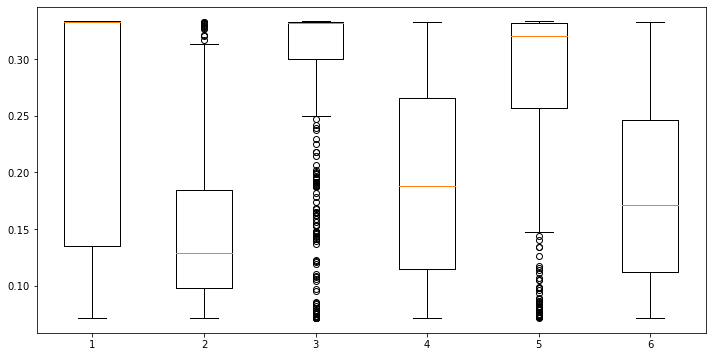

In [209]:
fig, ax = plt.subplots(figsize=(12, 6))
plt.boxplot(allbetta)
modelsnames = ["SIR",#+r"$_{FT}$",
               "eSIR",
               "SEIR",#+r"$_{400}$",
               "eSEIR",#+r"$_{FT}$",
               "SEIUR",#+r"$_{600}$",
               "eSEIUR",#+r"$_{FT}$",
               "eSEIUR",]#+r"$_{FT}^{range}$"]
ax.set_xticklabels(modelsnames)
plt.ylabel(r"${\gamma}$")
plt.grid(True)
plt.show()

In [219]:
allbetta = []
for j in range(4):
    bettaval = []
    for run in range(10):
        for i in range(len(NamesList)):
            if(PopulationSizes[i] < 1000000):
                continue
            if(CType[i] != 0):
                continue
            bettaval.append(FITPRS[j][run][i][0])
            #print(FITPRS[0][run][i][0])
    allbetta.append(bettaval)
for j in range(4,9):
    bettaval = []
    for run in range(10):
        for i in range(len(NamesList)):
            if(PopulationSizes[i] < 1000000):
                continue
            if(CType[i] != 0):
                continue
            bettaval.append(FITPRS[j][run][i][1])
            #print(FITPRS[0][run][i][0])
    allbetta.append(bettaval)

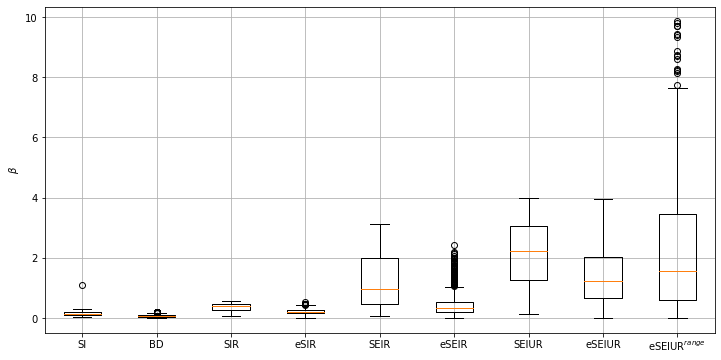

In [220]:
fig, ax = plt.subplots(figsize=(12, 6))
plt.boxplot(allbetta)
modelsnames = ["SI",
               "BD",#+r"$_{FT}$",
               "SIR",#+r"$_{FT}$",
               "eSIR",
               "SEIR",#+r"$_{400}$",
               "eSEIR",#+r"$_{FT}$",
               "SEIUR",#+r"$_{600}$",
               "eSEIUR",#+r"$_{FT}$",
               "eSEIUR"+r"$^{range}$"]
ax.set_xticklabels(modelsnames)
plt.ylabel(r"${\beta}$")
plt.grid(True)
plt.show()
fig.savefig(folder+"Parameter_boxplot_OWID_beta.eps")
fig.savefig(folder+"Parameter_boxplot_OWID_beta.svg")
fig.savefig(folder+"Parameter_boxplot_OWID_beta.png")

In [255]:
avgerr_ = np.array(avgerr_)
avgerr_scaled_ = np.copy(avgerr_)

In [256]:
avgerr_[0,:]

array([0.00175861, 0.00063844, 0.0001379 , 0.0074569 , 0.00021429,
       0.00041199, 0.00027481, 0.00234515, 0.00050269])

In [257]:
for j in range(61):
    for i in range(nmod):
        avgerr_scaled_[j,i] = avgerr_[j,i]/avgerr_[j,4]

In [258]:
order = np.argsort(avgerr_scaled_[:,5])

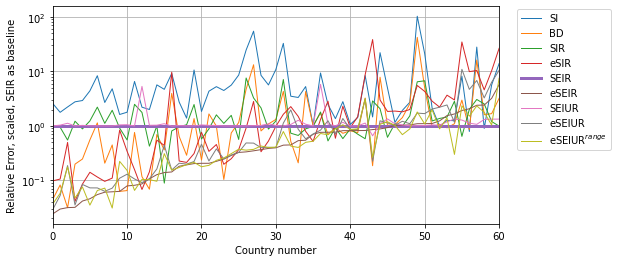

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [270]:
fig = plt.figure(figsize=(8, 4))
for i in range(nmod):
    if(i == 4):
        plt.plot(avgerr_scaled_[order,i],lw=3)
    else:
        plt.plot(avgerr_scaled_[order,i],lw=1)
plt.yscale("log")
folder = "owid_graphs_new/"
modelsnames = ["SI",
               "BD",#+r"$_{FT}$",
               "SIR",#+r"$_{FT}$",
               "eSIR",
               "SEIR",#+r"$_{400}$",
               "eSEIR",#+r"$_{FT}$",
               "SEIUR",#+r"$_{600}$",
               "eSEIUR",#+r"$_{FT}$",
               "eSEIUR"+r"$^{range}$",
               "Data"]
plt.legend(modelsnames,bbox_to_anchor=(1.03, 1.01))
plt.grid(True)
plt.xlabel("Country number")
plt.ylabel("Relative Error, scaled, SEIR as baseline")
plt.xlim(0,60)
plt.show()
fig.savefig(folder+"Comparison_new.eps")
fig.savefig(folder+"Comparison_new.svg")
fig.savefig(folder+"Comparison_new.png")

In [252]:
print(nwins)
ncount = 0
for i in range(len(NamesList)):
    if(PopulationSizes[i] < 1000000):
        continue
    if(CType[i] != 0):
        continue
    print(NamesList2[i],modelsnames[int(winnum[i])])
    ncount += 1
print(ncount)

[ 2. 10.  8.  5.  5. 17.  0.  0. 14.]
Afghanistan SIR
Armenia SIR
Australia SEIUR$_{\theta}^{range}$
Austria SEIR
Azerbaijan SIR
Belarus SEIR$_{\theta}$
Belgium SEIUR$_{\theta}^{range}$
Bolivia BD
Burkina Faso SIR$_{\theta}$
Cambodia SIR$_{\theta}$
Cameroon SEIUR$_{\theta}^{range}$
Canada SEIUR$_{\theta}^{range}$
Chile SEIR$_{\theta}$
Costa Rica SEIR$_{\theta}$
Cote d'Ivoire SIR
Croatia SEIR$_{\theta}$
Cuba SEIUR$_{\theta}^{range}$
Czechia SEIR$_{\theta}$
Democratic Republic of Congo SEIR
Egypt SIR
El Salvador SIR
Estonia SIR$_{\theta}$
Finland SEIR$_{\theta}$
France BD
Germany SEIR
Greece SEIR$_{\theta}$
Haiti SEIUR$_{\theta}^{range}$
Hungary SEIUR$_{\theta}^{range}$
India BD
Iraq BD
Ireland SIR$_{\theta}$
Israel SEIR
Italy SEIUR$_{\theta}^{range}$
Japan SI
Latvia SEIR$_{\theta}$
Lebanon BD
Liberia BD
Lithuania SEIR$_{\theta}$
Mali BD
Mauritania SEIUR$_{\theta}^{range}$
Mauritius SIR$_{\theta}$
Netherlands SEIR$_{\theta}$
New Zealand SEIR$_{\theta}$
Norway SEIR$_{\theta}$
Oman BD
Paki

In [254]:
nminus = 0
nzeros = 0
nplus = 0
for i in range(len(NamesList)):
    if(PopulationSizes[i] < 1000000):
        continue
    if(CType[i] != 0):
        continue        
    test = MannWhitneyU_myZ(AllErrors[0:10,i,6],AllErrors[0:10,i,7])
    print(NamesList2[i],test[0])    
    if(test[0] == -1):
        nminus+=1
    if(test[0] == 0):
        nzeros+=1
    if(test[0] == 1):
        nplus+=1

print(nplus)       
print(nzeros)
print(nminus)

Afghanistan -1
Armenia 1
Australia -1
Austria -1
Azerbaijan 0
Belarus 1
Belgium 1
Bolivia 1
Burkina Faso 1
Cambodia 1
Cameroon 1
Canada 1
Chile 1
Costa Rica 1
Cote d'Ivoire 0
Croatia 1
Cuba 1
Czechia 1
Democratic Republic of Congo 0
Egypt -1
El Salvador 0
Estonia 1
Finland 1
France 1
Germany -1
Greece 1
Haiti -1
Hungary 1
India 1
Iraq 1
Ireland 1
Israel -1
Italy 1
Japan -1
Latvia 1
Lebanon 1
Liberia -1
Lithuania 1
Mali 0
Mauritania 1
Mauritius 1
Netherlands 1
New Zealand 1
Norway 1
Oman -1
Pakistan 0
Saudi Arabia 1
Serbia 0
Singapore 1
Slovakia 1
Slovenia 1
Somalia 1
South Africa -1
South Korea -1
South Sudan 0
Spain 1
Switzerland 0
Thailand 0
Tunisia 1
United Kingdom 1
Zimbabwe -1
38
10
13


In [185]:
modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"]
templine = "Country\t"
for i in range(nmod):
    templine += modelsnames[i] + "\t"
templine += "\n"
nwins = np.zeros(8)
winnum = np.zeros(len(NamesList))
R0vals = []
for i in range(len(NamesList)):
    if(PopulationSizes[i] < 1000000):
        continue
    if(CType[i] != 0):
        continue
    templine += NamesList2[i]+"\t"
    #print(NamesList2[i])
    vals4 = []
    for j in range(2,6):
        bestrep = np.argmin(AllErrors[0:10,i,j])        
        val = 0
        if(j < 4):
            val = FITPRS[j][bestrep][i][0]/FITPRS[j][bestrep][i][1]        
        else:
            val = FITPRS[j][bestrep][i][1]/FITPRS[j][bestrep][i][3]        
        #print(modelsnames[j],val)
        templine += "{:.3f}".format(val)+ "\t"
        vals4.append(val)
    R0vals.append(vals4)
    templine += "\n"    
print(templine)
R0vals = np.array(R0vals)
print(np.mean(R0vals[:,0]),np.mean(R0vals[:,1]),np.mean(R0vals[:,2]),np.mean(R0vals[:,3]))

Country	SI	BD	SIR	SIR$_{\theta}$	SEIR	SEIR$_{\theta}$	SEIUR	SEIUR$_{\theta}$	
Afghanistan	1.490	1.311	3.029	2.890	
Armenia	1.161	1.328	2.450	2.153	
Australia	2.470	1.995	4.270	3.410	
Austria	2.452	1.406	30.962	29.416	
Azerbaijan	1.230	1.599	1.382	2.620	
Belarus	1.271	1.287	3.588	1.508	
Belgium	1.515	1.267	7.120	1.636	
Bolivia	1.171	1.447	2.411	1.659	
Burkina Faso	1.265	0.891	6.717	0.037	
Cambodia	0.834	0.571	0.836	0.631	
Cameroon	1.183	1.416	2.688	1.476	
Canada	1.342	1.108	4.405	1.194	
Chile	2.287	1.165	3.047	1.161	
Costa Rica	1.182	1.407	1.287	1.666	
Cote d'Ivoire	1.149	1.520	2.356	1.624	
Croatia	1.404	1.702	7.947	3.761	
Cuba	1.327	1.468	5.713	1.793	
Czechia	1.495	1.133	7.634	1.150	
Democratic Republic of Congo	1.232	1.387	2.315	1.718	
Egypt	1.934	1.609	2.472	1.909	
El Salvador	1.191	1.625	1.361	1.444	
Estonia	1.466	1.266	8.004	1.284	
Finland	1.349	1.650	5.096	2.338	
France	1.505	2.221	2.523	4.325	
Germany	2.624	2.262	4.967	4.055	
Greece	1.295	1.332	5.832	1.349	
Haiti	2.026	1.445	2.63

Error 0 mean 0.2101417686416942 median 0.0 std 0.4885552363785585
Error 1 mean 0.001199822711215127 median 0.0 std 0.0049270945731246674
Error 2 mean 0.0020508025728096023 median 0.0 std 0.009403998756748024
Error 3 mean 0.0023841379436795257 median 0.0 std 0.018121024861208746
Error 4 mean 0.0 median 0.0 std 0.0
Error 5 mean 0.0 median 0.0 std 0.0
Error 6 mean 0.0 median 0.0 std 0.0
Error 7 mean 0.0 median 0.0 std 0.0
Error 8 mean 0.0 median 0.0 std 0.0
Afghanistan
minStart 18
Parameters
[0.09478457 0.         0.         0.00093457]
[0.07226093 0.0001284  0.         0.00096983]
[0.26190467 0.1795656  0.         0.         0.00173838]
[1.37734686e-01 8.31793545e-02 1.14663699e-04 0.00000000e+00
 1.39477604e-03]
[0.00214    0.93741207 0.07398276 0.31586778 0.         0.
 0.00103459]
[8.25206327e-03 3.55392239e-01 7.77703711e-02 1.00198883e-01
 1.32344040e-04 0.00000000e+00 1.00677827e-03]
[7.96456645e-02 1.61005307e+00 7.47750914e-02 2.65738624e-01
 0.00000000e+00 0.00000000e+00 1.00000

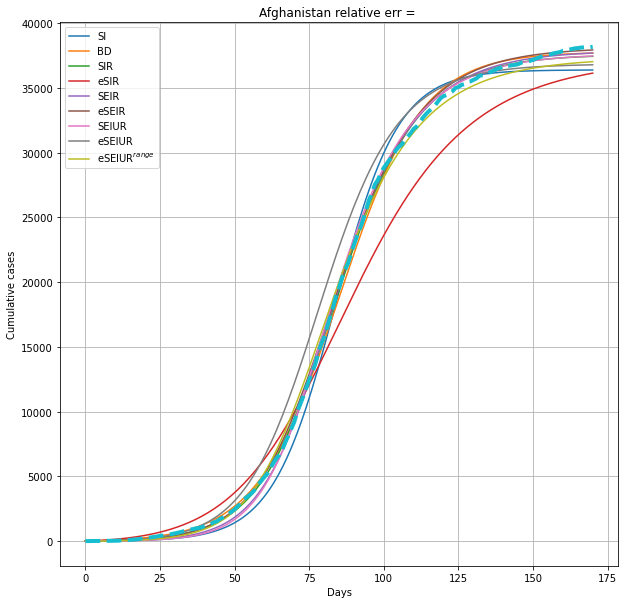

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Africa not S-curve
Albania not S-curve
Algeria not S-curve
Andorra less then 1m
Angola not S-curve
Anguilla less then 1m
Antigua and Barbuda less then 1m
Argentina not S-curve
Armenia
minStart 14
Parameters
[0.07348817 0.         0.         0.0145572 ]
[0.04920655 0.00027024 0.         0.01552102]
[0.37445112 0.3196261  0.         0.         0.05396384]
[2.50802400e-01 2.00659908e-01 1.08125090e-05 0.00000000e+00
 4.03260699e-02]
[0.00407947 0.77803441 0.0752504  0.33097986 0.         0.
 0.01655811]
[8.31608204e-03 3.13812412e-01 1.11312836e-01 1.71001776e-01
 1.23887173e-04 0.00000000e+00 1.96835241e-02]
[0.03843348 0.51278715 0.25087107 0.22003332 0.         0.
 1.         0.02182395 0.61777698]
[7.62760873e-03 4.03893187e-01 9.29067018e-02 1.05047608e-01
 2.47823054e-04 0.00000000e+00 1.00000000e+00 1.88199255e-02
 5.30155796e-01]
[4.23101380e-02 2.47857155e-01 9.78859208e-02 6.29387199e-02
 2.35641591e-04 0.00000000e+00 1.00000000e+00 1.73019767e-02
 4.97938367e-01]
ERRORS
[5.0933

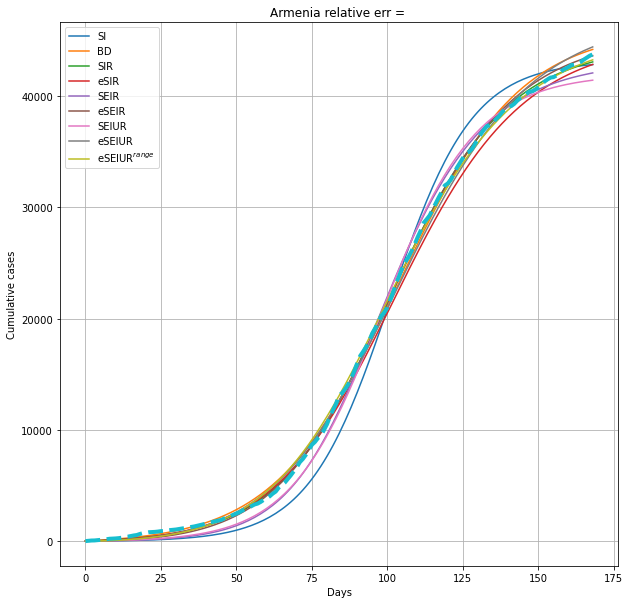

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Asia not S-curve
Australia
minStart 6
Parameters
[0.1124918  0.         0.         0.00028096]
[1.08553088e-01 5.73657846e-05 0.00000000e+00 2.80157224e-04]
[0.17393567 0.07235186 0.         0.         0.00036909]
[1.77003990e-01 9.39673509e-02 2.99075757e-05 0.00000000e+00
 5.42080508e-04]
[7.61074286e-03 3.09102444e-01 1.54711505e-01 7.35652692e-02
 0.00000000e+00 0.00000000e+00 3.05434254e-04]
[1.37070115e-02 3.65976553e-01 1.07470054e-01 8.72232679e-02
 2.18095890e-04 0.00000000e+00 2.93279296e-04]
[6.07961634e-02 3.03912579e-01 1.24923346e-01 7.21488766e-02
 0.00000000e+00 0.00000000e+00 1.00000000e+00 3.13048853e-04
 9.09346336e-01]
[4.29268891e-02 1.50743195e+00 2.06300788e-01 2.47939937e-01
 1.88275638e-05 0.00000000e+00 1.00000000e+00 2.70567924e-04
 3.17311346e-01]
[2.85938582e-01 3.64969760e-01 1.40211894e-01 2.69392403e-01
 4.25471060e-06 0.00000000e+00 1.00000000e+00 3.77504418e-04
 1.01430420e-01]
ERRORS
[0.01576287 0.01844196 0.02178895 0.04005307 0.01610892 0.02224596
 

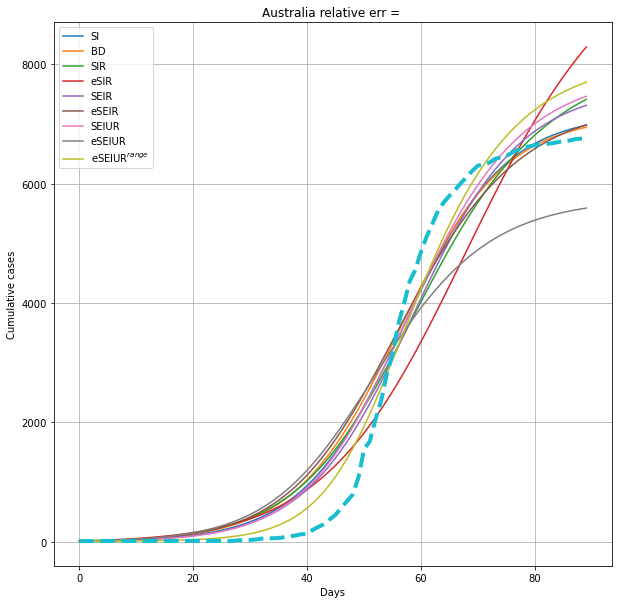

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Austria
minStart 6
Parameters
[0.25160061 0.         0.         0.00179065]
[0.13429218 0.0030732  0.         0.00183268]
[0.54964899 0.3124611  0.         0.         0.00232202]
[3.97970148e-01 1.83801785e-01 2.36591408e-04 0.00000000e+00
 2.01689330e-03]
[4.19922951e-04 1.95858856e+00 9.65134385e-02 1.53573208e-01
 0.00000000e+00 0.00000000e+00 1.74090126e-03]
[1.55826978e-02 1.84628125e+00 9.85221231e-02 1.73952326e-01
 2.96258599e-04 0.00000000e+00 1.73708913e-03]
[1.29130026e-02 3.69841392e+00 9.63242483e-02 1.72713830e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.74082734e-03
 5.35512093e-01]
[1.14240310e-02 2.09748344e+00 1.02230501e-01 1.36968377e-01
 7.24841964e-04 0.00000000e+00 1.00000000e+00 1.72243649e-03
 7.44763320e-01]
[2.34069362e-01 1.16732939e+00 1.04025077e-01 6.73693565e-02
 6.03126427e-04 0.00000000e+00 1.00000000e+00 1.72956826e-03
 5.63851693e-01]
ERRORS
[0.01130818 0.00460924 0.00070831 0.00044559 0.00010947 0.00011172
 0.00011016 0.00012765 0.00013622]
4

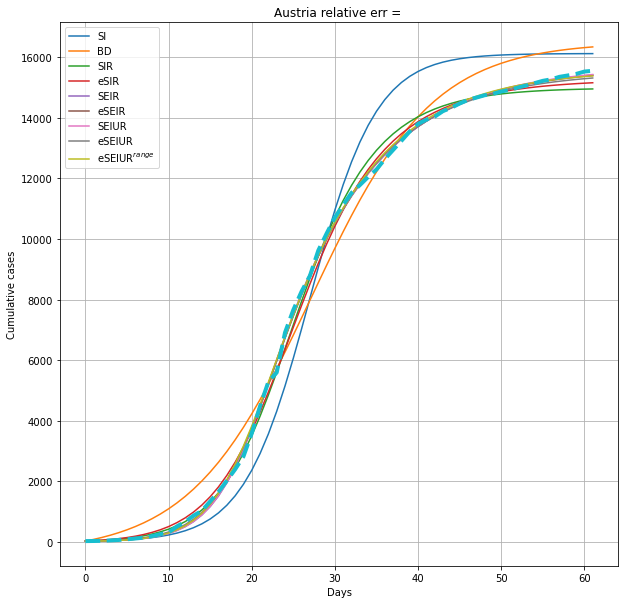

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Azerbaijan
minStart 14
Parameters
[0.06739062 0.         0.         0.00374231]
[0.04544514 0.00024874 0.         0.00407738]
[0.27938894 0.22743375 0.         0.         0.01172662]
[2.18368964e-01 1.72977311e-01 9.79581352e-06 0.00000000e+00
 1.10798541e-02]
[0.01751778 0.3539881  0.28772314 0.25016391 0.         0.
 0.00656798]
[4.46029179e-02 1.79298622e-01 2.12016488e-01 1.17398766e-01
 3.54296631e-05 0.00000000e+00 5.57380114e-03]
[0.06894038 0.64769368 0.24828765 0.19318854 0.         0.
 1.         0.00578306 0.38214177]
[1.99134467e-02 4.03448910e-01 2.34563327e-01 1.22273681e-01
 3.81174953e-05 0.00000000e+00 1.00000000e+00 5.68674809e-03
 4.85210743e-01]
[6.58726293e-02 6.53927961e-01 6.02098361e-02 4.97205028e-02
 2.49654869e-04 0.00000000e+00 1.00000000e+00 5.94220725e-03
 7.53544040e-02]
ERRORS
[0.00576501 0.00217624 0.00071568 0.0014188  0.0011896  0.00107415
 0.00169266 0.00153381 0.00243267]
2


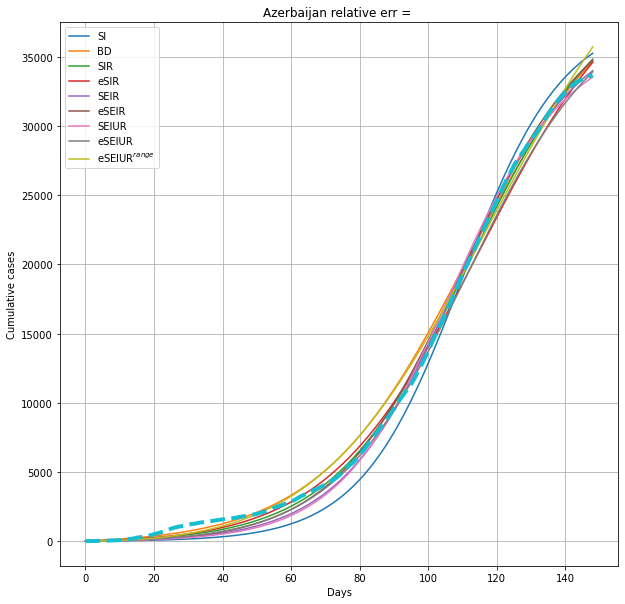

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Bahamas less then 1m
Bahrain not S-curve
Bangladesh not S-curve
Barbados less then 1m
Belarus
minStart 15
Parameters
[0.11151099 0.         0.         0.00714237]
[0.05305836 0.00112477 0.         0.00755086]
[0.426545   0.33333288 0.         0.         0.01720452]
[2.07392830e-01 1.50555202e-01 1.52260415e-04 0.00000000e+00
 1.40391284e-02]
[0.00133697 1.21970676 0.07144322 0.33320162 0.         0.
 0.00716738]
[0.01720345 0.494491   0.07334634 0.24692105 0.00100594 0.
 0.00847279]
[0.05844666 2.80868163 0.07154024 0.31850385 0.         0.
 1.         0.00719806 0.30518932]
[6.49351830e-02 2.47586628e+00 1.05632877e-01 3.10378185e-01
 5.61188202e-04 0.00000000e+00 1.00000000e+00 9.46889583e-03
 1.40112918e-01]
[3.75793974e-02 3.65830908e+00 3.88438147e-02 1.93199834e-01
 1.11422069e-03 0.00000000e+00 1.00000000e+00 7.60861785e-03
 1.65816530e-01]
ERRORS
[0.01276403 0.00106956 0.00384608 0.00024485 0.0043582  0.00017422
 0.00449218 0.00031008 0.00023362]
5


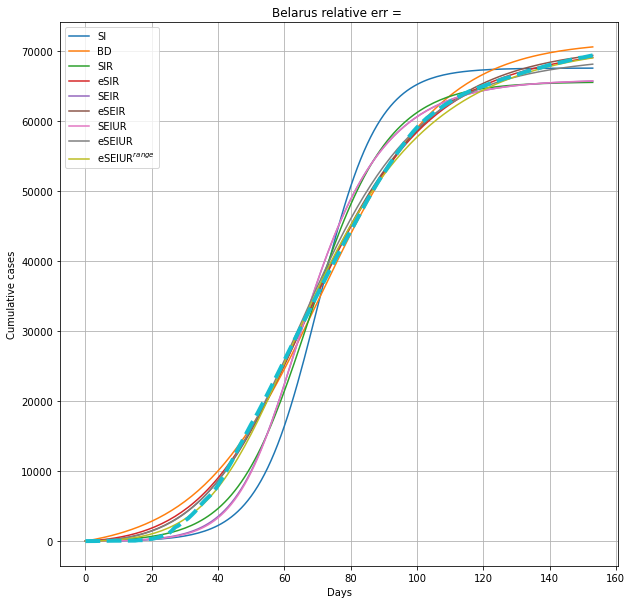

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Belgium
minStart 29
Parameters
[0.19535168 0.         0.         0.00500345]
[0.0817024  0.00271427 0.         0.00524109]
[0.51179143 0.33333332 0.         0.         0.00789024]
[0.21452986 0.11534387 0.00075681 0.         0.00655701]
[0.09972965 1.80183599 0.07143269 0.33331952 0.         0.
 0.0049645 ]
[0.03648886 0.94240257 0.07152526 0.30200211 0.00349247 0.
 0.00526809]
[0.09327616 2.23383995 0.07143756 0.33329568 0.         0.
 1.         0.00496399 0.82538326]
[0.00616746 0.79462215 0.08672908 0.16375513 0.00458844 0.
 1.         0.00521529 0.68123773]
[2.64879794e-01 5.56175750e-01 4.98362096e-02 2.13859070e-01
 8.17241587e-04 0.00000000e+00 1.00000000e+00 5.26512037e-03
 3.07565956e-01]
ERRORS
[0.01405325 0.00162312 0.0053467  0.00033031 0.00214266 0.00015921
 0.00214108 0.00030588 0.00020013]
5


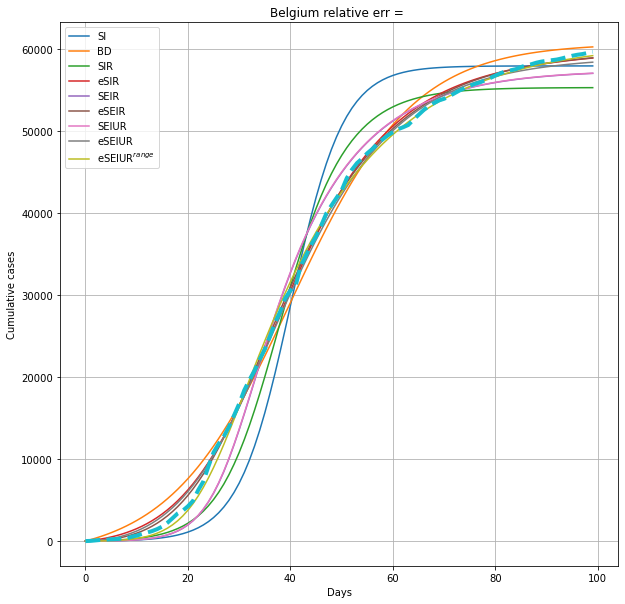

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Belize less then 1m
Benin not S-curve
Bermuda less then 1m
Bhutan less then 1m
Bolivia
minStart 5
Parameters
[0.07127103 0.         0.         0.01178966]
[0.042759   0.00013163 0.         0.0124395 ]
[0.39065147 0.33333271 0.         0.         0.04305297]
[1.49691500e-01 1.02678974e-01 2.22256571e-05 0.00000000e+00
 2.06615703e-02]
[5.91286708e-04 7.59961470e-01 7.17558971e-02 3.12684202e-01
 0.00000000e+00 0.00000000e+00 1.35076940e-02]
[3.05743635e-02 2.25999918e-01 2.00545625e-01 1.69515458e-01
 3.15073996e-05 0.00000000e+00 2.14201838e-02]
[0.00165773 1.11834387 0.0807931  0.28927802 0.         0.
 1.         0.01384376 0.58776133]
[1.66465222e-02 5.44444273e-01 8.72367626e-02 8.79552096e-02
 1.16151678e-04 0.00000000e+00 1.00000000e+00 1.47621964e-02
 3.04229988e-01]
[1.28320745e-01 1.93084617e-01 1.35234427e-01 1.28616566e-01
 2.10955644e-05 0.00000000e+00 1.00000000e+00 2.12258586e-02
 3.65833434e-01]
ERRORS
[6.72048012e-03 1.13909322e-04 1.66035888e-03 3.77037001e-03
 2.99143

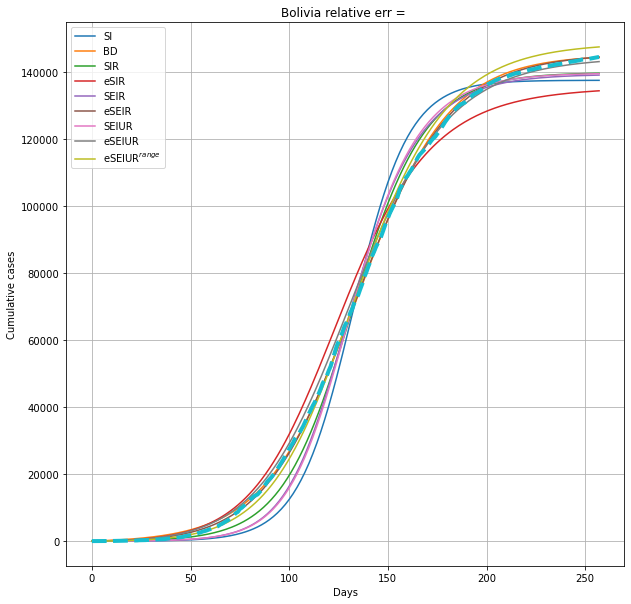

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Bosnia and Herzegovina not S-curve
Botswana not S-curve
Brazil not S-curve
Brunei less then 1m
Bulgaria not S-curve
Burkina Faso
minStart 8
Parameters
[1.61913460e-01 0.00000000e+00 0.00000000e+00 3.74813101e-05]
[1.53035428e-02 2.17372597e-02 0.00000000e+00 4.55686589e-05]
[2.85221027e-01 7.87548559e-02 0.00000000e+00 0.00000000e+00
 2.99744933e-05]
[2.29401596e-01 2.67272121e-01 6.54570508e-03 0.00000000e+00
 6.31032897e-05]
[2.42791536e-05 2.21539985e+00 7.20615086e-02 3.26781784e-01
 0.00000000e+00 0.00000000e+00 3.91693820e-05]
[8.30326033e-02 5.55579921e-04 3.32114049e-01 2.21829687e-01
 2.34745414e-02 0.00000000e+00 4.82858302e-05]
[3.99796355e-02 9.63946522e-01 1.44186651e-01 2.35700766e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 3.41813827e-05
 5.68826156e-01]
[4.65655333e-02 2.43851228e-01 3.30253399e-01 2.62346435e-01
 2.50460577e-02 0.00000000e+00 1.00000000e+00 4.68030996e-05
 2.57420557e-02]
[5.21012586e-03 3.81926064e+00 4.49812414e-01 3.07903701e-01
 2.49624774e-0

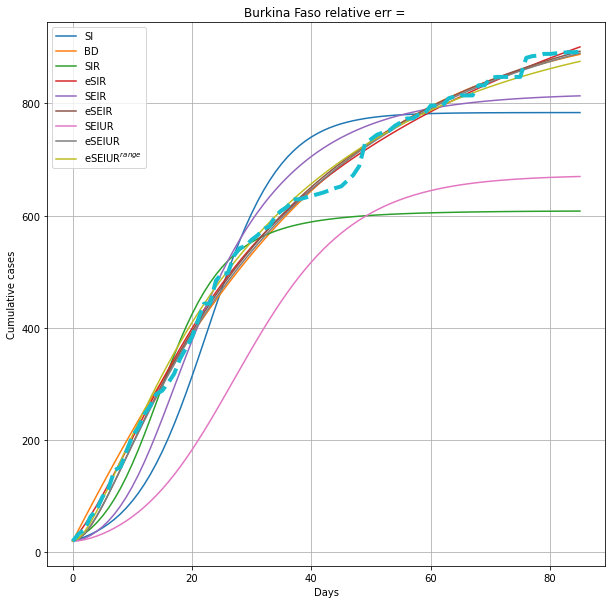

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Burundi not S-curve
Cambodia
minStart 52
Parameters
[1.08180169e+00 0.00000000e+00 0.00000000e+00 8.51488934e-06]
[3.31626256e-05 1.00764759e-02 0.00000000e+00 1.43786330e-05]
[0.0595605  0.07142858 0.         0.         0.09991933]
[1.75132507e-01 2.87907559e-01 1.88964713e-06 0.00000000e+00
 8.66783820e-03]
[0.04269992 0.18901634 0.13370023 0.33274368 0.         0.
 0.09060615]
[6.82101708e-03 2.10240716e-01 3.22394449e-01 3.29323972e-01
 9.14380401e-04 0.00000000e+00 3.57052378e-05]
[0.01819847 0.61651976 0.10888541 0.32540045 0.         0.
 1.         0.14743282 0.24275345]
[6.70098424e-03 2.33845307e-01 2.55967531e-01 2.67764085e-01
 1.19554691e-07 0.00000000e+00 1.00000000e+00 1.60984392e-01
 5.84540288e-01]
[7.44424030e-02 7.59135864e+00 4.12210832e-01 3.93523214e-01
 1.98238047e-02 0.00000000e+00 1.00000000e+00 6.91518329e-06
 3.53710963e-02]
ERRORS
[0.07262273 0.04467809 0.04486336 0.02795652 0.04792214 0.03621933
 0.04850504 0.03516838 0.05271015]
3


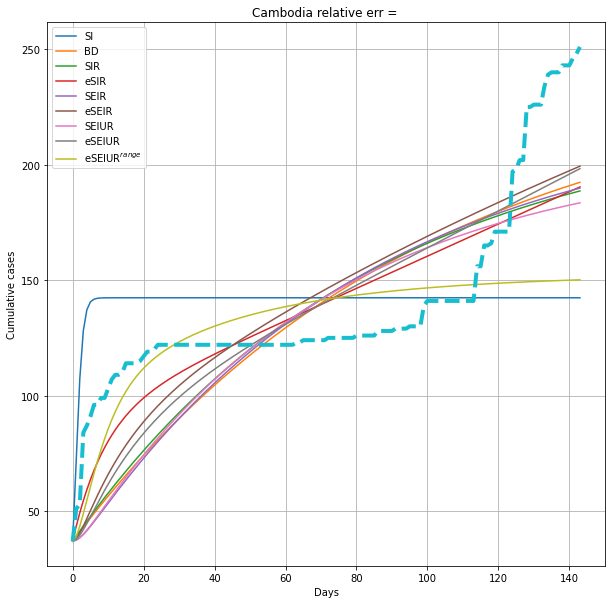

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Cameroon
minStart 13
Parameters
[0.08209462 0.         0.         0.00070839]
[0.0415647  0.00086805 0.         0.00076337]
[0.39423753 0.33321598 0.         0.         0.00251687]
[1.96791107e-01 1.72077704e-01 7.63774276e-05 0.00000000e+00
 2.96194651e-03]
[3.12927915e-03 8.17380612e-01 7.18082443e-02 3.03946480e-01
 0.00000000e+00 0.00000000e+00 7.86763806e-04]
[0.00957205 0.23731556 0.13618541 0.14912614 0.00030844 0.
 0.0010928 ]
[1.49236119e-02 2.17067235e+00 7.30659204e-02 2.41299910e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 7.73144151e-04
 2.93695840e-01]
[2.56893239e-02 7.34768234e-01 8.24076330e-02 1.18621868e-01
 4.40679838e-04 0.00000000e+00 1.00000000e+00 8.77346189e-04
 3.02970097e-01]
[9.65914522e-03 6.33491560e+00 4.86590582e-02 1.84186086e-01
 1.12089123e-03 0.00000000e+00 1.00000000e+00 9.08465811e-04
 5.68801877e-02]
ERRORS
[0.01015948 0.00102171 0.00316595 0.00535742 0.00558621 0.00157574
 0.00604471 0.00146469 0.00077877]
8


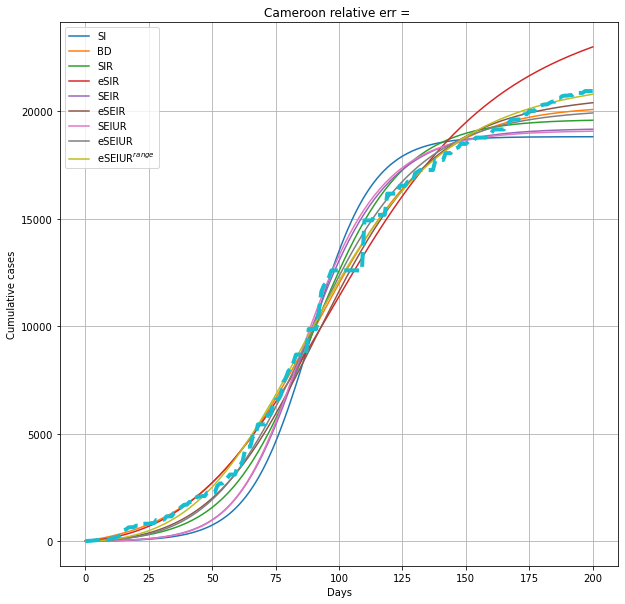

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Canada
minStart 36
Parameters
[0.1357065 0.        0.        0.0028851]
[0.04403029 0.0023669  0.         0.00317545]
[0.45717294 0.33332952 0.         0.         0.00530817]
[0.14025844 0.07835482 0.00068961 0.         0.00367193]
[0.05310272 1.27445196 0.07142861 0.3333047  0.         0.
 0.00266583]
[0.03018363 0.44179432 0.07482429 0.24310474 0.00193748 0.
 0.0032414 ]
[0.05807625 2.60703377 0.07155928 0.33048478 0.         0.
 1.         0.00267113 0.47023298]
[8.75462589e-02 5.74112319e-01 1.38718092e-01 2.18204677e-01
 8.91376768e-04 0.00000000e+00 1.00000000e+00 4.10906615e-03
 3.63058598e-01]
[0.11697993 1.22764111 0.05469486 0.24981329 0.00163334 0.
 1.         0.00322567 0.07193949]
ERRORS
[0.02864946 0.00360082 0.00804835 0.00169146 0.00650628 0.00027828
 0.00652595 0.00033873 0.00016236]
8


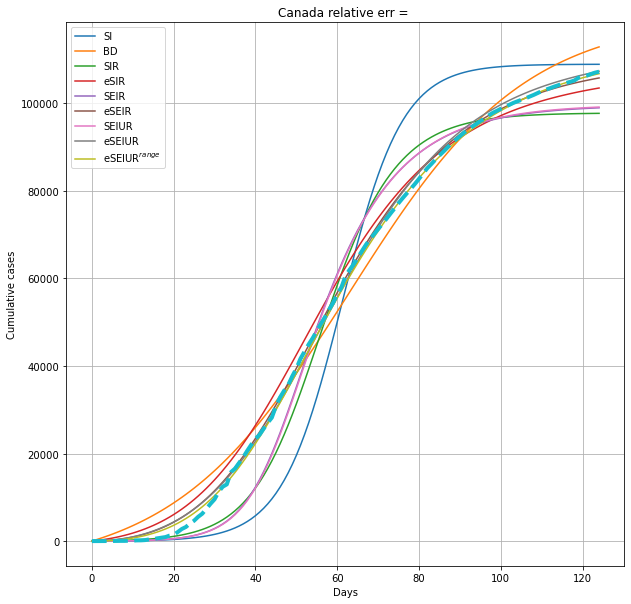

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Cape Verde less then 1m
Cayman Islands less then 1m
Central African Republic not S-curve
Chad not S-curve
Chile
minStart 9
Parameters
[0.09588781 0.         0.         0.02381179]
[0.02791992 0.00079974 0.         0.02751065]
[0.16339394 0.0714359  0.         0.         0.02825943]
[1.34926701e-01 1.09220797e-01 8.26286450e-05 0.00000000e+00
 6.76596560e-02]
[0.06515035 0.65672932 0.07142889 0.33331737 0.         0.
 0.0261174 ]
[0.05615413 0.1261624  0.07521353 0.21109132 0.00033155 0.
 0.04899467]
[0.04525251 3.41882469 0.07156131 0.32567527 0.         0.
 1.         0.02597805 0.19939826]
[8.58233347e-02 3.03575683e-01 1.27898800e-01 2.28754276e-01
 1.53495481e-04 0.00000000e+00 1.00000000e+00 7.40024154e-02
 3.21191530e-01]
[2.04719248e-02 1.53456773e+00 5.43336553e-02 1.29460893e-01
 7.22523663e-04 0.00000000e+00 1.00000000e+00 4.03606803e-02
 5.62611914e-02]
ERRORS
[0.02508022 0.00522048 0.0189728  0.00377564 0.01805008 0.00340961
 0.01808441 0.00351057 0.00364702]
5


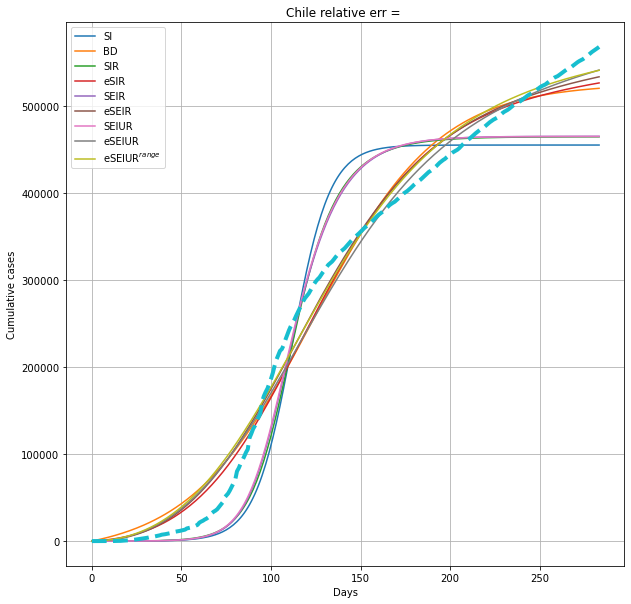

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


China not S-curve
Colombia not S-curve
Comoros less then 1m
Congo not S-curve
Costa Rica
minStart 5
Parameters
[0.04754394 0.         0.         0.02591756]
[3.09775385e-02 4.70237158e-05 0.00000000e+00 3.11311836e-02]
[0.1768425  0.14054382 0.         0.         0.09999987]
[1.22891519e-01 8.92238381e-02 1.13248194e-06 0.00000000e+00
 9.25227023e-02]
[0.01157235 0.34272206 0.29043054 0.27904184 0.         0.
 0.09639025]
[3.99097523e-02 2.51779050e-01 7.42722854e-02 2.85124646e-01
 1.45058437e-05 0.00000000e+00 7.95921461e-02]
[0.03524522 1.93270486 0.29591413 0.30681377 0.         0.
 1.         0.10589061 0.08032133]
[5.71772126e-02 3.51416643e-01 1.14279484e-01 1.54634558e-01
 1.44868607e-05 0.00000000e+00 1.00000000e+00 1.02644222e-01
 2.70115691e-01]
[4.94109972e-02 1.50752068e-01 1.30253227e-01 4.34151391e-02
 3.21555658e-05 0.00000000e+00 1.00000000e+00 6.89760493e-02
 2.98977771e-01]
ERRORS
[0.07027094 0.0272783  0.00616926 0.02321458 0.00756509 0.00129992
 0.00737574 0.000981

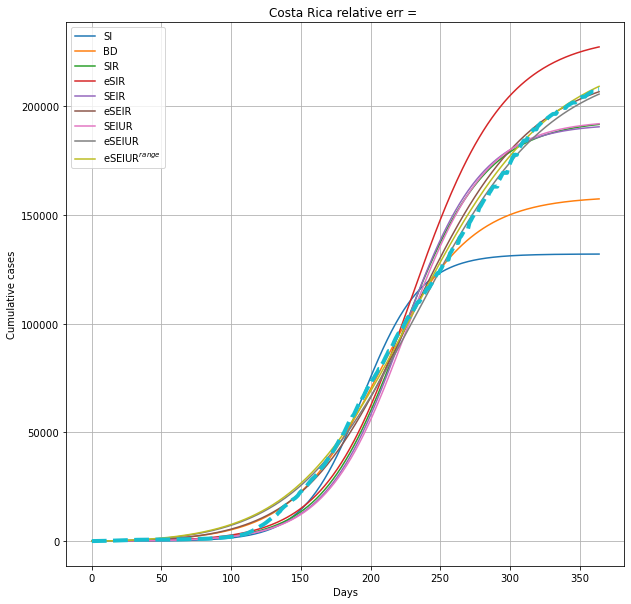

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Cote d'Ivoire
minStart 10
Parameters
[0.06936664 0.         0.         0.00075563]
[0.03983676 0.00054438 0.         0.00078699]
[0.38354165 0.33294868 0.         0.         0.00299834]
[1.51086939e-01 1.15434435e-01 7.31689490e-05 0.00000000e+00
 1.87638829e-03]
[0.00997746 0.70988326 0.07193129 0.31755491 0.         0.
 0.00085411]
[1.16061486e-02 3.03906550e-01 3.01490179e-01 2.20851796e-01
 4.08895185e-05 0.00000000e+00 1.41102869e-03]
[9.96160948e-03 1.29744218e+00 7.31473119e-02 2.26136413e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 8.29589845e-04
 4.16161572e-01]
[7.43880868e-02 1.45248313e+00 7.96936666e-02 1.61741011e-01
 3.11086833e-04 0.00000000e+00 1.00000000e+00 1.14820854e-03
 7.09059454e-02]
[1.16734921e-01 4.76928916e-01 1.09562613e-01 1.49749085e-01
 7.43979111e-05 0.00000000e+00 1.00000000e+00 1.10871108e-03
 1.89655982e-01]
ERRORS
[0.00581647 0.00172426 0.00124861 0.00807896 0.00225563 0.00134303
 0.00250358 0.00212481 0.00135236]
2


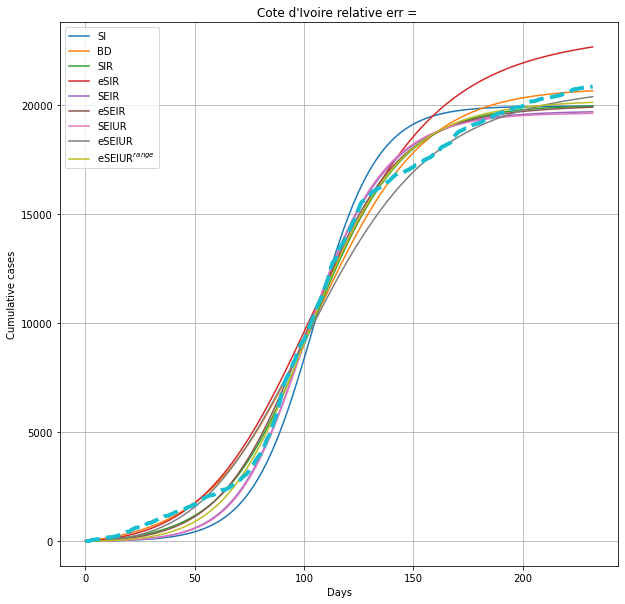

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Croatia
minStart 17
Parameters
[0.18887694 0.         0.         0.00051595]
[0.10623418 0.00810396 0.         0.00053784]
[0.46983134 0.33284094 0.         0.         0.00099552]
[0.25760565 0.14335432 0.0023421  0.         0.00068006]
[3.08058400e-05 2.66150314e+00 7.14309130e-02 3.32782551e-01
 0.00000000e+00 0.00000000e+00 5.48212427e-04]
[3.86702864e-02 5.83861142e-01 9.12772313e-02 2.67128591e-01
 2.81000528e-02 0.00000000e+00 5.57812899e-04]
[5.55327740e-03 3.63450448e+00 7.14305400e-02 3.14010530e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 5.40651745e-04
 6.89866426e-01]
[1.60447137e-02 6.06371382e-01 8.72659587e-02 1.46095335e-01
 3.18383701e-02 0.00000000e+00 1.00000000e+00 5.44079161e-04
 7.67871586e-01]
[1.98466334e-01 7.58997527e-01 9.49705908e-02 2.31953794e-01
 2.00986579e-02 0.00000000e+00 1.00000000e+00 5.64739040e-04
 7.95524753e-02]
ERRORS
[0.0046231  0.00054428 0.00052221 0.00030596 0.00042238 0.00017963
 0.00043808 0.00017227 0.00018079]
7


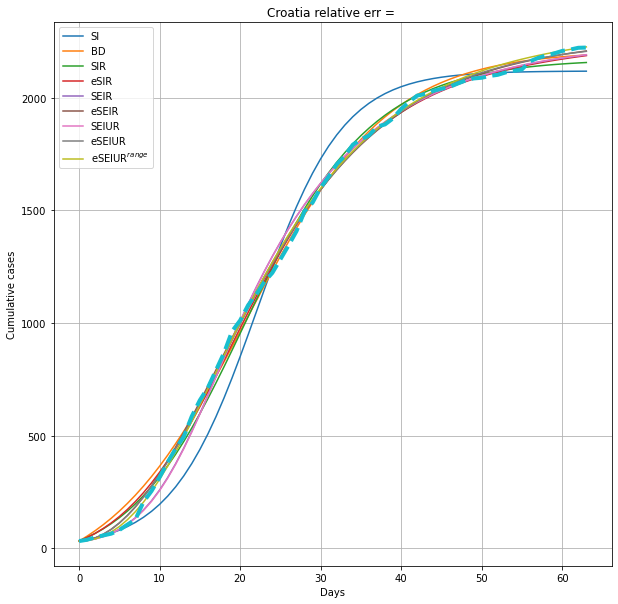

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Cuba
minStart 9
Parameters
[0.15865244 0.         0.         0.00016768]
[0.09231838 0.00491945 0.         0.00017864]
[0.4324061  0.33136994 0.         0.         0.00043532]
[0.26367854 0.2239201  0.00154073 0.         0.00037623]
[4.66005403e-04 1.77516505e+00 7.14364294e-02 3.32862433e-01
 0.00000000e+00 0.00000000e+00 1.91133979e-04]
[8.17536336e-02 1.94519470e-01 1.24267858e-01 3.15598313e-01
 9.94802925e-03 0.00000000e+00 2.35294881e-04]
[1.56018830e-02 3.16157042e+00 7.15259383e-02 3.29640380e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.89841791e-04
 5.26221988e-01]
[8.13269781e-02 8.64407009e-01 1.84289430e-01 3.03365242e-01
 7.18532922e-03 0.00000000e+00 1.00000000e+00 2.51856775e-04
 2.52801476e-01]
[1.71821202e-01 8.29436468e-01 2.43832784e-01 4.11559785e-01
 4.04680149e-03 0.00000000e+00 1.00000000e+00 2.95869196e-04
 2.16944091e-01]
ERRORS
[0.01266437 0.00480688 0.00257455 0.00091915 0.00291099 0.00062376
 0.00294151 0.00062776 0.00048403]
8


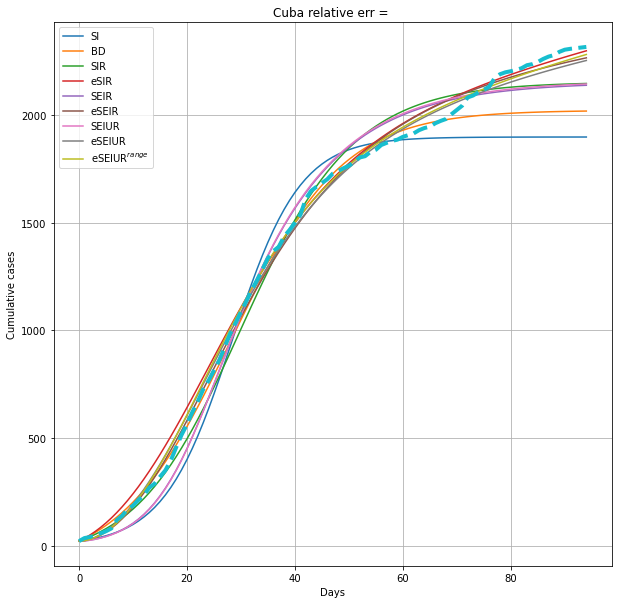

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Cyprus less then 1m
Czechia
minStart 9
Parameters
[0.19990382 0.         0.         0.00080936]
[0.05848377 0.00778388 0.         0.00089873]
[0.5239859  0.33332806 0.         0.         0.00110758]
[0.25937517 0.14732351 0.00117317 0.         0.00107598]
[1.86811600e-03 2.90933691e+00 7.14424044e-02 3.32955192e-01
 0.00000000e+00 0.00000000e+00 7.56316313e-04]
[3.06204656e-02 9.93824255e-01 7.15390740e-02 1.28529715e-01
 7.40937794e-03 0.00000000e+00 7.67704660e-04]
[7.55379939e-03 3.65293588e+00 7.14971721e-02 3.23902382e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 7.54253056e-04
 7.72168754e-01]
[7.86327724e-02 1.41259950e+00 8.07478099e-02 2.21556321e-01
 7.56531982e-03 0.00000000e+00 1.00000000e+00 7.79515946e-04
 5.27366927e-01]
[2.40220644e-01 6.44381272e+00 6.73844339e-02 3.65608768e-01
 4.06041075e-03 0.00000000e+00 1.00000000e+00 7.89295703e-04
 7.46763564e-02]
ERRORS
[0.03161389 0.00772676 0.00188204 0.00222829 0.00057726 0.00018912
 0.00058744 0.00027823 0.00020033]
5


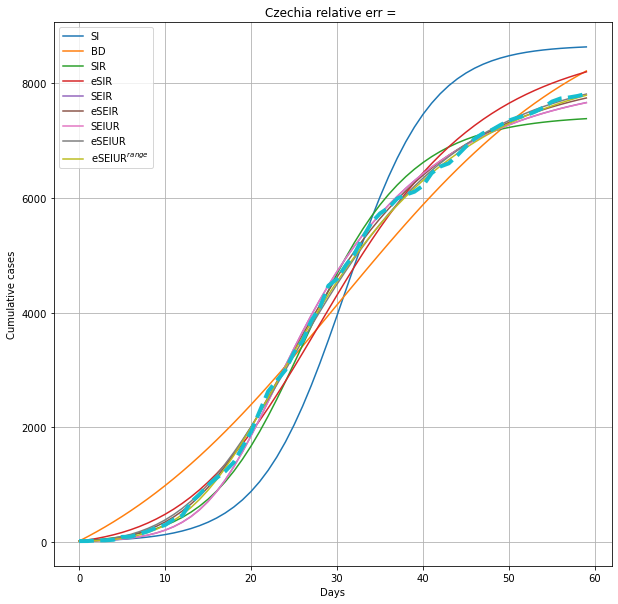

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Democratic Republic of Congo
minStart 10
Parameters
[0.06859221 0.         0.         0.00011451]
[0.04430138 0.00068594 0.         0.00012031]
[0.21038924 0.15545454 0.         0.         0.00024522]
[1.46625741e-01 1.14546772e-01 1.39836483e-04 0.00000000e+00
 2.74973504e-04]
[1.30106622e-02 6.88649077e-01 7.42312473e-02 3.24428174e-01
 0.00000000e+00 0.00000000e+00 1.31355055e-04]
[0.0579481  0.15783314 0.13993411 0.14133227 0.00030056 0.
 0.00018819]
[8.97955018e-02 4.16126178e-01 2.73897662e-01 1.60376302e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.78178466e-04
 4.83991397e-01]
[5.40558801e-03 8.40104894e-01 7.60097533e-02 1.78477101e-01
 8.38261728e-04 0.00000000e+00 1.00000000e+00 1.71508787e-04
 3.35731796e-01]
[3.22329842e-02 3.28851834e+00 3.59354625e-02 1.06750123e-01
 1.22711186e-03 0.00000000e+00 1.00000000e+00 1.29885556e-04
 6.83133037e-02]
ERRORS
[0.00417685 0.00150661 0.00047594 0.00249516 0.00069691 0.00111317
 0.0010606  0.00351088 0.00101865]
2


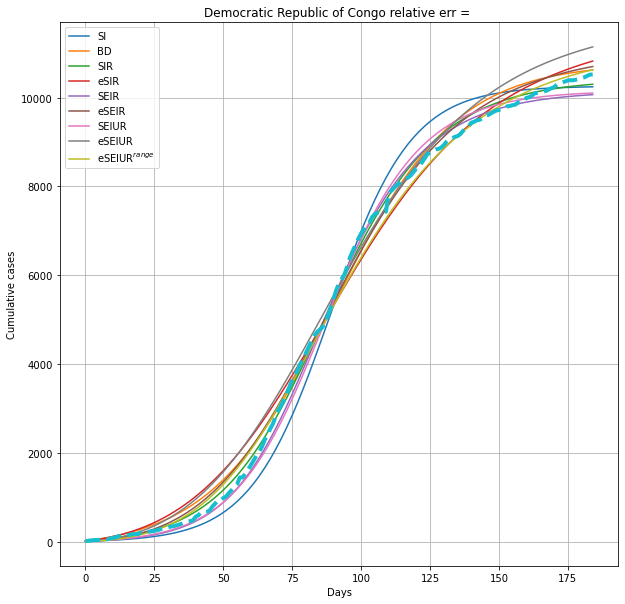

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Denmark not S-curve
Djibouti less then 1m
Dominica less then 1m
Dominican Republic not S-curve
Ecuador not S-curve
Egypt
minStart 23
Parameters
[0.07415289 0.         0.         0.00099642]
[0.058493   0.00011451 0.         0.00101212]
[0.20282381 0.13783749 0.         0.         0.00176767]
[1.57335158e-01 9.02285070e-02 6.30437682e-06 0.00000000e+00
 1.38880564e-03]
[0.08899075 0.33413403 0.2809941  0.29261368 0.         0.
 0.0017437 ]
[2.09610862e-02 2.22115815e-01 1.44491127e-01 9.52117435e-02
 2.72999486e-05 0.00000000e+00 1.09044987e-03]
[0.00949528 0.81975149 0.29194763 0.27787769 0.         0.
 1.         0.00162699 0.50139076]
[4.47788455e-02 1.30652812e+00 1.44199996e-01 1.15436852e-01
 4.59631632e-05 0.00000000e+00 1.00000000e+00 1.14582656e-03
 1.60255924e-01]
[1.13613984e-01 5.09514890e-01 9.23317186e-02 1.22139788e-01
 1.95310359e-05 0.00000000e+00 1.00000000e+00 1.20391698e-03
 2.22449148e-01]
ERRORS
[0.00344261 0.00058806 0.00024469 0.00095584 0.00025028 0.00140435
 0.

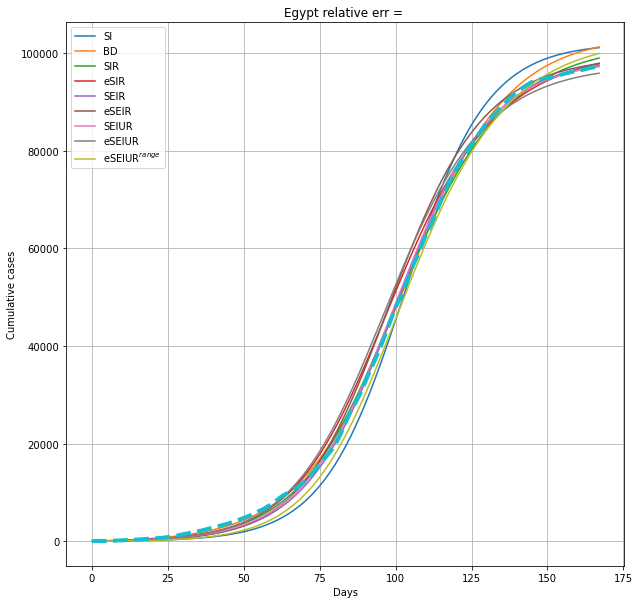

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


El Salvador
minStart 8
Parameters
[0.06470805 0.         0.         0.00439376]
[0.04722354 0.00013238 0.         0.00464805]
[0.30597165 0.25674834 0.         0.         0.01551052]
[2.48753438e-01 2.05589150e-01 6.43003183e-06 0.00000000e+00
 1.44334905e-02]
[0.01671073 0.44219547 0.22872515 0.32123156 0.         0.
 0.00829933]
[8.63726175e-03 2.30138193e-01 1.08853257e-01 1.18599580e-01
 7.09859284e-05 0.00000000e+00 5.88717324e-03]
[0.02524579 2.61372418 0.27843158 0.29523085 0.         0.
 1.         0.00875589 0.14129954]
[1.93988267e-02 1.65353370e+00 8.83182952e-02 8.28283773e-02
 1.38568532e-04 0.00000000e+00 1.00000000e+00 6.00689925e-03
 9.05947276e-02]
[1.57917120e-01 8.55404616e-01 3.44337165e-01 9.52738194e-02
 9.51636062e-06 0.00000000e+00 1.00000000e+00 7.69424147e-03
 1.14891480e-01]
ERRORS
[0.0033789  0.00068008 0.00070793 0.00147804 0.00124102 0.00095515
 0.00118782 0.00148221 0.00181788]
1


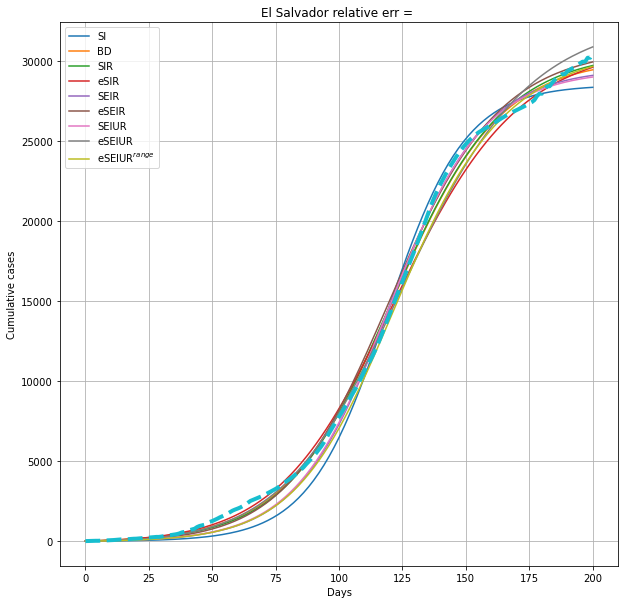

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Equatorial Guinea not S-curve
Eritrea not S-curve
Estonia
minStart 12
Parameters
[0.19624591 0.         0.         0.00133595]
[0.07771956 0.00906063 0.         0.00141067]
[0.4949085  0.33333128 0.         0.         0.00228504]
[0.31260047 0.21418188 0.00157223 0.         0.00207292]
[7.92782083e-05 2.77306544e+00 7.14297722e-02 3.33294258e-01
 0.00000000e+00 0.00000000e+00 1.36039177e-03]
[0.04426122 0.33215855 0.25926903 0.24049364 0.00742144 0.
 0.00163594]
[1.75944417e-03 3.72874547e+00 7.14371542e-02 3.33254263e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.35184924e-03
 7.36768490e-01]
[0.00760518 1.05304386 0.12630304 0.24404559 0.01660002 0.
 1.         0.00144614 0.41473921]
[4.39933758e-02 4.04934425e+00 1.36577937e-01 2.62554544e-01
 1.47974447e-02 0.00000000e+00 1.00000000e+00 1.48964372e-03
 8.35244966e-02]
ERRORS
[0.00823473 0.00108701 0.00229309 0.00035426 0.00146543 0.00039737
 0.00146735 0.00043807 0.00047535]
3


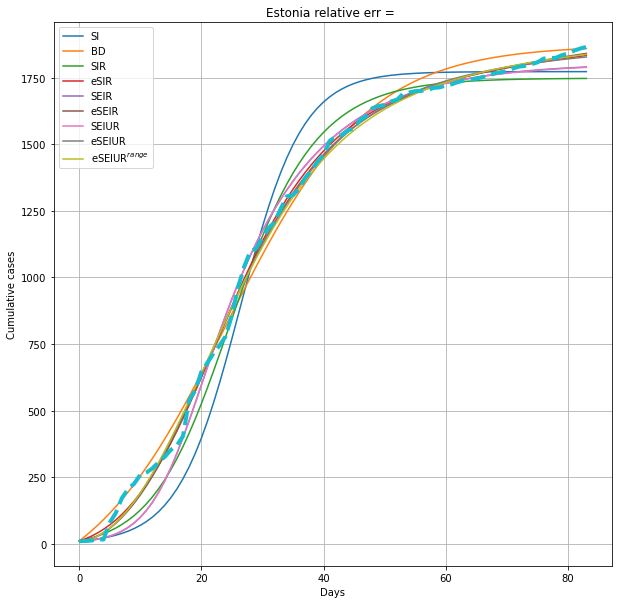

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Eswatini not S-curve
Ethiopia not S-curve
Europe not S-curve
European Union not S-curve
Faeroe Islands less then 1m
Falkland Islands less then 1m
Fiji less then 1m
Finland
minStart 38
Parameters
[0.14763098 0.         0.         0.00121463]
[0.06239214 0.0041639  0.         0.00130291]
[0.45190314 0.33332521 0.         0.         0.00256776]
[0.29388659 0.23136471 0.00047029 0.         0.00268013]
[2.04928671e-04 1.73159402e+00 7.14326990e-02 3.33320428e-01
 0.00000000e+00 0.00000000e+00 1.24006897e-03]
[0.00789845 0.20158093 0.0937061  0.11061957 0.00858648 0.
 0.0014383 ]
[1.35713286e-02 1.99539200e+00 7.15083772e-02 3.32817249e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.23706079e-03
 8.19939163e-01]
[0.00185924 1.27347136 0.08037579 0.18748509 0.00917983 0.
 1.         0.00145376 0.25546033]
[5.04227307e-02 4.21750710e+00 5.31764591e-02 1.78058969e-01
 1.02119345e-02 0.00000000e+00 1.00000000e+00 1.38295406e-03
 7.38426794e-02]
ERRORS
[0.01307025 0.00020893 0.00482413 0.0003

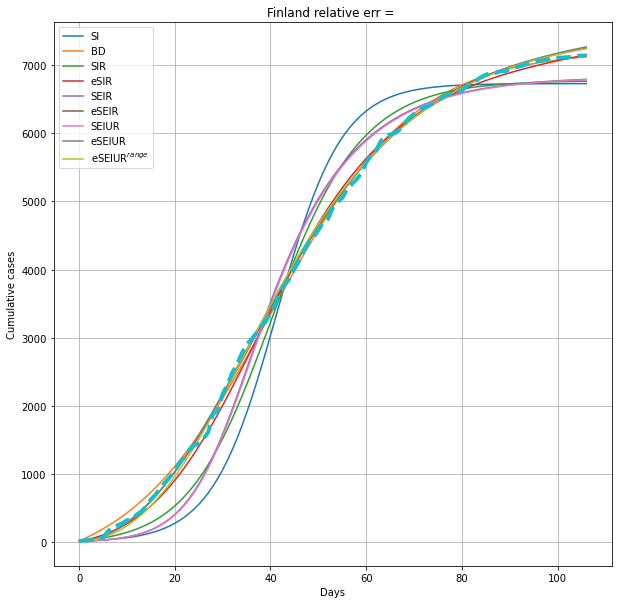

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


France
minStart 35
Parameters
[0.19035884 0.         0.         0.00259647]
[0.13816439 0.00036831 0.         0.00264341]
[0.50164682 0.33333318 0.         0.         0.00456639]
[0.21423152 0.0924603  0.00034297 0.         0.00327343]
[0.01156474 0.85472891 0.27032786 0.32835855 0.         0.
 0.00289928]
[0.01325749 0.38608832 0.14238387 0.07309621 0.00095969 0.
 0.00277091]
[2.54564626e-03 2.73915325e+00 2.08914325e-01 3.25250765e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.81071711e-03
 3.56194635e-01]
[1.20050630e-03 5.68180331e-01 2.23260031e-01 7.94876361e-02
 9.74069876e-04 0.00000000e+00 1.00000000e+00 2.78670343e-03
 5.46712770e-01]
[9.93388031e-02 5.05156611e+00 1.27489630e-01 9.52469998e-02
 8.37773759e-04 0.00000000e+00 1.00000000e+00 2.80448768e-03
 5.88604106e-02]
ERRORS
[0.01080154 0.00794194 0.00892297 0.00910405 0.01010294 0.00832223
 0.01014029 0.00816306 0.00883466]
1


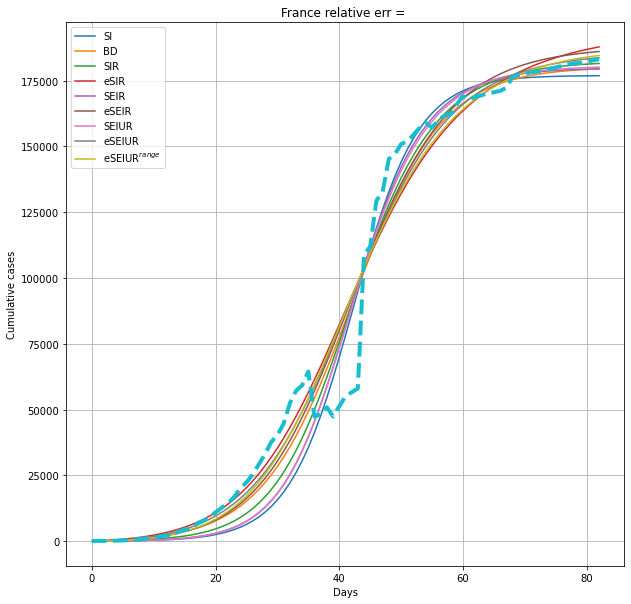

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Gabon not S-curve
Gambia not S-curve
Georgia not S-curve
Germany
minStart 7
Parameters
[0.15422077 0.         0.         0.0022242 ]
[0.09305818 0.00023195 0.         0.00227893]
[0.26694522 0.11484071 0.         0.         0.00242319]
[2.34223970e-01 1.24128653e-01 5.07265659e-05 0.00000000e+00
 2.83189620e-03]
[0.0825683  0.75801763 0.07163589 0.14761215 0.         0.
 0.002162  ]
[5.92204909e-02 6.28291993e-01 8.43196082e-02 9.73547992e-02
 5.29406938e-06 0.00000000e+00 2.10032470e-03]
[5.12264062e-02 3.55178828e+00 7.25029631e-02 2.36147640e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.16739306e-03
 3.09527196e-01]
[2.20711667e-02 1.91245083e+00 1.04011344e-01 1.54282326e-01
 5.08341380e-05 0.00000000e+00 1.00000000e+00 2.13446428e-03
 3.42235173e-01]
[3.05616735e-01 1.55950765e+00 6.62786654e-02 4.28077678e-02
 3.85260992e-07 0.00000000e+00 1.00000000e+00 2.15605766e-03
 1.14837478e-02]
ERRORS
[0.00952801 0.0053018  0.0010413  0.00244144 0.00034201 0.0007113
 0.00037161 0.00

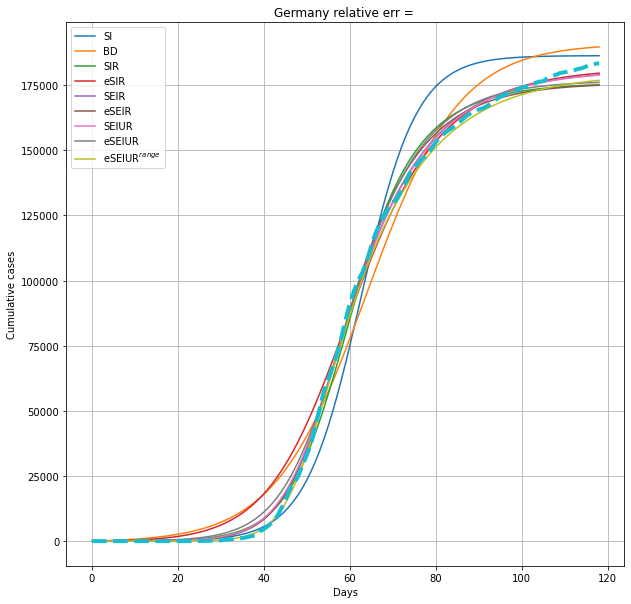

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Ghana not S-curve
Gibraltar less then 1m
Greece
minStart 14
Parameters
[0.1554696  0.         0.         0.00026406]
[0.07367258 0.008908   0.         0.00027862]
[0.42980505 0.32685338 0.         0.         0.00059386]
[0.23445123 0.14745759 0.00178332 0.         0.00037801]
[3.11985109e-04 2.00858777e+00 7.14912929e-02 3.32817418e-01
 0.00000000e+00 0.00000000e+00 2.70653887e-04]
[0.05637152 0.28858596 0.1899703  0.26313638 0.01033918 0.
 0.00032086]
[1.39710920e-02 3.69335257e+00 7.16247035e-02 3.29647353e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.65704869e-04
 5.12760328e-01]
[6.88079728e-02 6.77425925e-01 1.65249840e-01 2.62300470e-01
 1.15485802e-02 0.00000000e+00 1.00000000e+00 3.08686319e-04
 3.96019071e-01]
[1.57342314e-02 4.71044344e+00 5.45634810e-02 7.44343164e-02
 3.01723826e-02 0.00000000e+00 1.00000000e+00 2.75934306e-04
 1.28453351e-01]
ERRORS
[0.00533925 0.00104088 0.00083022 0.00042673 0.00094994 0.00034088
 0.00097849 0.00036452 0.00037156]
5


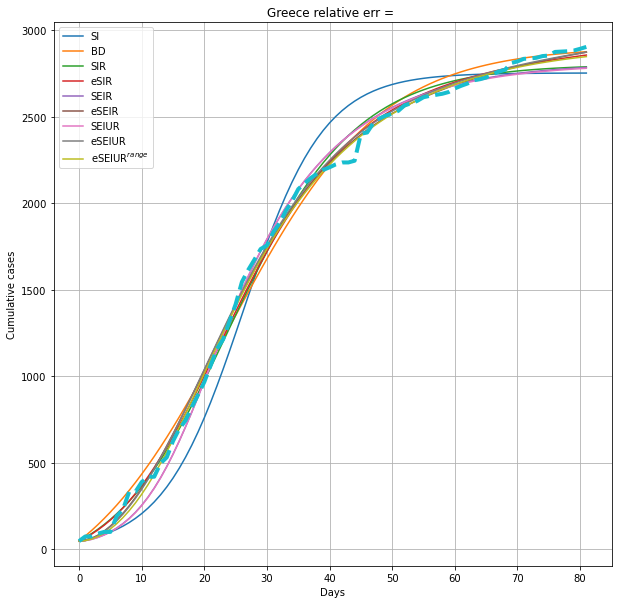

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Greenland less then 1m
Grenada less then 1m
Guatemala not S-curve
Guernsey less then 1m
Guinea not S-curve
Guinea-Bissau not S-curve
Guyana less then 1m
Haiti
minStart 12
Parameters
[0.08052753 0.         0.         0.00072812]
[0.05840791 0.00044986 0.         0.0007485 ]
[0.14538121 0.07161834 0.         0.         0.00093187]
[0.14832984 0.11799358 0.00028982 0.         0.00160507]
[0.06066419 0.52045226 0.07189884 0.2961596  0.         0.
 0.00082501]
[5.11055990e-03 3.83460770e-01 9.13340177e-02 1.68578132e-01
 3.15389840e-04 0.00000000e+00 8.52849593e-04]
[3.13611937e-02 5.91772091e-01 7.23648887e-02 2.58559044e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 8.18767248e-04
 9.87177342e-01]
[4.35553709e-03 1.47274576e+00 8.44430816e-02 1.88654556e-01
 4.60722051e-04 0.00000000e+00 1.00000000e+00 8.86122834e-04
 2.75557125e-01]
[5.17101758e-02 1.67759845e+00 1.79055046e-01 3.16342115e-01
 3.22046747e-05 0.00000000e+00 1.00000000e+00 1.14716482e-03
 2.49813752e-01]
ERRORS
[0.00443

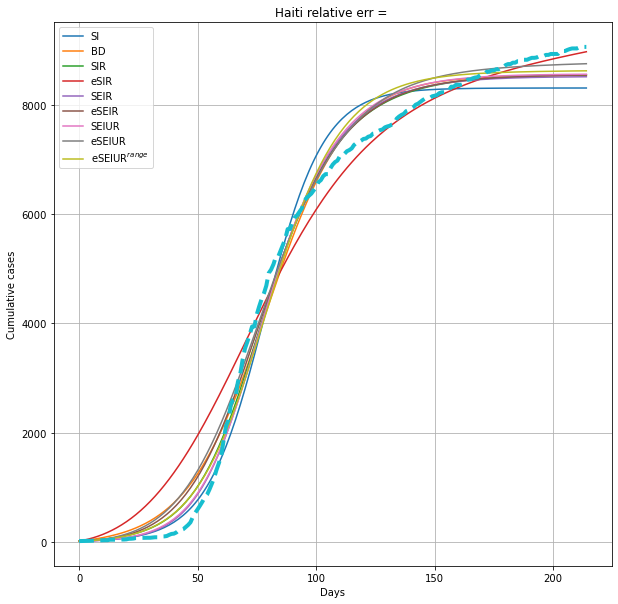

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Honduras not S-curve
Hong Kong not S-curve
Hungary
minStart 6
Parameters
[0.14204544 0.         0.         0.00041989]
[0.06430796 0.00348814 0.         0.00044133]
[0.45009054 0.33326839 0.         0.         0.00085286]
[0.16912976 0.11316974 0.00146719 0.         0.00062613]
[9.03455835e-04 1.67656567e+00 7.14664535e-02 3.33263828e-01
 0.00000000e+00 0.00000000e+00 4.10985313e-04]
[2.68221845e-02 4.77203519e-01 8.21262307e-02 2.34586196e-01
 4.94981462e-03 0.00000000e+00 4.63852667e-04]
[3.07730936e-02 1.65527798e+00 7.14909380e-02 3.33120565e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 4.11581048e-04
 9.08427542e-01]
[4.63114867e-02 1.10043026e+00 7.57600356e-02 1.79034015e-01
 5.17755517e-03 0.00000000e+00 1.00000000e+00 4.54662532e-04
 3.26558483e-01]
[9.21952674e-02 3.57919375e+00 4.29621760e-02 2.39501018e-01
 4.83313634e-03 0.00000000e+00 1.00000000e+00 4.52302547e-04
 1.81596979e-01]
ERRORS
[0.01258804 0.00153219 0.00222251 0.00169483 0.00221821 0.00026315
 0.0022571  0.

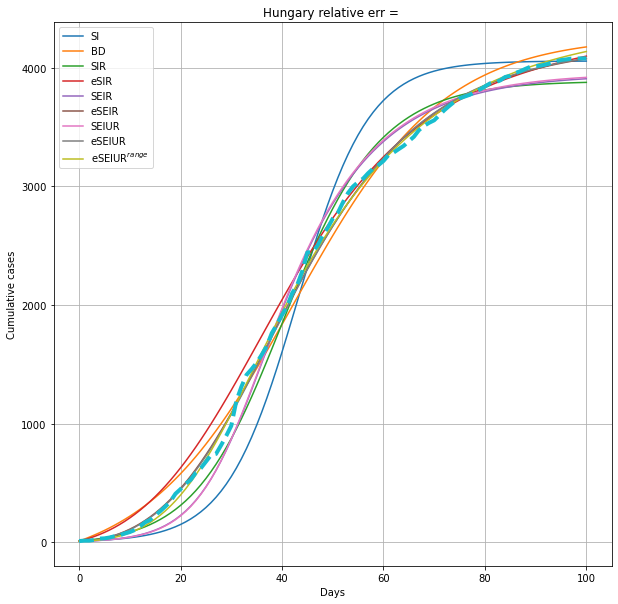

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Iceland less then 1m
India
minStart 36
Parameters
[0.06519185 0.         0.         0.00724695]
[2.97838663e-02 7.62649633e-05 0.00000000e+00 7.99195379e-03]
[0.3891238  0.3333332  0.         0.         0.02645916]
[1.40742261e-01 1.01470138e-01 2.77297397e-06 0.00000000e+00
 1.49878584e-02]
[0.02341138 0.61904224 0.07238772 0.32522673 0.         0.
 0.00841153]
[3.32734012e-02 1.81599424e-01 8.87476176e-02 1.55933335e-01
 2.25867315e-05 0.00000000e+00 1.26726743e-02]
[0.0649846  0.56084093 0.07253463 0.33287753 0.         0.
 1.         0.00849598 0.75386697]
[2.42570881e-02 5.67068525e-01 1.02391190e-01 7.90014515e-02
 1.79213743e-05 0.00000000e+00 1.00000000e+00 1.05192220e-02
 2.11613755e-01]
[1.63308896e-02 7.12741422e+00 7.30200607e-02 1.84304370e-01
 2.36451749e-05 0.00000000e+00 1.00000000e+00 1.12529383e-02
 2.65854088e-02]
ERRORS
[0.01475031 0.00078301 0.00829347 0.00116274 0.00915464 0.00042395
 0.00951737 0.00072717 0.00043874]
5


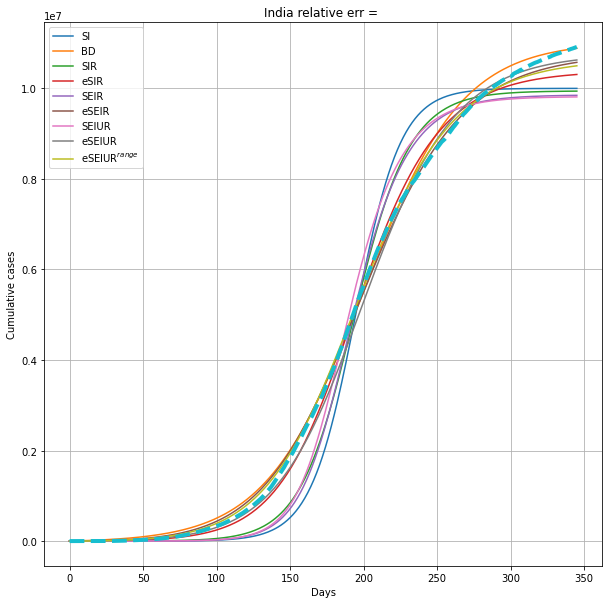

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Indonesia not S-curve
International less then 1m
Iran not S-curve
Iraq
minStart 7
Parameters
[0.05129426 0.         0.         0.01415735]
[2.86201671e-02 9.08427196e-05 0.00000000e+00 1.54769165e-02]
[0.37323704 0.33333096 0.         0.         0.07104855]
[1.88096733e-01 1.67843161e-01 5.25315997e-06 0.00000000e+00
 8.22214404e-02]
[0.02048352 0.39327528 0.31130066 0.32032391 0.         0.
 0.03430692]
[3.73946144e-02 2.46412323e-01 1.94979519e-01 2.30211374e-01
 8.76815304e-06 0.00000000e+00 3.87544649e-02]
[0.07320995 0.56243782 0.28050264 0.2938829  0.         0.
 1.         0.03486742 0.52434576]
[2.51177896e-02 3.13223503e+00 1.48256343e-01 2.09951115e-01
 1.88671992e-05 0.00000000e+00 1.00000000e+00 3.66463126e-02
 3.97995720e-02]
[1.45519573e-02 3.63092120e-01 4.12316229e-02 5.69298443e-02
 7.56561070e-05 0.00000000e+00 1.00000000e+00 1.70770762e-02
 3.30829767e-01]
ERRORS
[0.01124875 0.00039752 0.00348468 0.00315323 0.00622669 0.00105872
 0.0068155  0.00080566 0.00062248]
1


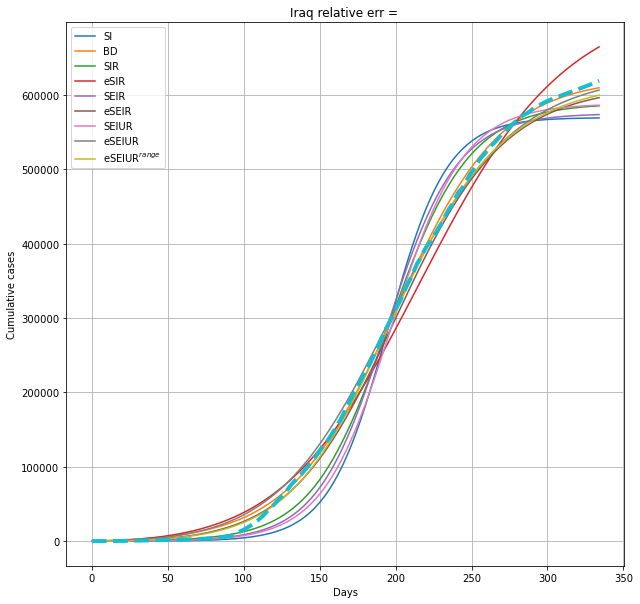

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Ireland
minStart 12
Parameters
[0.18624069 0.         0.         0.00480306]
[0.11821088 0.00109051 0.         0.00501043]
[0.49206572 0.33333277 0.         0.         0.00881875]
[0.22980518 0.10459868 0.0004194  0.         0.00607908]
[3.66862596e-04 2.17297122e+00 7.14558167e-02 3.33218570e-01
 0.00000000e+00 0.00000000e+00 5.16136915e-03]
[0.0653037  0.52543162 0.13432123 0.2364892  0.00140036 0.
 0.00552166]
[0.00955834 2.50385294 0.07155093 0.33306031 0.         0.
 1.         0.00515309 0.84455984]
[0.08114035 0.65078672 0.10885939 0.07848028 0.00172099 0.
 1.         0.00512191 0.50516409]
[1.29121854e-01 2.60069545e+00 2.09235006e-01 6.25788959e-02
 1.43130190e-03 0.00000000e+00 1.00000000e+00 5.35476762e-03
 6.00465854e-02]
ERRORS
[0.00456974 0.00044792 0.00115466 0.00018627 0.00053793 0.00020323
 0.00054451 0.00022216 0.00026415]
3


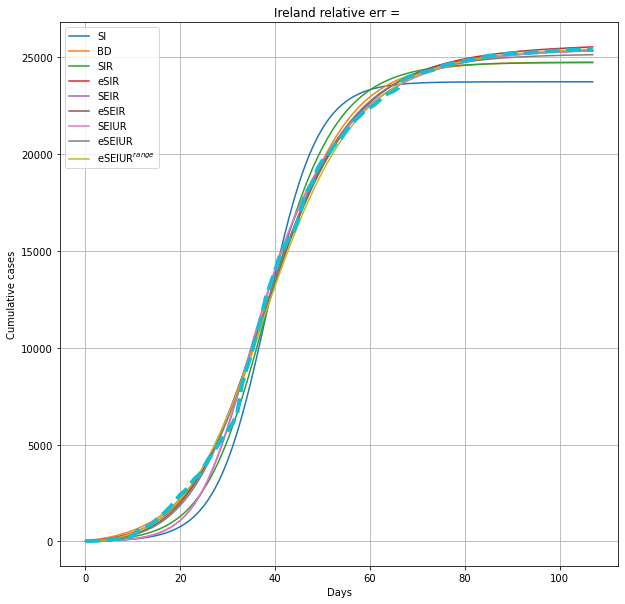

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Isle of Man less then 1m
Israel
minStart 13
Parameters
[0.21913872 0.         0.         0.00181469]
[0.14099031 0.00131997 0.         0.00187412]
[0.52582836 0.33333143 0.         0.         0.00293343]
[0.275595   0.13819698 0.00069674 0.         0.00238076]
[9.97132082e-02 2.08258976e+00 7.14403830e-02 3.32369687e-01
 0.00000000e+00 0.00000000e+00 1.98480468e-03]
[7.29632223e-02 1.43937351e+00 7.23763901e-02 2.12582215e-01
 9.30304250e-04 0.00000000e+00 1.99637112e-03]
[9.32711632e-02 3.50043397e+00 7.18498063e-02 3.27522481e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.98438378e-03
 5.99027533e-01]
[4.96298550e-02 1.95518043e+00 7.60312619e-02 1.32953095e-01
 1.87039161e-03 0.00000000e+00 1.00000000e+00 1.97260546e-03
 5.38216342e-01]
[3.46860688e-01 7.73230489e-01 7.62587753e-02 2.66805351e-01
 3.04537529e-04 0.00000000e+00 1.00000000e+00 1.99156109e-03
 2.78493456e-01]
ERRORS
[0.00621009 0.001396   0.00196971 0.00140113 0.00029094 0.00031416
 0.00030538 0.00039704 0.0002977

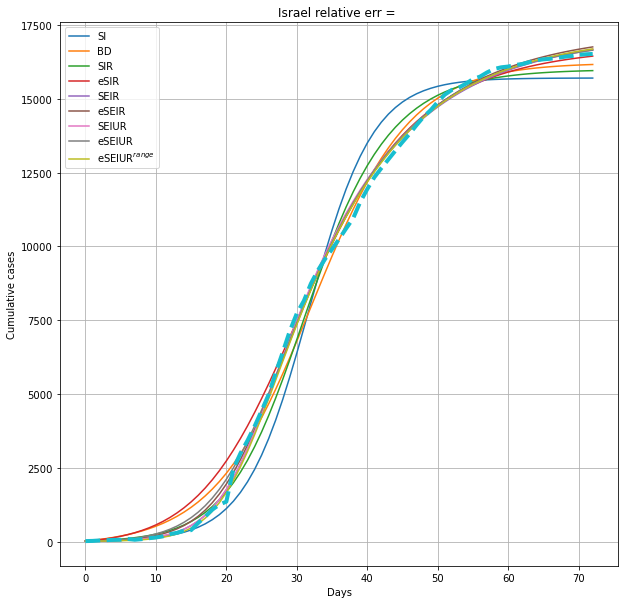

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Italy
minStart 23
Parameters
[0.17634296 0.         0.         0.00384633]
[0.0683043  0.00360513 0.         0.00400177]
[0.49057291 0.33332671 0.         0.         0.0065241 ]
[0.21208296 0.1389366  0.000998   0.         0.00571524]
[0.09987269 1.56579937 0.07142866 0.33333155 0.         0.
 0.00377198]
[0.09078952 0.34217781 0.07147108 0.24486724 0.00497529 0.
 0.00413849]
[0.09637047 2.51773362 0.07143912 0.33198854 0.         0.
 1.         0.00376696 0.62380851]
[0.01287469 1.40627976 0.07321241 0.25336778 0.00592328 0.
 1.         0.00408708 0.463318  ]
[6.10370450e-02 5.06074191e+00 3.96363759e-02 7.51432009e-02
 3.86591605e-03 0.00000000e+00 1.00000000e+00 4.06629320e-03
 1.89262013e-01]
ERRORS
[1.47314334e-02 1.36399371e-03 5.93509023e-03 4.91879036e-04
 3.06173290e-03 1.83591893e-04 3.06681381e-03 2.51354501e-04
 9.46571787e-05]
8


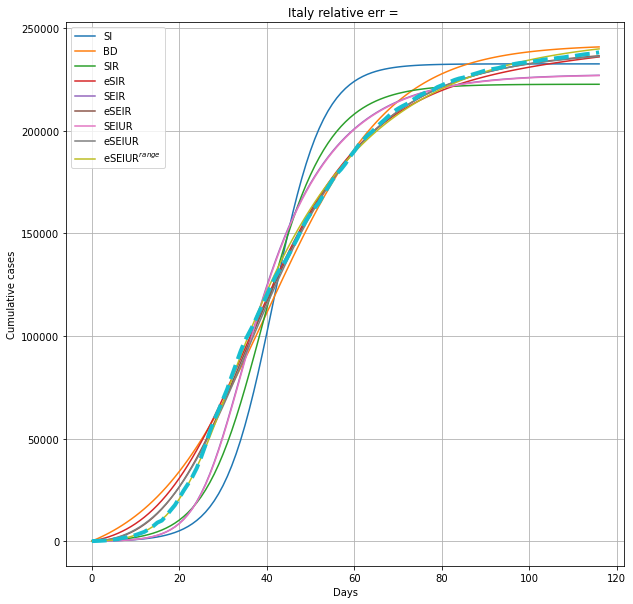

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Jamaica not S-curve
Japan
minStart 10
Parameters
[0.09101208 0.         0.         0.00013825]
[9.07392110e-02 2.14311138e-07 0.00000000e+00 1.37376567e-04]
[0.16108658 0.07772086 0.         0.         0.00018386]
[1.58966001e-01 1.08485951e-01 1.18143392e-04 0.00000000e+00
 2.63494532e-04]
[3.53175668e-03 2.45864886e-01 1.70651620e-01 7.20473300e-02
 0.00000000e+00 0.00000000e+00 1.44403245e-04]
[7.23393333e-02 2.61269135e-01 1.40989908e-01 1.37059841e-01
 7.15442277e-06 0.00000000e+00 1.59870780e-04]
[9.43548456e-02 2.17489674e-01 8.78769016e-02 8.15045865e-02
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.47405626e-04
 9.00790405e-01]
[6.79067097e-02 2.23325815e+00 1.98504844e-01 1.84462709e-01
 4.36812854e-06 0.00000000e+00 1.00000000e+00 1.73999420e-04
 1.34012120e-01]
[1.59014245e-01 2.98877571e-01 4.02795062e-01 4.03413123e-02
 1.68710037e-07 0.00000000e+00 1.00000000e+00 1.52560476e-04
 3.69754505e-01]
ERRORS
[0.00216763 0.00215416 0.00597553 0.0221961  0.0025904  0.00345095
 

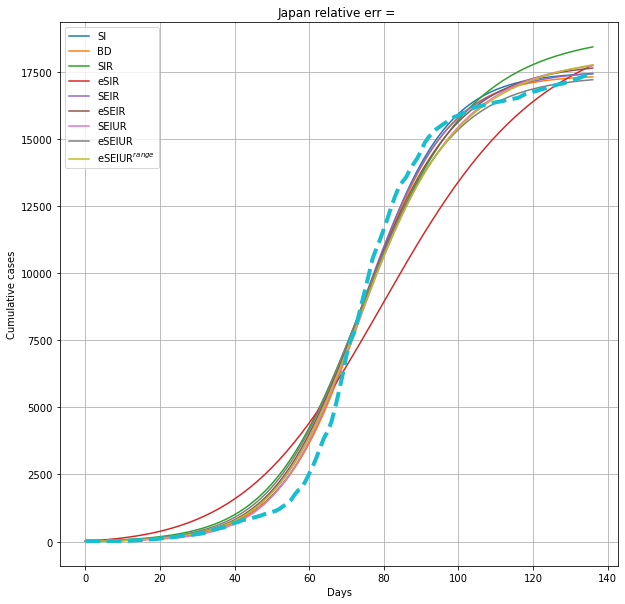

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Jersey less then 1m
Jordan not S-curve
Kazakhstan not S-curve
Kenya not S-curve
Kosovo not S-curve
Kuwait not S-curve
Kyrgyzstan not S-curve
Laos not S-curve
Latvia
minStart 15
Parameters
[0.16640066 0.         0.         0.00053004]
[0.03701075 0.01411466 0.         0.00059561]
[0.45225183 0.33328572 0.         0.         0.00110881]
[0.18800811 0.18462932 0.00433117 0.         0.00090948]
[4.95780515e-04 2.27111811e+00 7.14287133e-02 3.33285999e-01
 0.00000000e+00 0.00000000e+00 5.37875426e-04]
[0.0561947  0.09232936 0.21783296 0.24704608 0.01540674 0.
 0.00069343]
[6.67295902e-04 3.32974472e+00 7.14336838e-02 3.32083158e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 5.33847466e-04
 6.71670822e-01]
[9.60409205e-02 2.04308461e-03 1.86200907e-01 2.86598850e-01
 1.69893019e-02 0.00000000e+00 1.00000000e+00 6.85271896e-04
 6.03718523e-01]
[1.43450941e-01 3.20096786e-02 2.83706445e-01 4.28838378e-02
 1.21732640e-02 0.00000000e+00 1.00000000e+00 6.73720745e-04
 8.37367330e-01]
ERRORS
[0

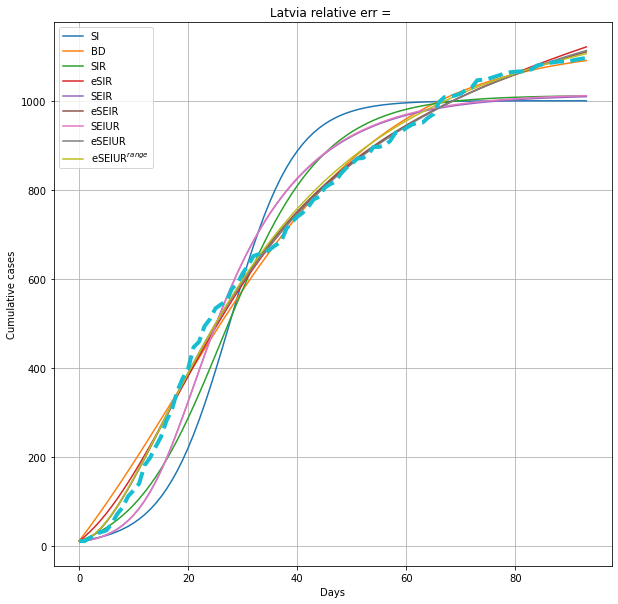

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Lebanon
minStart 11
Parameters
[0.03405318 0.         0.         0.06332229]
[2.10727864e-02 1.70787776e-05 0.00000000e+00 8.77150098e-02]
[0.10339777 0.07142875 0.         0.         0.09999989]
[1.76652610e-10 2.77564079e-01 1.02481647e-03 0.00000000e+00
 1.00000000e-01]
[0.01425986 0.22365294 0.07457324 0.14852855 0.         0.
 0.09520549]
[2.17053033e-02 1.21114892e-01 9.51210238e-02 7.80469338e-02
 2.50835600e-07 0.00000000e+00 9.37404822e-02]
[0.03549648 0.46211395 0.27310063 0.29891057 0.         0.
 1.         0.24406274 0.5824456 ]
[4.29067933e-02 2.15503659e-01 1.83659718e-01 1.26275638e-01
 1.42394754e-06 0.00000000e+00 1.00000000e+00 2.59797043e-01
 4.54068248e-01]
[1.01122663e-02 2.62305913e+00 3.82396227e-02 4.92261511e-01
 6.69905260e-06 0.00000000e+00 1.00000000e+00 1.50445423e-01
 1.16614290e-01]
ERRORS
[0.01059693 0.00133865 0.02088229 0.27958935 0.00776454 0.00777143
 0.00466076 0.00152081 0.00160474]
1


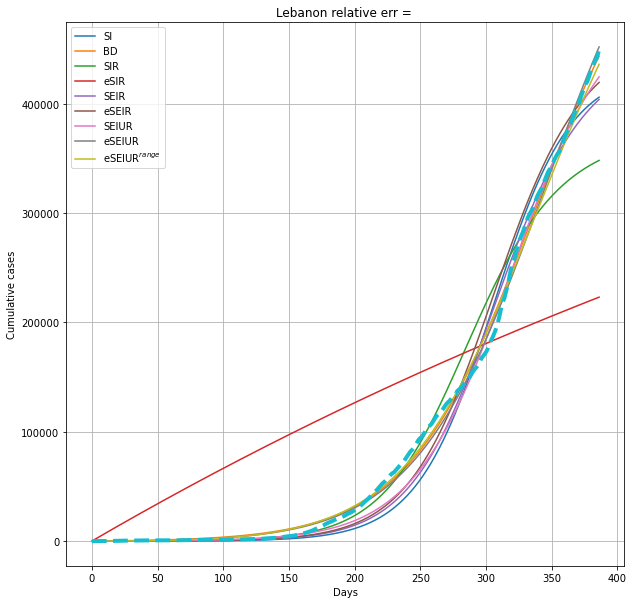

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Lesotho not S-curve
Liberia
minStart 21
Parameters
[0.05839363 0.         0.         0.00026127]
[0.04941097 0.00043    0.         0.00027034]
[0.13308267 0.08816553 0.         0.         0.0004682 ]
[0.08922929 0.08269429 0.000285   0.         0.0011222 ]
[0.01515486 0.28793382 0.16976286 0.19489946 0.         0.
 0.00043621]
[5.71013023e-02 1.64869991e-01 2.47900699e-01 1.30717094e-01
 9.73920877e-05 0.00000000e+00 4.55374056e-04]
[1.58874912e-02 2.64254051e+00 8.14350733e-02 7.94558071e-02
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.90256766e-04
 7.59994701e-02]
[2.64926181e-02 2.12634242e-01 1.38010592e-01 1.48921429e-01
 8.03673780e-04 0.00000000e+00 1.00000000e+00 5.74210151e-04
 6.80175183e-01]
[6.03337430e-02 3.36978859e+00 8.91859792e-02 2.59643148e-01
 4.11104175e-04 0.00000000e+00 1.00000000e+00 4.30091347e-04
 6.77931984e-02]
ERRORS
[0.00316616 0.00244349 0.0033099  0.00880437 0.00255712 0.00313305
 0.00370649 0.00596196 0.00351269]
1


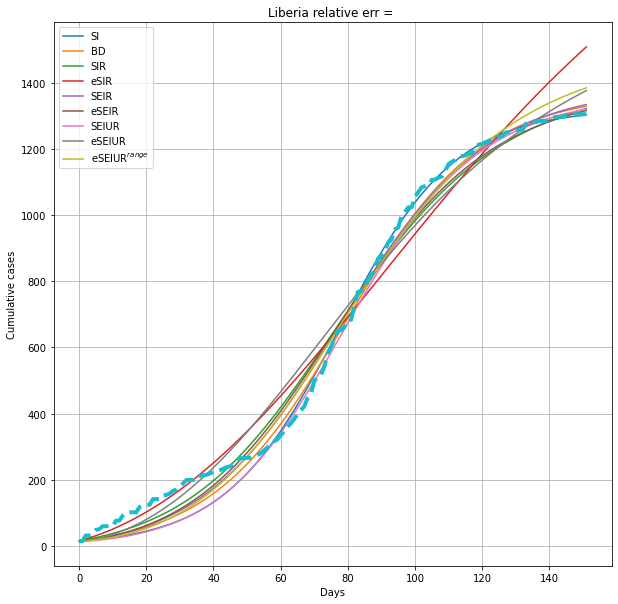

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Libya not S-curve
Liechtenstein less then 1m
Lithuania
minStart 18
Parameters
[0.17345855 0.         0.         0.00061193]
[0.02242335 0.01972127 0.         0.00068088]
[0.45911899 0.33327774 0.         0.         0.0012149 ]
[0.28099796 0.256851   0.00383474 0.         0.00099348]
[1.14062521e-04 2.56092260e+00 7.14285848e-02 3.33305501e-01
 0.00000000e+00 0.00000000e+00 6.12444104e-04]
[0.07132388 0.17116293 0.31562175 0.31847046 0.01509744 0.
 0.00075055]
[3.42924705e-04 2.64097501e+00 7.14301053e-02 3.32843365e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 6.05719551e-04
 9.51759240e-01]
[8.25149483e-02 1.73536020e-01 2.94768812e-01 2.86338066e-01
 1.57100640e-02 0.00000000e+00 1.00000000e+00 7.38591118e-04
 7.77426045e-01]
[2.19573262e-01 5.60172844e-02 3.57215451e-02 2.61526527e-01
 9.37005598e-02 0.00000000e+00 1.00000000e+00 6.66805270e-04
 6.13808655e-01]
ERRORS
[0.01370818 0.00098212 0.00604069 0.00019116 0.00494326 0.00015259
 0.00494332 0.00016387 0.00031129]
5


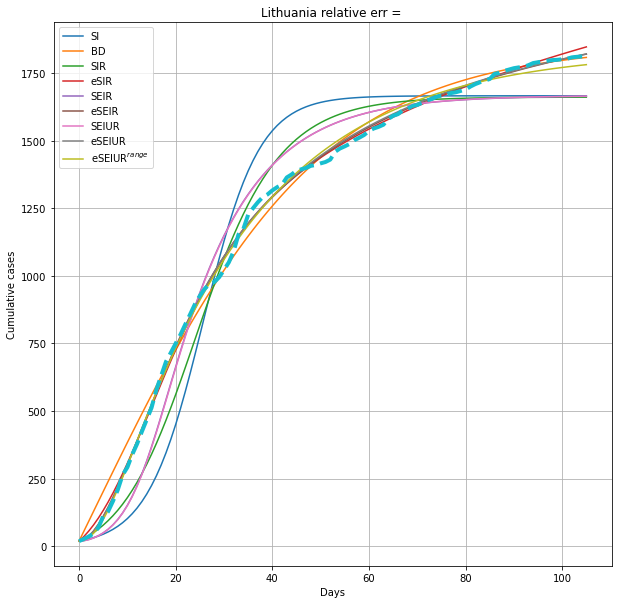

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Luxembourg less then 1m
Macao less then 1m
Madagascar not S-curve
Malawi not S-curve
Malaysia not S-curve
Maldives less then 1m
Mali
minStart 4
Parameters
[0.07816155 0.         0.         0.00012666]
[0.04379887 0.0022089  0.         0.00013506]
[0.23470923 0.17547236 0.         0.         0.00028406]
[1.12778312e-01 1.57632473e-01 1.59985295e-05 0.00000000e+00
 2.26089842e-02]
[2.88000446e-02 4.20900779e-01 2.78064768e-01 3.08262705e-01
 0.00000000e+00 0.00000000e+00 2.21563983e-04]
[0.01023904 0.14340033 0.0906519  0.13652462 0.00410671 0.
 0.00018502]
[2.84263957e-02 3.18556633e+00 3.16534882e-01 3.19003677e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.26201380e-04
 1.34076353e-01]
[2.64546553e-02 2.24958311e+00 7.87800846e-02 1.40048235e-01
 2.60217748e-03 0.00000000e+00 1.00000000e+00 1.89171407e-04
 6.86435811e-02]
[2.63389304e-03 4.70452960e+00 3.00982436e-01 2.76381784e-01
 4.30597285e-04 0.00000000e+00 1.00000000e+00 2.98326062e-04
 6.98197026e-02]
ERRORS
[0.00887385 0.

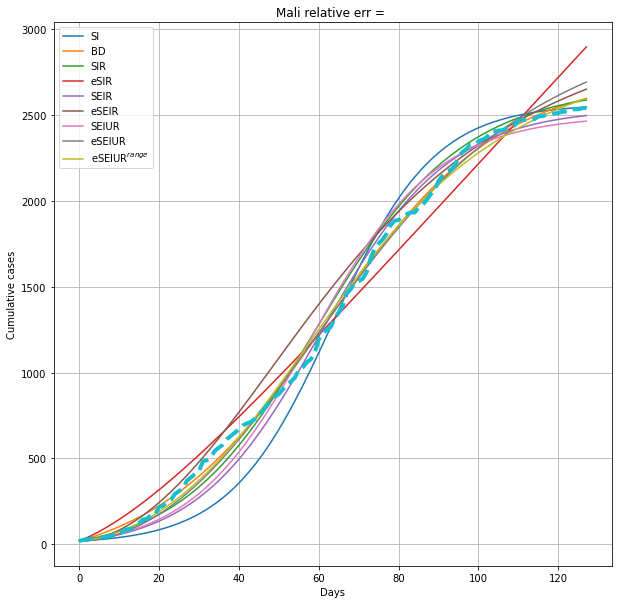

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Malta less then 1m
Marshall Islands less then 1m
Mauritania
minStart 62
Parameters
[0.13073965 0.         0.         0.00147258]
[0.0637906  0.00369476 0.         0.00154526]
[0.42734128 0.33317557 0.         0.         0.00371221]
[0.19764786 0.13272451 0.00084545 0.         0.00235676]
[6.15695370e-06 1.44952826e+00 7.14291970e-02 3.33328068e-01
 0.00000000e+00 0.00000000e+00 1.54182854e-03]
[0.0721018  0.26217547 0.18188503 0.24426036 0.00250028 0.
 0.00207505]
[6.21764897e-03 3.01140623e+00 7.14439980e-02 3.31269385e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.54204323e-03
 4.57739191e-01]
[0.04533547 1.58601866 0.16588275 0.2183793  0.00312838 0.
 1.         0.00202942 0.16229519]
[0.20174098 0.97774336 0.03627079 0.42451154 0.00293476 0.
 1.         0.00161218 0.35755422]
ERRORS
[0.00664121 0.00155796 0.00234285 0.00058776 0.00241994 0.00042623
 0.00246182 0.00052487 0.00044839]
5


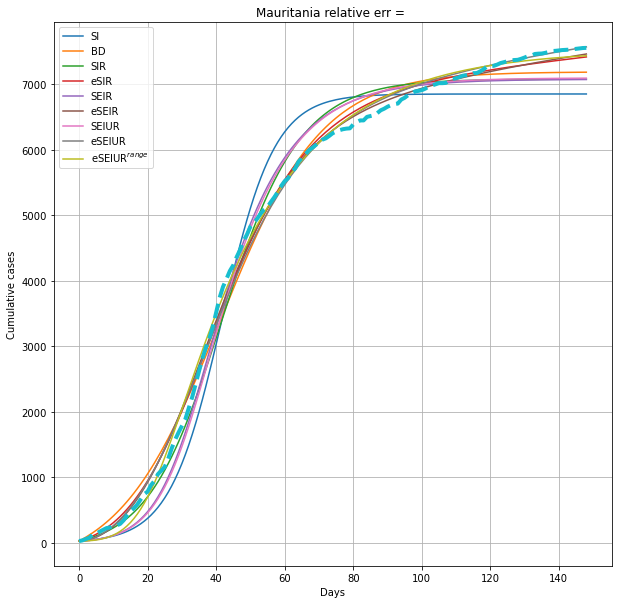

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Mauritius
minStart 4
Parameters
[0.21998033 0.         0.         0.00027816]
[0.1651104  0.01285022 0.         0.00027865]
[0.28224138 0.07338216 0.         0.         0.00028576]
[4.65152219e-01 3.31770629e-01 9.18612226e-04 0.00000000e+00
 4.19486163e-04]
[8.46355157e-03 2.21690391e+00 1.07092673e-01 1.95700646e-01
 0.00000000e+00 0.00000000e+00 2.79653041e-04]
[9.72245477e-02 6.50700240e-01 3.32907191e-01 3.32766458e-01
 6.76878945e-03 0.00000000e+00 2.96065170e-04]
[7.77568534e-03 3.32793166e+00 1.16070294e-01 2.08072212e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.58197481e-04
 5.14876497e-01]
[6.33859984e-02 8.07263221e-01 3.32199972e-01 3.30991849e-01
 5.77439594e-03 0.00000000e+00 1.00000000e+00 2.74711555e-04
 7.98802452e-01]
[4.84626523e-01 4.97006014e-01 4.96840235e-01 4.70537124e-01
 2.73177537e-03 0.00000000e+00 1.00000000e+00 3.10253994e-04
 6.64378196e-01]
ERRORS
[0.0058408  0.0057807  0.0055911  0.00296546 0.00570863 0.00401268
 0.00572286 0.00406937 0.00297028]

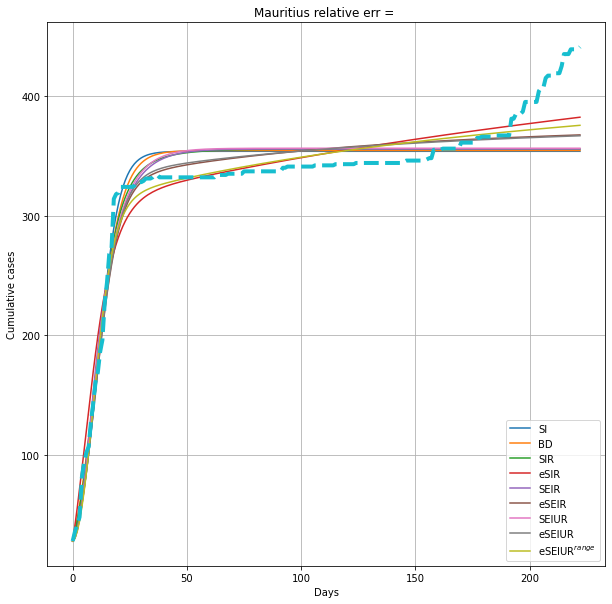

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Mexico not S-curve
Micronesia (country) less then 1m
Moldova not S-curve
Monaco less then 1m
Mongolia not S-curve
Montenegro less then 1m
Montserrat less then 1m
Morocco not S-curve
Mozambique not S-curve
Myanmar not S-curve
Namibia not S-curve
Nepal not S-curve
Netherlands
minStart 7
Parameters
[0.19369402 0.         0.         0.00275428]
[0.07164635 0.00336573 0.         0.00290819]
[0.515293   0.33333285 0.         0.         0.00410923]
[0.19747755 0.09957842 0.00085336 0.         0.00341768]
[0.09976685 1.85241627 0.0714291  0.33328283 0.         0.
 0.00263259]
[0.06512923 0.52666037 0.07445209 0.20479909 0.00413337 0.
 0.00281753]
[9.63213676e-02 3.30243692e+00 7.14737882e-02 3.33194686e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.62476212e-03
 5.66373638e-01]
[0.01023183 1.35425782 0.08429012 0.25290729 0.00344761 0.
 1.         0.00277945 0.62113862]
[0.21053281 1.32201652 0.06320664 0.29551612 0.00205917 0.
 1.         0.00285041 0.08590794]
ERRORS
[0.02143553 0.00292

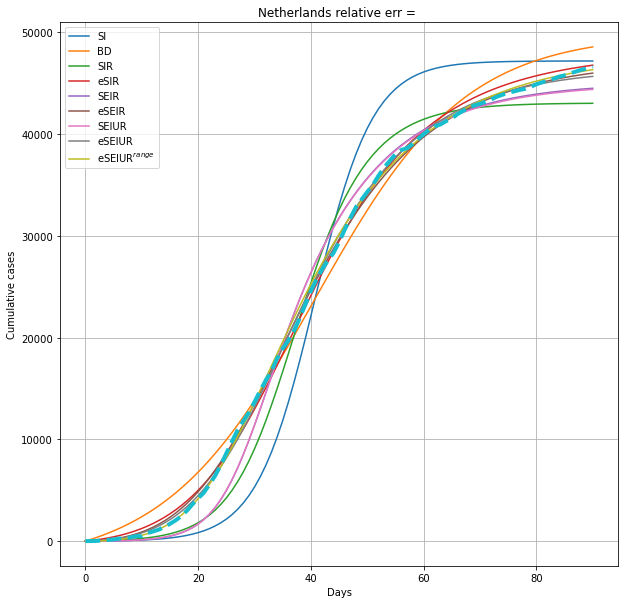

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


New Zealand
minStart 20
Parameters
[0.29352519 0.         0.         0.00030109]
[0.18985981 0.01110758 0.         0.00030698]
[5.71285717e-01 3.32845632e-01 0.00000000e+00 0.00000000e+00
 4.38701497e-04]
[0.30762371 0.07998848 0.00455798 0.         0.00031687]
[1.90461374e-04 2.91232924e+00 1.27283840e-01 3.33254318e-01
 0.00000000e+00 0.00000000e+00 3.11912913e-04]
[2.82904580e-02 6.71795445e-01 2.23956929e-01 2.25106902e-01
 2.84607743e-02 0.00000000e+00 3.13642063e-04]
[1.63527631e-03 2.98276855e+00 1.27002821e-01 3.32551564e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 3.06166586e-04
 9.58193907e-01]
[1.06501039e-02 2.93667177e+00 2.83913695e-01 1.51904021e-01
 2.93985751e-02 0.00000000e+00 1.00000000e+00 3.07839685e-04
 1.49045968e-01]
[2.79570210e-02 3.65932998e+00 1.93840657e-01 2.43235955e-01
 3.43486060e-02 0.00000000e+00 1.00000000e+00 3.06984455e-04
 1.98847401e-01]
ERRORS
[1.48006284e-03 1.91323513e-04 9.73470682e-05 6.38400206e-05
 1.72106844e-04 5.85911526e-05 1.7234

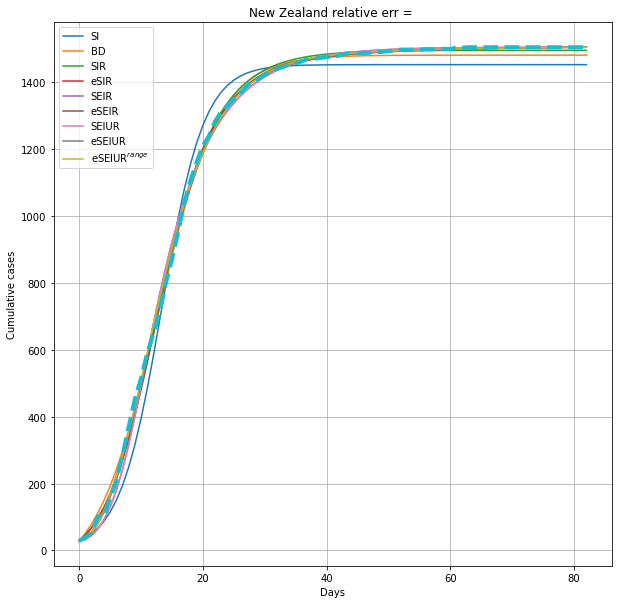

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Nicaragua not S-curve
Niger not S-curve
Nigeria not S-curve
North America not S-curve
North Macedonia not S-curve
Northern Cyprus less then 1m
Norway
minStart 7
Parameters
[0.20831693 0.         0.         0.00150848]
[0.07921466 0.0070838  0.         0.00157666]
[0.52064784 0.33333039 0.         0.         0.00227295]
[0.22053111 0.1035649  0.00197656 0.         0.0017444 ]
[2.77289089e-04 2.98115563e+00 7.14293431e-02 3.33331704e-01
 0.00000000e+00 0.00000000e+00 1.48982581e-03]
[0.02767724 0.98519034 0.07622017 0.26379438 0.01200832 0.
 0.00153106]
[2.75960775e-03 3.48237176e+00 7.14285986e-02 3.32881897e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.48624859e-03
 8.47333394e-01]
[9.45640144e-04 1.47623829e+00 8.28921092e-02 1.82897111e-01
 1.54299995e-02 0.00000000e+00 1.00000000e+00 1.51282863e-03
 4.69143541e-01]
[0.25646845 0.01268476 0.14874405 0.28020857 0.00456482 0.
 1.         0.00181915 0.33715195]
ERRORS
[0.01512372 0.00192003 0.00351333 0.00040324 0.00141889 0.00029

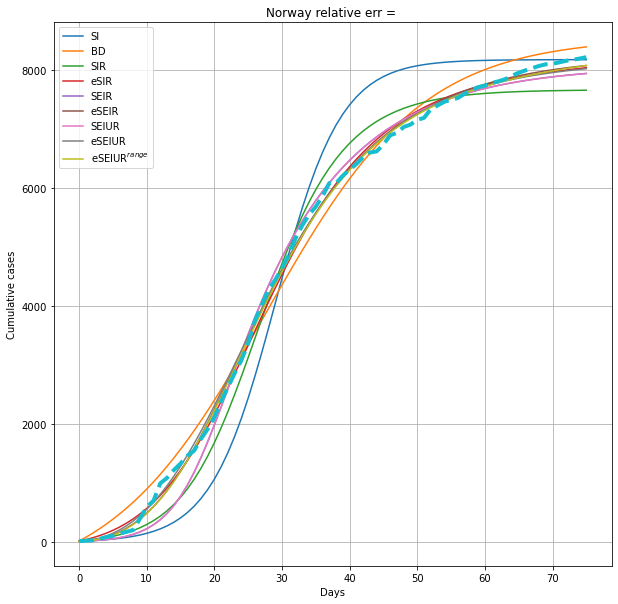

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Oceania not S-curve
Oman
minStart 10
Parameters
[0.07272513 0.         0.         0.0170399 ]
[6.05419903e-02 3.42219802e-05 0.00000000e+00 1.75338660e-02]
[0.1942317  0.13002913 0.         0.         0.03086914]
[2.09494277e-01 1.55275640e-01 4.77157031e-06 0.00000000e+00
 4.09644715e-02]
[0.00784681 0.45743195 0.22821427 0.29894107 0.         0.
 0.02782394]
[5.04154284e-04 2.19384544e-01 2.07353280e-01 9.90533285e-02
 4.14305710e-06 0.00000000e+00 2.06288420e-02]
[0.07088606 3.32980828 0.26129088 0.22307949 0.         0.
 1.         0.02822393 0.05943104]
[7.23474060e-03 1.67474103e+00 7.15789973e-02 2.13788319e-01
 1.66111397e-05 0.00000000e+00 1.00000000e+00 2.04314431e-02
 2.88075292e-01]
[3.51376234e-02 7.79147903e-01 2.01526672e-01 5.97445367e-02
 3.93760708e-06 0.00000000e+00 1.00000000e+00 1.92848649e-02
 1.77851167e-01]
ERRORS
[0.00146213 0.00061737 0.00085032 0.00259907 0.00068529 0.00077292
 0.00073361 0.00112146 0.0009432 ]
1


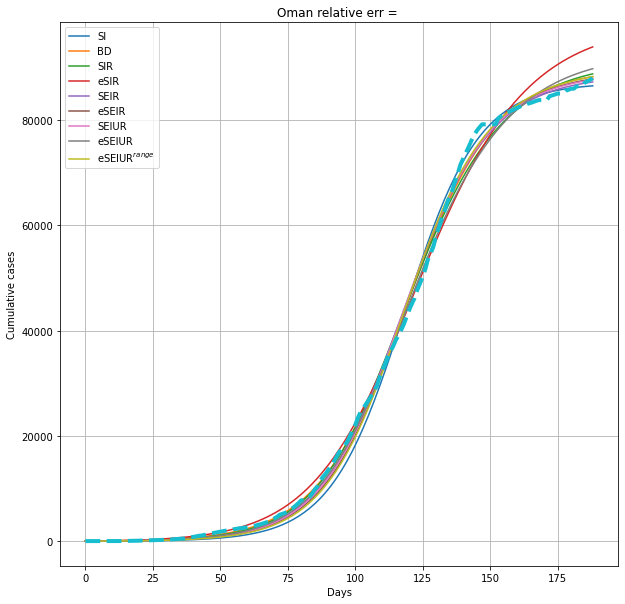

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Pakistan
minStart 15
Parameters
[0.0986255  0.         0.         0.00134836]
[0.05423592 0.00023911 0.         0.00141619]
[0.41788045 0.33332396 0.         0.         0.00347185]
[1.69791076e-01 1.18262736e-01 7.58212404e-05 0.00000000e+00
 2.54689711e-03]
[0.00302842 1.01803781 0.07271461 0.32358057 0.         0.
 0.00137847]
[9.61697524e-03 3.32280853e-01 9.98832599e-02 1.13659838e-01
 5.34130279e-05 0.00000000e+00 1.39919712e-03]
[6.04483182e-02 1.78117072e+00 7.28962320e-02 3.01549673e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.39643608e-03
 3.79631104e-01]
[2.69655965e-02 1.26342184e+00 1.79730224e-01 1.13040079e-01
 2.81044819e-05 0.00000000e+00 1.00000000e+00 1.49232122e-03
 2.01730741e-01]
[1.15554965e-01 2.86994440e+00 1.14269826e-01 2.14785648e-01
 4.33316303e-05 0.00000000e+00 1.00000000e+00 1.74091636e-03
 6.38806624e-02]
ERRORS
[0.0082823  0.00151262 0.00173312 0.00659413 0.00238432 0.00110752
 0.00260682 0.00212125 0.00068112]
8


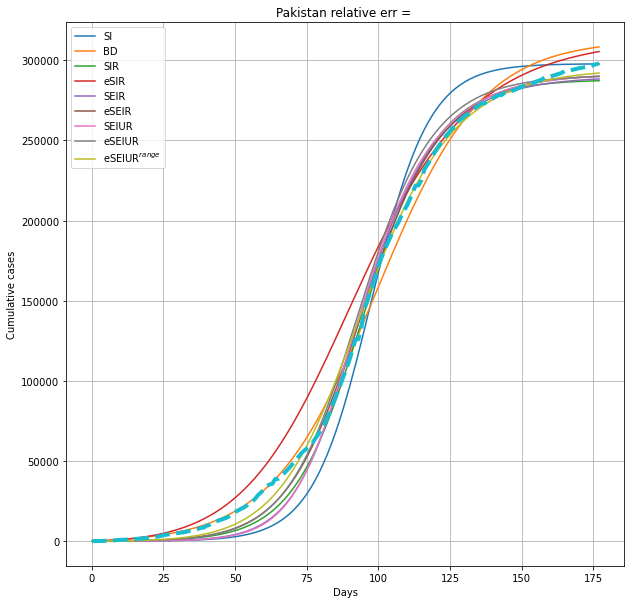

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Palestine not S-curve
Panama not S-curve
Papua New Guinea not S-curve
Paraguay not S-curve
Peru not S-curve
Philippines not S-curve
Poland not S-curve
Portugal not S-curve
Qatar not S-curve
Romania not S-curve
Russia not S-curve
Rwanda not S-curve
Saint Helena less then 1m
Saint Kitts and Nevis less then 1m
Saint Lucia less then 1m
Saint Vincent and the Grenadines less then 1m
Samoa less then 1m
San Marino less then 1m
Sao Tome and Principe less then 1m
Saudi Arabia
minStart 8
Parameters
[0.09047053 0.         0.         0.00952136]
[0.03792768 0.00056984 0.         0.01008647]
[0.40963099 0.33333315 0.         0.         0.02700217]
[1.19463757e-01 7.77755124e-02 9.25576558e-05 0.00000000e+00
 1.60329812e-02]
[0.00209157 0.97335586 0.07142901 0.33306445 0.         0.
 0.01003324]
[0.05250284 0.10843351 0.07208271 0.08334215 0.00034947 0.
 0.01212953]
[0.07312122 1.40276299 0.07155064 0.32319314 0.         0.
 1.         0.01012243 0.4115194 ]
[2.26438869e-02 8.71678147e-01 1.41608030e

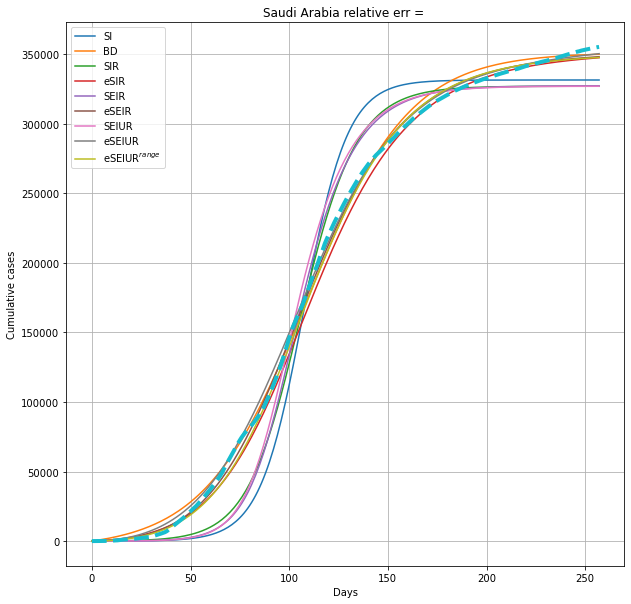

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Senegal not S-curve
Serbia
minStart 16
Parameters
[0.15819202 0.         0.         0.00165888]
[0.09697288 0.00226152 0.         0.00172683]
[0.43868275 0.30866008 0.         0.         0.00309878]
[0.23881105 0.12231465 0.00043342 0.         0.00213025]
[5.04940390e-04 1.84104274e+00 7.15033080e-02 3.28532588e-01
 0.00000000e+00 0.00000000e+00 1.70194226e-03]
[0.02060298 0.88006168 0.07227672 0.17312758 0.00261787 0.
 0.00171606]
[1.25703884e-04 3.21381161e+00 7.17858560e-02 3.11061459e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.68720624e-03
 5.51727152e-01]
[8.86288901e-02 1.83769713e+00 1.13214070e-01 2.44063731e-01
 1.84369643e-03 0.00000000e+00 1.00000000e+00 1.74302679e-03
 2.89449241e-01]
[1.55819005e-01 5.77355014e+00 7.00647501e-02 1.09133902e-01
 1.27883971e-03 0.00000000e+00 1.00000000e+00 1.69587267e-03
 7.04910737e-02]
ERRORS
[0.00524304 0.00159847 0.00049015 0.00045942 0.00023619 0.00019303
 0.00025946 0.00030366 0.00021168]
5


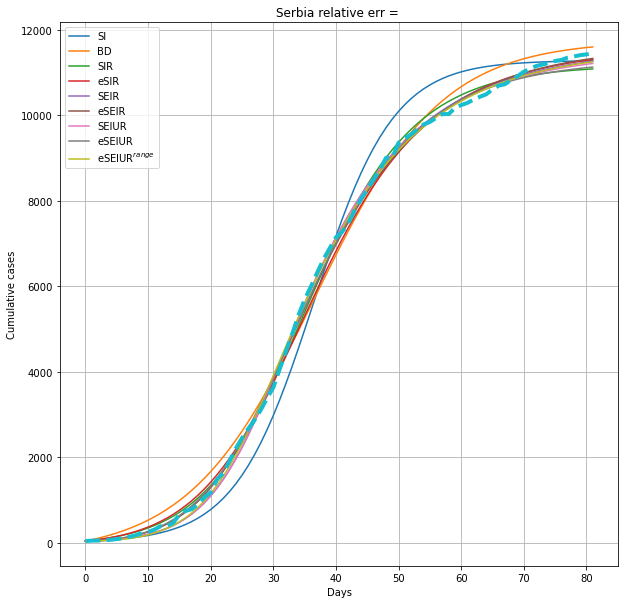

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Seychelles less then 1m
Sierra Leone not S-curve
Singapore
minStart 9
Parameters
[0.07971496 0.         0.         0.00761963]
[6.93863652e-02 4.14966908e-05 0.00000000e+00 7.76558303e-03]
[0.38986395 0.33333106 0.         0.         0.03396468]
[1.71057391e-01 1.30394412e-01 3.87953451e-05 0.00000000e+00
 2.14231217e-02]
[0.00276274 0.80940011 0.0715979  0.33311023 0.         0.
 0.01043967]
[0.06279086 0.1413661  0.07758439 0.13939815 0.00019565 0.
 0.01282724]
[0.0673288  3.66169938 0.08061833 0.31387093 0.         0.
 1.         0.01098479 0.111586  ]
[6.55313096e-02 2.93218379e+00 8.18455979e-02 2.39788161e-01
 1.24635554e-04 0.00000000e+00 1.00000000e+00 1.34325367e-02
 6.39177852e-02]
[8.87338563e-02 7.95561274e-01 3.68730963e-02 8.32249362e-02
 1.27664715e-04 0.00000000e+00 1.00000000e+00 1.02819694e-02
 7.38416348e-02]
ERRORS
[0.02961092 0.02549721 0.00495842 0.00355513 0.00560059 0.00304396
 0.00635515 0.00304823 0.0021896 ]
8


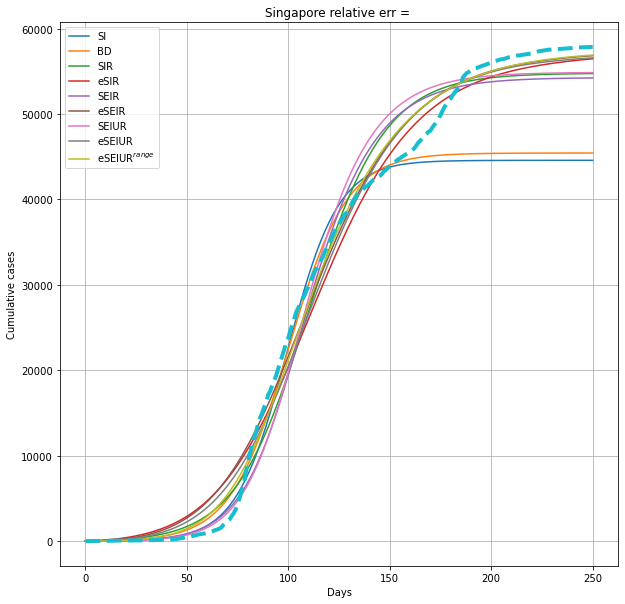

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Slovakia
minStart 6
Parameters
[0.1530393 0.        0.        0.0002717]
[0.11018708 0.00299587 0.         0.00027849]
[0.38005756 0.26414917 0.         0.         0.00051675]
[3.30244510e-01 2.08001505e-01 1.95733581e-05 0.00000000e+00
 4.46013230e-04]
[3.77522677e-02 6.16545938e-01 3.25907162e-01 3.26425821e-01
 0.00000000e+00 0.00000000e+00 3.41963611e-04]
[0.02962748 0.26315072 0.15261178 0.07400878 0.00668262 0.
 0.00028788]
[2.42751877e-02 1.17927020e+00 2.85166076e-01 3.12345041e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 3.31425274e-04
 5.34772639e-01]
[4.36041198e-02 2.47997803e+00 2.23520431e-01 1.71332343e-01
 2.28837081e-03 0.00000000e+00 1.00000000e+00 3.02211535e-04
 1.56886782e-01]
[1.65212517e-02 2.80143423e+00 1.21213653e-01 9.21214851e-02
 7.24943381e-03 0.00000000e+00 1.00000000e+00 2.81576035e-04
 1.23033670e-01]
ERRORS
[0.00305771 0.00125624 0.00150855 0.00164126 0.00206038 0.0017215
 0.00213829 0.00185219 0.00190929]
1


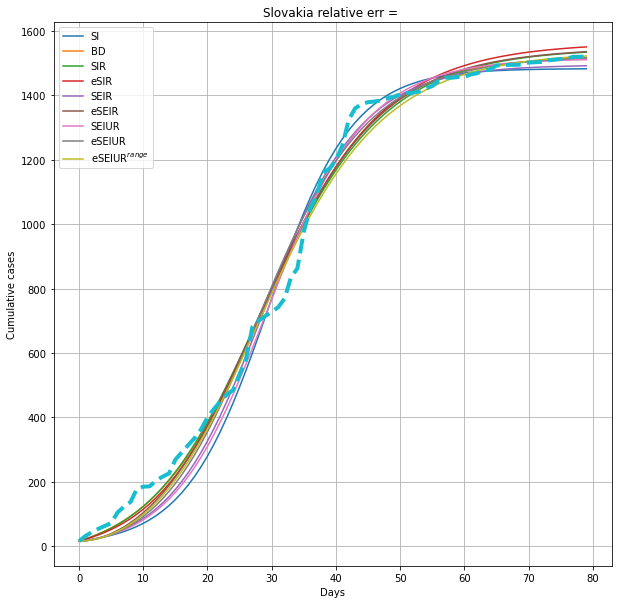

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Slovenia
minStart 35
Parameters
[0.20690627 0.         0.         0.00066771]
[0.09104843 0.01130177 0.         0.00071033]
[0.49063215 0.33333303 0.         0.         0.00120984]
[0.16780695 0.07233919 0.00687662 0.         0.00077195]
[7.95236770e-05 3.11887317e+00 7.14290146e-02 3.33287335e-01
 0.00000000e+00 0.00000000e+00 7.13629980e-04]
[0.02694418 0.13684281 0.18157505 0.09091952 0.02565497 0.
 0.00074765]
[7.99497912e-04 3.34432117e+00 7.14311903e-02 3.33286852e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 7.06524267e-04
 9.18651117e-01]
[1.96140681e-03 3.83390118e+00 1.86331919e-01 1.13809618e-01
 2.66570935e-02 0.00000000e+00 1.00000000e+00 7.40959520e-04
 4.29899035e-02]
[2.17608431e-02 3.98419474e+00 1.01072609e-01 4.70261284e-02
 4.48244182e-02 0.00000000e+00 1.00000000e+00 7.02874991e-04
 3.62205319e-02]
ERRORS
[0.00654624 0.00014112 0.00162841 0.00027214 0.00146182 0.00037251
 0.00146186 0.00037443 0.00039391]
1


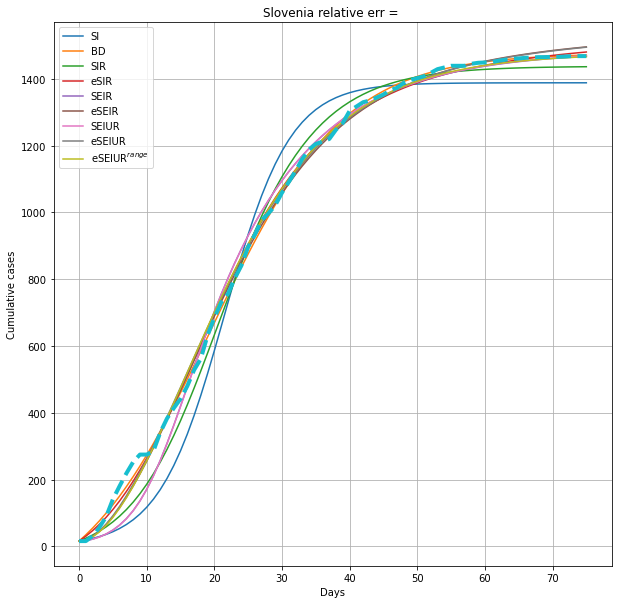

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Solomon Islands less then 1m
Somalia
minStart 27
Parameters
[0.12079622 0.         0.         0.00018662]
[0.04599997 0.00662123 0.         0.00020621]
[0.41101464 0.33297026 0.         0.         0.00054446]
[0.11594081 0.08018368 0.00281979 0.         0.00027543]
[1.70344680e-04 1.34437055e+00 7.16088215e-02 3.32174668e-01
 0.00000000e+00 0.00000000e+00 1.98599099e-04]
[0.01430807 0.08077106 0.11222149 0.07767626 0.01193219 0.
 0.00023087]
[2.37741924e-02 3.01788319e+00 7.21093778e-02 3.22165158e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.95777655e-04
 3.90257749e-01]
[1.73413869e-05 1.73089152e+00 7.81337404e-02 1.17141265e-01
 1.72979524e-02 0.00000000e+00 1.00000000e+00 2.21456109e-04
 6.26022336e-02]
[6.24108154e-03 6.00292182e+00 4.16328217e-02 4.14151019e-01
 2.98706199e-02 0.00000000e+00 1.00000000e+00 2.14827849e-04
 6.34476863e-02]
ERRORS
[0.01097075 0.0002327  0.00233211 0.00044017 0.00546605 0.00053304
 0.00572374 0.00054245 0.00058517]
1


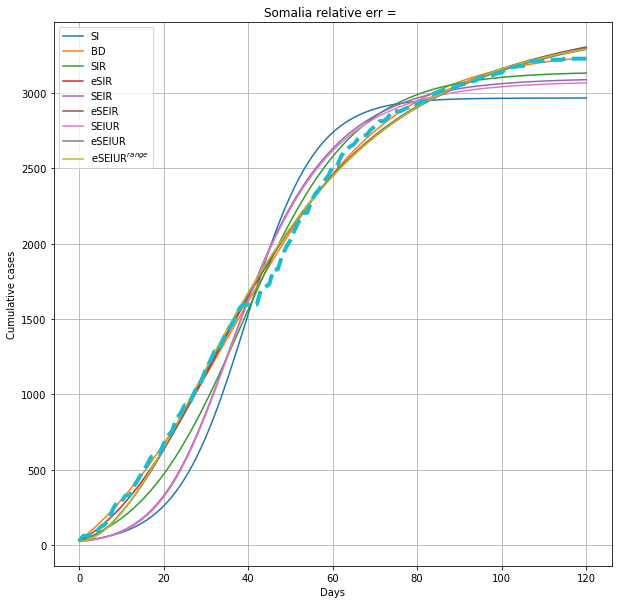

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


South Africa
minStart 34
Parameters
[0.08263321 0.         0.         0.01155124]
[5.94092964e-02 2.54924814e-05 0.00000000e+00 1.18897945e-02]
[0.34078938 0.26881665 0.         0.         0.02888565]
[1.73216385e-01 1.16417821e-01 6.61288178e-06 0.00000000e+00
 2.18139373e-02]
[0.01976887 0.46945853 0.31194012 0.31994834 0.         0.
 0.01831999]
[5.22824251e-03 4.28555614e-01 8.86908793e-02 1.67230958e-01
 5.58518842e-06 0.00000000e+00 1.27326016e-02]
[1.92323297e-04 2.73581500e+00 9.56667899e-02 3.30625842e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 1.30771926e-02
 2.70248295e-01]
[7.07445605e-03 1.56808671e+00 1.27733458e-01 8.24328378e-02
 8.25977192e-06 0.00000000e+00 1.00000000e+00 1.17321727e-02
 1.41272894e-01]
[8.34079771e-02 3.66586620e+00 1.00261636e-01 4.81796921e-02
 5.31114635e-06 0.00000000e+00 1.00000000e+00 1.21013363e-02
 2.01342313e-02]
ERRORS
[0.0039266  0.00159655 0.00027233 0.00366016 0.00044523 0.00050009
 0.00046783 0.00164905 0.00042271]
2


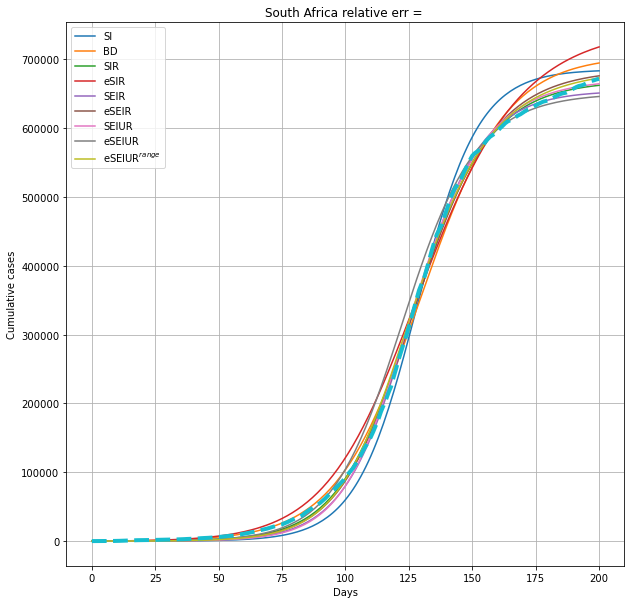

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


South America not S-curve
South Korea
minStart 12
Parameters
[2.08768851e-01 0.00000000e+00 0.00000000e+00 1.92626933e-04]
[1.95725792e-01 1.49093719e-04 0.00000000e+00 1.93185287e-04]
[2.98585208e-01 1.00658536e-01 0.00000000e+00 0.00000000e+00
 2.16567598e-04]
[3.16024093e-01 1.43090002e-01 7.03741324e-05 0.00000000e+00
 2.49192216e-04]
[1.77199987e-03 1.27174051e+00 7.84115157e-02 7.16278222e-02
 0.00000000e+00 0.00000000e+00 2.08843354e-04]
[6.61297358e-03 1.29171827e+00 7.77486991e-02 7.79009137e-02
 1.63954362e-05 0.00000000e+00 2.08436049e-04]
[1.29707881e-02 1.65708661e+00 7.75904404e-02 7.29058028e-02
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.08808897e-04
 7.52514452e-01]
[3.83205160e-03 1.85627405e+00 7.72258070e-02 1.50250523e-01
 1.04393174e-05 0.00000000e+00 1.00000000e+00 2.08080314e-04
 8.52372798e-01]
[4.88633511e-01 8.74739490e+00 7.44616626e-02 4.41310665e-01
 7.23234545e-07 0.00000000e+00 1.00000000e+00 2.10490439e-04
 6.68175009e-03]
ERRORS
[0.00553989 0.00537

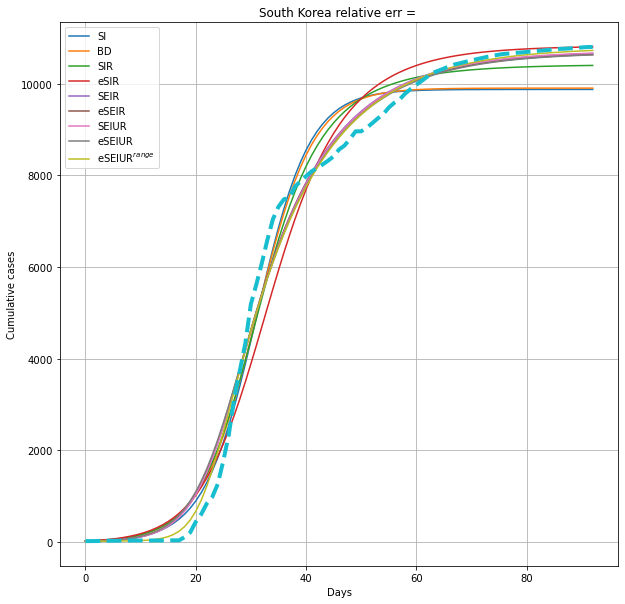

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


South Sudan
minStart 25
Parameters
[0.12681686 0.         0.         0.00018402]
[0.10286915 0.0018827  0.         0.00018855]
[0.23601504 0.13522227 0.         0.         0.00026976]
[0.16869992 0.08165198 0.0015456  0.         0.00022777]
[6.61603527e-03 6.46860131e-01 1.78331177e-01 2.76027096e-01
 0.00000000e+00 0.00000000e+00 2.12507306e-04]
[3.54559451e-02 2.75275887e-01 1.30819345e-01 7.26812379e-02
 4.17219462e-03 0.00000000e+00 1.91263355e-04]
[2.95933764e-02 3.05002091e+00 2.42032132e-01 2.98910314e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 2.32536186e-04
 1.80495053e-01]
[2.22734671e-02 2.17534901e+00 2.17107423e-01 2.09797018e-01
 7.46864543e-04 0.00000000e+00 1.00000000e+00 2.17295591e-04
 2.00499263e-01]
[8.42226534e-02 3.98724591e+00 1.16516116e-01 2.97058697e-01
 1.78700415e-03 0.00000000e+00 1.00000000e+00 2.09325426e-04
 1.31405257e-01]
ERRORS
[0.00473432 0.00414764 0.00510018 0.00629002 0.00413033 0.00410577
 0.00412073 0.00414156 0.00430295]
5


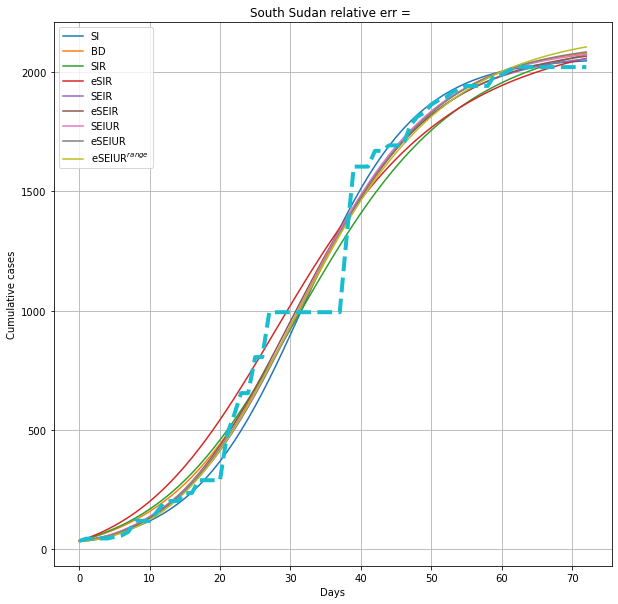

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Spain
minStart 27
Parameters
[0.24544842 0.         0.         0.004989  ]
[0.10149943 0.00221595 0.         0.0051829 ]
[0.56909764 0.33333304 0.         0.         0.00666088]
[0.24794647 0.10314843 0.00052099 0.         0.00555944]
[0.09998654 2.61379649 0.0714289  0.33332552 0.         0.
 0.00495161]
[8.85608793e-02 1.54227891e+00 7.28578674e-02 3.25296377e-01
 9.53220846e-04 0.00000000e+00 5.03502245e-03]
[0.09783206 2.99841635 0.07144302 0.33211534 0.         0.
 1.         0.00495408 0.87484312]
[9.22433431e-02 3.82582352e+00 7.25958215e-02 1.55217162e-01
 1.22673230e-03 0.00000000e+00 1.00000000e+00 4.97086901e-03
 2.63398487e-01]
[2.34645159e-01 4.41537827e+00 6.79709347e-02 1.22964754e-01
 4.57748306e-04 0.00000000e+00 1.00000000e+00 5.03266525e-03
 1.22233490e-01]
ERRORS
[0.01707466 0.00326379 0.00522853 0.00064225 0.00068941 0.00021873
 0.00068951 0.00036441 0.00022276]
5


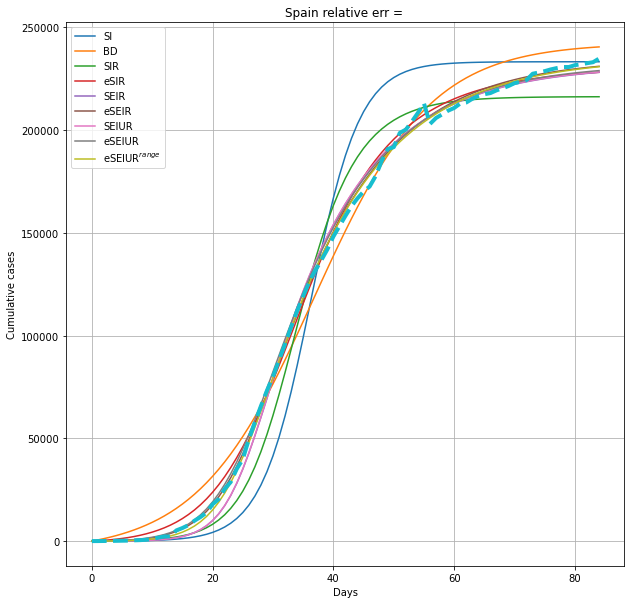

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Sri Lanka not S-curve
Sudan not S-curve
Suriname less then 1m
Sweden not S-curve
Switzerland
minStart 23
Parameters
[0.25170155 0.         0.         0.00330929]
[0.13845471 0.00203452 0.         0.0034656 ]
[0.56914153 0.33333313 0.         0.         0.00452273]
[0.34403019 0.18219545 0.00049714 0.         0.00438083]
[0.09743238 2.74925563 0.07144526 0.33325601 0.         0.
 0.0035763 ]
[0.09187694 1.49655856 0.08277655 0.31139898 0.00188455 0.
 0.00354091]
[0.08392277 3.55260506 0.07145589 0.33236936 0.         0.
 1.         0.00356788 0.80061204]
[0.02371541 2.0429556  0.07779992 0.09854563 0.00240108 0.
 1.         0.00349062 0.62198771]
[2.43025643e-01 1.37437934e+00 8.46503708e-02 3.10764194e-01
 9.83574069e-04 0.00000000e+00 1.00000000e+00 3.45906280e-03
 6.04098778e-01]
ERRORS
[0.01307937 0.00174213 0.00284075 0.00063898 0.00039895 0.00017701
 0.00040076 0.00032726 0.00039949]
5


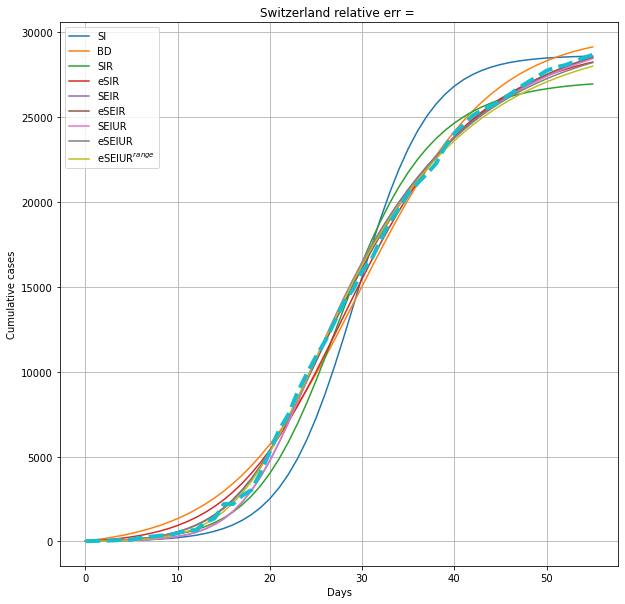

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Syria not S-curve
Taiwan not S-curve
Tajikistan not S-curve
Tanzania not S-curve
Thailand
minStart 26
Parameters
[8.47540746e-02 0.00000000e+00 0.00000000e+00 4.94613250e-05]
[8.75758001e-02 6.92798852e-06 0.00000000e+00 4.55598609e-05]
[1.53393882e-01 7.23250852e-02 0.00000000e+00 0.00000000e+00
 5.71347264e-05]
[1.67437158e-01 1.00417504e-01 5.15596784e-06 0.00000000e+00
 7.18573250e-05]
[9.32570364e-02 1.84307598e-01 1.02720757e-01 7.55844870e-02
 0.00000000e+00 0.00000000e+00 4.81146713e-05]
[2.73809448e-02 2.44174346e-01 1.69725177e-01 1.02169249e-01
 6.41299245e-06 0.00000000e+00 4.06806714e-05]
[5.31539530e-03 2.20683692e+00 1.36736105e-01 8.67193601e-02
 0.00000000e+00 0.00000000e+00 1.00000000e+00 4.75674328e-05
 1.25229419e-01]
[4.41788713e-02 4.92345406e-01 9.20560773e-02 9.55857124e-02
 4.82646840e-06 0.00000000e+00 1.00000000e+00 4.71623378e-05
 5.94569847e-01]
[3.33531616e-01 3.55026381e-02 1.07914939e-01 1.36825085e-01
 3.76664401e-08 0.00000000e+00 1.00000000e+00 4.6220

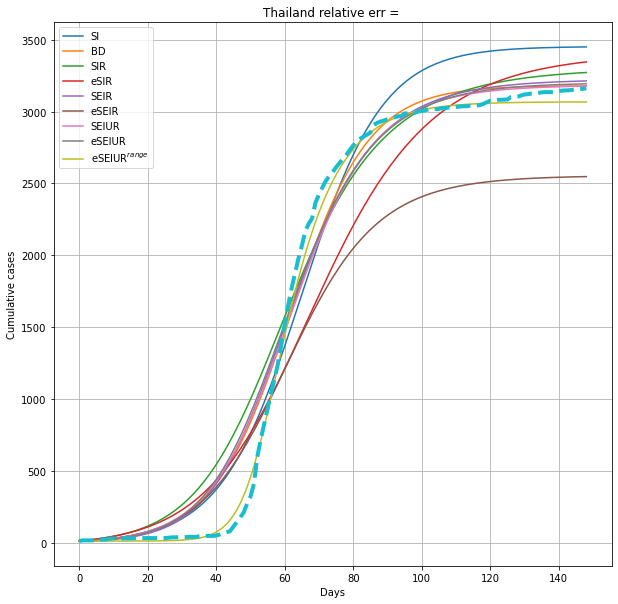

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Timor not S-curve
Togo not S-curve
Trinidad and Tobago not S-curve
Tunisia
minStart 11
Parameters
[1.91951118e-01 0.00000000e+00 0.00000000e+00 8.43720848e-05]
[1.04844202e-01 9.30532880e-03 0.00000000e+00 8.83922723e-05]
[4.65866791e-01 3.31218158e-01 0.00000000e+00 0.00000000e+00
 1.65593947e-04]
[2.44519389e-01 1.27197662e-01 2.69308745e-03 0.00000000e+00
 1.08318900e-04]
[1.02090142e-03 2.77332346e+00 7.14312460e-02 3.33327924e-01
 0.00000000e+00 0.00000000e+00 9.03517193e-05]
[4.53733193e-02 1.15383709e+00 7.39107202e-02 3.00266229e-01
 2.85500337e-02 0.00000000e+00 9.09196335e-05]
[3.73981782e-02 3.87722417e+00 7.15932794e-02 3.29137571e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 8.88292087e-05
 6.42999178e-01]
[9.96112223e-02 3.02633877e+00 8.68131271e-02 3.03115104e-01
 3.18772927e-02 0.00000000e+00 1.00000000e+00 9.02913057e-05
 1.41388670e-01]
[2.54239188e-01 2.88426604e+00 6.64054093e-02 2.13134615e-01
 2.45751603e-02 0.00000000e+00 1.00000000e+00 9.04301032e-05
 9.309

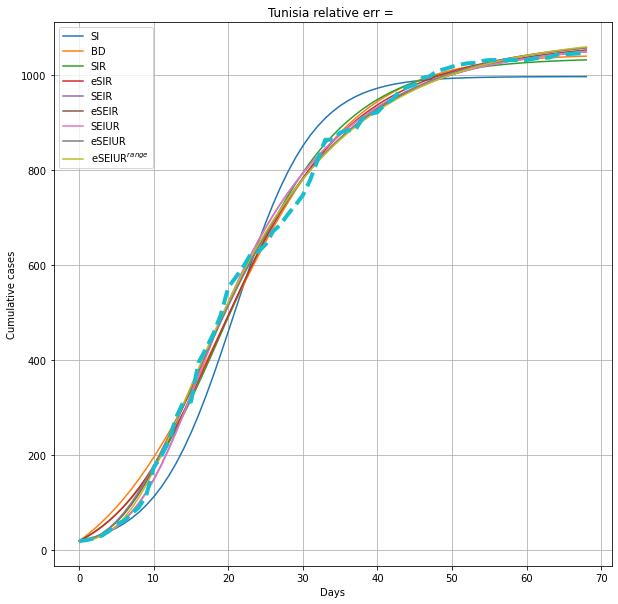

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Turkey not S-curve
Turks and Caicos Islands less then 1m
Uganda not S-curve
Ukraine not S-curve
United Arab Emirates not S-curve
United Kingdom
minStart 5
Parameters
[0.13157498 0.         0.         0.00417286]
[0.06146631 0.00041248 0.         0.00441615]
[0.45315891 0.33331683 0.         0.         0.00812985]
[2.11843399e-01 1.20745321e-01 2.83943137e-05 0.00000000e+00
 5.70081462e-03]
[0.09693322 0.86189135 0.07143062 0.33319954 0.         0.
 0.00406321]
[5.04427653e-02 5.44250313e-01 8.29662748e-02 2.59397670e-01
 1.33903502e-04 0.00000000e+00 4.47899441e-03]
[0.0757084  1.79488742 0.07155104 0.31361802 0.         0.
 1.         0.00402953 0.52516972]
[1.12094457e-02 1.04440720e+00 7.19834202e-02 1.08527165e-01
 3.33694250e-04 0.00000000e+00 1.00000000e+00 4.25538259e-03
 3.61302317e-01]
[7.56261431e-02 5.97536856e-01 5.31602543e-02 1.80325629e-01
 2.22611576e-04 0.00000000e+00 1.00000000e+00 4.59979957e-03
 5.96778250e-01]
ERRORS
[0.01724635 0.00326699 0.00523714 0.00106846 0.0

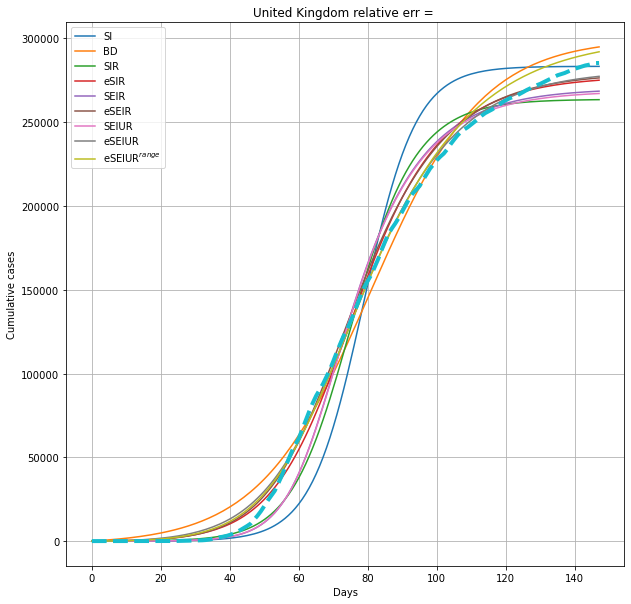

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


United States not S-curve
Uruguay not S-curve
Uzbekistan not S-curve
Vanuatu less then 1m
Vatican less then 1m
Venezuela not S-curve
Vietnam not S-curve
World not S-curve
Yemen not S-curve
Zambia not S-curve
Zimbabwe
minStart 28
Parameters
[0.05166291 0.         0.         0.00057165]
[5.01721742e-02 1.26453462e-05 0.00000000e+00 5.72326985e-04]
[0.11851725 0.07657321 0.         0.         0.00109233]
[2.00054323e-01 1.65823196e-01 5.95474219e-06 0.00000000e+00
 2.10214996e-03]
[0.09657544 0.07368579 0.07166171 0.08367407 0.         0.
 0.0007072 ]
[0.01462847 0.17281595 0.07638203 0.0761061  0.00017416 0.
 0.00063688]
[9.23076838e-02 2.31174057e+00 1.08651718e-01 1.25836166e-01
 0.00000000e+00 0.00000000e+00 1.00000000e+00 9.03600789e-04
 4.69804350e-02]
[3.50685387e-02 5.39925515e-01 1.39895104e-01 1.41533935e-01
 9.13897197e-06 0.00000000e+00 1.00000000e+00 8.55070550e-04
 3.81918738e-01]
[2.39578509e-01 3.50369912e+00 2.16044515e-01 3.87103669e-02
 1.63062552e-05 0.00000000e+00 1.0

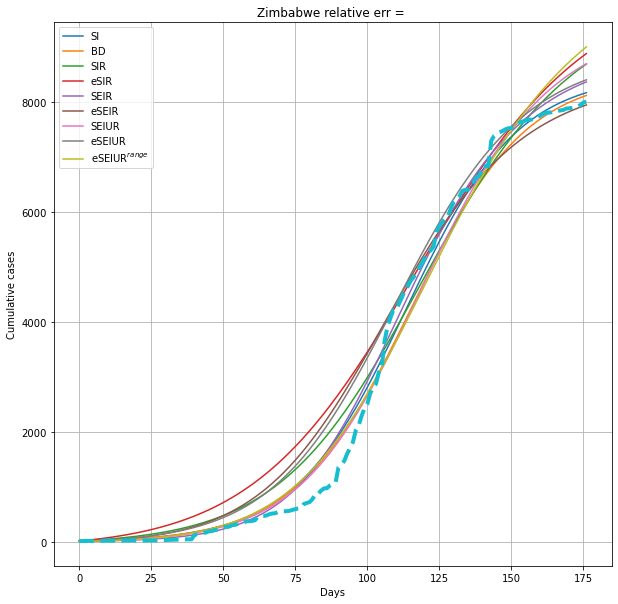

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Country	SI	BD	SIR	SIR$_{\theta}$	SEIR	SEIR$_{\theta}$	SEIUR	SEIUR$_{\theta}$	SEIUR$_{\theta}^{range}$	
Afghanistan	0.176%	0.031%	0.014%	1.134%	0.020%	0.022%	0.033%	0.407%	0.055%	
Armenia	0.509%	0.041%	0.010%	0.090%	0.118%	0.015%	0.146%	0.045%	0.023%	
Australia	1.576%	1.844%	2.179%	4.005%	1.611%	2.225%	1.661%	5.687%	1.218%	
Austria	1.131%	0.461%	0.071%	0.045%	0.011%	0.011%	0.011%	0.013%	0.014%	
Azerbaijan	0.577%	0.218%	0.072%	0.142%	0.119%	0.107%	0.169%	0.153%	0.243%	
Belarus	1.276%	0.107%	0.385%	0.024%	0.436%	0.017%	0.449%	0.031%	0.023%	
Belgium	1.405%	0.162%	0.535%	0.033%	0.214%	0.016%	0.214%	0.031%	0.020%	
Bolivia	0.672%	0.011%	0.166%	0.377%	0.299%	0.004%	0.329%	0.028%	0.071%	
Burkina Faso	1.356%	0.072%	5.286%	0.041%	0.620%	0.053%	6.451%	0.054%	0.076%	
Cambodia	7.262%	4.468%	4.486%	2.796%	4.792%	3.622%	4.851%	3.517%	5.271%	
Cameroon	1.016%	0.102%	0.317%	0.536%	0.559%	0.158%	0.604%	0.146%	0.078%	
Canada	2.865%	0.360%	0.805%	0.169%	0.651%	0.028%	0.653%	0.034%	0.016%	
Chile	2.508%	0.522

In [291]:
names1 = [
    "owidFITERR_SI_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITERR_SIG_RMSE_CUT19_TRAINTEST8.txt",    
    "owidFITERR_SIR_RMSE_CUT19_TRAINTEST11_1.txt",
    "owidFITERR_SIRG_RMSE_CUT19_TRAINTEST11_10.txt",   
    "owidFITERR_SEIR_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITERR_SEIRG_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITERR_TSEIAR_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITERR_TSEIARG_RMSE_CUT19_TRAINTEST10range_1.txt",]

names2 = [
    "owidFITPRS_SI_RMSE_CUT19_TRAINTEST8_1.txt",    
    "owidFITPRS_SIG_RMSE_CUT19_TRAINTEST8_1.txt",    
    "owidFITPRS_SIR_RMSE_CUT19_TRAINTEST11_1.txt",
    "owidFITPRS_SIRG_RMSE_CUT19_TRAINTEST11_10.txt",
    "owidFITPRS_SEIR_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITPRS_SEIRG_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITPRS_TSEIAR_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST10_1.txt",
    "owidFITPRS_TSEIARG_RMSE_CUT19_TRAINTEST10range_1.txt",]

nmod = 9
NWins = np.zeros(nmod)
FITPRS = []
FITERR = []
for i in range(len(names1)):    
    FITERR.append(np.loadtxt(names1[i]))
    FITPRS.append(np.loadtxt(names2[i]))    

for ijk in range(nmod):
    for i in range(FITERR[ijk].shape[0]):
        if(math.isnan(FITERR[ijk][i]) or math.isinf(FITERR[ijk][i])):
            FITERR[ijk][i] = 0 
    print("Error "+str(ijk)+" mean",np.mean(FITERR[ijk]),"median",np.median(FITERR[ijk]),"std",np.std(FITERR[ijk]))

modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"]
templine = "Country\t"
for i in range(nmod):
    templine += modelsnames[i] + "\t"
templine += "\n"

allerr = []
    
winnum = np.zeros((len(NamesList),nmod))
for i in range(len(NamesList)):
#for i in range(1):
    if(PopulationSizes[i] < 1000000):
        print(NamesList2[i] + " less then 1m")
        continue
    if(CType[i] != 0):
        print(NamesList2[i] + " not S-curve")
        continue
    print(NamesList2[i])
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)    
    Cases1 = Cases1[:int(newNCases[i])]       
    Gap = 150
    minStart = 0
    totalI = 0
            
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for j in range(1,Cases1.shape[0]):
        smcs1[j] = smcs1[j-1]*0.6+Cases1[j]*0.4
    for j in range(Cases1.shape[0]):
        #print(j)
        if(j>0):
            if(smcs1[j] - smcs1[j-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = j
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    
    minStart = int(minStart)
    minStart = int(StartArr[i])
    print("minStart",minStart)        
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)     
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
    tempys = []
    
    tempys.append(getTotalInfCurveTSI(FITPRS[0][i][0],
                                FITPRS[0][i][1],
                                Cases1[minStart:].shape[0],
                                FITPRS[0][i][3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[0][i][2]))    
    tempys.append(getTotalInfCurveTSI(FITPRS[1][i][0],
                                FITPRS[1][i][1],
                                Cases1[minStart:].shape[0],
                                FITPRS[1][i][3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[1][i][2]))    
    tempys.append(getTotalInfCurveTSIR(FITPRS[2][i][0],
                                FITPRS[2][i][1],
                                FITPRS[2][i][2],
                                Cases1[minStart:].shape[0],
                                FITPRS[2][i][4]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[2][i][3]))
    tempys.append(getTotalInfCurveTSIR(FITPRS[3][i][0],
                                FITPRS[3][i][1],
                                FITPRS[3][i][2],
                                Cases1[minStart:].shape[0],
                                FITPRS[3][i][4]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[3][i][3]))    
    tempys.append(getTotalInfCurveTSEIR(FITPRS[4][i][0],
                                FITPRS[4][i][1],
                                FITPRS[4][i][2],
                                FITPRS[4][i][3],
                                FITPRS[4][i][4],
                                Cases1[minStart:].shape[0],
                                FITPRS[4][i][6]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[4][i][5]))
    tempys.append(getTotalInfCurveTSEIR(FITPRS[5][i][0],
                                FITPRS[5][i][1],
                                FITPRS[5][i][2],
                                FITPRS[5][i][3],
                                FITPRS[5][i][4],
                                Cases1[minStart:].shape[0],
                                FITPRS[5][i][6]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[5][i][5]))
    tempys.append(getTotalInfCurveTSEIAR(FITPRS[6][i][0],
                                FITPRS[6][i][1],
                                FITPRS[6][i][2],
                                FITPRS[6][i][3],
                                FITPRS[6][i][4],
                                Cases1[minStart:].shape[0],
                                FITPRS[6][i][6]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[6][i][5],
                                FITPRS[6][i][7],
                                FITPRS[6][i][8])) 
    tempys.append(getTotalInfCurveTSEIAR(FITPRS[7][i][0],
                                FITPRS[7][i][1],
                                FITPRS[7][i][2],
                                FITPRS[7][i][3],
                                FITPRS[7][i][4],
                                Cases1[minStart:].shape[0],
                                FITPRS[7][i][6]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[7][i][5],
                                FITPRS[7][i][7],
                                FITPRS[7][i][8])) 
    tempys.append(getTotalInfCurveTSEIAR(FITPRS[8][i][0],
                                FITPRS[8][i][1],
                                FITPRS[8][i][2],
                                FITPRS[8][i][3],
                                FITPRS[8][i][4],
                                Cases1[minStart:].shape[0],
                                FITPRS[8][i][6]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[8][i][5],
                                FITPRS[8][i][7],
                                FITPRS[8][i][8])) 
    
#    print(PopulationSizes[i]*0.01)
#    print(tempys[6])
    print("Parameters")
    for j in range(9):
        print(FITPRS[j][i][:])
    
    
    #print("Parameters") #,FITPRS[4][i]
    #print("Parameters",FITPRS[1][i])

    for ijk in range(nmod):
        for k in range(tempys[ijk].shape[0]):
            #print(np.abs(tempys[ijk][k]))
            if(math.isnan(tempys[ijk][k]) or math.isinf(tempys[ijk][k]) or np.abs(tempys[ijk][k]) > np.max(Cases1[minStart:]*3)):
                tempys[ijk][i] = 0    
    print("ERRORS")
    errs = np.zeros(nmod)   
    allerr.append(errs)
    for ijk in range(nmod):
        #errs[ijk] = RMSE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
        errs[ijk] = RE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
    print(errs)
    print(np.argmin(errs))
    winnum[i,np.argmin(errs)] = 1
    fig = plt.figure(figsize=(10, 10))
    plt.title(NamesList2[i]+" relative err = ")#+str(er2))
    #for ijk in range(nmod):
    #    plt.plot(tempx,tempys[ijk])    
    plt.plot(tempx,tempys[0])    
    plt.plot(tempx,tempys[1])       
    plt.plot(tempx,tempys[2])    
    plt.plot(tempx,tempys[3])   
    plt.plot(tempx,tempys[4])       
    plt.plot(tempx,tempys[5])   
    plt.plot(tempx,tempys[6])   
    plt.plot(tempx,tempys[7])   
    plt.plot(tempx,tempys[8])   
    plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')   
    
    modelsnames = ["SI",
               "BD",#+r"$_{FT}$",
               "SIR",#+r"$_{FT}$",
               "eSIR",
               "SEIR",#+r"$_{400}$",
               "eSEIR",#+r"$_{FT}$",
               "SEIUR",#+r"$_{600}$",
               "eSEIUR",#+r"$_{FT}$",
               "eSEIUR"+r"$^{range}$"]
    
    #plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","SEIUR"+r"$_{\theta}^{range}$","Data"))
    plt.legend(modelsnames)
    plt.grid(True)
    plt.xlabel("Days")
    plt.ylabel("Cumulative cases")
    plt.show()    
    
    fig.savefig("All_modes_graph_new_"+NamesList2[i]+".eps")
    fig.savefig("All_modes_graph_new_"+NamesList2[i]+".png") 
    fig.savefig("All_modes_graph_new_"+NamesList2[i]+".svg") 
    

    NWins[np.argmax(winnum[i])] += 1
    
    templine += NamesList2[i]+"\t"
    for i in range(nmod):
        templine += "{:.3f}".format(errs[i]*100) + "%\t"
    templine += "\n"
        
print(templine)
        
for ijk in range(nmod):
    print(modelsnames[ijk],NWins[ijk])    
winindex = np.zeros(winnum.shape[0])
for i in range(winnum.shape[0]):
    if(PopulationSizes[i] < 1000000):
        #print(NamesList2[i] + " less then 1m")
        continue
    if(CType[i] != 0):
        #print(NamesList2[i] + " not S-curve")
        continue
    winindex[i] = np.argmax(winnum[i])
    print(NamesList2[i],"\t", modelsnames[np.argmax(winnum[i])], winindex[i])

In [27]:
allerr = np.array(allerr)
allerr[:,0].shape

(61,)

In [29]:
print(allerr.shape)

(61, 8)


In [54]:
np.linspace(0,214,215).shape

def tseir(y,t,alpha,betta,sigma,gamma,thetta,N,pop,omega):
    Ti= y[0]
    Si= y[1]
    Ei= y[2]
    Ii= y[3]
    Ri= y[4]
    SIi=y[5]
    Ni= y[6]
    
    f0=-Ti*omega
    f1=-betta*Ii*Si/Ni-alpha*Si*Ei/Ni - thetta*Si + Ti*omega        #dS/dt=-betta*I*S 
    f2= betta*Ii*Si/Ni+alpha*Si*Ei/Ni + thetta*Si - sigma*Ei        #dE/dt=betta*I*S-sigma*E
    f3=-gamma*Ii+sigma*Ei                                           #dI/dt=sigma*E-gamma*I
    f4= gamma*Ii                                                    #dR/dt=gamma*I
    f5=+sigma*Ei
    f6= Ti*omega 

left = [0,0,1/14.0,1/14.0,0,0,0]
right = [0,4,1/3.0,1/3.0,0,0,0.1]

(215,)

In [292]:
Rvals = np.zeros(len(NamesList))
RvalsSEIR = np.zeros(len(NamesList))
Rnonzero = []
RnonzeroSEIR = []
for i in range(len(NamesList)):
    if(PopulationSizes[i] < 1000000):
        #print(NamesList2[i] + " less then 1m")
        continue
    if(CType[i] != 0):
        #print(NamesList2[i] + " not S-curve")
        continue
    Rvals[i] = FITPRS[2][i,0]/FITPRS[2][i,1]
    #RvalsSEIR[i] = FITPRS[4][i,1]/(FITPRS[4][i,3])
    RvalsSEIR[i] = FITPRS[3][i,0]/(FITPRS[3][i,1])
    #print(NamesList2[i],FITPRS[2][i,0],FITPRS[2][i,1],Rvals[i],RvalsSEIR[i])
    #print(NamesList2[i],FITPRS[3][i,0],FITPRS[3][i,1],Rvals[i],RvalsSEIR[i])
    print(Rvals[i],RvalsSEIR[i])
    Rnonzero.append(Rvals[i])
    RnonzeroSEIR.append(RvalsSEIR[i])

1.4585458909464861 1.6558758711563821
1.1715286044247037 1.2498879449005098
2.404024862032408 1.8836754268767337
1.759095754239759 2.1652137281064223
1.2284409706785968 1.2624139088456225
1.279636771868531 1.3775201904702257
1.5353743534311166 1.859915627273157
1.1719566114948168 1.4578593312597123
3.6216309886177065 0.8583072383233951
0.8338468714164323 0.60829423169205
1.183129151924645 1.1436176912925353
1.3715345299066497 1.7900421946262481
2.2872805683613793 1.2353572330038454
1.2582730334003525 1.3773395266364987
1.1519542389993966 1.3088550089163509
1.4115791815804986 1.7969855699888744
1.3049044085636863 1.177556378315183
1.5719825669727105 1.7605823929301077
1.353381183635541 1.2800512724431767
1.471470632690374 1.7437411248505619
1.1917181080264048 1.2099541114730803
1.4847346564410038 1.4595093989449728
1.355742479887119 1.2702308637781898
1.504941160770531 2.317010749172495
2.324482494574794 1.8869452290060806
1.3149781575069652 1.5899570264320537
2.0299437977278574 1.25710

In [4]:
plt.scatter(np.linspace(0,len(Rnonzero)-1,len(Rnonzero)),Rnonzero)
plt.show()
print(np.mean(Rnonzero))
avgbeta = np.mean(FITPRS[2][:,0])
avggamma = np.mean(FITPRS[2][:,1])
print(avgbeta,avggamma)
print(avgbeta/avggamma)

NameError: name 'plt' is not defined

In [3]:
plt.scatter(np.linspace(0,len(RnonzeroSEIR)-1,len(RnonzeroSEIR)),RnonzeroSEIR)
plt.show()
print(np.mean(RnonzeroSEIR))
avgbeta = np.mean(FITPRS[4][:,1])
avggamma = np.mean(FITPRS[4][:,3])
print(avgbeta,avggamma)
print(avgbeta/avggamma)

NameError: name 'plt' is not defined

In [2]:
v1 = 2
v2 = 8

PRS = np.loadtxt("owidFITPRS_TSEIARG_RMSE_CUT14_TRAINTEST.txt")
#PRS.shape
plt.scatter(PRS[:,v1],PRS[:,v2],color="red")
PRS = np.loadtxt("owidFITPRS_TSEIARG_RMSE_CUT15_TRAINTEST.txt")
#PRS.shape
plt.scatter(PRS[:,v1],PRS[:,v2],color="blue")
PRS = np.loadtxt("owidFITPRS_TSEIARG_RMSE_CUT16_TRAINTEST.txt")
#PRS.shape
plt.scatter(PRS[:,v1],PRS[:,v2],color="yellow")
PRS = np.loadtxt("owidFITPRS_TSEIARG_RMSE_CUT17_TRAINTEST.txt")
#PRS.shape
plt.scatter(PRS[:,v1],PRS[:,v2],color="green")

NameError: name 'np' is not defined

In [1]:
names1 = [
    "owidFITERR_SI_RMSE_CUT19_TRAINTEST7.txt",
"owidFITERR_SIG_RMSE_CUT19_TRAINTEST7.txt",
"owidFITERR_SIR_RMSE_CUT19_TRAINTEST7.txt"]

names2 = [
    "owidFITPRS_SI_RMSE_CUT19_TRAINTEST7.txt",
"owidFITPRS_SIG_RMSE_CUT19_TRAINTEST7.txt",
"owidFITPRS_SIR_RMSE_CUT19_TRAINTEST7.txt"]

nmod = 3
NWins = np.zeros(nmod)
FITPRS = []
FITERR = []
for i in range(len(names1)):    
    FITERR.append(np.loadtxt(names1[i]))
    FITPRS.append(np.loadtxt(names2[i]))    

print(len(FITPRS[0]))
    
for ijk in range(nmod):
    for i in range(FITERR[ijk].shape[0]):
        if(math.isnan(FITERR[ijk][i]) or math.isinf(FITERR[ijk][i])):
            FITERR[ijk][i] = 0 
    print("Error "+str(ijk)+" mean",np.mean(FITERR[ijk]),"median",np.median(FITERR[ijk]),"std",np.std(FITERR[ijk]))

modelsnames = ["SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"]
templine = "Country\t"
for i in range(nmod):
    templine += modelsnames[i] + "\t"
templine += "\n"

allerr = np.zeros((len(NamesList),nmod))
    
winnum = np.zeros((len(NamesList),nmod))
count_counter = 0
for i in range(len(NamesList)):
#for i in range(1):
    #if(PopulationSizes[i] < 1000000):
    #    print(NamesList2[i] + " less then 1m")
    #    continue
    #if(CType[i] != 0):
    #    print(NamesList2[i] + " not S-curve")
    #    continue
        
    SI_num = 0
        
    use = 0
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                use = 1
                SI_num = j
                break
    if(use == 0):
        continue    
        
    print(NamesList2[i],newNCases[i])
    Df1 = Data[Data.iloc[:,0] == NamesList[i]].total_cases
    Df1 = Df1.fillna(0)
    Cases1 = np.array(Df1)    
    Cases1 = Cases1[:int(newNCases[i])]       
    Gap = 150
    minStart = 0
    totalI = 0
            
    ndays = 3
    memdays = np.zeros(ndays)
    counter = 0
    smcs1 = np.zeros(Cases1.shape[0])
    for j in range(1,Cases1.shape[0]):
        smcs1[j] = smcs1[j-1]*0.6+Cases1[j]*0.4
    for j in range(Cases1.shape[0]):
        #print(j)
        if(j>0):
            if(smcs1[j] - smcs1[j-1] > 0.5):
                memdays[counter] = 1
            else:
                memdays[counter] = 0
            counter+= 1
            counter = counter%ndays
        
        if(sum(memdays) == ndays):
            minStart = j
            break
        
            #totalI = Cases1[i]
            #if(totalI > 5):            
            #if(Cases1.shape[0]-minStart-10 < Gap):
            #    minStart = Cases1.shape[0]-Gap
            #break
    
    minStart = int(minStart)
    
    if(use_SI_ISO):
        for j in range(SI_iso.shape[0]):
            if(SI_iso[j] == NamesList[i]):
                minStart = SI_start[j]-1
    
    print(i,"minStart",minStart,Cases1[minStart])        
    totalLen = Cases1.shape[0] - minStart
    #TrainSize = int(totalLen*0.75)     
    tempx = np.linspace(0,Cases1[minStart:].shape[0]-1,Cases1[minStart:].shape[0])
    tempys = []
    
    #for j in range(SI_iso.shape[0]):
    #    if(SI_iso[j] == NamesList[i]):
    #        FITPRS[0][i][0] = Data_SI_A.infectionCoef_out.values[j]
    #        FITPRS[0][i][3] = Data_SI_A.percentOfSusceptible_out.values[j]
    
    tempys.append(getTotalInfCurveTSI(FITPRS[0][count_counter][0],
                                FITPRS[0][count_counter][1],
                                Cases1[minStart:].shape[0],
                                FITPRS[0][count_counter][3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[0][count_counter][2]))    
    tempys.append(getTotalInfCurveTSI(FITPRS[1][count_counter][0],
                                FITPRS[1][count_counter][1],
                                Cases1[minStart:].shape[0],
                                FITPRS[1][count_counter][3]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[1][count_counter][2]))    
    tempys.append(getTotalInfCurveTSIR(FITPRS[2][count_counter][0],
                                FITPRS[2][count_counter][1],
                                FITPRS[2][count_counter][2],
                                Cases1[minStart:].shape[0],
                                FITPRS[2][count_counter][4]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                FITPRS[2][count_counter][3]))
    
    tempys2 = []    
    
    print(SI_num,SI_par1[SI_num],SI_par2[SI_num],SI_par3[SI_num])
    tempys2.append(getTotalInfCurveTSI(SI_par1[SI_num],
                                SI_par2[SI_num],
                                Cases1[minStart:].shape[0],
                                SI_par3[SI_num]*PopulationSizes[i],
                                Cases1[minStart],
                                PopulationSizes[i],
                                0)) 
    
#    print(PopulationSizes[i]*0.01)
#    print(tempys[6])
    
    print("Parameters",FITPRS[1][count_counter])
    #print("Parameters",FITPRS[1][i])

    for ijk in range(nmod):
        for k in range(tempys[ijk].shape[0]):
            #print(np.abs(tempys[ijk][k]))
            if(math.isnan(tempys[ijk][k]) or math.isinf(tempys[ijk][k]) or np.abs(tempys[ijk][k]) > np.max(Cases1[minStart:]*3)):
                tempys[ijk][k] = 0    
    print("ERRORS")
    print(Cases1[minStart:].shape)
    errs = np.zeros(nmod)       
    for ijk in range(nmod):
        #errs[ijk] = RMSE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
        errs[ijk] = RE(Cases1[minStart:],tempys[ijk][:])    #+TrainSize
    print(errs)
    allerr[i]=errs
    err_SI_ = RE(Cases1[minStart:],tempys2[0][:])    #+TrainSize
    print(np.argmin(errs),"_SI_",err_SI_)
    winnum[i,np.argmin(errs)] = 1
    fig = plt.figure(figsize=(10, 10))
    plt.title(NamesList2[i]+" relative err = "+str(errs[0]))
    #for ijk in range(nmod):
    #    plt.plot(tempx,tempys[ijk])    
    #plt.plot(tempx,tempys[0])    
    #plt.plot(tempx,tempys[2])    
    #plt.plot(tempx,tempys[4])   
    #plt.plot(tempx,tempys[0])   
    plt.plot(tempx,tempys[1]) 
    plt.plot(tempx,tempys2[0]) 
    #plt.plot(tempx,tempys[2]) 
 
    #plt.plot(tempx,tempys[8])   
    plt.plot(tempx,Cases1[minStart:],lw=4, linestyle='--')   
    plt.legend(("SI","BD","SIR","SIR"+r"$_{\theta}$","SEIR","SEIR"+r"$_{\theta}$","SEIUR","SEIUR"+r"$_{\theta}$","Data"))
    plt.grid(True)
    plt.show()    

    NWins[np.argmax(winnum[i])] += 1
    
    templine += NamesList2[i]+"\t"
    for i in range(nmod):
        templine += "{:.3f}".format(errs[i]*100) + "%\t"
    templine += "\n"
    
    count_counter += 1
        
print(templine)
        
for ijk in range(nmod):
    print(modelsnames[ijk],NWins[ijk])    
winindex = np.zeros(winnum.shape[0])
#for i in range(winnum.shape[0]):
#    if(PopulationSizes[i] < 1000000):
#        #print(NamesList2[i] + " less then 1m")
#        continue
#    if(CType[i] != 0):
#        #print(NamesList2[i] + " not S-curve")
#        continue
#    winindex[i] = np.argmax(winnum[i])
#    print(NamesList2[i],"\t", modelsnames[np.argmax(winnum[i])], winindex[i])

NameError: name 'np' is not defined

In [36]:
allerr

array([[1.73550013e-03, 1.13715228e-03, 1.41052676e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [4.07161612e-04, 4.08547127e-04, 4.07183704e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.09086123e-03, 2.27664438e-03, 1.21973985e-03],
       [3.41137724e-03, 9.39918113e-04, 7.56057108e-04],
       [3.01630441e-03, 1.17819158e-03, 7.58315273e-04],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000

In [58]:
counter = 0
dif = np.zeros(86)
for i in range(len(NamesList)):
    #if(PopulationSizes[i] < 1000000):
    #    #print(NamesList2[i] + " less then 1m")
    #    continue
    #if(CType[i] != 0):
    #    #print(NamesList2[i] + " not S-curve")
    #    continue
    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):
            dif[counter] = allerr[i,0]-SI_err[j]
            counter+=1
            print(counter,NamesList2[i],SI_iso[j],allerr[i,0],SI_err[j],allerr[i,0]-SI_err[j])
            
            #print(FITPRS[0][i],Data_SI_A.infectionCoef_out.values[j],Data_SI_A.percentOfSusceptible_out.values[j])            

1 Afghanistan AFG 0.001735500128684719 0.0016991054219182386 3.639470676648033e-05
2 Armenia ARM 0.00040716161183413914 0.00045991599000119927 -5.275437816706013e-05
3 Australia AUS 0.0010908612341775873 0.001440123516869398 -0.00034926228269181064
4 Austria AUT 0.0034113772400086832 0.00319328676181519 0.00021809047819349326
5 Azerbaijan AZE 0.0030163044133594517 0.0034077719848457956 -0.00039146757148634387
6 Belarus BLR 0.010674059805551079 0.01045513449428961 0.000218925311261468
7 Belgium BEL 0.0124153017557612 0.015477209423642037 -0.0030619076678808366
8 Bolivia BOL 0.003118711275277785 0.003297472161885794 -0.00017876088660800883
9 Cameroon CMR 0.01499087931969957 0.014711814909301173 0.00027906441039839656
10 Canada CAN 0.015334018532936653 0.015448755433152026 -0.00011473690021537343
11 Central African Republic CAF 0.0023288482452915355 0.002046954496575819 0.00028189374871571667
12 Chad TCD 0.0013537372117175103 0.0016063766975212305 -0.0002526394858037202
13 China CHN 0.003

In [67]:
print(max(np.abs(dif)))
counter = 0
for i in range(86):
    #print(dif[i])
    if(dif[i] > 0):
        counter+=1
print(counter)

0.0
0


In [66]:
counter = 0
dif = np.zeros(86)
for i in range(len(NamesList)):
    #if(PopulationSizes[i] < 1000000):
    #    #print(NamesList2[i] + " less then 1m")
    #    continue
    #if(CType[i] != 0):
    #    #print(NamesList2[i] + " not S-curve")
    #    continue
    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):
            #dif[counter] = allerr[i,0]-SI_err[j]
            
            print(counter+1,NamesList2[i],SI_iso[j],FITPRS[0][counter][0],FITPRS[0][counter][3],SI_par1[j],SI_par2[j])
            counter+=1
            #print(FITPRS[0][i],Data_SI_A.infectionCoef_out.values[j],Data_SI_A.percentOfSusceptible_out.values[j])            

1 Afghanistan AFG 0.09450829959641266 0.0009357735789561403 0.06190456680093159 0.00029885037916110684
2 Armenia ARM 0.04921664030021035 0.015260137759432876 0.03232572321152122 0.0009839217840640554
3 Australia AUS 0.19232735793449615 0.00026387817659964056 0.1738525390625 0.0001733398437500002
4 Austria AUT 0.2687923712861859 0.0016155720875284107 0.1695123314590775 0.0017989309154282478
5 Azerbaijan AZE 0.06793653550809091 0.003448977517833873 0.05919322484058728 6.357090334880352e-05
6 Belarus BLR 0.11596509210001293 0.006743290180498403 0.06005711433345082 0.0015747177103084837
7 Belgium BEL 0.2190116367932662 0.004657174871769913 0.10482123526815434 0.001210883544095924
8 Bolivia BOL 0.06030131491924801 0.011849026270996177 0.03759648438786049 0.0004141403627471278
9 Cameroon CMR 0.0983806546946636 0.0006989080651307757 0.04119424174087552 0.0005179492900932066
10 Canada CAN 0.14537682354450718 0.0025247042015658677 0.06092147658583662 0.0020923526226066524
11 Central African Rep

In [119]:
counter = 0
dif = np.zeros(86)
for i in range(len(NamesList)):
    #if(PopulationSizes[i] < 1000000):
    #    #print(NamesList2[i] + " less then 1m")
    #    continue
    #if(CType[i] != 0):
    #    #print(NamesList2[i] + " not S-curve")
    #    continue
    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):
            dif[counter] = allerr[i,1]-SI_err[j]
            counter+=1
            print(counter,NamesList2[i],SI_iso[j],allerr[i,1],SI_err[j],allerr[i,1]-SI_err[j])
            
            #print(FITPRS[0][i],Data_SI_A.infectionCoef_out.values[j],Data_SI_A.percentOfSusceptible_out.values[j])            

1 Afghanistan AFG 0.00046631356811712506 0.002318388893242726 -0.001852075325125601
2 Armenia ARM 0.00042104774296355615 0.00048363343198379056 -6.258568902023441e-05
3 Australia AUS 0.00402542392417562 0.003228849158963559 0.0007965747652120608
4 Austria AUT 0.001527143766544262 0.00126580457673325 0.00026133918981101193
5 Azerbaijan AZE 0.0008106746649655448 0.00398651595832903 -0.0031758412933634854
6 Belarus BLR 0.0004481068138613798 0.0003253339320275514 0.0001227728818338284
7 Belgium BEL 0.0011657066757570507 0.0009189479131783914 0.0002467587625786592
8 Bolivia BOL 7.346606183629575e-05 0.0002862296140837366 -0.00021276355224744085
9 Cameroon CMR 0.0011249530958458128 0.001575430302429475 -0.0004504772065836622
10 Canada CAN 0.0009157720141196259 0.0007401804117149522 0.00017559160240467368
11 Central African Republic CAF 0.0011445640151806883 0.0014563379349528905 -0.0003117739197722022
12 Chad TCD 0.0021453450477894433 0.035656064940925075 -0.03351071989313563
13 China CHN 0.

In [116]:
print(min(np.abs(dif)))
counter = 0
for i in range(86):
    #print(dif[i])
    if(dif[i] > 0):
        counter+=1
print(counter)

5.91361245784824e-06
37


In [118]:
counter = 0
dif = np.zeros(86)
for i in range(len(NamesList)):
    #if(PopulationSizes[i] < 1000000):
    #    #print(NamesList2[i] + " less then 1m")
    #    continue
    #if(CType[i] != 0):
    #    #print(NamesList2[i] + " not S-curve")
    #    continue
    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):
            #dif[counter] = allerr[i,0]-SI_err[j]
            
            print(counter+1,NamesList2[i],SI_iso[j],FITPRS[1][counter][0],FITPRS[1][counter][1],FITPRS[1][counter][3],SI_par1[j],SI_par2[j],SI_par3[j])
            counter+=1
            #print(FITPRS[0][i],Data_SI_A.infectionCoef_out.values[j],Data_SI_A.percentOfSusceptible_out.values[j])            

1 Afghanistan AFG 0.07016371428028659 0.0001838895229974918 0.0009551592614980006 0.055261800398279826 0.0004638335756329778 0.001009497058211648
2 Armenia ARM 0.04918053078618131 4.371349516930721e-08 0.015256246564520343 0.04860896806901112 4.6573301579703325e-06 0.015455467642649733
3 Australia AUS 0.15736818375608064 0.0005033947875739049 0.00027408758761764346 0.16424926779770443 0.00034601227277768556 0.00027365943672111364
4 Austria AUT 0.17766752814963765 0.0017629701824113228 0.0016900939132187536 0.16530191655222237 0.0019440491628561155 0.0017051189284680072
5 Azerbaijan AZE 0.054179332160046244 0.00010136167962984847 0.003824633210236972 0.03564805302352919 0.0003394702584439673 0.005364001867354176
6 Belarus BLR 0.05564670325281676 0.0019725617801057203 0.007285974994390499 0.0580364103822958 0.001710345376448024 0.007262995299735312
7 Belgium BEL 0.0965771607046509 0.0016790316419498987 0.004991231523071109 0.09431393678775413 0.0016126989940691318 0.005036701850476993
8 

In [122]:
print(np.median(SI_par1))
print(np.median(SI_par2))
print(np.median(SI_par3))

0.0583789710643366
0.0010696989966736768
0.0012339884795029383


In [134]:
counter=0
print("ISO beta pop err")
for i in range(len(NamesList)):    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):            
            print(SI_iso[j],FITPRS[0][counter][0],FITPRS[0][counter][3],allerr[i,0])
            counter+=1

ISO beta pop err
AFG 0.09454200357935032 0.0009348070657568537 0.0017047816739711214
ARM 0.04922290692257597 0.015255624306048909 0.0004217362654183355
AUS 0.1924111657236756 0.00026374091060230807 0.002636100643875998
AUT 0.2691566703650931 0.0016108131386114207 0.003363248980548187
AZE 0.06796876585783129 0.0034423392453191196 0.004774647611525431
BLR 0.1160723277176455 0.006732300857382459 0.0105389525784711
BEL 0.21926175634194298 0.004645775115860674 0.0271625281714543
BOL 0.060317112997971135 0.011841618610886477 0.0033741029767988956
CMR 0.09844680047252555 0.0006977215652096434 0.014838095470281651
CAN 0.14561415314684126 0.0025171867315497117 0.015508020658504379
CAF 0.10913462431775507 0.000938917348928897 0.0024486430956977734
TCD 0.1202496073661827 5.406362006737601e-05 0.0024865427173037425
CHN 0.28608867463266296 5.503137193397992e-05 0.0032672625045266396
CRI 0.03541921142090341 0.03781240479343462 0.00729912054196884
CIV 0.0889160649539702 0.0007145618824175757 0.008886

In [135]:
counter=0
print("ISO q p pop err")
for i in range(len(NamesList)):    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):            
            print(SI_iso[j],FITPRS[1][counter][0],FITPRS[1][counter][1],FITPRS[1][counter][3],allerr[i,1])
            counter+=1

ISO q p pop err
AFG 0.07016371428028659 0.0001838895229974918 0.0009551592614980006 0.00046631356811712506
ARM 0.04918053078618131 4.371349516930721e-08 0.015256246564520343 0.00042104774296355615
AUS 0.15736818375608064 0.0005033947875739049 0.00027408758761764346 0.00402542392417562
AUT 0.17766752814963765 0.0017629701824113228 0.0016900939132187536 0.001527143766544262
AZE 0.054179332160046244 0.00010136167962984847 0.003824633210236972 0.0008106746649655448
BLR 0.05564670325281676 0.0019725617801057203 0.007285974994390499 0.0004481068138613798
BEL 0.0965771607046509 0.0016790316419498987 0.004991231523071109 0.0011657066757570507
BOL 0.04247874330116836 0.0002838160103882287 0.012334660264948522 7.346606183629575e-05
CMR 0.044478578340082696 0.0004132591798417984 0.0007564982525843896 0.0011249530958458128
CAN 0.05952542310045127 0.0023626101206623584 0.0028344519950310072 0.0009157720141196259
CAF 0.08726548777986531 0.0006546340527834299 0.0009557207458754369 0.00114456401518068

In [136]:
counter=0
print("ISO beta sigma pop err")
for i in range(len(NamesList)):    
    for j in range(SI_iso.shape[0]):
        if(SI_iso[j] == NamesList[i]):            
            print(SI_iso[j],FITPRS[2][counter][0],FITPRS[2][counter][1],FITPRS[2][counter][4],allerr[i,2])
            counter+=1

ISO beta sigma pop err
AFG 0.28392972892484036 0.20378974404688618 0.001906342761550008 0.0001402707863834106
ARM 0.04923043680993746 3.63409672333596e-07 0.015252768993839433 0.00042194085097352
AUS 0.19324039768399812 0.0008572962652999591 0.00026396744266879115 0.002679353603397523
AUT 0.9021912460049254 0.6907399230894802 0.0038707338766416155 0.0007918041439550466
AZE 0.2348259203349769 0.1824249581693289 0.009983382772581892 0.0034292864756960235
BLR 1.0656012496504887 0.9999867518314216 0.05823163680909768 0.0006950246475983668
BEL 1.17178897131538 0.9999920433803756 0.01707893886638753 0.02900356144733587
BOL 0.26431426233059657 0.2196092570409637 0.03882497767203086 0.0002686697722065163
CMR 1.0705372789081729 0.9997612398856528 0.0055886332130613905 0.006072997934334849
CAN 1.0950710404109305 0.9998410371879276 0.015613850125591877 0.0046013519202146875
CAF 0.25827957150372116 0.16876051184804952 0.0016684290808402441 0.0007194375473692225
TCD 0.11961972248095827 0.0002764526